# To-dos (13/11/23)

1. Remove fits to log, only use fit_short
2. Investigate the bad fits for the slices 
3. Confirm that the mcmc really does work for the entire fit
4. Plot the curve using [a, b, c, d] and play around with these values
5. Fix d = 0.5, and add "error parameters" for the temperature (eT + f) 
6. Run mcmc for this starting from e = 1, f = 0
7. Just use the entire series as your fit function

In [1]:
import emcee as mc #try markov chain monte carlo

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import data_analysis_script as da
import importlib as im
from scipy.optimize import curve_fit, minimize
import emcee as mc #try markov chain monte carlo

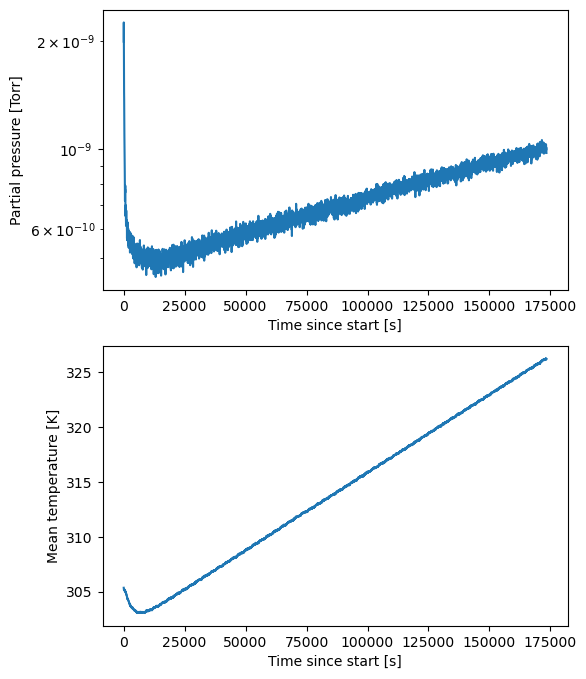

In [3]:
from data_analysis import Dataset
run_label = '2023-11-08' ## Change this to look at different runs
d = Dataset(run_label=run_label, gases=['O2'], data_path='20231108/')
d.GetData()
d.PlotSingleGas('O2')

In [4]:
time = np.array(d.data['O2']['Exposure_time'])
temp = np.array(d.data['O2']['Mean_temp']) #['Mean_temp'])
p = np.array(d.data['O2']['Partial_pressure'])

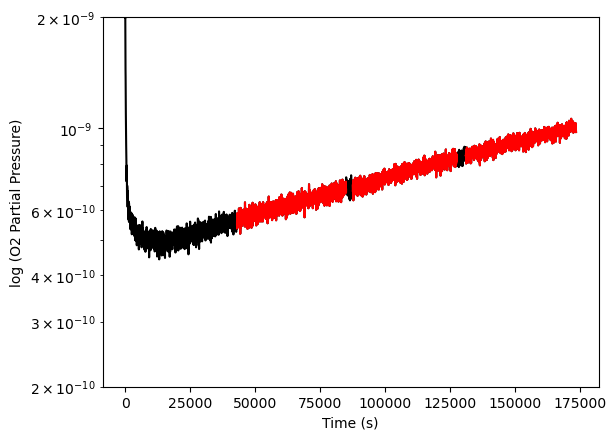

In [5]:
time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]

plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')

for ts in time_slices:
    gpts = (time > ts[0]) & (time < ts[1])
    plt.semilogy(time[gpts], p[gpts],'r')
plt.ylim(2e-10, 2e-9)
#plt.xlim(12e4, 14e4)
plt.show()

# MCMC

In [6]:
def combined_chisq_short(params, data_list, y):
    ds = Dataset("","","")
    ndsets = len(data_list)

    a, b, c, e, f = params[0], params[1], params[2], params[3], params[4]


    tot_chisq = 0
    sig = 0.5e-9 ## error on values
    e_err = 0.1
    f_err = 1
    

    for n in range(ndsets):
        cdat = data_list[n]
        cy = y[n]
        curr_chisq = np.sum(((d.fitfunction_short_temp_offset(cdat, a, b, c, e, f) - cy)/sig)**2) + ((e - 1)/(2*e_err))**2 + ((f - 0)/(2*f_err))**2
        if(not np.isnan(curr_chisq)):
            tot_chisq += curr_chisq
        else:
            tot_chisq += np.inf

    print(tot_chisq)
    return tot_chisq

time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]
tT = []
y = []
combined_data = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])

In [7]:
spars = np.array([5e-3, 6000, 0, 1, 0])
print(combined_chisq_short(spars, tT, y))
res = minimize(combined_chisq_short, spars, args=(tT, y), method='Nelder-Mead', options={"maxiter": 10000})

(2, 1365)
(2, 1302)
(2, 1380)
3733.545923554613
3733.545923554613
(2, 1365)
(2, 1302)
(2, 1380)
3733.545923554613
(2, 1365)
(2, 1302)
(2, 1380)
4692.192259926303
(2, 1365)
(2, 1302)
(2, 1380)
366.9999140382896
(2, 1365)
(2, 1302)
(2, 1380)
3733.545895037562
(2, 1365)
(2, 1302)
(2, 1380)
21926.8991410647
(2, 1365)
(2, 1302)
(2, 1380)
3733.682028495804
(2, 1365)
(2, 1302)
(2, 1380)
715.1002403100592
(2, 1365)
(2, 1302)
(2, 1380)
384.4879884773885
(2, 1365)
(2, 1302)
(2, 1380)
674.7783709960621
(2, 1365)
(2, 1302)
(2, 1380)
1729.3038086630952
(2, 1365)
(2, 1302)
(2, 1380)
3602.8817487878473
(2, 1365)
(2, 1302)
(2, 1380)
1952.6543567686467
(2, 1365)
(2, 1302)
(2, 1380)
600.8503145723214
(2, 1365)
(2, 1302)
(2, 1380)
1920.6851360019602
(2, 1365)
(2, 1302)
(2, 1380)
886.8968184511568
(2, 1365)
(2, 1302)
(2, 1380)
585.1010211945506
(2, 1365)
(2, 1302)
(2, 1380)
898.4454228828708
(2, 1365)
(2, 1302)
(2, 1380)
451.85064302993595
(2, 1365)
(2, 1302)
(2, 1380)
1129.9844310464214
(2, 1365)
(2, 130

123.12806121373782
(2, 1365)
(2, 1302)
(2, 1380)
121.98480951663736
(2, 1365)
(2, 1302)
(2, 1380)
123.37254003073639
(2, 1365)
(2, 1302)
(2, 1380)
123.4307598019779
(2, 1365)
(2, 1302)
(2, 1380)
122.37695386363873
(2, 1365)
(2, 1302)
(2, 1380)
120.53220293734964
(2, 1365)
(2, 1302)
(2, 1380)
119.48940190396965
(2, 1365)
(2, 1302)
(2, 1380)
122.99231856935702
(2, 1365)
(2, 1302)
(2, 1380)
121.44085140095231
(2, 1365)
(2, 1302)
(2, 1380)
120.19945414804022
(2, 1365)
(2, 1302)
(2, 1380)
122.27352572198862
(2, 1365)
(2, 1302)
(2, 1380)
121.16139413904335
(2, 1365)
(2, 1302)
(2, 1380)
119.69338854137915
(2, 1365)
(2, 1302)
(2, 1380)
119.87684875315034
(2, 1365)
(2, 1302)
(2, 1380)
120.33694892388533
(2, 1365)
(2, 1302)
(2, 1380)
118.3225354034503
(2, 1365)
(2, 1302)
(2, 1380)
117.6416078717767
(2, 1365)
(2, 1302)
(2, 1380)
119.93460322967448
(2, 1365)
(2, 1302)
(2, 1380)
117.73565921301369
(2, 1365)
(2, 1302)
(2, 1380)
120.34113369745543
(2, 1365)
(2, 1302)
(2, 1380)
118.90401216508701
(2, 

(2, 1380)
62.10124678496395
(2, 1365)
(2, 1302)
(2, 1380)
62.101675785703875
(2, 1365)
(2, 1302)
(2, 1380)
62.10122718882646
(2, 1365)
(2, 1302)
(2, 1380)
62.101370157714236
(2, 1365)
(2, 1302)
(2, 1380)
62.10125075436093
(2, 1365)
(2, 1302)
(2, 1380)
62.1013725621536
(2, 1365)
(2, 1302)
(2, 1380)
62.10123097676909
(2, 1365)
(2, 1302)
(2, 1380)
62.101272070073264
(2, 1365)
(2, 1302)
(2, 1380)
62.10122199778161
(2, 1365)
(2, 1302)
(2, 1380)
62.10124025875149
(2, 1365)
(2, 1302)
(2, 1380)
62.10129580996149
(2, 1365)
(2, 1302)
(2, 1380)
62.101213959865525
(2, 1365)
(2, 1302)
(2, 1380)
62.10124936564405
(2, 1365)
(2, 1302)
(2, 1380)
62.101217080894365
(2, 1365)
(2, 1302)
(2, 1380)
62.1012568191939
(2, 1365)
(2, 1302)
(2, 1380)
62.101213940084534
(2, 1365)
(2, 1302)
(2, 1380)
62.10125816090359
(2, 1365)
(2, 1302)
(2, 1380)
62.101210892199795
(2, 1365)
(2, 1302)
(2, 1380)
62.10122443600402
(2, 1365)
(2, 1302)
(2, 1380)
62.10121112340671
(2, 1365)
(2, 1302)
(2, 1380)
62.10123997019617
(2, 136

(2, 1365)
(2, 1302)
(2, 1380)
39.69603694932361
(2, 1365)
(2, 1302)
(2, 1380)
39.57390971582733
(2, 1365)
(2, 1302)
(2, 1380)
39.45119822301571
(2, 1365)
(2, 1302)
(2, 1380)
39.21926599708717
(2, 1365)
(2, 1302)
(2, 1380)
39.41629574993904
(2, 1365)
(2, 1302)
(2, 1380)
39.44753116785592
(2, 1365)
(2, 1302)
(2, 1380)
39.05531420870039
(2, 1365)
(2, 1302)
(2, 1380)
38.92071712846203
(2, 1365)
(2, 1302)
(2, 1380)
39.97195055818546
(2, 1365)
(2, 1302)
(2, 1380)
39.37728055024819
(2, 1365)
(2, 1302)
(2, 1380)
38.99882346989804
(2, 1365)
(2, 1302)
(2, 1380)
38.893729616398645
(2, 1365)
(2, 1302)
(2, 1380)
38.856483132197795
(2, 1365)
(2, 1302)
(2, 1380)
38.57722114783565
(2, 1365)
(2, 1302)
(2, 1380)
38.29602251408814
(2, 1365)
(2, 1302)
(2, 1380)
38.50771137842458
(2, 1365)
(2, 1302)
(2, 1380)
38.38853498438704
(2, 1365)
(2, 1302)
(2, 1380)
38.0881633033641
(2, 1365)
(2, 1302)
(2, 1380)
37.963009688536104
(2, 1365)
(2, 1302)
(2, 1380)
38.261055913439144
(2, 1365)
(2, 1302)
(2, 1380)
38.4806

16.191288510524302
(2, 1365)
(2, 1302)
(2, 1380)
16.066614066266997
(2, 1365)
(2, 1302)
(2, 1380)
16.014691302386893
(2, 1365)
(2, 1302)
(2, 1380)
16.043334774778344
(2, 1365)
(2, 1302)
(2, 1380)
16.26995476346092
(2, 1365)
(2, 1302)
(2, 1380)
16.043108888993434
(2, 1365)
(2, 1302)
(2, 1380)
15.993783001348266
(2, 1365)
(2, 1302)
(2, 1380)
16.02043848819402
(2, 1365)
(2, 1302)
(2, 1380)
16.102500160503933
(2, 1365)
(2, 1302)
(2, 1380)
16.021606771399952
(2, 1365)
(2, 1302)
(2, 1380)
15.976886107804827
(2, 1365)
(2, 1302)
(2, 1380)
15.972832986404153
(2, 1365)
(2, 1302)
(2, 1380)
16.049313191283918
(2, 1365)
(2, 1302)
(2, 1380)
16.00771586445851
(2, 1365)
(2, 1302)
(2, 1380)
15.953909230628408
(2, 1365)
(2, 1302)
(2, 1380)
15.957699585120135
(2, 1365)
(2, 1302)
(2, 1380)
16.006702240629895
(2, 1365)
(2, 1302)
(2, 1380)
15.949656635594149
(2, 1365)
(2, 1302)
(2, 1380)
15.963616205911517
(2, 1365)
(2, 1302)
(2, 1380)
15.928924427551284
(2, 1365)
(2, 1302)
(2, 1380)
15.93774953384152
(2, 1

In [8]:
print(res.x)

[ 2.45196504e+02  1.31438688e+04 -7.71635657e+01  9.99999434e-01
 -7.25386847e-03]


(2, 1365)
(2, 1302)
(2, 1380)


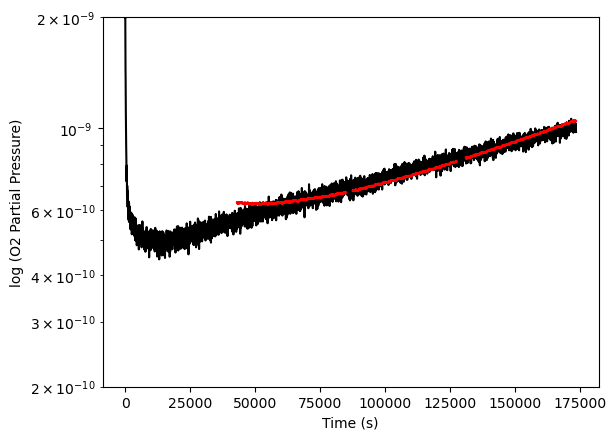

In [9]:
plt.figure()
plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
for i in range(len(combined_data)):
    plt.plot(combined_data[i][0], np.abs(d.fitfunction_short_temp_offset(tT[i], *res.x)), 'r')
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')

plt.ylim(2e-10, 2e-9)
plt.savefig('VESPELLIN_Chi')

plt.show()


In [10]:
print(res.x)

[ 2.45196504e+02  1.31438688e+04 -7.71635657e+01  9.99999434e-01
 -7.25386847e-03]


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)
(2, 1365)


(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)


(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)


(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)
(2, 1302)


(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)


(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)


(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)
(2, 1380)


(2, 1302)
(2, 1380)
1062.463285799561
(2, 1365)
(2, 1302)
(2, 1380)
1062.4638545996147
(2, 1365)
(2, 1302)
(2, 1380)
1062.4638544985778
(2, 1365)
(2, 1302)
(2, 1380)
1062.462997408329
(2, 1365)
(2, 1302)
(2, 1380)
1062.463851817961
(2, 1365)
(2, 1302)
(2, 1380)
196.8265489892535
(2, 1365)
(2, 1302)
(2, 1380)
196.8265290044388
(2, 1365)
(2, 1302)
(2, 1380)
196.8265489917842
(2, 1365)
(2, 1302)
(2, 1380)
196.82654898917752
(2, 1365)
(2, 1302)
(2, 1380)
196.82652815088494
(2, 1365)
(2, 1302)
(2, 1380)
196.82654886514075
(2, 1365)
(2, 1302)
(2, 1380)
192.6438866369396
(2, 1365)
(2, 1302)
(2, 1380)
192.6438814381334
(2, 1365)
(2, 1302)
(2, 1380)
192.64388663676266
(2, 1365)
(2, 1302)
(2, 1380)
192.64388663685244
(2, 1365)
(2, 1302)
(2, 1380)
192.6438880266341
(2, 1365)
(2, 1302)
(2, 1380)
192.64388667261602
(2, 1365)
(2, 1302)
(2, 1380)
190.9941053700428
(2, 1365)
(2, 1302)
(2, 1380)
190.99409924045503
(2, 1365)
(2, 1302)
(2, 1380)
190.99410537004587
(2, 1365)
(2, 1302)
(2, 1380)
190.994105

(2, 1365)
(2, 1302)
(2, 1380)
38.64729323631014
(2, 1365)
(2, 1302)
(2, 1380)
38.647293232170156
(2, 1365)
(2, 1302)
(2, 1380)
38.647245664237445
(2, 1365)
(2, 1302)
(2, 1380)
38.647293083022724
(2, 1365)
(2, 1302)
(2, 1380)
37.681738997709786
(2, 1365)
(2, 1302)
(2, 1380)
37.681738874392806
(2, 1365)
(2, 1302)
(2, 1380)
37.68173900161838
(2, 1365)
(2, 1302)
(2, 1380)
37.681738997689216
(2, 1365)
(2, 1302)
(2, 1380)
37.6816937114072
(2, 1365)
(2, 1302)
(2, 1380)
37.68173885446424
(2, 1365)
(2, 1302)
(2, 1380)
36.18203862040102
(2, 1365)
(2, 1302)
(2, 1380)
36.18203856285969
(2, 1365)
(2, 1302)
(2, 1380)
36.18203862212851
(2, 1365)
(2, 1302)
(2, 1380)
36.18203862037587
(2, 1365)
(2, 1302)
(2, 1380)
36.18201827388219
(2, 1365)
(2, 1302)
(2, 1380)
36.1820385543871
(2, 1365)
(2, 1302)
(2, 1380)
36.918731038203575
(2, 1365)
(2, 1302)
(2, 1380)
36.918730781979505
(2, 1365)
(2, 1302)
(2, 1380)
36.91873104895019
(2, 1365)
(2, 1302)
(2, 1380)
36.91873103820251
(2, 1365)
(2, 1302)
(2, 1380)
36.9

(2, 1302)
(2, 1380)
12.805206190823455
(2, 1365)
(2, 1302)
(2, 1380)
12.805205361697732
(2, 1365)
(2, 1302)
(2, 1380)
12.805206188146869
(2, 1365)
(2, 1302)
(2, 1380)
12.804674164687075
(2, 1365)
(2, 1302)
(2, 1380)
12.804674164675717
(2, 1365)
(2, 1302)
(2, 1380)
12.804674164717191
(2, 1365)
(2, 1302)
(2, 1380)
12.804674164684972
(2, 1365)
(2, 1302)
(2, 1380)
12.804673895987403
(2, 1365)
(2, 1302)
(2, 1380)
12.804674163729995
(2, 1365)
(2, 1302)
(2, 1380)
12.80457237078112
(2, 1365)
(2, 1302)
(2, 1380)
12.804572370833888
(2, 1365)
(2, 1302)
(2, 1380)
12.804572370795306
(2, 1365)
(2, 1302)
(2, 1380)
12.804572370779006
(2, 1365)
(2, 1302)
(2, 1380)
12.804572306004829
(2, 1365)
(2, 1302)
(2, 1380)
12.804572370546028
(2, 1365)
(2, 1302)
(2, 1380)
12.80456931349122
(2, 1365)
(2, 1302)
(2, 1380)
12.804569313565942
(2, 1365)
(2, 1302)
(2, 1380)
12.804569313499831
(2, 1365)
(2, 1302)
(2, 1380)
12.804569313489097
(2, 1365)
(2, 1302)
(2, 1380)
12.804569319819596
(2, 1365)
(2, 1302)
(2, 1380)
12

(2, 1380)
12.102276361355084
(2, 1365)
(2, 1302)
(2, 1380)
12.102287825998946
(2, 1365)
(2, 1302)
(2, 1380)
12.019882827991028
(2, 1365)
(2, 1302)
(2, 1380)
12.019882825638852
(2, 1365)
(2, 1302)
(2, 1380)
12.019882828459892
(2, 1365)
(2, 1302)
(2, 1380)
12.019882827992221
(2, 1365)
(2, 1302)
(2, 1380)
12.019877047206087
(2, 1365)
(2, 1302)
(2, 1380)
12.019882810633781
(2, 1365)
(2, 1302)
(2, 1380)
11.989953196667452
(2, 1365)
(2, 1302)
(2, 1380)
11.989953190452201
(2, 1365)
(2, 1302)
(2, 1380)
11.989953197771845
(2, 1365)
(2, 1302)
(2, 1380)
11.989953196670513
(2, 1365)
(2, 1302)
(2, 1380)
11.989939405826924
(2, 1365)
(2, 1302)
(2, 1380)
11.989953153026534
(2, 1365)
(2, 1302)
(2, 1380)
11.940024016419265
(2, 1365)
(2, 1302)
(2, 1380)
11.940024012474481
(2, 1365)
(2, 1302)
(2, 1380)
11.94002401713237
(2, 1365)
(2, 1302)
(2, 1380)
11.940024016421264
(2, 1365)
(2, 1302)
(2, 1380)
11.940015176131793
(2, 1365)
(2, 1302)
(2, 1380)
11.940023987814861
(2, 1365)
(2, 1302)
(2, 1380)
11.87000323

10.936265473727335
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473697544
(2, 1365)
(2, 1302)
(2, 1380)
10.936265453419981
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473624939
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473622345
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473586797
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473652094
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473622356
(2, 1365)
(2, 1302)
(2, 1380)
10.936265453273089
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473549492
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473614213
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473578649
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473643985
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473614224
(2, 1365)
(2, 1302)
(2, 1380)
10.936265453256944
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473541368
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473611071
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473575503
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473640848
(2, 1365)
(2, 1302)
(2, 1380)
10.936265473611083
(2, 1365)
(2, 1302)
(2, 1380)
10.936265453250545
(

10.456044695423031
(2, 1365)
(2, 1302)
(2, 1380)
10.456045922092652
(2, 1365)
(2, 1302)
(2, 1380)
10.45341658448228
(2, 1365)
(2, 1302)
(2, 1380)
10.453416583917917
(2, 1365)
(2, 1302)
(2, 1380)
10.453416584534573
(2, 1365)
(2, 1302)
(2, 1380)
10.45341658448122
(2, 1365)
(2, 1302)
(2, 1380)
10.453416150378253
(2, 1365)
(2, 1302)
(2, 1380)
10.453416583313194
(2, 1365)
(2, 1302)
(2, 1380)
10.453532442023187
(2, 1365)
(2, 1302)
(2, 1380)
10.453532439395483
(2, 1365)
(2, 1302)
(2, 1380)
10.453532442221244
(2, 1365)
(2, 1302)
(2, 1380)
10.453532442022551
(2, 1365)
(2, 1302)
(2, 1380)
10.453530245639207
(2, 1365)
(2, 1302)
(2, 1380)
10.453532435082693
(2, 1365)
(2, 1302)
(2, 1380)
10.452824358118628
(2, 1365)
(2, 1302)
(2, 1380)
10.45282435680099
(2, 1365)
(2, 1302)
(2, 1380)
10.45282435822389
(2, 1365)
(2, 1302)
(2, 1380)
10.452824358117724
(2, 1365)
(2, 1302)
(2, 1380)
10.45282328370181
(2, 1365)
(2, 1302)
(2, 1380)
10.452824354819736
(2, 1365)
(2, 1302)
(2, 1380)
10.45199718977971
(2, 136

(1000.0, 190000.0)

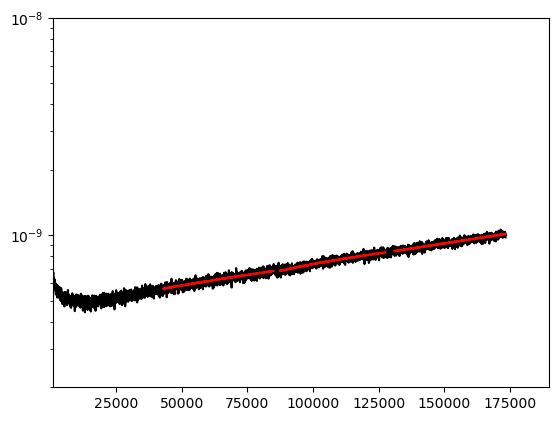

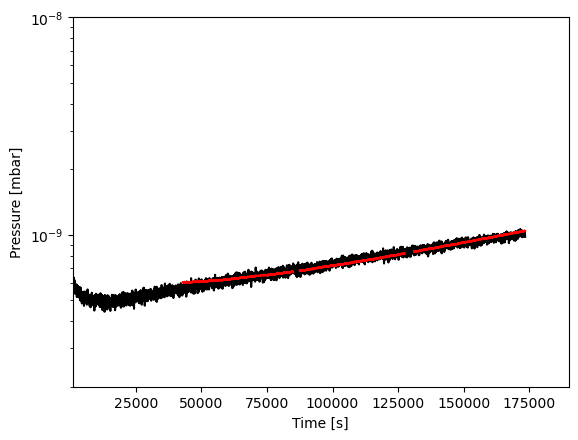

In [11]:
#Plotting Code

time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]

#Plot with different fit parameters for each time slice

plt.figure()
plt.semilogy(time, p, 'k')

for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT = np.vstack((time[gpts], temp[gpts]))
    y = p[gpts]
    spars = [1.29648471e-01, 7.99649264e+03, -1.11283810e-01, 9.99999525e-01, -3.72000013e-03]
    #spars = [3.48859880e-09, -3.45969798e+01, 3.98032858e-01, 1, 0]
    #Spars that work for curvefit: 3.48859880e-09, -3.45969798e+01, 3.98032858e-01, 1, 0
    #Spars from old teflon data: 3.48859880e-09, 3.45969798e+03, 3.98032858e-01, 1, 0
    #res = minimize(combined_chisq_short, spars, args=(combined_data), method='Nelder-Mead')
    #bp = res.x
    bp, bc = curve_fit(d.fitfunction_short_temp_offset, tT, y, p0=spars, method='lm', maxfev=90000)
    plt.plot(tT[0], d.fitfunction_short_temp_offset(tT,*bp),'r')
    print('bp:', bp)
    plt.ylim(2e-10, 1e-8)
    plt.xlim(1e3, 19e4)
    #res = minimize(combined_chisq_short, spars, args=(combined_data,))
    #bp = res.x
   

#Plot with the same fit parameters for all time slices
tT = []
y = []
combined_data = []
plt.figure()
plt.semilogy(time, p, 'k')
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])
spars = [1.29648471e-01, 7.99649264e+03, -1.11283810e-01, 9.99999525e-01, -3.72000013e-03]
#spars = [7.08859880e-05, 3.45969798e+03, 1.28032858e+03, 1, 5]
#bp, bc = curve_fit(d.fitfunction_short_temp_offset, np.vstack((time,temp)), p, p0=spars, method='lm', maxfev=90000)
res = minimize(combined_chisq_short, spars, args=(tT, y))
bp = res.x


for j in range(len(time_slices)):
    tvals = combined_data[j][0]
    plt.plot(tvals, d.fitfunction_short_temp_offset(tT[j], *bp), 'r')
   
    

print('bp:', bp)

plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")
plt.ylim(2e-10, 1e-8)
plt.xlim(1e3, 19e4)



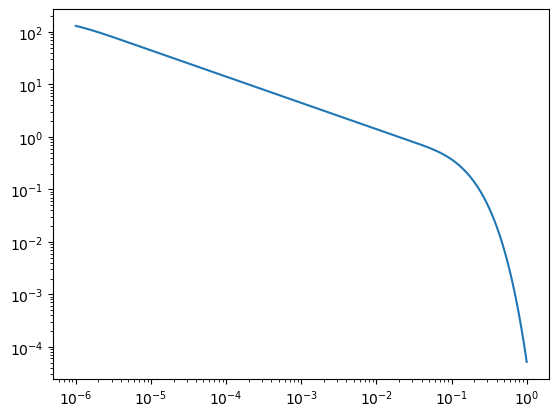

In [12]:
tvec = np.logspace(-6,0,1000)

maxn = 200

fval = np.zeros_like(tvec)
for n in range(maxn):
    fval += np.exp(-(np.pi*(2*n+1))**2*tvec)

plt.figure()
plt.loglog(tvec, fval)

In [ ]:
nwalkers, ndim = 100, 5

ffn = lambda p,d,y: -combined_chisq_short(p,d, y)

scaling_factors = np.array([1e-1, 7e+3, 1e-1, 9.9e-1, 3.7e-3])
p0 = [spars + scaling_factors*0.001*np.random.randn(ndim) for i in range(nwalkers)]
 
sampler = mc.EnsembleSampler(nwalkers, ndim, ffn, args=(tT,y))
sampler.run_mcmc(p0, 4000, progress=True)


(2, 1365)
(2, 1302)
(2, 1380)
6358.948338545786
(2, 1365)
(2, 1302)
(2, 1380)
6098.361515227357
(2, 1365)
(2, 1302)
(2, 1380)
6022.401373478371
(2, 1365)
(2, 1302)
(2, 1380)
5589.07719196408
(2, 1365)
(2, 1302)
(2, 1380)
5926.3071490762395
(2, 1365)
(2, 1302)
(2, 1380)
5650.682717276099
(2, 1365)
(2, 1302)
(2, 1380)
6041.980551137317
(2, 1365)
(2, 1302)
(2, 1380)
5769.7915390185735
(2, 1365)
(2, 1302)
(2, 1380)
5246.863946933441
(2, 1365)
(2, 1302)
(2, 1380)
5551.246521069614
(2, 1365)
(2, 1302)
(2, 1380)
6198.529804368736
(2, 1365)
(2, 1302)
(2, 1380)
6607.031820014777
(2, 1365)
(2, 1302)
(2, 1380)
5727.720167355249
(2, 1365)
(2, 1302)
(2, 1380)
6016.261457324725
(2, 1365)
(2, 1302)
(2, 1380)
6966.693498044941
(2, 1365)
(2, 1302)
(2, 1380)
5533.561095358104
(2, 1365)
(2, 1302)
(2, 1380)
5925.972665449114
(2, 1365)
(2, 1302)
(2, 1380)
5208.072425471147
(2, 1365)
(2, 1302)
(2, 1380)
6094.515310732571
(2, 1365)
(2, 1302)
(2, 1380)
6726.82061378405
(2, 1365)
(2, 1302)
(2, 1380)
4857.21920

  0%|          | 0/4000 [00:00<?, ?it/s]

(2, 1365)
(2, 1302)
(2, 1380)
5953.589612313326
(2, 1365)
(2, 1302)
(2, 1380)
5675.891996829994
(2, 1365)
(2, 1302)
(2, 1380)
5846.097526997498
(2, 1365)
(2, 1302)
(2, 1380)
6033.348980555732
(2, 1365)
(2, 1302)
(2, 1380)
5771.88483919792
(2, 1365)
(2, 1302)
(2, 1380)
5033.209895616248
(2, 1365)
(2, 1302)
(2, 1380)
5711.117572821121
(2, 1365)
(2, 1302)
(2, 1380)
7054.228423300087
(2, 1365)
(2, 1302)
(2, 1380)
5493.2236136673055
(2, 1365)
(2, 1302)
(2, 1380)
5471.967853594821
(2, 1365)
(2, 1302)
(2, 1380)
3986.4875196201506
(2, 1365)
(2, 1302)
(2, 1380)
7307.2135792146855
(2, 1365)
(2, 1302)
(2, 1380)
5684.7110974375055
(2, 1365)
(2, 1302)
(2, 1380)
5360.00473071877
(2, 1365)
(2, 1302)
(2, 1380)
6129.5698154263155
(2, 1365)
(2, 1302)
(2, 1380)
5575.362511147216
(2, 1365)
(2, 1302)
(2, 1380)
5425.523120056667
(2, 1365)
(2, 1302)
(2, 1380)
5759.561448474019
(2, 1365)
(2, 1302)
(2, 1380)
5280.211771835733
(2, 1365)
(2, 1302)
(2, 1380)
5619.599720404424
(2, 1365)
(2, 1302)
(2, 1380)
5744.32

  0%|          | 4/4000 [00:00<02:10, 30.53it/s]

6051.813687558499
(2, 1365)
(2, 1302)
(2, 1380)
3497.8466950667707
(2, 1365)
(2, 1302)
(2, 1380)
4152.310695930412
(2, 1365)
(2, 1302)
(2, 1380)
6403.785936558024
(2, 1365)
(2, 1302)
(2, 1380)
5162.437408073147
(2, 1365)
(2, 1302)
(2, 1380)
4663.290061626111
(2, 1365)
(2, 1302)
(2, 1380)
6006.856947027272
(2, 1365)
(2, 1302)
(2, 1380)
4599.618101485011
(2, 1365)
(2, 1302)
(2, 1380)
5868.564436252178
(2, 1365)
(2, 1302)
(2, 1380)
7850.909833850738
(2, 1365)
(2, 1302)
(2, 1380)
4822.664729481272
(2, 1365)
(2, 1302)
(2, 1380)
5345.311522120999
(2, 1365)
(2, 1302)
(2, 1380)
7897.174413589949
(2, 1365)
(2, 1302)
(2, 1380)
6088.063693592936
(2, 1365)
(2, 1302)
(2, 1380)
5533.886198081672
(2, 1365)
(2, 1302)
(2, 1380)
6307.908486707445
(2, 1365)
(2, 1302)
(2, 1380)
10400.141511172493
(2, 1365)
(2, 1302)
(2, 1380)
5605.3321677458025
(2, 1365)
(2, 1302)
(2, 1380)
6284.526077336608
(2, 1365)
(2, 1302)
(2, 1380)
5291.679347214864
(2, 1365)
(2, 1302)
(2, 1380)
5383.872451153525
(2, 1365)
(2, 1302)

  0%|          | 9/4000 [00:00<01:57, 33.92it/s]

4709.088177479216
(2, 1365)
(2, 1302)
(2, 1380)
3726.666223546445
(2, 1365)
(2, 1302)
(2, 1380)
2456.994524419799
(2, 1365)
(2, 1302)
(2, 1380)
5289.837405616428
(2, 1365)
(2, 1302)
(2, 1380)
6642.121420990092
(2, 1365)
(2, 1302)
(2, 1380)
4189.963991866558
(2, 1365)
(2, 1302)
(2, 1380)
5255.478485154623
(2, 1365)
(2, 1302)
(2, 1380)
5953.2604518269145
(2, 1365)
(2, 1302)
(2, 1380)
5868.438624710917
(2, 1365)
(2, 1302)
(2, 1380)
6268.492804266974
(2, 1365)
(2, 1302)
(2, 1380)
5226.142543971879
(2, 1365)
(2, 1302)
(2, 1380)
5420.502939138877
(2, 1365)
(2, 1302)
(2, 1380)
5255.767195038687
(2, 1365)
(2, 1302)
(2, 1380)
4047.827829381904
(2, 1365)
(2, 1302)
(2, 1380)
5905.197870277914
(2, 1365)
(2, 1302)
(2, 1380)
3070.19403549196
(2, 1365)
(2, 1302)
(2, 1380)
6876.93917282574
(2, 1365)
(2, 1302)
(2, 1380)
4329.515658388151
(2, 1365)
(2, 1302)
(2, 1380)
5870.737822103752
(2, 1365)
(2, 1302)
(2, 1380)
4990.839157438104
(2, 1365)
(2, 1302)
(2, 1380)
4762.3471534752125
(2, 1365)
(2, 1302)
(2

  0%|          | 13/4000 [00:00<02:08, 31.10it/s]

(2, 1380)
3255.19163192006
(2, 1365)
(2, 1302)
(2, 1380)
5250.852339112022
(2, 1365)
(2, 1302)
(2, 1380)
1350.3526219018206
(2, 1365)
(2, 1302)
(2, 1380)
3655.057073317558
(2, 1365)
(2, 1302)
(2, 1380)
4867.561435471851
(2, 1365)
(2, 1302)
(2, 1380)
2901.73044223674
(2, 1365)
(2, 1302)
(2, 1380)
4763.167865633803
(2, 1365)
(2, 1302)
(2, 1380)
4538.154801982648
(2, 1365)
(2, 1302)
(2, 1380)
4388.679278608644
(2, 1365)
(2, 1302)
(2, 1380)
1006.3024053252586
(2, 1365)
(2, 1302)
(2, 1380)
1108.194322479866
(2, 1365)
(2, 1302)
(2, 1380)
4516.234133114458
(2, 1365)
(2, 1302)
(2, 1380)
2586.092017704977
(2, 1365)
(2, 1302)
(2, 1380)
3046.256274279115
(2, 1365)
(2, 1302)
(2, 1380)
5177.794490695867
(2, 1365)
(2, 1302)
(2, 1380)
4733.418184022622
(2, 1365)
(2, 1302)
(2, 1380)
5296.579079433603
(2, 1365)
(2, 1302)
(2, 1380)
4270.910817198741
(2, 1365)
(2, 1302)
(2, 1380)
5731.746063872865
(2, 1365)
(2, 1302)
(2, 1380)
196.32128398321794
(2, 1365)
(2, 1302)
(2, 1380)
2147.5866388942068
(2, 1365)


  0%|          | 17/4000 [00:00<02:09, 30.85it/s]

889.1481847301802
(2, 1365)
(2, 1302)
(2, 1380)
6963.77780383546
(2, 1365)
(2, 1302)
(2, 1380)
6410.162251559517
(2, 1365)
(2, 1302)
(2, 1380)
5604.918088423629
(2, 1365)
(2, 1302)
(2, 1380)
193.18864884950165
(2, 1365)
(2, 1302)
(2, 1380)
4929.030011627307
(2, 1365)
(2, 1302)
(2, 1380)
4595.612803616159
(2, 1365)
(2, 1302)
(2, 1380)
4446.472444023706
(2, 1365)
(2, 1302)
(2, 1380)
3068.6887429847143
(2, 1365)
(2, 1302)
(2, 1380)
4348.08727689265
(2, 1365)
(2, 1302)
(2, 1380)
2808.607041704461
(2, 1365)
(2, 1302)
(2, 1380)
185.83177860789255
(2, 1365)
(2, 1302)
(2, 1380)
3327.3290515919684
(2, 1365)
(2, 1302)
(2, 1380)
4213.049105026599
(2, 1365)
(2, 1302)
(2, 1380)
1263.2497709301995
(2, 1365)
(2, 1302)
(2, 1380)
781.8954642550698
(2, 1365)
(2, 1302)
(2, 1380)
3755.786082459545
(2, 1365)
(2, 1302)
(2, 1380)
424.26930799866557
(2, 1365)
(2, 1302)
(2, 1380)
2370.230189498693
(2, 1365)
(2, 1302)
(2, 1380)
6595.667140478867
(2, 1365)
(2, 1302)
(2, 1380)
3198.912923841421
(2, 1365)
(2, 1302

  1%|          | 21/4000 [00:00<02:09, 30.64it/s]

(2, 1365)
(2, 1302)
(2, 1380)
9148.980330925158
(2, 1365)
(2, 1302)
(2, 1380)
5149.878124816145
(2, 1365)
(2, 1302)
(2, 1380)
840.7796376757725
(2, 1365)
(2, 1302)
(2, 1380)
6116.760525349261
(2, 1365)
(2, 1302)
(2, 1380)
2438.4837608771527
(2, 1365)
(2, 1302)
(2, 1380)
4186.410325534756
(2, 1365)
(2, 1302)
(2, 1380)
14929.584527439521
(2, 1365)
(2, 1302)
(2, 1380)
10980.746410511652
(2, 1365)
(2, 1302)
(2, 1380)
187.37535268506969
(2, 1365)
(2, 1302)
(2, 1380)
3143.418792835713
(2, 1365)
(2, 1302)
(2, 1380)
3585.8038022417472
(2, 1365)
(2, 1302)
(2, 1380)
1088.210388996903
(2, 1365)
(2, 1302)
(2, 1380)
195.25612758705788
(2, 1365)
(2, 1302)
(2, 1380)
15716.512645008657
(2, 1365)
(2, 1302)
(2, 1380)
4989.407817643942
(2, 1365)
(2, 1302)
(2, 1380)
1965.6086638571007
(2, 1365)
(2, 1302)
(2, 1380)
5438.046771790727
(2, 1365)
(2, 1302)
(2, 1380)
4261.091220545071
(2, 1365)
(2, 1302)
(2, 1380)
2819.781586296617
(2, 1365)
(2, 1302)
(2, 1380)
3081.681507915061
(2, 1365)
(2, 1302)
(2, 1380)
14

(2, 1365)
(2, 1302)
(2, 1380)
805.7676093578741
(2, 1365)
(2, 1302)
(2, 1380)
1136.690570007333
(2, 1365)
(2, 1302)
(2, 1380)
207.31901259899414
(2, 1365)
(2, 1302)
(2, 1380)
1131.6907087013049
(2, 1365)
(2, 1302)
(2, 1380)
2948.143232988855
(2, 1365)
(2, 1302)
(2, 1380)
4538.711910758139
(2, 1365)
(2, 1302)
(2, 1380)
4030.5965167126697
(2, 1365)
(2, 1302)
(2, 1380)
5620.728420842755
(2, 1365)
(2, 1302)
(2, 1380)
421.50531055393685
(2, 1365)
(2, 1302)
(2, 1380)
670.4723722724774
(2, 1365)
(2, 1302)
(2, 1380)
272.95094247740917
(2, 1365)
(2, 1302)
(2, 1380)
6044.574808307008
(2, 1365)
(2, 1302)
(2, 1380)
3068.0517928041736
(2, 1365)
(2, 1302)
(2, 1380)
3775.58203470975
(2, 1365)
(2, 1302)
(2, 1380)
2233.875715544568
(2, 1365)
(2, 1302)
(2, 1380)
2935.9195799162076
(2, 1365)
(2, 1302)
(2, 1380)
1458.0951166460882
(2, 1365)
(2, 1302)
(2, 1380)
216.8569489329989
(2, 1365)
(2, 1302)
(2, 1380)
325.46750436595397
(2, 1365)
(2, 1302)
(2, 1380)
7881.857990039609
(2, 1365)
(2, 1302)
(2, 1380)
20

  1%|          | 25/4000 [00:00<02:10, 30.49it/s]

2056.6323533462246
(2, 1365)
(2, 1302)
(2, 1380)
193.0185722807845
(2, 1365)
(2, 1302)
(2, 1380)
189.14855689135123
(2, 1365)
(2, 1302)
(2, 1380)
495.8592502994187
(2, 1365)
(2, 1302)
(2, 1380)
1205.9081329307305
(2, 1365)
(2, 1302)
(2, 1380)
279.19738325778223
(2, 1365)
(2, 1302)
(2, 1380)
188.74976102502666
(2, 1365)
(2, 1302)
(2, 1380)
455.2428640734842
(2, 1365)
(2, 1302)
(2, 1380)
189.21045062703527
(2, 1365)
(2, 1302)
(2, 1380)
2933.4293314876422
(2, 1365)
(2, 1302)
(2, 1380)
490.64526733909025
(2, 1365)
(2, 1302)
(2, 1380)
194.3788589635302
(2, 1365)
(2, 1302)
(2, 1380)
6201.654188163404
(2, 1365)
(2, 1302)
(2, 1380)
2055.127461081084
(2, 1365)
(2, 1302)
(2, 1380)
4533.653163853198
(2, 1365)
(2, 1302)
(2, 1380)
6361.80422601415
(2, 1365)
(2, 1302)
(2, 1380)
186.56941889456442
(2, 1365)
(2, 1302)
(2, 1380)
942.2342023899623
(2, 1365)
(2, 1302)
(2, 1380)
542.8543554669237
(2, 1365)
(2, 1302)
(2, 1380)
1794.1654025422547
(2, 1365)
(2, 1302)
(2, 1380)
195.56944683614307
(2, 1365)
(2

  1%|          | 29/4000 [00:00<02:10, 30.47it/s]

(2, 1380)
193.703487789041
(2, 1365)
(2, 1302)
(2, 1380)
187.57192763505702
(2, 1365)
(2, 1302)
(2, 1380)
188.49370758113542
(2, 1365)
(2, 1302)
(2, 1380)
846.3456184916439
(2, 1365)
(2, 1302)
(2, 1380)
343.98749837953005
(2, 1365)
(2, 1302)
(2, 1380)
10081.113984371215
(2, 1365)
(2, 1302)
(2, 1380)
190.18134821208236
(2, 1365)
(2, 1302)
(2, 1380)
185.7745526703277
(2, 1365)
(2, 1302)
(2, 1380)
197.5591759880598
(2, 1365)
(2, 1302)
(2, 1380)
321.1239704486957
(2, 1365)
(2, 1302)
(2, 1380)
195.47342654511672
(2, 1365)
(2, 1302)
(2, 1380)
598.3177880058663
(2, 1365)
(2, 1302)
(2, 1380)
2183.8690265930227
(2, 1365)
(2, 1302)
(2, 1380)
282.01003297400666
(2, 1365)
(2, 1302)
(2, 1380)
253.90885413720179
(2, 1365)
(2, 1302)
(2, 1380)
1993.0257945286555
(2, 1365)
(2, 1302)
(2, 1380)
182.93683228503966
(2, 1365)
(2, 1302)
(2, 1380)
252.23707953875044
(2, 1365)
(2, 1302)
(2, 1380)
3022.532441212476
(2, 1365)
(2, 1302)
(2, 1380)
372.98000530175807
(2, 1365)
(2, 1302)
(2, 1380)
1124.639064005891


  1%|          | 33/4000 [00:01<02:09, 30.65it/s]

(2, 1365)
(2, 1302)
(2, 1380)
280.32702362955746
(2, 1365)
(2, 1302)
(2, 1380)
313.78635889916643
(2, 1365)
(2, 1302)
(2, 1380)
360.91327609797685
(2, 1365)
(2, 1302)
(2, 1380)
188.59881923140753
(2, 1365)
(2, 1302)
(2, 1380)
432.95177353051724
(2, 1365)
(2, 1302)
(2, 1380)
277.96953660095363
(2, 1365)
(2, 1302)
(2, 1380)
193.19486364417781
(2, 1365)
(2, 1302)
(2, 1380)
2084.1448848593645
(2, 1365)
(2, 1302)
(2, 1380)
2387.426170757436
(2, 1365)
(2, 1302)
(2, 1380)
868.3092201310309
(2, 1365)
(2, 1302)
(2, 1380)
1135.3358366609887
(2, 1365)
(2, 1302)
(2, 1380)
270.14517082900335
(2, 1365)
(2, 1302)
(2, 1380)
432.7814854258501
(2, 1365)
(2, 1302)
(2, 1380)
211.47667815964633
(2, 1365)
(2, 1302)
(2, 1380)
187.44749792317674
(2, 1365)
(2, 1302)
(2, 1380)
190.0932652864966
(2, 1365)
(2, 1302)
(2, 1380)
187.76643571355834
(2, 1365)
(2, 1302)
(2, 1380)
399.18748740064353
(2, 1365)
(2, 1302)
(2, 1380)
188.93271675858287
(2, 1365)
(2, 1302)
(2, 1380)
217.4222694087215
(2, 1365)
(2, 1302)
(2, 1

  1%|          | 37/4000 [00:01<02:08, 30.94it/s]

(2, 1302)
(2, 1380)
182.37592271709036
(2, 1365)
(2, 1302)
(2, 1380)
185.05433078829697
(2, 1365)
(2, 1302)
(2, 1380)
195.48912199456177
(2, 1365)
(2, 1302)
(2, 1380)
200.25177199394892
(2, 1365)
(2, 1302)
(2, 1380)
335.5786855499243
(2, 1365)
(2, 1302)
(2, 1380)
196.32066339996936
(2, 1365)
(2, 1302)
(2, 1380)
187.3717500822179
(2, 1365)
(2, 1302)
(2, 1380)
190.7943706370861
(2, 1365)
(2, 1302)
(2, 1380)
221.73199679279654
(2, 1365)
(2, 1302)
(2, 1380)
185.10314687392537
(2, 1365)
(2, 1302)
(2, 1380)
188.05769306532972
(2, 1365)
(2, 1302)
(2, 1380)
225.57740814407748
(2, 1365)
(2, 1302)
(2, 1380)
376.06020433568756
(2, 1365)
(2, 1302)
(2, 1380)
1903.1366696996495
(2, 1365)
(2, 1302)
(2, 1380)
193.8368105193561
(2, 1365)
(2, 1302)
(2, 1380)
240.10297815573074
(2, 1365)
(2, 1302)
(2, 1380)
188.99767854341206
(2, 1365)
(2, 1302)
(2, 1380)
200.64490271172863
(2, 1365)
(2, 1302)
(2, 1380)
183.58091817157094
(2, 1365)
(2, 1302)
(2, 1380)
186.7498569005723
(2, 1365)
(2, 1302)
(2, 1380)
565.7

  1%|          | 41/4000 [00:01<02:09, 30.59it/s]

191.6720152451836
(2, 1365)
(2, 1302)
(2, 1380)
190.54162376816234
(2, 1365)
(2, 1302)
(2, 1380)
297.77061907267483
(2, 1365)
(2, 1302)
(2, 1380)
604.1755419496992
(2, 1365)
(2, 1302)
(2, 1380)
367.85071052400457
(2, 1365)
(2, 1302)
(2, 1380)
175.7479680909683
(2, 1365)
(2, 1302)
(2, 1380)
204.30199848419133
(2, 1365)
(2, 1302)
(2, 1380)
278.9722591365438
(2, 1365)
(2, 1302)
(2, 1380)
234.02750702619628
(2, 1365)
(2, 1302)
(2, 1380)
185.7496126557582
(2, 1365)
(2, 1302)
(2, 1380)
288.79345126057484
(2, 1365)
(2, 1302)
(2, 1380)
267.29894757701345
(2, 1365)
(2, 1302)
(2, 1380)
185.63246270793135
(2, 1365)
(2, 1302)
(2, 1380)
187.33549023198566
(2, 1365)
(2, 1302)
(2, 1380)
197.0069902510382
(2, 1365)
(2, 1302)
(2, 1380)
188.51238231289014
(2, 1365)
(2, 1302)
(2, 1380)
220.90300570400916
(2, 1365)
(2, 1302)
(2, 1380)
186.19639014607114
(2, 1365)
(2, 1302)
(2, 1380)
456.4562813318517
(2, 1365)
(2, 1302)
(2, 1380)
363.1158636793867
(2, 1365)
(2, 1302)
(2, 1380)
191.9750864634612
(2, 1365)


(2, 1380)
193.01589969187958
(2, 1365)
(2, 1302)
(2, 1380)
188.61757363561352
(2, 1365)
(2, 1302)
(2, 1380)
191.52131647368822
(2, 1365)
(2, 1302)
(2, 1380)
186.78381781255212
(2, 1365)
(2, 1302)
(2, 1380)
191.3232715070028
(2, 1365)
(2, 1302)
(2, 1380)
184.3016043215219
(2, 1365)
(2, 1302)
(2, 1380)
194.0994490999346
(2, 1365)
(2, 1302)
(2, 1380)
184.68641151949822
(2, 1365)
(2, 1302)
(2, 1380)
222.73636180185363
(2, 1365)
(2, 1302)
(2, 1380)
189.85312268358092
(2, 1365)
(2, 1302)
(2, 1380)
193.00304573235044
(2, 1365)
(2, 1302)
(2, 1380)
185.30510187726077
(2, 1365)
(2, 1302)
(2, 1380)
188.92025752338023
(2, 1365)
(2, 1302)
(2, 1380)
715.3446381367064
(2, 1365)
(2, 1302)
(2, 1380)
195.2761327857962
(2, 1365)
(2, 1302)
(2, 1380)
271.55512948462075
(2, 1365)
(2, 1302)
(2, 1380)
198.04631712319633
(2, 1365)
(2, 1302)
(2, 1380)
179.95521185297758
(2, 1365)
(2, 1302)
(2, 1380)
185.87927711532026
(2, 1365)
(2, 1302)
(2, 1380)
189.74959156984085
(2, 1365)
(2, 1302)
(2, 1380)
242.65832902797

  1%|          | 49/4000 [00:01<02:09, 30.50it/s]

(2, 1302)
(2, 1380)
239.44715216543324
(2, 1365)
(2, 1302)
(2, 1380)
182.62969305106697
(2, 1365)
(2, 1302)
(2, 1380)
189.77554118850463
(2, 1365)
(2, 1302)
(2, 1380)
181.3828346252285
(2, 1365)
(2, 1302)
(2, 1380)
181.83933320678415
(2, 1365)
(2, 1302)
(2, 1380)
183.61283182698116
(2, 1365)
(2, 1302)
(2, 1380)
176.56121848403205
(2, 1365)
(2, 1302)
(2, 1380)
206.60613594331085
(2, 1365)
(2, 1302)
(2, 1380)
185.50844361531833
(2, 1365)
(2, 1302)
(2, 1380)
237.3238540060375
(2, 1365)
(2, 1302)
(2, 1380)
397.4524876633243
(2, 1365)
(2, 1302)
(2, 1380)
186.89717252869994
(2, 1365)
(2, 1302)
(2, 1380)
246.0761609083405
(2, 1365)
(2, 1302)
(2, 1380)
227.01837544122702
(2, 1365)
(2, 1302)
(2, 1380)
190.35713608001853
(2, 1365)
(2, 1302)
(2, 1380)
196.0970797270577
(2, 1365)
(2, 1302)
(2, 1380)
183.96930385718906
(2, 1365)
(2, 1302)
(2, 1380)
339.4425595219554
(2, 1365)
(2, 1302)
(2, 1380)
184.3656117821169
(2, 1365)
(2, 1302)
(2, 1380)
197.64902939893324
(2, 1365)
(2, 1302)
(2, 1380)
188.850

(2, 1302)
(2, 1380)
176.27694994174885
(2, 1365)
(2, 1302)
(2, 1380)
188.36442185033408
(2, 1365)
(2, 1302)
(2, 1380)
188.5356200490317
(2, 1365)
(2, 1302)
(2, 1380)
1077.4677196848647
(2, 1365)
(2, 1302)
(2, 1380)
179.6047280547823
(2, 1365)
(2, 1302)
(2, 1380)
169.17928326124246
(2, 1365)
(2, 1302)
(2, 1380)
201.8840102892894
(2, 1365)
(2, 1302)
(2, 1380)
183.76143329610744
(2, 1365)
(2, 1302)
(2, 1380)
164.95087519636886
(2, 1365)
(2, 1302)
(2, 1380)
184.53759069312474
(2, 1365)
(2, 1302)
(2, 1380)
252.50427023638827
(2, 1365)
(2, 1302)
(2, 1380)
185.46687672761993
(2, 1365)
(2, 1302)
(2, 1380)
189.4507053803041
(2, 1365)
(2, 1302)
(2, 1380)
193.59225818450335
(2, 1365)
(2, 1302)
(2, 1380)
181.73725255808645
(2, 1365)
(2, 1302)
(2, 1380)
179.06858598639974
(2, 1365)
(2, 1302)
(2, 1380)
183.76977176999492
(2, 1365)
(2, 1302)
(2, 1380)
180.70463298373994
(2, 1365)
(2, 1302)
(2, 1380)
257.09122764482856
(2, 1365)
(2, 1302)
(2, 1380)
187.83596783751702
(2, 1365)
(2, 1302)
(2, 1380)
182.

  1%|▏         | 53/4000 [00:01<02:12, 29.73it/s]

(2, 1302)
(2, 1380)
186.80653618895658
(2, 1365)
(2, 1302)
(2, 1380)
180.85857994409767
(2, 1365)
(2, 1302)
(2, 1380)
182.81251806775748
(2, 1365)
(2, 1302)
(2, 1380)
184.1309454184076
(2, 1365)
(2, 1302)
(2, 1380)
186.41569240679337
(2, 1365)
(2, 1302)
(2, 1380)
195.17828440632877
(2, 1365)
(2, 1302)
(2, 1380)
173.13919238122003
(2, 1365)
(2, 1302)
(2, 1380)
177.52576490459114
(2, 1365)
(2, 1302)
(2, 1380)
188.00291405651933
(2, 1365)
(2, 1302)
(2, 1380)
205.7627298113925
(2, 1365)
(2, 1302)
(2, 1380)
2844.12017657093
(2, 1365)
(2, 1302)
(2, 1380)
184.057514375055
(2, 1365)
(2, 1302)
(2, 1380)
184.49145285208647
(2, 1365)
(2, 1302)
(2, 1380)
171.74547101876297
(2, 1365)
(2, 1302)
(2, 1380)
182.98536788083123
(2, 1365)
(2, 1302)
(2, 1380)
185.58631988651973
(2, 1365)
(2, 1302)
(2, 1380)
179.3631904476778
(2, 1365)
(2, 1302)
(2, 1380)
183.14633756176562
(2, 1365)
(2, 1302)
(2, 1380)
184.81990906495412
(2, 1365)
(2, 1302)
(2, 1380)
185.80349620001502
(2, 1365)
(2, 1302)
(2, 1380)
188.235

  2%|▏         | 61/4000 [00:02<02:13, 29.50it/s]

(2, 1302)
(2, 1380)
630.2432808104195
(2, 1365)
(2, 1302)
(2, 1380)
224.04463580858663
(2, 1365)
(2, 1302)
(2, 1380)
180.63262717963423
(2, 1365)
(2, 1302)
(2, 1380)
226.0290130763045
(2, 1365)
(2, 1302)
(2, 1380)
186.57882106120044
(2, 1365)
(2, 1302)
(2, 1380)
176.32307056336816
(2, 1365)
(2, 1302)
(2, 1380)
195.2150994494529
(2, 1365)
(2, 1302)
(2, 1380)
11043.831271586598
(2, 1365)
(2, 1302)
(2, 1380)
176.68354431635373
(2, 1365)
(2, 1302)
(2, 1380)
181.4070683359195
(2, 1365)
(2, 1302)
(2, 1380)
184.70102224667613
(2, 1365)
(2, 1302)
(2, 1380)
169.6760434424051
(2, 1365)
(2, 1302)
(2, 1380)
170.65119435983758
(2, 1365)
(2, 1302)
(2, 1380)
177.4299275325541
(2, 1365)
(2, 1302)
(2, 1380)
179.06238491405588
(2, 1365)
(2, 1302)
(2, 1380)
187.13003676928048
(2, 1365)
(2, 1302)
(2, 1380)
181.93975962298808
(2, 1365)
(2, 1302)
(2, 1380)
177.70222905323442
(2, 1365)
(2, 1302)
(2, 1380)
172.83945445577618
(2, 1365)
(2, 1302)
(2, 1380)
179.47501845721328
(2, 1365)
(2, 1302)
(2, 1380)
168.66

  2%|▏         | 69/4000 [00:02<02:09, 30.29it/s]

(2, 1380)
172.20666147600173
(2, 1365)
(2, 1302)
(2, 1380)
171.46129268216004
(2, 1365)
(2, 1302)
(2, 1380)
236.19207475929215
(2, 1365)
(2, 1302)
(2, 1380)
161.51634634330247
(2, 1365)
(2, 1302)
(2, 1380)
171.8087970615513
(2, 1365)
(2, 1302)
(2, 1380)
178.9642913065439
(2, 1365)
(2, 1302)
(2, 1380)
176.34013660567803
(2, 1365)
(2, 1302)
(2, 1380)
195.8084929642605
(2, 1365)
(2, 1302)
(2, 1380)
680.097549598698
(2, 1365)
(2, 1302)
(2, 1380)
169.57754707248085
(2, 1365)
(2, 1302)
(2, 1380)
193.4948512471628
(2, 1365)
(2, 1302)
(2, 1380)
173.6742236619728
(2, 1365)
(2, 1302)
(2, 1380)
184.28435522371316
(2, 1365)
(2, 1302)
(2, 1380)
161.98891286244515
(2, 1365)
(2, 1302)
(2, 1380)
182.71767298796772
(2, 1365)
(2, 1302)
(2, 1380)
179.04609335262404
(2, 1365)
(2, 1302)
(2, 1380)
180.25154554760343
(2, 1365)
(2, 1302)
(2, 1380)
192.03074676894326
(2, 1365)
(2, 1302)
(2, 1380)
177.26318426128648
(2, 1365)
(2, 1302)
(2, 1380)
173.54896130538305
(2, 1365)
(2, 1302)
(2, 1380)
189.6231274262347

  2%|▏         | 77/4000 [00:02<02:07, 30.75it/s]

(2, 1380)
163.7613681960391
(2, 1365)
(2, 1302)
(2, 1380)
179.15044046874374
(2, 1365)
(2, 1302)
(2, 1380)
169.93988431188217
(2, 1365)
(2, 1302)
(2, 1380)
168.46226477268536
(2, 1365)
(2, 1302)
(2, 1380)
174.0325543491046
(2, 1365)
(2, 1302)
(2, 1380)
184.85913787610693
(2, 1365)
(2, 1302)
(2, 1380)
169.27655304709577
(2, 1365)
(2, 1302)
(2, 1380)
172.5608447859371
(2, 1365)
(2, 1302)
(2, 1380)
162.0584711161859
(2, 1365)
(2, 1302)
(2, 1380)
172.10029414921485
(2, 1365)
(2, 1302)
(2, 1380)
171.4795288607723
(2, 1365)
(2, 1302)
(2, 1380)
170.7403010493042
(2, 1365)
(2, 1302)
(2, 1380)
171.2516665349329
(2, 1365)
(2, 1302)
(2, 1380)
164.55742562214255
(2, 1365)
(2, 1302)
(2, 1380)
215.26473325364987
(2, 1365)
(2, 1302)
(2, 1380)
205.13116366753974
(2, 1365)
(2, 1302)
(2, 1380)
164.16271519529954
(2, 1365)
(2, 1302)
(2, 1380)
161.4421129868565
(2, 1365)
(2, 1302)
(2, 1380)
167.7775361225063
(2, 1365)
(2, 1302)
(2, 1380)
192.67253109114824
(2, 1365)
(2, 1302)
(2, 1380)
314.78754370461496


  2%|▏         | 85/4000 [00:02<02:11, 29.87it/s]

182.9272895902561
(2, 1365)
(2, 1302)
(2, 1380)
169.07929404660473
(2, 1365)
(2, 1302)
(2, 1380)
158.9263378626079
(2, 1365)
(2, 1302)
(2, 1380)
181.77595607675096
(2, 1365)
(2, 1302)
(2, 1380)
165.89216455720955
(2, 1365)
(2, 1302)
(2, 1380)
162.32011951923832
(2, 1365)
(2, 1302)
(2, 1380)
174.9516164360702
(2, 1365)
(2, 1302)
(2, 1380)
283.9475490302781
(2, 1365)
(2, 1302)
(2, 1380)
164.37314342796873
(2, 1365)
(2, 1302)
(2, 1380)
164.33714453688012
(2, 1365)
(2, 1302)
(2, 1380)
165.21990425635028
(2, 1365)
(2, 1302)
(2, 1380)
174.19962506822355
(2, 1365)
(2, 1302)
(2, 1380)
164.79398821554184
(2, 1365)
(2, 1302)
(2, 1380)
166.53361856622752
(2, 1365)
(2, 1302)
(2, 1380)
163.5023646032585
(2, 1365)
(2, 1302)
(2, 1380)
165.20372872945813
(2, 1365)
(2, 1302)
(2, 1380)
165.58448535022728
(2, 1365)
(2, 1302)
(2, 1380)
166.64379825248872
(2, 1365)
(2, 1302)
(2, 1380)
252.07296288159137
(2, 1365)
(2, 1302)
(2, 1380)
167.65231007455895
(2, 1365)
(2, 1302)
(2, 1380)
169.66233687187517
(2, 13

  2%|▏         | 89/4000 [00:02<02:06, 30.89it/s]

169.27848459382813
(2, 1365)
(2, 1302)
(2, 1380)
179.91207250978454
(2, 1365)
(2, 1302)
(2, 1380)
163.29093669073615
(2, 1365)
(2, 1302)
(2, 1380)
170.2043639248704
(2, 1365)
(2, 1302)
(2, 1380)
168.03704668927446
(2, 1365)
(2, 1302)
(2, 1380)
161.89912218642428
(2, 1365)
(2, 1302)
(2, 1380)
170.28835800514682
(2, 1365)
(2, 1302)
(2, 1380)
224.56491778365915
(2, 1365)
(2, 1302)
(2, 1380)
170.70897251139115
(2, 1365)
(2, 1302)
(2, 1380)
175.27708929066688
(2, 1365)
(2, 1302)
(2, 1380)
164.71107146385873
(2, 1365)
(2, 1302)
(2, 1380)
164.72856311362074
(2, 1365)
(2, 1302)
(2, 1380)
169.4132840051949
(2, 1365)
(2, 1302)
(2, 1380)
175.08707484859687
(2, 1365)
(2, 1302)
(2, 1380)
169.95818123864933
(2, 1365)
(2, 1302)
(2, 1380)
177.3043258466899
(2, 1365)
(2, 1302)
(2, 1380)
155.92055767955935
(2, 1365)
(2, 1302)
(2, 1380)
168.87708128074422
(2, 1365)
(2, 1302)
(2, 1380)
168.85044234016448
(2, 1365)
(2, 1302)
(2, 1380)
165.45413605355913
(2, 1365)
(2, 1302)
(2, 1380)
164.0100994704897
(2, 1

  2%|▏         | 97/4000 [00:03<02:08, 30.46it/s]

201.49106808158953
(2, 1365)
(2, 1302)
(2, 1380)
162.69910457648996
(2, 1365)
(2, 1302)
(2, 1380)
189.03993717047297
(2, 1365)
(2, 1302)
(2, 1380)
167.93721731063897
(2, 1365)
(2, 1302)
(2, 1380)
157.3142547834011
(2, 1365)
(2, 1302)
(2, 1380)
199.55366704829743
(2, 1365)
(2, 1302)
(2, 1380)
165.76815479802372
(2, 1365)
(2, 1302)
(2, 1380)
163.2995010038336
(2, 1365)
(2, 1302)
(2, 1380)
168.87424474859705
(2, 1365)
(2, 1302)
(2, 1380)
163.62778313618225
(2, 1365)
(2, 1302)
(2, 1380)
169.21625771795505
(2, 1365)
(2, 1302)
(2, 1380)
154.9040587882825
(2, 1365)
(2, 1302)
(2, 1380)
153.80737248682908
(2, 1365)
(2, 1302)
(2, 1380)
167.39034151304242
(2, 1365)
(2, 1302)
(2, 1380)
166.91706923112804
(2, 1365)
(2, 1302)
(2, 1380)
158.8242553643567
(2, 1365)
(2, 1302)
(2, 1380)
165.49384195015654
(2, 1365)
(2, 1302)
(2, 1380)
165.2500748205459
(2, 1365)
(2, 1302)
(2, 1380)
165.76428527045312
(2, 1365)
(2, 1302)
(2, 1380)
162.4429461532513
(2, 1365)
(2, 1302)
(2, 1380)
163.26563270924865
(2, 136

  3%|▎         | 105/4000 [00:03<02:07, 30.64it/s]

(2, 1302)
(2, 1380)
162.26226450659215
(2, 1365)
(2, 1302)
(2, 1380)
204.79611577801512
(2, 1365)
(2, 1302)
(2, 1380)
149.0468078604022
(2, 1365)
(2, 1302)
(2, 1380)
171.22119970737458
(2, 1365)
(2, 1302)
(2, 1380)
156.1274400818022
(2, 1365)
(2, 1302)
(2, 1380)
161.00821562202742
(2, 1365)
(2, 1302)
(2, 1380)
156.7725786670349
(2, 1365)
(2, 1302)
(2, 1380)
198.8574602266776
(2, 1365)
(2, 1302)
(2, 1380)
158.22937077315268
(2, 1365)
(2, 1302)
(2, 1380)
175.47279208515943
(2, 1365)
(2, 1302)
(2, 1380)
160.14017661780568
(2, 1365)
(2, 1302)
(2, 1380)
172.75948306009613
(2, 1365)
(2, 1302)
(2, 1380)
156.97675337562734
(2, 1365)
(2, 1302)
(2, 1380)
156.57765792144488
(2, 1365)
(2, 1302)
(2, 1380)
159.92871272287869
(2, 1365)
(2, 1302)
(2, 1380)
157.4693517075188
(2, 1365)
(2, 1302)
(2, 1380)
150.41274830571933
(2, 1365)
(2, 1302)
(2, 1380)
149.43515155005548
(2, 1365)
(2, 1302)
(2, 1380)
156.47275547104576
(2, 1365)
(2, 1302)
(2, 1380)
188.7577985348026
(2, 1365)
(2, 1302)
(2, 1380)
164.88

  3%|▎         | 113/4000 [00:03<02:06, 30.84it/s]

(2, 1380)
159.40386881819305
(2, 1365)
(2, 1302)
(2, 1380)
148.7551892003112
(2, 1365)
(2, 1302)
(2, 1380)
151.12006792475373
(2, 1365)
(2, 1302)
(2, 1380)
150.40989653337425
(2, 1365)
(2, 1302)
(2, 1380)
155.6713564776692
(2, 1365)
(2, 1302)
(2, 1380)
212.4651534978109
(2, 1365)
(2, 1302)
(2, 1380)
149.64980364606032
(2, 1365)
(2, 1302)
(2, 1380)
157.44735747590875
(2, 1365)
(2, 1302)
(2, 1380)
156.10172757904292
(2, 1365)
(2, 1302)
(2, 1380)
157.2004563570958
(2, 1365)
(2, 1302)
(2, 1380)
151.12787170961886
(2, 1365)
(2, 1302)
(2, 1380)
155.9653906283828
(2, 1365)
(2, 1302)
(2, 1380)
154.84861617105253
(2, 1365)
(2, 1302)
(2, 1380)
164.8498955667955
(2, 1365)
(2, 1302)
(2, 1380)
158.29582721554956
(2, 1365)
(2, 1302)
(2, 1380)
279.54951359354607
(2, 1365)
(2, 1302)
(2, 1380)
157.06763154526828
(2, 1365)
(2, 1302)
(2, 1380)
154.8728338460524
(2, 1365)
(2, 1302)
(2, 1380)
160.67405404929798
(2, 1365)
(2, 1302)
(2, 1380)
157.81010720220263
(2, 1365)
(2, 1302)
(2, 1380)
158.8699971063810

  3%|▎         | 121/4000 [00:03<02:06, 30.74it/s]

161.4387380686975
(2, 1365)
(2, 1302)
(2, 1380)
166.37154784622334
(2, 1365)
(2, 1302)
(2, 1380)
148.95051143152222
(2, 1365)
(2, 1302)
(2, 1380)
154.70677721620277
(2, 1365)
(2, 1302)
(2, 1380)
154.68089775393094
(2, 1365)
(2, 1302)
(2, 1380)
146.0389940258245
(2, 1365)
(2, 1302)
(2, 1380)
153.30977603879217
(2, 1365)
(2, 1302)
(2, 1380)
150.6044754807667
(2, 1365)
(2, 1302)
(2, 1380)
162.24562734738205
(2, 1365)
(2, 1302)
(2, 1380)
144.3972112442318
(2, 1365)
(2, 1302)
(2, 1380)
157.51055545769816
(2, 1365)
(2, 1302)
(2, 1380)
156.35777897337465
(2, 1365)
(2, 1302)
(2, 1380)
147.32456486174533
(2, 1365)
(2, 1302)
(2, 1380)
262.8311731901219
(2, 1365)
(2, 1302)
(2, 1380)
152.67478348947643
(2, 1365)
(2, 1302)
(2, 1380)
147.86595847508573
(2, 1365)
(2, 1302)
(2, 1380)
153.8746392043504
(2, 1365)
(2, 1302)
(2, 1380)
151.50299086939793
(2, 1365)
(2, 1302)
(2, 1380)
210.5089631632618
(2, 1365)
(2, 1302)
(2, 1380)
147.95277078371694
(2, 1365)
(2, 1302)
(2, 1380)
162.24814597715996
(2, 1365

  3%|▎         | 125/4000 [00:04<02:07, 30.37it/s]

(2, 1380)
146.83335985893228
(2, 1365)
(2, 1302)
(2, 1380)
175.87574119957424
(2, 1365)
(2, 1302)
(2, 1380)
151.21404616446824
(2, 1365)
(2, 1302)
(2, 1380)
148.8579831703516
(2, 1365)
(2, 1302)
(2, 1380)
154.36716396212086
(2, 1365)
(2, 1302)
(2, 1380)
144.3367975261706
(2, 1365)
(2, 1302)
(2, 1380)
144.15099802154361
(2, 1365)
(2, 1302)
(2, 1380)
151.5488048822985
(2, 1365)
(2, 1302)
(2, 1380)
150.33401258547624
(2, 1365)
(2, 1302)
(2, 1380)
194.77229602072714
(2, 1365)
(2, 1302)
(2, 1380)
148.81463523419578
(2, 1365)
(2, 1302)
(2, 1380)
146.10779936133662
(2, 1365)
(2, 1302)
(2, 1380)
145.22491990205296
(2, 1365)
(2, 1302)
(2, 1380)
145.8346471872309
(2, 1365)
(2, 1302)
(2, 1380)
146.55323135793736
(2, 1365)
(2, 1302)
(2, 1380)
152.38313330823422
(2, 1365)
(2, 1302)
(2, 1380)
145.471109222064
(2, 1365)
(2, 1302)
(2, 1380)
146.43748812798512
(2, 1365)
(2, 1302)
(2, 1380)
150.23508163961628
(2, 1365)
(2, 1302)
(2, 1380)
152.76011606519432
(2, 1365)
(2, 1302)
(2, 1380)
148.420713233456

  3%|▎         | 133/4000 [00:04<02:03, 31.43it/s]

204.70653118504157
(2, 1365)
(2, 1302)
(2, 1380)
167.0967784742333
(2, 1365)
(2, 1302)
(2, 1380)
147.15208969632675
(2, 1365)
(2, 1302)
(2, 1380)
145.86293782863265
(2, 1365)
(2, 1302)
(2, 1380)
163.373679292665
(2, 1365)
(2, 1302)
(2, 1380)
146.29618202974126
(2, 1365)
(2, 1302)
(2, 1380)
145.37609133401594
(2, 1365)
(2, 1302)
(2, 1380)
150.9711943051658
(2, 1365)
(2, 1302)
(2, 1380)
149.73996734113894
(2, 1365)
(2, 1302)
(2, 1380)
148.8285596265585
(2, 1365)
(2, 1302)
(2, 1380)
137.6950427316151
(2, 1365)
(2, 1302)
(2, 1380)
171.35945189883384
(2, 1365)
(2, 1302)
(2, 1380)
143.45382692964273
(2, 1365)
(2, 1302)
(2, 1380)
144.02840946062256
(2, 1365)
(2, 1302)
(2, 1380)
152.01787630950548
(2, 1365)
(2, 1302)
(2, 1380)
179.90763946822295
(2, 1365)
(2, 1302)
(2, 1380)
147.67741980923026
(2, 1365)
(2, 1302)
(2, 1380)
154.78504350300352
(2, 1365)
(2, 1302)
(2, 1380)
148.3073692692368
(2, 1365)
(2, 1302)
(2, 1380)
165.29063050895212
(2, 1365)
(2, 1302)
(2, 1380)
149.61421187511917
(2, 1365

  4%|▎         | 141/4000 [00:04<02:10, 29.57it/s]

(2, 1302)
(2, 1380)
147.6914361983783
(2, 1365)
(2, 1302)
(2, 1380)
138.71109430715117
(2, 1365)
(2, 1302)
(2, 1380)
152.3085960890245
(2, 1365)
(2, 1302)
(2, 1380)
242.72211826772843
(2, 1365)
(2, 1302)
(2, 1380)
154.7765125386192
(2, 1365)
(2, 1302)
(2, 1380)
145.51865547068255
(2, 1365)
(2, 1302)
(2, 1380)
142.88104543014992
(2, 1365)
(2, 1302)
(2, 1380)
139.76613278710454
(2, 1365)
(2, 1302)
(2, 1380)
148.6854717523146
(2, 1365)
(2, 1302)
(2, 1380)
146.98643576900656
(2, 1365)
(2, 1302)
(2, 1380)
140.1954486908701
(2, 1365)
(2, 1302)
(2, 1380)
143.8785426869692
(2, 1365)
(2, 1302)
(2, 1380)
143.7142393244137
(2, 1365)
(2, 1302)
(2, 1380)
145.2781359878201
(2, 1365)
(2, 1302)
(2, 1380)
162.42923781361523
(2, 1365)
(2, 1302)
(2, 1380)
139.82684176556154
(2, 1365)
(2, 1302)
(2, 1380)
169.98946846974093
(2, 1365)
(2, 1302)
(2, 1380)
144.31424801563278
(2, 1365)
(2, 1302)
(2, 1380)
139.37517013064934
(2, 1365)
(2, 1302)
(2, 1380)
144.48220158142468
(2, 1365)
(2, 1302)
(2, 1380)
148.1144

  4%|▎         | 145/4000 [00:04<02:04, 30.90it/s]

(2, 1365)
(2, 1302)
(2, 1380)
233.76462506628718
(2, 1365)
(2, 1302)
(2, 1380)
147.34441237681997
(2, 1365)
(2, 1302)
(2, 1380)
144.97790211124843
(2, 1365)
(2, 1302)
(2, 1380)
145.91824486946396
(2, 1365)
(2, 1302)
(2, 1380)
149.75191782229447
(2, 1365)
(2, 1302)
(2, 1380)
143.56766749449753
(2, 1365)
(2, 1302)
(2, 1380)
138.15402730006952
(2, 1365)
(2, 1302)
(2, 1380)
138.7967485518776
(2, 1365)
(2, 1302)
(2, 1380)
140.7848086246459
(2, 1365)
(2, 1302)
(2, 1380)
147.66247081005616
(2, 1365)
(2, 1302)
(2, 1380)
168.38421296642179
(2, 1365)
(2, 1302)
(2, 1380)
142.37902324420122
(2, 1365)
(2, 1302)
(2, 1380)
148.10898522475333
(2, 1365)
(2, 1302)
(2, 1380)
142.65019027095695
(2, 1365)
(2, 1302)
(2, 1380)
146.51517748549907
(2, 1365)
(2, 1302)
(2, 1380)
165.9932669664694
(2, 1365)
(2, 1302)
(2, 1380)
136.36993745470477
(2, 1365)
(2, 1302)
(2, 1380)
142.53190960332736
(2, 1365)
(2, 1302)
(2, 1380)
148.91680209966876
(2, 1365)
(2, 1302)
(2, 1380)
159.71930406330722
(2, 1365)
(2, 1302)
(2,

  4%|▍         | 153/4000 [00:05<02:07, 30.26it/s]

(2, 1380)
139.9252538081124
(2, 1365)
(2, 1302)
(2, 1380)
138.23678558901426
(2, 1365)
(2, 1302)
(2, 1380)
141.77786861940064
(2, 1365)
(2, 1302)
(2, 1380)
135.59983740406858
(2, 1365)
(2, 1302)
(2, 1380)
134.67555650666353
(2, 1365)
(2, 1302)
(2, 1380)
142.16320910060304
(2, 1365)
(2, 1302)
(2, 1380)
151.3605465488376
(2, 1365)
(2, 1302)
(2, 1380)
127.89750309060646
(2, 1365)
(2, 1302)
(2, 1380)
148.30782462071693
(2, 1365)
(2, 1302)
(2, 1380)
143.9313527569842
(2, 1365)
(2, 1302)
(2, 1380)
143.2505434542239
(2, 1365)
(2, 1302)
(2, 1380)
138.22995021110285
(2, 1365)
(2, 1302)
(2, 1380)
136.54648907093303
(2, 1365)
(2, 1302)
(2, 1380)
154.71166962331966
(2, 1365)
(2, 1302)
(2, 1380)
139.96755343747276
(2, 1365)
(2, 1302)
(2, 1380)
161.66794146031205
(2, 1365)
(2, 1302)
(2, 1380)
147.01858200949425
(2, 1365)
(2, 1302)
(2, 1380)
149.71893199308835
(2, 1365)
(2, 1302)
(2, 1380)
141.50678112020523
(2, 1365)
(2, 1302)
(2, 1380)
140.39052056704
(2, 1365)
(2, 1302)
(2, 1380)
142.3877897676774

  4%|▍         | 162/4000 [00:05<02:05, 30.55it/s]

(2, 1380)
137.7224788509132
(2, 1365)
(2, 1302)
(2, 1380)
136.9025522313028
(2, 1365)
(2, 1302)
(2, 1380)
138.03186251721607
(2, 1365)
(2, 1302)
(2, 1380)
136.4868650722574
(2, 1365)
(2, 1302)
(2, 1380)
142.12965687321616
(2, 1365)
(2, 1302)
(2, 1380)
136.13796381815433
(2, 1365)
(2, 1302)
(2, 1380)
235.52247779741063
(2, 1365)
(2, 1302)
(2, 1380)
131.61804762889847
(2, 1365)
(2, 1302)
(2, 1380)
146.89513956561416
(2, 1365)
(2, 1302)
(2, 1380)
139.7395606021629
(2, 1365)
(2, 1302)
(2, 1380)
137.22154222709855
(2, 1365)
(2, 1302)
(2, 1380)
139.49972575108256
(2, 1365)
(2, 1302)
(2, 1380)
139.27472032765434
(2, 1365)
(2, 1302)
(2, 1380)
131.63279569538048
(2, 1365)
(2, 1302)
(2, 1380)
153.13022620176218
(2, 1365)
(2, 1302)
(2, 1380)
151.6147784009837
(2, 1365)
(2, 1302)
(2, 1380)
134.09104672662926
(2, 1365)
(2, 1302)
(2, 1380)
152.62444728253746
(2, 1365)
(2, 1302)
(2, 1380)
136.7019059094075
(2, 1365)
(2, 1302)
(2, 1380)
132.62845858249023
(2, 1365)
(2, 1302)
(2, 1380)
137.601294591882

  4%|▍         | 166/4000 [00:05<02:04, 30.72it/s]

(2, 1302)
(2, 1380)
135.6399119397511
(2, 1365)
(2, 1302)
(2, 1380)
128.10416308172805
(2, 1365)
(2, 1302)
(2, 1380)
137.40532825040842
(2, 1365)
(2, 1302)
(2, 1380)
137.56743935006392
(2, 1365)
(2, 1302)
(2, 1380)
135.25992770796768
(2, 1365)
(2, 1302)
(2, 1380)
176.2107446045821
(2, 1365)
(2, 1302)
(2, 1380)
137.11742812570793
(2, 1365)
(2, 1302)
(2, 1380)
149.02327114077733
(2, 1365)
(2, 1302)
(2, 1380)
189.7537266365539
(2, 1365)
(2, 1302)
(2, 1380)
134.258627000989
(2, 1365)
(2, 1302)
(2, 1380)
134.6375032148021
(2, 1365)
(2, 1302)
(2, 1380)
157.8120590311467
(2, 1365)
(2, 1302)
(2, 1380)
137.08552142797373
(2, 1365)
(2, 1302)
(2, 1380)
134.45206610688504
(2, 1365)
(2, 1302)
(2, 1380)
136.31704605829725
(2, 1365)
(2, 1302)
(2, 1380)
136.53626219655683
(2, 1365)
(2, 1302)
(2, 1380)
137.98427803957574
(2, 1365)
(2, 1302)
(2, 1380)
137.8216732896136
(2, 1365)
(2, 1302)
(2, 1380)
135.79255594091973
(2, 1365)
(2, 1302)
(2, 1380)
134.1212983314984
(2, 1365)
(2, 1302)
(2, 1380)
135.74373

  4%|▍         | 174/4000 [00:05<02:05, 30.59it/s]

(2, 1365)
(2, 1302)
(2, 1380)
128.74652357922935
(2, 1365)
(2, 1302)
(2, 1380)
127.75341355974032
(2, 1365)
(2, 1302)
(2, 1380)
129.34299712324847
(2, 1365)
(2, 1302)
(2, 1380)
207.68271123035674
(2, 1365)
(2, 1302)
(2, 1380)
133.60868459791743
(2, 1365)
(2, 1302)
(2, 1380)
160.02441271702287
(2, 1365)
(2, 1302)
(2, 1380)
130.61808165568655
(2, 1365)
(2, 1302)
(2, 1380)
129.22053883153242
(2, 1365)
(2, 1302)
(2, 1380)
125.23844466666003
(2, 1365)
(2, 1302)
(2, 1380)
128.4949741106376
(2, 1365)
(2, 1302)
(2, 1380)
129.85060609793942
(2, 1365)
(2, 1302)
(2, 1380)
133.1057099767406
(2, 1365)
(2, 1302)
(2, 1380)
133.33757233867198
(2, 1365)
(2, 1302)
(2, 1380)
130.50330742695078
(2, 1365)
(2, 1302)
(2, 1380)
128.63773265956323
(2, 1365)
(2, 1302)
(2, 1380)
137.11893065371243
(2, 1365)
(2, 1302)
(2, 1380)
144.31456374906918
(2, 1365)
(2, 1302)
(2, 1380)
124.32179030258385
(2, 1365)
(2, 1302)
(2, 1380)
129.25110713560673
(2, 1365)
(2, 1302)
(2, 1380)
253.36682623464378
(2, 1365)
(2, 1302)
(2

  5%|▍         | 182/4000 [00:05<01:59, 31.82it/s]

(2, 1365)
(2, 1302)
(2, 1380)
127.16984136139631
(2, 1365)
(2, 1302)
(2, 1380)
133.23121859035433
(2, 1365)
(2, 1302)
(2, 1380)
124.30432137598672
(2, 1365)
(2, 1302)
(2, 1380)
124.23522869479808
(2, 1365)
(2, 1302)
(2, 1380)
125.46935570364222
(2, 1365)
(2, 1302)
(2, 1380)
126.7147529350674
(2, 1365)
(2, 1302)
(2, 1380)
129.12673711064969
(2, 1365)
(2, 1302)
(2, 1380)
162.6760310181473
(2, 1365)
(2, 1302)
(2, 1380)
130.16539996763933
(2, 1365)
(2, 1302)
(2, 1380)
151.5048515436352
(2, 1365)
(2, 1302)
(2, 1380)
173.02397778992315
(2, 1365)
(2, 1302)
(2, 1380)
135.97392965489902
(2, 1365)
(2, 1302)
(2, 1380)
126.01411724082402
(2, 1365)
(2, 1302)
(2, 1380)
129.71449010794464
(2, 1365)
(2, 1302)
(2, 1380)
126.11052492691539
(2, 1365)
(2, 1302)
(2, 1380)
127.62934168288362
(2, 1365)
(2, 1302)
(2, 1380)
133.26841699876383
(2, 1365)
(2, 1302)
(2, 1380)
130.60801617161434
(2, 1365)
(2, 1302)
(2, 1380)
145.98620361825425
(2, 1365)
(2, 1302)
(2, 1380)
144.25303015275944
(2, 1365)
(2, 1302)
(2,

  5%|▍         | 190/4000 [00:06<02:04, 30.50it/s]

(2, 1380)
128.1106453311047
(2, 1365)
(2, 1302)
(2, 1380)
141.2624981214355
(2, 1365)
(2, 1302)
(2, 1380)
125.24236210929467
(2, 1365)
(2, 1302)
(2, 1380)
127.77630516994978
(2, 1365)
(2, 1302)
(2, 1380)
152.3912361987806
(2, 1365)
(2, 1302)
(2, 1380)
121.35449823662043
(2, 1365)
(2, 1302)
(2, 1380)
122.64883489537203
(2, 1365)
(2, 1302)
(2, 1380)
130.14120391902048
(2, 1365)
(2, 1302)
(2, 1380)
126.937460583156
(2, 1365)
(2, 1302)
(2, 1380)
197.50596656893669
(2, 1365)
(2, 1302)
(2, 1380)
130.02516353975727
(2, 1365)
(2, 1302)
(2, 1380)
127.4748622623309
(2, 1365)
(2, 1302)
(2, 1380)
121.9104806694875
(2, 1365)
(2, 1302)
(2, 1380)
123.1358173921671
(2, 1365)
(2, 1302)
(2, 1380)
129.86000643921687
(2, 1365)
(2, 1302)
(2, 1380)
127.22931513011228
(2, 1365)
(2, 1302)
(2, 1380)
127.92141227993767
(2, 1365)
(2, 1302)
(2, 1380)
129.3074431806309
(2, 1365)
(2, 1302)
(2, 1380)
130.2042289016184
(2, 1365)
(2, 1302)
(2, 1380)
152.71385588100645
(2, 1365)
(2, 1302)
(2, 1380)
126.66295807763572
(

  5%|▍         | 198/4000 [00:06<02:04, 30.51it/s]

(2, 1365)
(2, 1302)
(2, 1380)
132.2757484041117
(2, 1365)
(2, 1302)
(2, 1380)
131.79294927294336
(2, 1365)
(2, 1302)
(2, 1380)
121.71156089590417
(2, 1365)
(2, 1302)
(2, 1380)
117.77646114940467
(2, 1365)
(2, 1302)
(2, 1380)
125.35194766886039
(2, 1365)
(2, 1302)
(2, 1380)
122.98247243139633
(2, 1365)
(2, 1302)
(2, 1380)
125.45510468105579
(2, 1365)
(2, 1302)
(2, 1380)
138.30545110482075
(2, 1365)
(2, 1302)
(2, 1380)
124.8048878710055
(2, 1365)
(2, 1302)
(2, 1380)
122.62627627425486
(2, 1365)
(2, 1302)
(2, 1380)
137.71728260547272
(2, 1365)
(2, 1302)
(2, 1380)
126.86649519829447
(2, 1365)
(2, 1302)
(2, 1380)
121.3934622012431
(2, 1365)
(2, 1302)
(2, 1380)
128.23675119093946
(2, 1365)
(2, 1302)
(2, 1380)
125.52873361548978
(2, 1365)
(2, 1302)
(2, 1380)
125.21346419463877
(2, 1365)
(2, 1302)
(2, 1380)
124.57415000763501
(2, 1365)
(2, 1302)
(2, 1380)
149.43192151618544
(2, 1365)
(2, 1302)
(2, 1380)
123.90776895116335
(2, 1365)
(2, 1302)
(2, 1380)
132.83639047203377
(2, 1365)
(2, 1302)
(2,

  5%|▌         | 206/4000 [00:06<01:59, 31.66it/s]

(2, 1302)
(2, 1380)
131.68589588189081
(2, 1365)
(2, 1302)
(2, 1380)
125.04643606793041
(2, 1365)
(2, 1302)
(2, 1380)
126.88917116537331
(2, 1365)
(2, 1302)
(2, 1380)
127.07286201577398
(2, 1365)
(2, 1302)
(2, 1380)
120.48175344727298
(2, 1365)
(2, 1302)
(2, 1380)
133.26514899515385
(2, 1365)
(2, 1302)
(2, 1380)
119.5857593592714
(2, 1365)
(2, 1302)
(2, 1380)
115.51436190975414
(2, 1365)
(2, 1302)
(2, 1380)
152.23524346370203
(2, 1365)
(2, 1302)
(2, 1380)
126.9478337672132
(2, 1365)
(2, 1302)
(2, 1380)
128.47408326061486
(2, 1365)
(2, 1302)
(2, 1380)
123.74647473738415
(2, 1365)
(2, 1302)
(2, 1380)
117.3937883635252
(2, 1365)
(2, 1302)
(2, 1380)
123.3971135100114
(2, 1365)
(2, 1302)
(2, 1380)
121.42916469124192
(2, 1365)
(2, 1302)
(2, 1380)
124.07113103468177
(2, 1365)
(2, 1302)
(2, 1380)
119.07801317789495
(2, 1365)
(2, 1302)
(2, 1380)
134.04571892262072
(2, 1365)
(2, 1302)
(2, 1380)
125.33735616960433
(2, 1365)
(2, 1302)
(2, 1380)
127.28261960651079
(2, 1365)
(2, 1302)
(2, 1380)
131.

  5%|▌         | 210/4000 [00:06<02:02, 30.95it/s]

(2, 1302)
(2, 1380)
130.3383104254994
(2, 1365)
(2, 1302)
(2, 1380)
120.32141700192608
(2, 1365)
(2, 1302)
(2, 1380)
116.63199151996989
(2, 1365)
(2, 1302)
(2, 1380)
130.64022499803323
(2, 1365)
(2, 1302)
(2, 1380)
121.35972793419066
(2, 1365)
(2, 1302)
(2, 1380)
123.37619889912601
(2, 1365)
(2, 1302)
(2, 1380)
122.60398757042509
(2, 1365)
(2, 1302)
(2, 1380)
115.26915869271792
(2, 1365)
(2, 1302)
(2, 1380)
142.47680574930166
(2, 1365)
(2, 1302)
(2, 1380)
116.38699911980046
(2, 1365)
(2, 1302)
(2, 1380)
134.92566117577573
(2, 1365)
(2, 1302)
(2, 1380)
124.90120682038079
(2, 1365)
(2, 1302)
(2, 1380)
122.2821935619265
(2, 1365)
(2, 1302)
(2, 1380)
121.93027574412277
(2, 1365)
(2, 1302)
(2, 1380)
119.82651423445759
(2, 1365)
(2, 1302)
(2, 1380)
122.22621497255096
(2, 1365)
(2, 1302)
(2, 1380)
107.62397949985707
(2, 1365)
(2, 1302)
(2, 1380)
120.18408726591423
(2, 1365)
(2, 1302)
(2, 1380)
122.59578923333163
(2, 1365)
(2, 1302)
(2, 1380)
130.6922995027817
(2, 1365)
(2, 1302)
(2, 1380)
117

  5%|▌         | 218/4000 [00:07<02:07, 29.73it/s]

118.10254082441749
(2, 1365)
(2, 1302)
(2, 1380)
124.75109317100907
(2, 1365)
(2, 1302)
(2, 1380)
105.04112062035435
(2, 1365)
(2, 1302)
(2, 1380)
655.7694709732119
(2, 1365)
(2, 1302)
(2, 1380)
119.5553518046182
(2, 1365)
(2, 1302)
(2, 1380)
112.75898572736327
(2, 1365)
(2, 1302)
(2, 1380)
119.90364887436566
(2, 1365)
(2, 1302)
(2, 1380)
118.60540844103016
(2, 1365)
(2, 1302)
(2, 1380)
117.23221636254706
(2, 1365)
(2, 1302)
(2, 1380)
109.1619254497464
(2, 1365)
(2, 1302)
(2, 1380)
122.30030191984633
(2, 1365)
(2, 1302)
(2, 1380)
117.93895152435043
(2, 1365)
(2, 1302)
(2, 1380)
107.09436124195494
(2, 1365)
(2, 1302)
(2, 1380)
126.67276991444365
(2, 1365)
(2, 1302)
(2, 1380)
119.45488714128591
(2, 1365)
(2, 1302)
(2, 1380)
127.3725702316334
(2, 1365)
(2, 1302)
(2, 1380)
123.12052792049616
(2, 1365)
(2, 1302)
(2, 1380)
111.52051042032413
(2, 1365)
(2, 1302)
(2, 1380)
117.68411358634015
(2, 1365)
(2, 1302)
(2, 1380)
174.91360770861723
(2, 1365)
(2, 1302)
(2, 1380)
136.156371317733
(2, 136

  6%|▌         | 222/4000 [00:07<02:01, 31.07it/s]

(2, 1365)
(2, 1302)
(2, 1380)
107.53394237105978
(2, 1365)
(2, 1302)
(2, 1380)
120.92210931797982
(2, 1365)
(2, 1302)
(2, 1380)
143.05881748138947
(2, 1365)
(2, 1302)
(2, 1380)
117.64621712043675
(2, 1365)
(2, 1302)
(2, 1380)
116.89404717866667
(2, 1365)
(2, 1302)
(2, 1380)
117.7946140636302
(2, 1365)
(2, 1302)
(2, 1380)
123.71226667634721
(2, 1365)
(2, 1302)
(2, 1380)
118.2782584524827
(2, 1365)
(2, 1302)
(2, 1380)
113.2036479234064
(2, 1365)
(2, 1302)
(2, 1380)
114.39653602965197
(2, 1365)
(2, 1302)
(2, 1380)
125.6124394098065
(2, 1365)
(2, 1302)
(2, 1380)
128.12251078325363
(2, 1365)
(2, 1302)
(2, 1380)
145.53737892999297
(2, 1365)
(2, 1302)
(2, 1380)
114.75196652241387
(2, 1365)
(2, 1302)
(2, 1380)
118.60996798041643
(2, 1365)
(2, 1302)
(2, 1380)
116.91463962980279
(2, 1365)
(2, 1302)
(2, 1380)
113.18402459228936
(2, 1365)
(2, 1302)
(2, 1380)
122.2954467403936
(2, 1365)
(2, 1302)
(2, 1380)
112.24078498509397
(2, 1365)
(2, 1302)
(2, 1380)
119.24936197808884
(2, 1365)
(2, 1302)
(2, 1

  6%|▌         | 230/4000 [00:07<02:05, 30.07it/s]

131.95593017694534
(2, 1365)
(2, 1302)
(2, 1380)
117.96129139246429
(2, 1365)
(2, 1302)
(2, 1380)
127.43667947128765
(2, 1365)
(2, 1302)
(2, 1380)
119.2753526150778
(2, 1365)
(2, 1302)
(2, 1380)
106.87540508517358
(2, 1365)
(2, 1302)
(2, 1380)
118.03252266060838
(2, 1365)
(2, 1302)
(2, 1380)
121.42294166838298
(2, 1365)
(2, 1302)
(2, 1380)
105.35422639309574
(2, 1365)
(2, 1302)
(2, 1380)
107.40344380120882
(2, 1365)
(2, 1302)
(2, 1380)
108.15026352725457
(2, 1365)
(2, 1302)
(2, 1380)
111.82410512724528
(2, 1365)
(2, 1302)
(2, 1380)
118.49265983805415
(2, 1365)
(2, 1302)
(2, 1380)
126.84938430885146
(2, 1365)
(2, 1302)
(2, 1380)
110.9686693605902
(2, 1365)
(2, 1302)
(2, 1380)
110.15198446219529
(2, 1365)
(2, 1302)
(2, 1380)
110.82193306140317
(2, 1365)
(2, 1302)
(2, 1380)
278.78977721232036
(2, 1365)
(2, 1302)
(2, 1380)
114.04494486331438
(2, 1365)
(2, 1302)
(2, 1380)
110.9008017373244
(2, 1365)
(2, 1302)
(2, 1380)
113.63511561078639
(2, 1365)
(2, 1302)
(2, 1380)
110.78479360710338
(2, 

  6%|▌         | 238/4000 [00:07<01:59, 31.36it/s]

(2, 1380)
125.52724500628872
(2, 1365)
(2, 1302)
(2, 1380)
123.28615150939765
(2, 1365)
(2, 1302)
(2, 1380)
113.9343664746111
(2, 1365)
(2, 1302)
(2, 1380)
109.83217196590581
(2, 1365)
(2, 1302)
(2, 1380)
117.90918688453908
(2, 1365)
(2, 1302)
(2, 1380)
112.49697735806768
(2, 1365)
(2, 1302)
(2, 1380)
100.09588166919997
(2, 1365)
(2, 1302)
(2, 1380)
108.9226263624125
(2, 1365)
(2, 1302)
(2, 1380)
106.2637188475963
(2, 1365)
(2, 1302)
(2, 1380)
109.05821543819239
(2, 1365)
(2, 1302)
(2, 1380)
105.35981833942806
(2, 1365)
(2, 1302)
(2, 1380)
114.1163991945804
(2, 1365)
(2, 1302)
(2, 1380)
165.08571543219585
(2, 1365)
(2, 1302)
(2, 1380)
109.38760957986986
(2, 1365)
(2, 1302)
(2, 1380)
113.42600275560939
(2, 1365)
(2, 1302)
(2, 1380)
112.99753692296449
(2, 1365)
(2, 1302)
(2, 1380)
106.40100013193964
(2, 1365)
(2, 1302)
(2, 1380)
98.21533507239788
(2, 1365)
(2, 1302)
(2, 1380)
137.73766648176215
(2, 1365)
(2, 1302)
(2, 1380)
125.7246247058715
(2, 1365)
(2, 1302)
(2, 1380)
190.760497580110

  6%|▌         | 246/4000 [00:08<02:00, 31.21it/s]

101.63847914944517
(2, 1365)
(2, 1302)
(2, 1380)
107.3444747880677
(2, 1365)
(2, 1302)
(2, 1380)
94.86154353240893
(2, 1365)
(2, 1302)
(2, 1380)
99.77410412531952
(2, 1365)
(2, 1302)
(2, 1380)
96.46325923055721
(2, 1365)
(2, 1302)
(2, 1380)
102.54198124357377
(2, 1365)
(2, 1302)
(2, 1380)
107.21994853792458
(2, 1365)
(2, 1302)
(2, 1380)
115.30440517946397
(2, 1365)
(2, 1302)
(2, 1380)
106.57529442777779
(2, 1365)
(2, 1302)
(2, 1380)
84.98656801204342
(2, 1365)
(2, 1302)
(2, 1380)
137.17106836207256
(2, 1365)
(2, 1302)
(2, 1380)
107.81281251964668
(2, 1365)
(2, 1302)
(2, 1380)
136.548895278469
(2, 1365)
(2, 1302)
(2, 1380)
107.24337548943598
(2, 1365)
(2, 1302)
(2, 1380)
109.85389149737688
(2, 1365)
(2, 1302)
(2, 1380)
107.17534326836888
(2, 1365)
(2, 1302)
(2, 1380)
106.84954531317766
(2, 1365)
(2, 1302)
(2, 1380)
113.6389819468687
(2, 1365)
(2, 1302)
(2, 1380)
97.53685799502412
(2, 1365)
(2, 1302)
(2, 1380)
102.15754938996668
(2, 1365)
(2, 1302)
(2, 1380)
119.84260234268578
(2, 1365)


  6%|▋         | 253/4000 [00:08<02:10, 28.65it/s]

(2, 1380)
95.7640234903559
(2, 1365)
(2, 1302)
(2, 1380)
104.09768343823174
(2, 1365)
(2, 1302)
(2, 1380)
103.5797009736636
(2, 1365)
(2, 1302)
(2, 1380)
100.0091900278281
(2, 1365)
(2, 1302)
(2, 1380)
92.96973800182931
(2, 1365)
(2, 1302)
(2, 1380)
102.36410990864006
(2, 1365)
(2, 1302)
(2, 1380)
102.31882917454817
(2, 1365)
(2, 1302)
(2, 1380)
88.76579115006871
(2, 1365)
(2, 1302)
(2, 1380)
94.71602764151524
(2, 1365)
(2, 1302)
(2, 1380)
83.30693361850672
(2, 1365)
(2, 1302)
(2, 1380)
116.00290035427155
(2, 1365)
(2, 1302)
(2, 1380)
103.62525594915824
(2, 1365)
(2, 1302)
(2, 1380)
96.92002122690505
(2, 1365)
(2, 1302)
(2, 1380)
109.6016091229178
(2, 1365)
(2, 1302)
(2, 1380)
247.9318775487223
(2, 1365)
(2, 1302)
(2, 1380)
110.54969454821261
(2, 1365)
(2, 1302)
(2, 1380)
97.84462570649445
(2, 1365)
(2, 1302)
(2, 1380)
142.3847890978655
(2, 1365)
(2, 1302)
(2, 1380)
93.44215537619715
(2, 1365)
(2, 1302)
(2, 1380)
95.95231883338755
(2, 1365)
(2, 1302)
(2, 1380)
137.85754246660662
(2, 13

  6%|▋         | 257/4000 [00:08<01:59, 31.36it/s]

(2, 1302)
(2, 1380)
79.99234862697534
(2, 1365)
(2, 1302)
(2, 1380)
76.54164386458628
(2, 1365)
(2, 1302)
(2, 1380)
96.02657222733443
(2, 1365)
(2, 1302)
(2, 1380)
93.86099267179162
(2, 1365)
(2, 1302)
(2, 1380)
87.97378978875562
(2, 1365)
(2, 1302)
(2, 1380)
281.63458908623437
(2, 1365)
(2, 1302)
(2, 1380)
91.57415585591392
(2, 1365)
(2, 1302)
(2, 1380)
85.28611951611657
(2, 1365)
(2, 1302)
(2, 1380)
95.51781553830179
(2, 1365)
(2, 1302)
(2, 1380)
94.95219025724677
(2, 1365)
(2, 1302)
(2, 1380)
117.8317955564211
(2, 1365)
(2, 1302)
(2, 1380)
94.50525569231458
(2, 1365)
(2, 1302)
(2, 1380)
99.92352408848127
(2, 1365)
(2, 1302)
(2, 1380)
86.06026382924375
(2, 1365)
(2, 1302)
(2, 1380)
93.1139186668149
(2, 1365)
(2, 1302)
(2, 1380)
84.27748708854006
(2, 1365)
(2, 1302)
(2, 1380)
101.00842982771951
(2, 1365)
(2, 1302)
(2, 1380)
90.55005035738046
(2, 1365)
(2, 1302)
(2, 1380)
84.32914492145267
(2, 1365)
(2, 1302)
(2, 1380)
103.8625972976316
(2, 1365)
(2, 1302)
(2, 1380)
96.2162865333496
(2

  7%|▋         | 265/4000 [00:08<02:01, 30.87it/s]

(2, 1302)
(2, 1380)
100.69789791363746
(2, 1365)
(2, 1302)
(2, 1380)
78.94176043164609
(2, 1365)
(2, 1302)
(2, 1380)
80.0619000500094
(2, 1365)
(2, 1302)
(2, 1380)
87.19586970203106
(2, 1365)
(2, 1302)
(2, 1380)
90.94388727531539
(2, 1365)
(2, 1302)
(2, 1380)
85.51605662194032
(2, 1365)
(2, 1302)
(2, 1380)
84.7073130808192
(2, 1365)
(2, 1302)
(2, 1380)
88.98769491654272
(2, 1365)
(2, 1302)
(2, 1380)
79.87462963542696
(2, 1365)
(2, 1302)
(2, 1380)
98.85138247170136
(2, 1365)
(2, 1302)
(2, 1380)
101.82078584643551
(2, 1365)
(2, 1302)
(2, 1380)
82.79595374186994
(2, 1365)
(2, 1302)
(2, 1380)
93.56913347572235
(2, 1365)
(2, 1302)
(2, 1380)
95.2220020081029
(2, 1365)
(2, 1302)
(2, 1380)
74.43394975466731
(2, 1365)
(2, 1302)
(2, 1380)
70.56815313321886
(2, 1365)
(2, 1302)
(2, 1380)
69.28785207706811
(2, 1365)
(2, 1302)
(2, 1380)
92.34242427865291
(2, 1365)
(2, 1302)
(2, 1380)
118.86471231113951
(2, 1365)
(2, 1302)
(2, 1380)
104.64619303303832
(2, 1365)
(2, 1302)
(2, 1380)
179.6111422900314
(

  7%|▋         | 273/4000 [00:08<02:00, 30.92it/s]

88.65728539339727
(2, 1365)
(2, 1302)
(2, 1380)
93.54288178940162
(2, 1365)
(2, 1302)
(2, 1380)
82.57542427234884
(2, 1365)
(2, 1302)
(2, 1380)
85.42970354924229
(2, 1365)
(2, 1302)
(2, 1380)
83.9475866167883
(2, 1365)
(2, 1302)
(2, 1380)
93.55956418835899
(2, 1365)
(2, 1302)
(2, 1380)
77.51825011255268
(2, 1365)
(2, 1302)
(2, 1380)
93.10192231374432
(2, 1365)
(2, 1302)
(2, 1380)
80.79364766967196
(2, 1365)
(2, 1302)
(2, 1380)
85.86787666626628
(2, 1365)
(2, 1302)
(2, 1380)
87.96267800804152
(2, 1365)
(2, 1302)
(2, 1380)
92.77954834077714
(2, 1365)
(2, 1302)
(2, 1380)
103.3920008225059
(2, 1365)
(2, 1302)
(2, 1380)
80.50248983891368
(2, 1365)
(2, 1302)
(2, 1380)
102.50682564847685
(2, 1365)
(2, 1302)
(2, 1380)
58.413926966582785
(2, 1365)
(2, 1302)
(2, 1380)
82.62839775269978
(2, 1365)
(2, 1302)
(2, 1380)
402.3764314661116
(2, 1365)
(2, 1302)
(2, 1380)
73.85902038191395
(2, 1365)
(2, 1302)
(2, 1380)
89.36747268296077
(2, 1365)
(2, 1302)
(2, 1380)
83.0456998696282
(2, 1365)
(2, 1302)
(2

  7%|▋         | 281/4000 [00:09<02:03, 30.12it/s]

54.811372595269326
(2, 1365)
(2, 1302)
(2, 1380)
73.88917477927
(2, 1365)
(2, 1302)
(2, 1380)
63.70239367426304
(2, 1365)
(2, 1302)
(2, 1380)
84.21119286406562
(2, 1365)
(2, 1302)
(2, 1380)
222.9566670067475
(2, 1365)
(2, 1302)
(2, 1380)
71.49535223799776
(2, 1365)
(2, 1302)
(2, 1380)
120.39842842135914
(2, 1365)
(2, 1302)
(2, 1380)
73.17958989785701
(2, 1365)
(2, 1302)
(2, 1380)
47.197076079022516
(2, 1365)
(2, 1302)
(2, 1380)
201.87731758767032
(2, 1365)
(2, 1302)
(2, 1380)
38.646548104937345
(2, 1365)
(2, 1302)
(2, 1380)
65.01606268813401
(2, 1365)
(2, 1302)
(2, 1380)
26.018968265372713
(2, 1365)
(2, 1302)
(2, 1380)
178.98057918040496
(2, 1365)
(2, 1302)
(2, 1380)
129.84387051584804
(2, 1365)
(2, 1302)
(2, 1380)
62.282505018354485
(2, 1365)
(2, 1302)
(2, 1380)
62.75997750961402
(2, 1365)
(2, 1302)
(2, 1380)
65.83956239706018
(2, 1365)
(2, 1302)
(2, 1380)
102.83273868700067
(2, 1365)
(2, 1302)
(2, 1380)
33.06653208348337
(2, 1365)
(2, 1302)
(2, 1380)
23.404638795504702
(2, 1365)
(2, 

  7%|▋         | 285/4000 [00:09<02:03, 30.05it/s]

1137.2821539599238
(2, 1365)
(2, 1302)
(2, 1380)
39.13634984621468
(2, 1365)
(2, 1302)
(2, 1380)
43.68915018770941
(2, 1365)
(2, 1302)
(2, 1380)
82.64526934793196
(2, 1365)
(2, 1302)
(2, 1380)
60.353841922549876
(2, 1365)
(2, 1302)
(2, 1380)
53.84522642845371
(2, 1365)
(2, 1302)
(2, 1380)
56.51905519199556
(2, 1365)
(2, 1302)
(2, 1380)
25.916839805746392
(2, 1365)
(2, 1302)
(2, 1380)
61.94219182439244
(2, 1365)
(2, 1302)
(2, 1380)
69.8324558945296
(2, 1365)
(2, 1302)
(2, 1380)
183.4361415550496
(2, 1365)
(2, 1302)
(2, 1380)
39.10388318417519
(2, 1365)
(2, 1302)
(2, 1380)
968.6260011011414
(2, 1365)
(2, 1302)
(2, 1380)
145.86711088179774
(2, 1365)
(2, 1302)
(2, 1380)
43.26256619844146
(2, 1365)
(2, 1302)
(2, 1380)
56.14453233332891
(2, 1365)
(2, 1302)
(2, 1380)
73.61792077293924
(2, 1365)
(2, 1302)
(2, 1380)
65.05516596278281
(2, 1365)
(2, 1302)
(2, 1380)
54.43905062408649
(2, 1365)
(2, 1302)
(2, 1380)
65.19879291867187
(2, 1365)
(2, 1302)
(2, 1380)
82.11597680259122
(2, 1365)
(2, 1302)

  7%|▋         | 293/4000 [00:09<01:56, 31.79it/s]

(2, 1380)
78.70836819136444
(2, 1365)
(2, 1302)
(2, 1380)
41.54280027179887
(2, 1365)
(2, 1302)
(2, 1380)
32.48727338187886
(2, 1365)
(2, 1302)
(2, 1380)
26.853928068484358
(2, 1365)
(2, 1302)
(2, 1380)
24.07440565140887
(2, 1365)
(2, 1302)
(2, 1380)
87.53275284071647
(2, 1365)
(2, 1302)
(2, 1380)
22.596282443353047
(2, 1365)
(2, 1302)
(2, 1380)
62.89122819360152
(2, 1365)
(2, 1302)
(2, 1380)
61.126562309038796
(2, 1365)
(2, 1302)
(2, 1380)
74.142108634093
(2, 1365)
(2, 1302)
(2, 1380)
57.005700721653874
(2, 1365)
(2, 1302)
(2, 1380)
34.26576600064908
(2, 1365)
(2, 1302)
(2, 1380)
56.613924201338214
(2, 1365)
(2, 1302)
(2, 1380)
32.651036179693165
(2, 1365)
(2, 1302)
(2, 1380)
150.29937836532352
(2, 1365)
(2, 1302)
(2, 1380)
36.92833164250292
(2, 1365)
(2, 1302)
(2, 1380)
12.906924879784992
(2, 1365)
(2, 1302)
(2, 1380)
45.57525643775615
(2, 1365)
(2, 1302)
(2, 1380)
38.292415937430505
(2, 1365)
(2, 1302)
(2, 1380)
43.245711748916364
(2, 1365)
(2, 1302)
(2, 1380)
12.879135416480095
(2,

  8%|▊         | 301/4000 [00:09<02:01, 30.40it/s]

19.567633534108822
(2, 1365)
(2, 1302)
(2, 1380)
44.1978136574313
(2, 1365)
(2, 1302)
(2, 1380)
36.67584905995403
(2, 1365)
(2, 1302)
(2, 1380)
27.0144269803845
(2, 1365)
(2, 1302)
(2, 1380)
159.54071568002274
(2, 1365)
(2, 1302)
(2, 1380)
23.632626550047625
(2, 1365)
(2, 1302)
(2, 1380)
3486.4989013292657
(2, 1365)
(2, 1302)
(2, 1380)
18.025179587700247
(2, 1365)
(2, 1302)
(2, 1380)
42.702331064094935
(2, 1365)
(2, 1302)
(2, 1380)
893.865751763065
(2, 1365)
(2, 1302)
(2, 1380)
56.15948615090136
(2, 1365)
(2, 1302)
(2, 1380)
42.946308813602045
(2, 1365)
(2, 1302)
(2, 1380)
29.512261031810418
(2, 1365)
(2, 1302)
(2, 1380)
20.69854008666877
(2, 1365)
(2, 1302)
(2, 1380)
82.4261159133353
(2, 1365)
(2, 1302)
(2, 1380)
44.76728619754594
(2, 1365)
(2, 1302)
(2, 1380)
921.8871118250929
(2, 1365)
(2, 1302)
(2, 1380)
59.52800917292322
(2, 1365)
(2, 1302)
(2, 1380)
150.94263691332327
(2, 1365)
(2, 1302)
(2, 1380)
119.82621393362703
(2, 1365)
(2, 1302)
(2, 1380)
40.52880466214418
(2, 1365)
(2, 13

  8%|▊         | 305/4000 [00:10<02:05, 29.51it/s]/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis.py:53: RuntimeWarning: invalid value encountered in sqrt
  return a*(np.exp((- b)/(tT[1]*e + f))/(tT[0]+c))**(0.5)


(2, 1380)
32.5102925387416
(2, 1365)
(2, 1302)
(2, 1380)
14.465665178409443
(2, 1365)
(2, 1302)
(2, 1380)
236.79542970128705
(2, 1365)
(2, 1302)
(2, 1380)
25.097577786057798
(2, 1365)
(2, 1302)
(2, 1380)
23.046491397520615
(2, 1365)
(2, 1302)
(2, 1380)
76.80856975905483
(2, 1365)
(2, 1302)
(2, 1380)
212.11760057436013
(2, 1365)
(2, 1302)
(2, 1380)
38.91080499610277
(2, 1365)
(2, 1302)
(2, 1380)
20.458481117903577
(2, 1365)
(2, 1302)
(2, 1380)
108.41143551864279
(2, 1365)
(2, 1302)
(2, 1380)
25.03234408528037
(2, 1365)
(2, 1302)
(2, 1380)
75.78714406898288
(2, 1365)
(2, 1302)
(2, 1380)
64.70525909451307
(2, 1365)
(2, 1302)
(2, 1380)
17.308629296553637
(2, 1365)
(2, 1302)
(2, 1380)
26.86338868825575
(2, 1365)
(2, 1302)
(2, 1380)
743.2628306024176
(2, 1365)
(2, 1302)
(2, 1380)
42.12291736148621
(2, 1365)
(2, 1302)
(2, 1380)
32.32703108689945
(2, 1365)
(2, 1302)
(2, 1380)
44.5739875092698
(2, 1365)
(2, 1302)
(2, 1380)
13.748136048975606
(2, 1365)
(2, 1302)
(2, 1380)
21.869762757134794
(2, 

  8%|▊         | 313/4000 [00:10<01:58, 31.06it/s]

(2, 1365)
(2, 1302)
(2, 1380)
4490.947653198613
(2, 1365)
(2, 1302)
(2, 1380)
206.2589123833502
(2, 1365)
(2, 1302)
(2, 1380)
23.930391301098677
(2, 1365)
(2, 1302)
(2, 1380)
13.854960302834426
(2, 1365)
(2, 1302)
(2, 1380)
21.976605594411094
(2, 1365)
(2, 1302)
(2, 1380)
32.711242662809084
(2, 1365)
(2, 1302)
(2, 1380)
25.428012484972957
(2, 1365)
(2, 1302)
(2, 1380)
23.338335797263138
(2, 1365)
(2, 1302)
(2, 1380)
45.092362282815685
(2, 1365)
(2, 1302)
(2, 1380)
177.7472692561323
(2, 1365)
(2, 1302)
(2, 1380)
12.737207531704655
(2, 1365)
(2, 1302)
(2, 1380)
26.464394006706463
(2, 1365)
(2, 1302)
(2, 1380)
22.21848253031847
(2, 1365)
(2, 1302)
(2, 1380)
22.797878954654347
(2, 1365)
(2, 1302)
(2, 1380)
29.334557724434724
(2, 1365)
(2, 1302)
(2, 1380)
25.549398550728743
(2, 1365)
(2, 1302)
(2, 1380)
10.137341483787143
(2, 1365)
(2, 1302)
(2, 1380)
15.013911460248888
(2, 1365)
(2, 1302)
(2, 1380)
37.703247163274035
(2, 1365)
(2, 1302)
(2, 1380)
13.570155742299725
(2, 1365)
(2, 1302)
(2, 

  8%|▊         | 321/4000 [00:10<01:53, 32.34it/s]

25.971141681833195
(2, 1365)
(2, 1302)
(2, 1380)
28.44845282646157
(2, 1365)
(2, 1302)
(2, 1380)
167.84542778939934
(2, 1365)
(2, 1302)
(2, 1380)
14.336671707765174
(2, 1365)
(2, 1302)
(2, 1380)
15.489362772902611
(2, 1365)
(2, 1302)
(2, 1380)
19.960642624170937
(2, 1365)
(2, 1302)
(2, 1380)
25.252587572049507
(2, 1365)
(2, 1302)
(2, 1380)
11.650595574787083
(2, 1365)
(2, 1302)
(2, 1380)
23.65832316107116
(2, 1365)
(2, 1302)
(2, 1380)
16.073788232253307
(2, 1365)
(2, 1302)
(2, 1380)
18.593982982575078
(2, 1365)
(2, 1302)
(2, 1380)
17.382162934879783
(2, 1365)
(2, 1302)
(2, 1380)
21.499123122544333
(2, 1365)
(2, 1302)
(2, 1380)
14.35492678333026
(2, 1365)
(2, 1302)
(2, 1380)
17.61437245255634
(2, 1365)
(2, 1302)
(2, 1380)
43.34728655919443
(2, 1365)
(2, 1302)
(2, 1380)
35.971758438398105
(2, 1365)
(2, 1302)
(2, 1380)
56.142286666414
(2, 1365)
(2, 1302)
(2, 1380)
22.072620156753704
(2, 1365)
(2, 1302)
(2, 1380)
10.733149441071276
(2, 1365)
(2, 1302)
(2, 1380)
16.512289534216578
(2, 1365)

  8%|▊         | 329/4000 [00:10<01:59, 30.66it/s]

(2, 1302)
(2, 1380)
22.77321225313223
(2, 1365)
(2, 1302)
(2, 1380)
13184.757483809371
(2, 1365)
(2, 1302)
(2, 1380)
25.273751388766104
(2, 1365)
(2, 1302)
(2, 1380)
14.991004152460738
(2, 1365)
(2, 1302)
(2, 1380)
20.264269034257357
(2, 1365)
(2, 1302)
(2, 1380)
8.28749848480817
(2, 1365)
(2, 1302)
(2, 1380)
32.968356686282824
(2, 1365)
(2, 1302)
(2, 1380)
7.6136432070436495
(2, 1365)
(2, 1302)
(2, 1380)
12.283952276118246
(2, 1365)
(2, 1302)
(2, 1380)
157.49105566793733
(2, 1365)
(2, 1302)
(2, 1380)
15.132067579091382
(2, 1365)
(2, 1302)
(2, 1380)
13.882414680508148
(2, 1365)
(2, 1302)
(2, 1380)
46.8433136375987
(2, 1365)
(2, 1302)
(2, 1380)
24.81050311942321
(2, 1365)
(2, 1302)
(2, 1380)
14.240693201399369
(2, 1365)
(2, 1302)
(2, 1380)
784.3921630757046
(2, 1365)
(2, 1302)
(2, 1380)
16.745162217390742
(2, 1365)
(2, 1302)
(2, 1380)
22.98499613785772
(2, 1365)
(2, 1302)
(2, 1380)
11.260779328236858
(2, 1365)
(2, 1302)
(2, 1380)
13.792828593009425
(2, 1365)
(2, 1302)
(2, 1380)
24.34388

  8%|▊         | 337/4000 [00:11<02:00, 30.40it/s]

(2, 1380)
42.110932781122386
(2, 1365)
(2, 1302)
(2, 1380)
12.378712137071277
(2, 1365)
(2, 1302)
(2, 1380)
9.94113898722758
(2, 1365)
(2, 1302)
(2, 1380)
20.377939964470087
(2, 1365)
(2, 1302)
(2, 1380)
15.36448963410523
(2, 1365)
(2, 1302)
(2, 1380)
20.186762652659628
(2, 1365)
(2, 1302)
(2, 1380)
10.73649614962562
(2, 1365)
(2, 1302)
(2, 1380)
9.97467200904454
(2, 1365)
(2, 1302)
(2, 1380)
10.581646617325003
(2, 1365)
(2, 1302)
(2, 1380)
28.63568175262818
(2, 1365)
(2, 1302)
(2, 1380)
12.92250029316819
(2, 1365)
(2, 1302)
(2, 1380)
12.14643011802896
(2, 1365)
(2, 1302)
(2, 1380)
25.07647717352754
(2, 1365)
(2, 1302)
(2, 1380)
13.527676335482866
(2, 1365)
(2, 1302)
(2, 1380)
10.709769444205312
(2, 1365)
(2, 1302)
(2, 1380)
12.497920457495695
(2, 1365)
(2, 1302)
(2, 1380)
17.469243757135292
(2, 1365)
(2, 1302)
(2, 1380)
10.637787089469857
(2, 1365)
(2, 1302)
(2, 1380)
12.283220023043445
(2, 1365)
(2, 1302)
(2, 1380)
10.98377757709344
(2, 1365)
(2, 1302)
(2, 1380)
12.89996040069564
(2,

  9%|▊         | 341/4000 [00:11<01:58, 31.00it/s]

10.809997955249319
(2, 1365)
(2, 1302)
(2, 1380)
25.74871806595877
(2, 1365)
(2, 1302)
(2, 1380)
11.867004476057822
(2, 1365)
(2, 1302)
(2, 1380)
13.921159338912346
(2, 1365)
(2, 1302)
(2, 1380)
18.457339371879186
(2, 1365)
(2, 1302)
(2, 1380)
10.064713714408589
(2, 1365)
(2, 1302)
(2, 1380)
13.046147402118883
(2, 1365)
(2, 1302)
(2, 1380)
12.641230909110039
(2, 1365)
(2, 1302)
(2, 1380)
9.10679579485642
(2, 1365)
(2, 1302)
(2, 1380)
11.798204235468315
(2, 1365)
(2, 1302)
(2, 1380)
9.041224259417822
(2, 1365)
(2, 1302)
(2, 1380)
19.11893311167116
(2, 1365)
(2, 1302)
(2, 1380)
15.815802175978732
(2, 1365)
(2, 1302)
(2, 1380)
124.44851521614855
(2, 1365)
(2, 1302)
(2, 1380)
9.913421768627966
(2, 1365)
(2, 1302)
(2, 1380)
103.43211522243513
(2, 1365)
(2, 1302)
(2, 1380)
458.2381706046717
(2, 1365)
(2, 1302)
(2, 1380)
8.459742355113193
(2, 1365)
(2, 1302)
(2, 1380)
12.502630711444947
(2, 1365)
(2, 1302)
(2, 1380)
10.776505811935873
(2, 1365)
(2, 1302)
(2, 1380)
8.626164831735
(2, 1365)
(2,

  9%|▊         | 349/4000 [00:11<02:01, 30.11it/s]

42.97025348616749
(2, 1365)
(2, 1302)
(2, 1380)
11.389076335642258
(2, 1365)
(2, 1302)
(2, 1380)
11.541770508886758
(2, 1365)
(2, 1302)
(2, 1380)
8.980807511212719
(2, 1365)
(2, 1302)
(2, 1380)
9.55316578724621
(2, 1365)
(2, 1302)
(2, 1380)
8.054616098815126
(2, 1365)
(2, 1302)
(2, 1380)
8.080027706226334
(2, 1365)
(2, 1302)
(2, 1380)
8.936102266876853
(2, 1365)
(2, 1302)
(2, 1380)
11.146109128549043
(2, 1365)
(2, 1302)
(2, 1380)
13.458517870015786
(2, 1365)
(2, 1302)
(2, 1380)
13.178225050164302
(2, 1365)
(2, 1302)
(2, 1380)
16.254074909115356
(2, 1365)
(2, 1302)
(2, 1380)
27.418427842598014
(2, 1365)
(2, 1302)
(2, 1380)
14.805522057299964
(2, 1365)
(2, 1302)
(2, 1380)
9.077493479159857
(2, 1365)
(2, 1302)
(2, 1380)
8.098544794428694
(2, 1365)
(2, 1302)
(2, 1380)
35.44999400427615
(2, 1365)
(2, 1302)
(2, 1380)
96.62764760448682
(2, 1365)
(2, 1302)
(2, 1380)
17.82610384240938
(2, 1365)
(2, 1302)
(2, 1380)
7.997974876601875
(2, 1365)
(2, 1302)
(2, 1380)
17.468372676189087
(2, 1365)
(2, 

  9%|▉         | 357/4000 [00:11<01:55, 31.49it/s]

8.743094381790065
(2, 1365)
(2, 1302)
(2, 1380)
31.413194033344517
(2, 1365)
(2, 1302)
(2, 1380)
10.693113274317849
(2, 1365)
(2, 1302)
(2, 1380)
8.390300014925423
(2, 1365)
(2, 1302)
(2, 1380)
7.555287903794907
(2, 1365)
(2, 1302)
(2, 1380)
12.204502402941031
(2, 1365)
(2, 1302)
(2, 1380)
21.723653063856986
(2, 1365)
(2, 1302)
(2, 1380)
11.468779928048345
(2, 1365)
(2, 1302)
(2, 1380)
12.852001580727134
(2, 1365)
(2, 1302)
(2, 1380)
13.407372975956864
(2, 1365)
(2, 1302)
(2, 1380)
16.192682212646012
(2, 1365)
(2, 1302)
(2, 1380)
7.894266326678964
(2, 1365)
(2, 1302)
(2, 1380)
14.893216804125958
(2, 1365)
(2, 1302)
(2, 1380)
91.291150783026
(2, 1365)
(2, 1302)
(2, 1380)
10.461353504924052
(2, 1365)
(2, 1302)
(2, 1380)
35.87191676215296
(2, 1365)
(2, 1302)
(2, 1380)
11.145592901969154
(2, 1365)
(2, 1302)
(2, 1380)
8.677022962539008
(2, 1365)
(2, 1302)
(2, 1380)
13.497383476930022
(2, 1365)
(2, 1302)
(2, 1380)
10.884637273163197
(2, 1365)
(2, 1302)
(2, 1380)
12.933881569468404
(2, 1365)


  9%|▉         | 365/4000 [00:12<02:05, 28.89it/s]

(2, 1302)
(2, 1380)
52.89915276120276
(2, 1365)
(2, 1302)
(2, 1380)
48.05900055420466
(2, 1365)
(2, 1302)
(2, 1380)
40.04717705411939
(2, 1365)
(2, 1302)
(2, 1380)
7.648592468572318
(2, 1365)
(2, 1302)
(2, 1380)
18.924562014252142
(2, 1365)
(2, 1302)
(2, 1380)
8.272433220328333
(2, 1365)
(2, 1302)
(2, 1380)
17.718622786521372
(2, 1365)
(2, 1302)
(2, 1380)
8.715531554741068
(2, 1365)
(2, 1302)
(2, 1380)
8.77391094691448
(2, 1365)
(2, 1302)
(2, 1380)
145.9387609600924
(2, 1365)
(2, 1302)
(2, 1380)
31.004218837585995
(2, 1365)
(2, 1302)
(2, 1380)
75.93923828987799
(2, 1365)
(2, 1302)
(2, 1380)
8.00648133794284
(2, 1365)
(2, 1302)
(2, 1380)
8.252477087300466
(2, 1365)
(2, 1302)
(2, 1380)
66.71196577576268
(2, 1365)
(2, 1302)
(2, 1380)
12.242423329758713
(2, 1365)
(2, 1302)
(2, 1380)
9.058987005365118
(2, 1365)
(2, 1302)
(2, 1380)
8691.00917797758
(2, 1365)
(2, 1302)
(2, 1380)
14.11899136851623
(2, 1365)
(2, 1302)
(2, 1380)
19.420907853441534
(2, 1365)
(2, 1302)
(2, 1380)
10.467666217167851

  9%|▉         | 371/4000 [00:12<02:04, 29.18it/s]

(2, 1365)
(2, 1302)
(2, 1380)
27.30000544327889
(2, 1365)
(2, 1302)
(2, 1380)
9.101221815822024
(2, 1365)
(2, 1302)
(2, 1380)
26.170544584709823
(2, 1365)
(2, 1302)
(2, 1380)
8.963868905696344
(2, 1365)
(2, 1302)
(2, 1380)
11.18092556363116
(2, 1365)
(2, 1302)
(2, 1380)
8.026481008271848
(2, 1365)
(2, 1302)
(2, 1380)
7.465708804747317
(2, 1365)
(2, 1302)
(2, 1380)
64.60300308493433
(2, 1365)
(2, 1302)
(2, 1380)
105.93017354331946
(2, 1365)
(2, 1302)
(2, 1380)
70.10949197388999
(2, 1365)
(2, 1302)
(2, 1380)
15.868761960649197
(2, 1365)
(2, 1302)
(2, 1380)
17.33013005106919
(2, 1365)
(2, 1302)
(2, 1380)
2351.2286324753613
(2, 1365)
(2, 1302)
(2, 1380)
9.178259824858
(2, 1365)
(2, 1302)
(2, 1380)
9.042127781651018
(2, 1365)
(2, 1302)
(2, 1380)
13.450904979462788
(2, 1365)
(2, 1302)
(2, 1380)
12.84879970029641
(2, 1365)
(2, 1302)
(2, 1380)
9.805057314057532
(2, 1365)
(2, 1302)
(2, 1380)
9.139151284016164
(2, 1365)
(2, 1302)
(2, 1380)
272.0520001672365
(2, 1365)
(2, 1302)
(2, 1380)
14.96653

  9%|▉         | 375/4000 [00:12<01:59, 30.44it/s]

302.5113986471681
(2, 1365)
(2, 1302)
(2, 1380)
8.076830023030935
(2, 1365)
(2, 1302)
(2, 1380)
7.942935517422278
(2, 1365)
(2, 1302)
(2, 1380)
11.120499838488174
(2, 1365)
(2, 1302)
(2, 1380)
6633.592644064681
(2, 1365)
(2, 1302)
(2, 1380)
12.00700572952048
(2, 1365)
(2, 1302)
(2, 1380)
56.011476008430606
(2, 1365)
(2, 1302)
(2, 1380)
31.009240719291718
(2, 1365)
(2, 1302)
(2, 1380)
12.794818009750545
(2, 1365)
(2, 1302)
(2, 1380)
9.784711050392856
(2, 1365)
(2, 1302)
(2, 1380)
9.226589163315625
(2, 1365)
(2, 1302)
(2, 1380)
12.555175257091616
(2, 1365)
(2, 1302)
(2, 1380)
19.32136617609709
(2, 1365)
(2, 1302)
(2, 1380)
7.972486066183956
(2, 1365)
(2, 1302)
(2, 1380)
9.205188273042442
(2, 1365)
(2, 1302)
(2, 1380)
34.19998836620786
(2, 1365)
(2, 1302)
(2, 1380)
16.458225645670584
(2, 1365)
(2, 1302)
(2, 1380)
9.48172318366446
(2, 1365)
(2, 1302)
(2, 1380)
7.885112689257035
(2, 1365)
(2, 1302)
(2, 1380)
10.665015648019281
(2, 1365)
(2, 1302)
(2, 1380)
16.82179991400175
(2, 1365)
(2, 13

 10%|▉         | 383/4000 [00:12<01:55, 31.25it/s]

(2, 1380)
14.892667196419604
(2, 1365)
(2, 1302)
(2, 1380)
8.461884123823006
(2, 1365)
(2, 1302)
(2, 1380)
9.664907305892637
(2, 1365)
(2, 1302)
(2, 1380)
14.447814006577635
(2, 1365)
(2, 1302)
(2, 1380)
41.46967752056494
(2, 1365)
(2, 1302)
(2, 1380)
11.429985788008516
(2, 1365)
(2, 1302)
(2, 1380)
7.849455094818444
(2, 1365)
(2, 1302)
(2, 1380)
10.985922600796401
(2, 1365)
(2, 1302)
(2, 1380)
8.120411974353214
(2, 1365)
(2, 1302)
(2, 1380)
8.937814444694887
(2, 1365)
(2, 1302)
(2, 1380)
105.15545311387045
(2, 1365)
(2, 1302)
(2, 1380)
8.702993227460528
(2, 1365)
(2, 1302)
(2, 1380)
13.755985444505752
(2, 1365)
(2, 1302)
(2, 1380)
7.465329079005141
(2, 1365)
(2, 1302)
(2, 1380)
20.676633602508648
(2, 1365)
(2, 1302)
(2, 1380)
14.934155513847237
(2, 1365)
(2, 1302)
(2, 1380)
37.522773458847134
(2, 1365)
(2, 1302)
(2, 1380)
10.161223210739038
(2, 1365)
(2, 1302)
(2, 1380)
43.3831305960924
(2, 1365)
(2, 1302)
(2, 1380)
24.306803281716526
(2, 1365)
(2, 1302)
(2, 1380)
11.016775158884764
(

 10%|▉         | 391/4000 [00:12<01:56, 31.11it/s]

(2, 1380)
20.532423576659497
(2, 1365)
(2, 1302)
(2, 1380)
7.577661109678207
(2, 1365)
(2, 1302)
(2, 1380)
9.762078259774391
(2, 1365)
(2, 1302)
(2, 1380)
10.866861431747648
(2, 1365)
(2, 1302)
(2, 1380)
8.257626180505765
(2, 1365)
(2, 1302)
(2, 1380)
9.183292829352752
(2, 1365)
(2, 1302)
(2, 1380)
9.68965303617347
(2, 1365)
(2, 1302)
(2, 1380)
8.410454070781123
(2, 1365)
(2, 1302)
(2, 1380)
10.88448106530948
(2, 1365)
(2, 1302)
(2, 1380)
12.617454035069251
(2, 1365)
(2, 1302)
(2, 1380)
7.773129079446468
(2, 1365)
(2, 1302)
(2, 1380)
14.880698302873002
(2, 1365)
(2, 1302)
(2, 1380)
10.69746053545826
(2, 1365)
(2, 1302)
(2, 1380)
7.585679179391141
(2, 1365)
(2, 1302)
(2, 1380)
15.972404643773157
(2, 1365)
(2, 1302)
(2, 1380)
15.417122164820162
(2, 1365)
(2, 1302)
(2, 1380)
8.82863842547367
(2, 1365)
(2, 1302)
(2, 1380)
970.9712709778516
(2, 1365)
(2, 1302)
(2, 1380)
14.132373751430197
(2, 1365)
(2, 1302)
(2, 1380)
15.901191125890744
(2, 1365)
(2, 1302)
(2, 1380)
46.281667325444786
(2, 1

 10%|▉         | 399/4000 [00:13<02:00, 29.95it/s]

7.672731455700676
(2, 1365)
(2, 1302)
(2, 1380)
139.65385308437203
(2, 1365)
(2, 1302)
(2, 1380)
10.628246424323523
(2, 1365)
(2, 1302)
(2, 1380)
591.6423622831219
(2, 1365)
(2, 1302)
(2, 1380)
11.660878082936863
(2, 1365)
(2, 1302)
(2, 1380)
10.454776229100329
(2, 1365)
(2, 1302)
(2, 1380)
6.9642431952829735
(2, 1365)
(2, 1302)
(2, 1380)
11.699838420202704
(2, 1365)
(2, 1302)
(2, 1380)
8.896364062560515
(2, 1365)
(2, 1302)
(2, 1380)
7.920415260123876
(2, 1365)
(2, 1302)
(2, 1380)
9.320880705220686
(2, 1365)
(2, 1302)
(2, 1380)
20.677059215462492
(2, 1365)
(2, 1302)
(2, 1380)
13.511155312654141
(2, 1365)
(2, 1302)
(2, 1380)
604.8037107030417
(2, 1365)
(2, 1302)
(2, 1380)
8.053982304985494
(2, 1365)
(2, 1302)
(2, 1380)
15.992402586932673
(2, 1365)
(2, 1302)
(2, 1380)
55.345727402219254
(2, 1365)
(2, 1302)
(2, 1380)
9.888634169837811
(2, 1365)
(2, 1302)
(2, 1380)
7.282484368040512
(2, 1365)
(2, 1302)
(2, 1380)
7.350033564592877
(2, 1365)
(2, 1302)
(2, 1380)
8.151502284485234
(2, 1365)
(2

 10%|█         | 407/4000 [00:13<01:53, 31.77it/s]

(2, 1380)
83.3329056957874
(2, 1365)
(2, 1302)
(2, 1380)
52.11879330279499
(2, 1365)
(2, 1302)
(2, 1380)
30.264570129376217
(2, 1365)
(2, 1302)
(2, 1380)
12.590827852709586
(2, 1365)
(2, 1302)
(2, 1380)
7.641079209737624
(2, 1365)
(2, 1302)
(2, 1380)
8.975714602364828
(2, 1365)
(2, 1302)
(2, 1380)
36.55777393530391
(2, 1365)
(2, 1302)
(2, 1380)
16.503259486462518
(2, 1365)
(2, 1302)
(2, 1380)
7.3596097539874865
(2, 1365)
(2, 1302)
(2, 1380)
8.369321007680123
(2, 1365)
(2, 1302)
(2, 1380)
9.758487460021032
(2, 1365)
(2, 1302)
(2, 1380)
8.304998550574789
(2, 1365)
(2, 1302)
(2, 1380)
12.944172061772216
(2, 1365)
(2, 1302)
(2, 1380)
139.81051253641238
(2, 1365)
(2, 1302)
(2, 1380)
294.99791616785285
(2, 1365)
(2, 1302)
(2, 1380)
10.394207300219119
(2, 1365)
(2, 1302)
(2, 1380)
14.006403477804527
(2, 1365)
(2, 1302)
(2, 1380)
60.9176980312973
(2, 1365)
(2, 1302)
(2, 1380)
8.75194642843601
(2, 1365)
(2, 1302)
(2, 1380)
31.58801238476392
(2, 1365)
(2, 1302)
(2, 1380)
9.662487173552865
(2, 13

 10%|█         | 411/4000 [00:13<01:59, 30.06it/s]

7.367575682239625
(2, 1365)
(2, 1302)
(2, 1380)
46.75365964607671
(2, 1365)
(2, 1302)
(2, 1380)
7.556108184717074
(2, 1365)
(2, 1302)
(2, 1380)
448.5711102246861
(2, 1365)
(2, 1302)
(2, 1380)
7.94842807958165
(2, 1365)
(2, 1302)
(2, 1380)
17.887034955596654
(2, 1365)
(2, 1302)
(2, 1380)
9.666747912792358
(2, 1365)
(2, 1302)
(2, 1380)
9.446609378010981
(2, 1365)
(2, 1302)
(2, 1380)
7186.6750989069815
(2, 1365)
(2, 1302)
(2, 1380)
18.82444315813713
(2, 1365)
(2, 1302)
(2, 1380)
172.71647700058975
(2, 1365)
(2, 1302)
(2, 1380)
13.76066548781599
(2, 1365)
(2, 1302)
(2, 1380)
8.613719843210596
(2, 1365)
(2, 1302)
(2, 1380)
29.894982799778013
(2, 1365)
(2, 1302)
(2, 1380)
11.243253408282428
(2, 1365)
(2, 1302)
(2, 1380)
178.96871163195465
(2, 1365)
(2, 1302)
(2, 1380)
13.005580290047503
(2, 1365)
(2, 1302)
(2, 1380)
7.936584352175455
(2, 1365)
(2, 1302)
(2, 1380)
7.471193491381944
(2, 1365)
(2, 1302)
(2, 1380)
11.195626103663074
(2, 1365)
(2, 1302)
(2, 1380)
8.054114723824641
(2, 1365)
(2, 1

 10%|█         | 419/4000 [00:13<02:04, 28.87it/s]

7.38753123780485
(2, 1365)
(2, 1302)
(2, 1380)
128.5875528364832
(2, 1365)
(2, 1302)
(2, 1380)
75.19883164917468
(2, 1365)
(2, 1302)
(2, 1380)
8.086356822563614
(2, 1365)
(2, 1302)
(2, 1380)
7.663150500236996
(2, 1365)
(2, 1302)
(2, 1380)
20.649921626668323
(2, 1365)
(2, 1302)
(2, 1380)
14.829180590076106
(2, 1365)
(2, 1302)
(2, 1380)
53.14477879094679
(2, 1365)
(2, 1302)
(2, 1380)
10.021903804745174
(2, 1365)
(2, 1302)
(2, 1380)
33.564469228558224
(2, 1365)
(2, 1302)
(2, 1380)
10.384685659562017
(2, 1365)
(2, 1302)
(2, 1380)
256.23954244971276
(2, 1365)
(2, 1302)
(2, 1380)
10.958203479892212
(2, 1365)
(2, 1302)
(2, 1380)
9.990103102443973
(2, 1365)
(2, 1302)
(2, 1380)
7.387875548318095
(2, 1365)
(2, 1302)
(2, 1380)
13.27079510216946
(2, 1365)
(2, 1302)
(2, 1380)
8.556896326466216
(2, 1365)
(2, 1302)
(2, 1380)
8.661110170825566
(2, 1365)
(2, 1302)
(2, 1380)
10.26875666644337
(2, 1365)
(2, 1302)
(2, 1380)
1141.0950745420812
(2, 1365)
(2, 1302)
(2, 1380)
25.590089285868306
(2, 1365)
(2, 

 11%|█         | 423/4000 [00:13<01:57, 30.56it/s]

(2, 1380)
193.30220512768122
(2, 1365)
(2, 1302)
(2, 1380)
8.057841382553207
(2, 1365)
(2, 1302)
(2, 1380)
9.414612697011245
(2, 1365)
(2, 1302)
(2, 1380)
28.215014515878522
(2, 1365)
(2, 1302)
(2, 1380)
8.694098068336578
(2, 1365)
(2, 1302)
(2, 1380)
22.02037507262043
(2, 1365)
(2, 1302)
(2, 1380)
7.456500935976271
(2, 1365)
(2, 1302)
(2, 1380)
8.260259844229518
(2, 1365)
(2, 1302)
(2, 1380)
136.40958448149337
(2, 1365)
(2, 1302)
(2, 1380)
77.8207055466071
(2, 1365)
(2, 1302)
(2, 1380)
8.320884574114059
(2, 1365)
(2, 1302)
(2, 1380)
18.373426614233345
(2, 1365)
(2, 1302)
(2, 1380)
7.3979189591917205
(2, 1365)
(2, 1302)
(2, 1380)
12.635412427173648
(2, 1365)
(2, 1302)
(2, 1380)
8.254270318365696
(2, 1365)
(2, 1302)
(2, 1380)
7.507436102138586
(2, 1365)
(2, 1302)
(2, 1380)
93.99821386759932
(2, 1365)
(2, 1302)
(2, 1380)
65.40498279922205
(2, 1365)
(2, 1302)
(2, 1380)
8.970986187953127
(2, 1365)
(2, 1302)
(2, 1380)
7.638972933563325
(2, 1365)
(2, 1302)
(2, 1380)
11.958994027257859
(2, 13

 11%|█         | 431/4000 [00:14<01:55, 30.90it/s]

(2, 1365)
(2, 1302)
(2, 1380)
8.284589451800798
(2, 1365)
(2, 1302)
(2, 1380)
27828.664313857742
(2, 1365)
(2, 1302)
(2, 1380)
9.28024775854659
(2, 1365)
(2, 1302)
(2, 1380)
7.478699339582432
(2, 1365)
(2, 1302)
(2, 1380)
7.432585491190308
(2, 1365)
(2, 1302)
(2, 1380)
72.9793638538896
(2, 1365)
(2, 1302)
(2, 1380)
8.59188333421668
(2, 1365)
(2, 1302)
(2, 1380)
769.6764935539322
(2, 1365)
(2, 1302)
(2, 1380)
146.59287745783308
(2, 1365)
(2, 1302)
(2, 1380)
83.61284112422939
(2, 1365)
(2, 1302)
(2, 1380)
8.677437705565849
(2, 1365)
(2, 1302)
(2, 1380)
33.723568624205484
(2, 1365)
(2, 1302)
(2, 1380)
10.20233177056621
(2, 1365)
(2, 1302)
(2, 1380)
12.222922254877348
(2, 1365)
(2, 1302)
(2, 1380)
11.415969389169415
(2, 1365)
(2, 1302)
(2, 1380)
11.512553925718612
(2, 1365)
(2, 1302)
(2, 1380)
13.266332976615573
(2, 1365)
(2, 1302)
(2, 1380)
7.639013978282096
(2, 1365)
(2, 1302)
(2, 1380)
17.167726955137915
(2, 1365)
(2, 1302)
(2, 1380)
7.148942246486287
(2, 1365)
(2, 1302)
(2, 1380)
92.26

 11%|█         | 439/4000 [00:14<01:55, 30.78it/s]

(2, 1302)
(2, 1380)
7.924692605191616
(2, 1365)
(2, 1302)
(2, 1380)
8.029902551404579
(2, 1365)
(2, 1302)
(2, 1380)
26.915922360946126
(2, 1365)
(2, 1302)
(2, 1380)
11.07593597962137
(2, 1365)
(2, 1302)
(2, 1380)
18.74628327107526
(2, 1365)
(2, 1302)
(2, 1380)
15.636620727367717
(2, 1365)
(2, 1302)
(2, 1380)
8.450525237345568
(2, 1365)
(2, 1302)
(2, 1380)
7.659499418843508
(2, 1365)
(2, 1302)
(2, 1380)
160.71943810273245
(2, 1365)
(2, 1302)
(2, 1380)
9.016695829476914
(2, 1365)
(2, 1302)
(2, 1380)
24.86959145987605
(2, 1365)
(2, 1302)
(2, 1380)
9.870384627377259
(2, 1365)
(2, 1302)
(2, 1380)
35.69998101766527
(2, 1365)
(2, 1302)
(2, 1380)
7.637977692286029
(2, 1365)
(2, 1302)
(2, 1380)
2636.212382616356
(2, 1365)
(2, 1302)
(2, 1380)
11.702107974197842
(2, 1365)
(2, 1302)
(2, 1380)
2252.250206814304
(2, 1365)
(2, 1302)
(2, 1380)
8.66191920288895
(2, 1365)
(2, 1302)
(2, 1380)
12.189877573696165
(2, 1365)
(2, 1302)
(2, 1380)
7.834312150129101
(2, 1365)
(2, 1302)
(2, 1380)
15.4479341715809

 11%|█         | 447/4000 [00:14<01:59, 29.73it/s]

(2, 1380)
7.885014690059538
(2, 1365)
(2, 1302)
(2, 1380)
248.99476648977148
(2, 1365)
(2, 1302)
(2, 1380)
7.4711236420307445
(2, 1365)
(2, 1302)
(2, 1380)
7.374344840397951
(2, 1365)
(2, 1302)
(2, 1380)
17.241171068109445
(2, 1365)
(2, 1302)
(2, 1380)
8.458194642526545
(2, 1365)
(2, 1302)
(2, 1380)
12.017061904358698
(2, 1365)
(2, 1302)
(2, 1380)
7.9924414039231735
(2, 1365)
(2, 1302)
(2, 1380)
82.48365975639307
(2, 1365)
(2, 1302)
(2, 1380)
131.3111788979866
(2, 1365)
(2, 1302)
(2, 1380)
9.88581706157788
(2, 1365)
(2, 1302)
(2, 1380)
53.64031878141239
(2, 1365)
(2, 1302)
(2, 1380)
8.337068155621889
(2, 1365)
(2, 1302)
(2, 1380)
12.953704355919443
(2, 1365)
(2, 1302)
(2, 1380)
10.81458226974469
(2, 1365)
(2, 1302)
(2, 1380)
13.737495218699413
(2, 1365)
(2, 1302)
(2, 1380)
8.061334951941404
(2, 1365)
(2, 1302)
(2, 1380)
14.234669175023601
(2, 1365)
(2, 1302)
(2, 1380)
32.83973368551798
(2, 1365)
(2, 1302)
(2, 1380)
8.626150404735224
(2, 1365)
(2, 1302)
(2, 1380)
8.179954220567495
(2, 1

 11%|█▏        | 454/4000 [00:14<01:58, 30.04it/s]

(2, 1380)
8.250549046854289
(2, 1365)
(2, 1302)
(2, 1380)
8.894654760113806
(2, 1365)
(2, 1302)
(2, 1380)
15.804916370235489
(2, 1365)
(2, 1302)
(2, 1380)
11.913227108515873
(2, 1365)
(2, 1302)
(2, 1380)
11.087547587750983
(2, 1365)
(2, 1302)
(2, 1380)
10.569823250621884
(2, 1365)
(2, 1302)
(2, 1380)
37.6913408946846
(2, 1365)
(2, 1302)
(2, 1380)
7.2443071663574194
(2, 1365)
(2, 1302)
(2, 1380)
11.685194432399308
(2, 1365)
(2, 1302)
(2, 1380)
10.358209331866172
(2, 1365)
(2, 1302)
(2, 1380)
7.457775627431792
(2, 1365)
(2, 1302)
(2, 1380)
80.11535858486367
(2, 1365)
(2, 1302)
(2, 1380)
8.907446557658727
(2, 1365)
(2, 1302)
(2, 1380)
45.45285244698859
(2, 1365)
(2, 1302)
(2, 1380)
191.3608958747318
(2, 1365)
(2, 1302)
(2, 1380)
7.998769264895303
(2, 1365)
(2, 1302)
(2, 1380)
10.632869008219764
(2, 1365)
(2, 1302)
(2, 1380)
18.47769677864169
(2, 1365)
(2, 1302)
(2, 1380)
7.904475366890163
(2, 1365)
(2, 1302)
(2, 1380)
16.60401640289354
(2, 1365)
(2, 1302)
(2, 1380)
8.163949610231148
(2, 1

 12%|█▏        | 462/4000 [00:15<01:56, 30.32it/s]

(2, 1302)
(2, 1380)
8.089386524640712
(2, 1365)
(2, 1302)
(2, 1380)
9.330189490976242
(2, 1365)
(2, 1302)
(2, 1380)
27.05387250911349
(2, 1365)
(2, 1302)
(2, 1380)
9.431454705792333
(2, 1365)
(2, 1302)
(2, 1380)
7.249616394740627
(2, 1365)
(2, 1302)
(2, 1380)
7.452467735023852
(2, 1365)
(2, 1302)
(2, 1380)
7.030793171362179
(2, 1365)
(2, 1302)
(2, 1380)
1152.647055788995
(2, 1365)
(2, 1302)
(2, 1380)
37.59018238909676
(2, 1365)
(2, 1302)
(2, 1380)
10.979866726009481
(2, 1365)
(2, 1302)
(2, 1380)
8.60339989758922
(2, 1365)
(2, 1302)
(2, 1380)
12.478265430740542
(2, 1365)
(2, 1302)
(2, 1380)
8.697144135048788
(2, 1365)
(2, 1302)
(2, 1380)
10.766906232073218
(2, 1365)
(2, 1302)
(2, 1380)
12.957464660929027
(2, 1365)
(2, 1302)
(2, 1380)
8.89975393873915
(2, 1365)
(2, 1302)
(2, 1380)
9.71727774542626
(2, 1365)
(2, 1302)
(2, 1380)
10.820283030267676
(2, 1365)
(2, 1302)
(2, 1380)
8.884152676708082
(2, 1365)
(2, 1302)
(2, 1380)
14.52605330386796
(2, 1365)
(2, 1302)
(2, 1380)
94.98183192812813


 12%|█▏        | 466/4000 [00:15<02:02, 28.83it/s]

7.370621544738613
(2, 1365)
(2, 1302)
(2, 1380)
10.582263880221733
(2, 1365)
(2, 1302)
(2, 1380)
12.801061642520835
(2, 1365)
(2, 1302)
(2, 1380)
99.96808400957619
(2, 1365)
(2, 1302)
(2, 1380)
37.39506216670153
(2, 1365)
(2, 1302)
(2, 1380)
6.840238475752477
(2, 1365)
(2, 1302)
(2, 1380)
17.20107565941752
(2, 1365)
(2, 1302)
(2, 1380)
8.47039284312056
(2, 1365)
(2, 1302)
(2, 1380)
119.266111068323
(2, 1365)
(2, 1302)
(2, 1380)
16.178819277642283
(2, 1365)
(2, 1302)
(2, 1380)
8.711242032156113
(2, 1365)
(2, 1302)
(2, 1380)
11.475754606652806
(2, 1365)
(2, 1302)
(2, 1380)
8.961018454175491
(2, 1365)
(2, 1302)
(2, 1380)
8.100888827081732
(2, 1365)
(2, 1302)
(2, 1380)
10.50720201226306
(2, 1365)
(2, 1302)
(2, 1380)
12.100774881296292
(2, 1365)
(2, 1302)
(2, 1380)
7.494044688494705
(2, 1365)
(2, 1302)
(2, 1380)
8.970339171611514
(2, 1365)
(2, 1302)
(2, 1380)
17.659881758133302
(2, 1365)
(2, 1302)
(2, 1380)
12.978196311492525
(2, 1365)
(2, 1302)
(2, 1380)
10.793674643506819
(2, 1365)
(2, 13

 12%|█▏        | 474/4000 [00:15<01:55, 30.53it/s]

(2, 1380)
26.14156103749135
(2, 1365)
(2, 1302)
(2, 1380)
8.324610451471107
(2, 1365)
(2, 1302)
(2, 1380)
9.507978995315863
(2, 1365)
(2, 1302)
(2, 1380)
11.526892656201035
(2, 1365)
(2, 1302)
(2, 1380)
11.112471019139566
(2, 1365)
(2, 1302)
(2, 1380)
8.90428800501557
(2, 1365)
(2, 1302)
(2, 1380)
16.12315039479404
(2, 1365)
(2, 1302)
(2, 1380)
13.31046327677494
(2, 1365)
(2, 1302)
(2, 1380)
65.02666967242118
(2, 1365)
(2, 1302)
(2, 1380)
18.89093247392957
(2, 1365)
(2, 1302)
(2, 1380)
71.64701667415478
(2, 1365)
(2, 1302)
(2, 1380)
7.794815217699302
(2, 1365)
(2, 1302)
(2, 1380)
42.62946227783303
(2, 1365)
(2, 1302)
(2, 1380)
8.333626857574579
(2, 1365)
(2, 1302)
(2, 1380)
7.462477653233668
(2, 1365)
(2, 1302)
(2, 1380)
8.990423539484635
(2, 1365)
(2, 1302)
(2, 1380)
7.30361462471779
(2, 1365)
(2, 1302)
(2, 1380)
8.684388091851618
(2, 1365)
(2, 1302)
(2, 1380)
27.262260289456137
(2, 1365)
(2, 1302)
(2, 1380)
7.149744860000219
(2, 1365)
(2, 1302)
(2, 1380)
9.294072145178507
(2, 1365)
(

 12%|█▏        | 482/4000 [00:15<01:58, 29.57it/s]

(2, 1302)
(2, 1380)
45.25428937804534
(2, 1365)
(2, 1302)
(2, 1380)
484.587307372346
(2, 1365)
(2, 1302)
(2, 1380)
26.60121443796597
(2, 1365)
(2, 1302)
(2, 1380)
20.27074082089982
(2, 1365)
(2, 1302)
(2, 1380)
74.1043066089837
(2, 1365)
(2, 1302)
(2, 1380)
18.775475088969138
(2, 1365)
(2, 1302)
(2, 1380)
25.265367474029865
(2, 1365)
(2, 1302)
(2, 1380)
38.009076214011344
(2, 1365)
(2, 1302)
(2, 1380)
1187.342410989767
(2, 1365)
(2, 1302)
(2, 1380)
38.60420289417363
(2, 1365)
(2, 1302)
(2, 1380)
51.95602837115626
(2, 1365)
(2, 1302)
(2, 1380)
9.4457046891434
(2, 1365)
(2, 1302)
(2, 1380)
95.89770604423438
(2, 1365)
(2, 1302)
(2, 1380)
8.092749707448238
(2, 1365)
(2, 1302)
(2, 1380)
9.918293550698063
(2, 1365)
(2, 1302)
(2, 1380)
8.69729082933755
(2, 1365)
(2, 1302)
(2, 1380)
8.566104069931606
(2, 1365)
(2, 1302)
(2, 1380)
8.453569257172804
(2, 1365)
(2, 1302)
(2, 1380)
735.6300259844618
(2, 1365)
(2, 1302)
(2, 1380)
38.898712345957335
(2, 1365)
(2, 1302)
(2, 1380)
7.228374954501525
(2,

 12%|█▏        | 490/4000 [00:16<01:51, 31.51it/s]

(2, 1302)
(2, 1380)
19.581777062143985
(2, 1365)
(2, 1302)
(2, 1380)
249.69944050608956
(2, 1365)
(2, 1302)
(2, 1380)
69.8109528681305
(2, 1365)
(2, 1302)
(2, 1380)
108.64111016732603
(2, 1365)
(2, 1302)
(2, 1380)
8.947754379481744
(2, 1365)
(2, 1302)
(2, 1380)
11.337890380933771
(2, 1365)
(2, 1302)
(2, 1380)
14.053188496136492
(2, 1365)
(2, 1302)
(2, 1380)
9.805577964416267
(2, 1365)
(2, 1302)
(2, 1380)
7.289757730617664
(2, 1365)
(2, 1302)
(2, 1380)
8.206184014679346
(2, 1365)
(2, 1302)
(2, 1380)
8.849856429273732
(2, 1365)
(2, 1302)
(2, 1380)
954.1544792546636
(2, 1365)
(2, 1302)
(2, 1380)
11.97604320829494
(2, 1365)
(2, 1302)
(2, 1380)
2697.781081186464
(2, 1365)
(2, 1302)
(2, 1380)
11.821628321566003
(2, 1365)
(2, 1302)
(2, 1380)
45109.95632422781
(2, 1365)
(2, 1302)
(2, 1380)
12.571481129520926
(2, 1365)
(2, 1302)
(2, 1380)
7.652732724497428
(2, 1365)
(2, 1302)
(2, 1380)
243.95638247997198
(2, 1365)
(2, 1302)
(2, 1380)
15.780767387386945
(2, 1365)
(2, 1302)
(2, 1380)
9.9567328005

 12%|█▏        | 498/4000 [00:16<01:54, 30.66it/s]

(2, 1380)
23.465694936732437
(2, 1365)
(2, 1302)
(2, 1380)
968.6614337047745
(2, 1365)
(2, 1302)
(2, 1380)
6.889105494585079
(2, 1365)
(2, 1302)
(2, 1380)
8.175560032199432
(2, 1365)
(2, 1302)
(2, 1380)
104.66414495040857
(2, 1365)
(2, 1302)
(2, 1380)
7.34599882894222
(2, 1365)
(2, 1302)
(2, 1380)
248.05546247176557
(2, 1365)
(2, 1302)
(2, 1380)
2972.9841542764466
(2, 1365)
(2, 1302)
(2, 1380)
7.5303246949011475
(2, 1365)
(2, 1302)
(2, 1380)
9.751574941523845
(2, 1365)
(2, 1302)
(2, 1380)
6.867737256332925
(2, 1365)
(2, 1302)
(2, 1380)
7.767251869859409
(2, 1365)
(2, 1302)
(2, 1380)
8.156788568643172
(2, 1365)
(2, 1302)
(2, 1380)
5836.472009266456
(2, 1365)
(2, 1302)
(2, 1380)
6.990440610469715
(2, 1365)
(2, 1302)
(2, 1380)
7.616919681422473
(2, 1365)
(2, 1302)
(2, 1380)
439.0314392926023
(2, 1365)
(2, 1302)
(2, 1380)
364.48481185356707
(2, 1365)
(2, 1302)
(2, 1380)
7.215597833309435
(2, 1365)
(2, 1302)
(2, 1380)
10.427742750816009
(2, 1365)
(2, 1302)
(2, 1380)
9.915469682457605
(2, 13

 13%|█▎        | 502/4000 [00:16<01:55, 30.25it/s]

(2, 1380)
27.980454092723942
(2, 1365)
(2, 1302)
(2, 1380)
13.134165074466594
(2, 1365)
(2, 1302)
(2, 1380)
32.3136373600333
(2, 1365)
(2, 1302)
(2, 1380)
12.280015080254126
(2, 1365)
(2, 1302)
(2, 1380)
10.01912054661501
(2, 1365)
(2, 1302)
(2, 1380)
34.40771231865693
(2, 1365)
(2, 1302)
(2, 1380)
8.426574560385736
(2, 1365)
(2, 1302)
(2, 1380)
397.38954992307396
(2, 1365)
(2, 1302)
(2, 1380)
7.577024030556611
(2, 1365)
(2, 1302)
(2, 1380)
43.15413223402287
(2, 1365)
(2, 1302)
(2, 1380)
26.26211540543444
(2, 1365)
(2, 1302)
(2, 1380)
13.423894275241505
(2, 1365)
(2, 1302)
(2, 1380)
9.10660109478246
(2, 1365)
(2, 1302)
(2, 1380)
10.236946815933198
(2, 1365)
(2, 1302)
(2, 1380)
401.3533399316409
(2, 1365)
(2, 1302)
(2, 1380)
6813.585614060933
(2, 1365)
(2, 1302)
(2, 1380)
8.291809902983037
(2, 1365)
(2, 1302)
(2, 1380)
22.067350019560745
(2, 1365)
(2, 1302)
(2, 1380)
114.60624042374909
(2, 1365)
(2, 1302)
(2, 1380)
33.90037688683717
(2, 1365)
(2, 1302)
(2, 1380)
17.68783105226019
(2, 13

 13%|█▎        | 510/4000 [00:16<01:56, 29.92it/s]

(2, 1302)
(2, 1380)
15.997085277518893
(2, 1365)
(2, 1302)
(2, 1380)
12.520658820384163
(2, 1365)
(2, 1302)
(2, 1380)
10.239900492775845
(2, 1365)
(2, 1302)
(2, 1380)
8394.714278770345
(2, 1365)
(2, 1302)
(2, 1380)
104.81259629879685
(2, 1365)
(2, 1302)
(2, 1380)
76.86101346135135
(2, 1365)
(2, 1302)
(2, 1380)
7.221808816715751
(2, 1365)
(2, 1302)
(2, 1380)
16.197136186118627
(2, 1365)
(2, 1302)
(2, 1380)
8.781411472220691
(2, 1365)
(2, 1302)
(2, 1380)
57.076574276669504
(2, 1365)
(2, 1302)
(2, 1380)
12.658876883338857
(2, 1365)
(2, 1302)
(2, 1380)
52.26469744861435
(2, 1365)
(2, 1302)
(2, 1380)
7.177658388133365
(2, 1365)
(2, 1302)
(2, 1380)
13.266301226746595
(2, 1365)
(2, 1302)
(2, 1380)
23.785484708658423
(2, 1365)
(2, 1302)
(2, 1380)
9.185920999214403
(2, 1365)
(2, 1302)
(2, 1380)
54.958465019527
(2, 1365)
(2, 1302)
(2, 1380)
8.7873091750937
(2, 1365)
(2, 1302)
(2, 1380)
11.054321240194831
(2, 1365)
(2, 1302)
(2, 1380)
296.9570715830406
(2, 1365)
(2, 1302)
(2, 1380)
15.93737146698

 13%|█▎        | 518/4000 [00:17<02:00, 28.79it/s]

(2, 1302)
(2, 1380)
1166.9126975787726
(2, 1365)
(2, 1302)
(2, 1380)
7.0603291191932644
(2, 1365)
(2, 1302)
(2, 1380)
7.370384683727178
(2, 1365)
(2, 1302)
(2, 1380)
7.817359739412851
(2, 1365)
(2, 1302)
(2, 1380)
11.701375404797894
(2, 1365)
(2, 1302)
(2, 1380)
104.31196010991636
(2, 1365)
(2, 1302)
(2, 1380)
7.821717474834433
(2, 1365)
(2, 1302)
(2, 1380)
9.818172140957916
(2, 1365)
(2, 1302)
(2, 1380)
77.63007844456348
(2, 1365)
(2, 1302)
(2, 1380)
374.0236414893636
(2, 1365)
(2, 1302)
(2, 1380)
13.742256506684484
(2, 1365)
(2, 1302)
(2, 1380)
7.588053292143664
(2, 1365)
(2, 1302)
(2, 1380)
7.758321510230724
(2, 1365)
(2, 1302)
(2, 1380)
15.340244133050618
(2, 1365)
(2, 1302)
(2, 1380)
8.301611334815943
(2, 1365)
(2, 1302)
(2, 1380)
8.3076473158313
(2, 1365)
(2, 1302)
(2, 1380)
95.42150355973163
(2, 1365)
(2, 1302)
(2, 1380)
12.111782338112516
(2, 1365)
(2, 1302)
(2, 1380)
23.978695539383914
(2, 1365)
(2, 1302)
(2, 1380)
8.465599704596038
(2, 1365)
(2, 1302)
(2, 1380)
1148.424758974

 13%|█▎        | 522/4000 [00:17<01:55, 30.15it/s]

8.410392540702116
(2, 1365)
(2, 1302)
(2, 1380)
20.44324541851756
(2, 1365)
(2, 1302)
(2, 1380)
11.03822719758606
(2, 1365)
(2, 1302)
(2, 1380)
8.866447485228061
(2, 1365)
(2, 1302)
(2, 1380)
10.669738084830295
(2, 1365)
(2, 1302)
(2, 1380)
22.431411870186544
(2, 1365)
(2, 1302)
(2, 1380)
114.27189912294294
(2, 1365)
(2, 1302)
(2, 1380)
10.185615561510689
(2, 1365)
(2, 1302)
(2, 1380)
15.197815056490555
(2, 1365)
(2, 1302)
(2, 1380)
7.2344539733477164
(2, 1365)
(2, 1302)
(2, 1380)
48.480746441131636
(2, 1365)
(2, 1302)
(2, 1380)
72.34672150773757
(2, 1365)
(2, 1302)
(2, 1380)
74.20492007822706
(2, 1365)
(2, 1302)
(2, 1380)
187.30207915895895
(2, 1365)
(2, 1302)
(2, 1380)
51.83959856000499
(2, 1365)
(2, 1302)
(2, 1380)
69.70330480931364
(2, 1365)
(2, 1302)
(2, 1380)
19.645914794770626
(2, 1365)
(2, 1302)
(2, 1380)
9.179774479859091
(2, 1365)
(2, 1302)
(2, 1380)
8.6906723992661
(2, 1365)
(2, 1302)
(2, 1380)
9.893846627977435
(2, 1365)
(2, 1302)
(2, 1380)
8.06643239226791
(2, 1365)
(2, 13

 13%|█▎        | 530/4000 [00:17<01:54, 30.31it/s]

(2, 1380)
52.25301369783678
(2, 1365)
(2, 1302)
(2, 1380)
18.396569765669256
(2, 1365)
(2, 1302)
(2, 1380)
40.92393556655389
(2, 1365)
(2, 1302)
(2, 1380)
9.357862466893241
(2, 1365)
(2, 1302)
(2, 1380)
12.402185577422745
(2, 1365)
(2, 1302)
(2, 1380)
19.38380377921283
(2, 1365)
(2, 1302)
(2, 1380)
10.4927571507483
(2, 1365)
(2, 1302)
(2, 1380)
90.1668627736347
(2, 1365)
(2, 1302)
(2, 1380)
73.78106327241855
(2, 1365)
(2, 1302)
(2, 1380)
12.469625841792501
(2, 1365)
(2, 1302)
(2, 1380)
9.563062856769864
(2, 1365)
(2, 1302)
(2, 1380)
7.472172756251466
(2, 1365)
(2, 1302)
(2, 1380)
199.69921704814539
(2, 1365)
(2, 1302)
(2, 1380)
8.054953074042295
(2, 1365)
(2, 1302)
(2, 1380)
19.684975290839454
(2, 1365)
(2, 1302)
(2, 1380)
9.16961706240836
(2, 1365)
(2, 1302)
(2, 1380)
54.99305643501
(2, 1365)
(2, 1302)
(2, 1380)
34.315969771292124
(2, 1365)
(2, 1302)
(2, 1380)
8.387060691841427
(2, 1365)
(2, 1302)
(2, 1380)
17.56869362479918
(2, 1365)
(2, 1302)
(2, 1380)
11.07396854037124
(2, 1365)
(2

 13%|█▎        | 538/4000 [00:17<01:56, 29.84it/s]

(2, 1302)
(2, 1380)
70.12290872042522
(2, 1365)
(2, 1302)
(2, 1380)
89.7266905169084
(2, 1365)
(2, 1302)
(2, 1380)
29.07399586998731
(2, 1365)
(2, 1302)
(2, 1380)
18874.125149091476
(2, 1365)
(2, 1302)
(2, 1380)
13.491589545561855
(2, 1365)
(2, 1302)
(2, 1380)
20.371738004786803
(2, 1365)
(2, 1302)
(2, 1380)
11.118386200062803
(2, 1365)
(2, 1302)
(2, 1380)
8.322410945302675
(2, 1365)
(2, 1302)
(2, 1380)
19.746905061707995
(2, 1365)
(2, 1302)
(2, 1380)
7.686722421134517
(2, 1365)
(2, 1302)
(2, 1380)
50.01509248920033
(2, 1365)
(2, 1302)
(2, 1380)
8.19700354254546
(2, 1365)
(2, 1302)
(2, 1380)
10.884225429150735
(2, 1365)
(2, 1302)
(2, 1380)
12.739989949274223
(2, 1365)
(2, 1302)
(2, 1380)
13.985153469092406
(2, 1365)
(2, 1302)
(2, 1380)
7.441290448418126
(2, 1365)
(2, 1302)
(2, 1380)
13.098219715443932
(2, 1365)
(2, 1302)
(2, 1380)
10.254758468598947
(2, 1365)
(2, 1302)
(2, 1380)
218.3781152954429
(2, 1365)
(2, 1302)
(2, 1380)
7.233247423620618
(2, 1365)
(2, 1302)
(2, 1380)
18.480463116

 14%|█▎        | 546/4000 [00:18<01:55, 29.96it/s]

(2, 1380)
7.160803166526325
(2, 1365)
(2, 1302)
(2, 1380)
19.57901606082239
(2, 1365)
(2, 1302)
(2, 1380)
16.07893473400082
(2, 1365)
(2, 1302)
(2, 1380)
3473.042237137863
(2, 1365)
(2, 1302)
(2, 1380)
7.538866808824689
(2, 1365)
(2, 1302)
(2, 1380)
7.108959431723202
(2, 1365)
(2, 1302)
(2, 1380)
158.3736051470339
(2, 1365)
(2, 1302)
(2, 1380)
11.446657999943401
(2, 1365)
(2, 1302)
(2, 1380)
10.821620741588845
(2, 1365)
(2, 1302)
(2, 1380)
8.003493919213298
(2, 1365)
(2, 1302)
(2, 1380)
436.0725230964439
(2, 1365)
(2, 1302)
(2, 1380)
326.82431986837406
(2, 1365)
(2, 1302)
(2, 1380)
7.947208252767006
(2, 1365)
(2, 1302)
(2, 1380)
178.1034134256126
(2, 1365)
(2, 1302)
(2, 1380)
7.7068056621045145
(2, 1365)
(2, 1302)
(2, 1380)
7.790838754423479
(2, 1365)
(2, 1302)
(2, 1380)
10.241957467940933
(2, 1365)
(2, 1302)
(2, 1380)
14.382314125602939
(2, 1365)
(2, 1302)
(2, 1380)
7.741755583430939
(2, 1365)
(2, 1302)
(2, 1380)
450.91302391056354
(2, 1365)
(2, 1302)
(2, 1380)
9.39274329714127
(2, 13

 14%|█▍        | 554/4000 [00:18<01:55, 29.94it/s]

7.621399471862933
(2, 1365)
(2, 1302)
(2, 1380)
152.3291609160418
(2, 1365)
(2, 1302)
(2, 1380)
729.539660945487
(2, 1365)
(2, 1302)
(2, 1380)
8.753659730030579
(2, 1365)
(2, 1302)
(2, 1380)
7.393964969355969
(2, 1365)
(2, 1302)
(2, 1380)
9.408098733485643
(2, 1365)
(2, 1302)
(2, 1380)
40.41643303233189
(2, 1365)
(2, 1302)
(2, 1380)
10.224403537435805
(2, 1365)
(2, 1302)
(2, 1380)
6.850161998798892
(2, 1365)
(2, 1302)
(2, 1380)
22.16476816757919
(2, 1365)
(2, 1302)
(2, 1380)
13.297486510266078
(2, 1365)
(2, 1302)
(2, 1380)
126.5858208765543
(2, 1365)
(2, 1302)
(2, 1380)
7.980743284498857
(2, 1365)
(2, 1302)
(2, 1380)
48.2130398910164
(2, 1365)
(2, 1302)
(2, 1380)
181.70857725550454
(2, 1365)
(2, 1302)
(2, 1380)
66.54145201189237
(2, 1365)
(2, 1302)
(2, 1380)
8.544750894468804
(2, 1365)
(2, 1302)
(2, 1380)
7.376443637101312
(2, 1365)
(2, 1302)
(2, 1380)
48.213698556462965
(2, 1365)
(2, 1302)
(2, 1380)
13.64485534262479
(2, 1365)
(2, 1302)
(2, 1380)
10963.134081631037
(2, 1365)
(2, 1302)

 14%|█▍        | 562/4000 [00:18<01:50, 31.09it/s]

7.817642698124191
(2, 1365)
(2, 1302)
(2, 1380)
142.114927928042
(2, 1365)
(2, 1302)
(2, 1380)
12.960094258508816
(2, 1365)
(2, 1302)
(2, 1380)
1419.2742663638987
(2, 1365)
(2, 1302)
(2, 1380)
244.49489620334563
(2, 1365)
(2, 1302)
(2, 1380)
122.52773204489175
(2, 1365)
(2, 1302)
(2, 1380)
13.044182582210478
(2, 1365)
(2, 1302)
(2, 1380)
13.046211374444162
(2, 1365)
(2, 1302)
(2, 1380)
8.362914695457556
(2, 1365)
(2, 1302)
(2, 1380)
22.21948188954093
(2, 1365)
(2, 1302)
(2, 1380)
41.93454995241724
(2, 1365)
(2, 1302)
(2, 1380)
7.477588453898054
(2, 1365)
(2, 1302)
(2, 1380)
10.023121915638875
(2, 1365)
(2, 1302)
(2, 1380)
17.579165668908125
(2, 1365)
(2, 1302)
(2, 1380)
12.760550628021623
(2, 1365)
(2, 1302)
(2, 1380)
10.075121919329646
(2, 1365)
(2, 1302)
(2, 1380)
8.540746224057681
(2, 1365)
(2, 1302)
(2, 1380)
7.683068586880104
(2, 1365)
(2, 1302)
(2, 1380)
10.427264249975906
(2, 1365)
(2, 1302)
(2, 1380)
28.166982173834782
(2, 1365)
(2, 1302)
(2, 1380)
55.60015216935621
(2, 1365)
(

 14%|█▍        | 566/4000 [00:18<01:53, 30.16it/s]

(2, 1380)
55.21623502802677
(2, 1365)
(2, 1302)
(2, 1380)
8.586246194322344
(2, 1365)
(2, 1302)
(2, 1380)
10.150131266855432
(2, 1365)
(2, 1302)
(2, 1380)
11.117368592476996
(2, 1365)
(2, 1302)
(2, 1380)
23.09615969548963
(2, 1365)
(2, 1302)
(2, 1380)
49.93113909489379
(2, 1365)
(2, 1302)
(2, 1380)
12.703388408913419
(2, 1365)
(2, 1302)
(2, 1380)
14.859693664885395
(2, 1365)
(2, 1302)
(2, 1380)
394.1151606739338
(2, 1365)
(2, 1302)
(2, 1380)
46.406228354532416
(2, 1365)
(2, 1302)
(2, 1380)
11.355317999688246
(2, 1365)
(2, 1302)
(2, 1380)
7.533827341427178
(2, 1365)
(2, 1302)
(2, 1380)
69.9797691509341
(2, 1365)
(2, 1302)
(2, 1380)
8.296022919431397
(2, 1365)
(2, 1302)
(2, 1380)
92.21230988135719
(2, 1365)
(2, 1302)
(2, 1380)
12.03224847724542
(2, 1365)
(2, 1302)
(2, 1380)
8.5307525395615
(2, 1365)
(2, 1302)
(2, 1380)
7.40753666953205
(2, 1365)
(2, 1302)
(2, 1380)
39.456124133546794
(2, 1365)
(2, 1302)
(2, 1380)
7.2651410293553305
(2, 1365)
(2, 1302)
(2, 1380)
10.410847998092965
(2, 136

 14%|█▍        | 575/4000 [00:18<01:48, 31.53it/s]

(2, 1380)
1072.788225194869
(2, 1365)
(2, 1302)
(2, 1380)
57.10293153628883
(2, 1365)
(2, 1302)
(2, 1380)
7.493049898352474
(2, 1365)
(2, 1302)
(2, 1380)
38.908822467885216
(2, 1365)
(2, 1302)
(2, 1380)
8.49976343845951
(2, 1365)
(2, 1302)
(2, 1380)
12.730400664839877
(2, 1365)
(2, 1302)
(2, 1380)
13.325262096735877
(2, 1365)
(2, 1302)
(2, 1380)
28.617242240376015
(2, 1365)
(2, 1302)
(2, 1380)
8.218674939002753
(2, 1365)
(2, 1302)
(2, 1380)
8.285628033424391
(2, 1365)
(2, 1302)
(2, 1380)
21.751202492539413
(2, 1365)
(2, 1302)
(2, 1380)
8.83495572856827
(2, 1365)
(2, 1302)
(2, 1380)
37.59323956086344
(2, 1365)
(2, 1302)
(2, 1380)
125.1711996695235
(2, 1365)
(2, 1302)
(2, 1380)
49.353649720014786
(2, 1365)
(2, 1302)
(2, 1380)
12.134203146118889
(2, 1365)
(2, 1302)
(2, 1380)
9.096548285802802
(2, 1365)
(2, 1302)
(2, 1380)
14.973676436767192
(2, 1365)
(2, 1302)
(2, 1380)
7.595551198351067
(2, 1365)
(2, 1302)
(2, 1380)
131.41846070951334
(2, 1365)
(2, 1302)
(2, 1380)
10.93568066548296
(2, 1

 14%|█▍        | 579/4000 [00:19<01:54, 29.84it/s]

(2, 1302)
(2, 1380)
10.902316812564857
(2, 1365)
(2, 1302)
(2, 1380)
55.41920170322061
(2, 1365)
(2, 1302)
(2, 1380)
8.22357326240584
(2, 1365)
(2, 1302)
(2, 1380)
235.44564655475682
(2, 1365)
(2, 1302)
(2, 1380)
7.542703524143596
(2, 1365)
(2, 1302)
(2, 1380)
15.712964292474489
(2, 1365)
(2, 1302)
(2, 1380)
222.46600397984207
(2, 1365)
(2, 1302)
(2, 1380)
240.70393775554237
(2, 1365)
(2, 1302)
(2, 1380)
7.539434070473633
(2, 1365)
(2, 1302)
(2, 1380)
49.95372313796359
(2, 1365)
(2, 1302)
(2, 1380)
7.183743505579194
(2, 1365)
(2, 1302)
(2, 1380)
1259.2096736930762
(2, 1365)
(2, 1302)
(2, 1380)
7.131599339474386
(2, 1365)
(2, 1302)
(2, 1380)
93.87247039087374
(2, 1365)
(2, 1302)
(2, 1380)
9.512706790999498
(2, 1365)
(2, 1302)
(2, 1380)
22.22083392389228
(2, 1365)
(2, 1302)
(2, 1380)
9.401049942374282
(2, 1365)
(2, 1302)
(2, 1380)
56.05574483813599
(2, 1365)
(2, 1302)
(2, 1380)
206.26280402715688
(2, 1365)
(2, 1302)
(2, 1380)
7.273117467011227
(2, 1365)
(2, 1302)
(2, 1380)
8.001283303386

 15%|█▍        | 587/4000 [00:19<01:55, 29.57it/s]

7.620028180431712
(2, 1365)
(2, 1302)
(2, 1380)
7.473256073925125
(2, 1365)
(2, 1302)
(2, 1380)
519.3422569373462
(2, 1365)
(2, 1302)
(2, 1380)
8.630061052541675
(2, 1365)
(2, 1302)
(2, 1380)
20.198352417343706
(2, 1365)
(2, 1302)
(2, 1380)
14.497042980447706
(2, 1365)
(2, 1302)
(2, 1380)
93.89859162105397
(2, 1365)
(2, 1302)
(2, 1380)
238.49189554441426
(2, 1365)
(2, 1302)
(2, 1380)
11.859290716306035
(2, 1365)
(2, 1302)
(2, 1380)
33.91734921820288
(2, 1365)
(2, 1302)
(2, 1380)
1289.2913546277784
(2, 1365)
(2, 1302)
(2, 1380)
14.339148244413925
(2, 1365)
(2, 1302)
(2, 1380)
10.034187843072772
(2, 1365)
(2, 1302)
(2, 1380)
11.495196272973253
(2, 1365)
(2, 1302)
(2, 1380)
25.52166354864839
(2, 1365)
(2, 1302)
(2, 1380)
11.877258551071982
(2, 1365)
(2, 1302)
(2, 1380)
8.894011259249442
(2, 1365)
(2, 1302)
(2, 1380)
110.63118607253833
(2, 1365)
(2, 1302)
(2, 1380)
7.7334209195004995
(2, 1365)
(2, 1302)
(2, 1380)
2991.4874682927657
(2, 1365)
(2, 1302)
(2, 1380)
50474.30298647501
(2, 1365)


 15%|█▍        | 595/4000 [00:19<01:50, 30.85it/s]

(2, 1302)
(2, 1380)
36.51408768602238
(2, 1365)
(2, 1302)
(2, 1380)
8.83970555007733
(2, 1365)
(2, 1302)
(2, 1380)
126.5614426205205
(2, 1365)
(2, 1302)
(2, 1380)
9.281459491256337
(2, 1365)
(2, 1302)
(2, 1380)
104.29168134233632
(2, 1365)
(2, 1302)
(2, 1380)
9.265122118426337
(2, 1365)
(2, 1302)
(2, 1380)
12.427621730009092
(2, 1365)
(2, 1302)
(2, 1380)
8.61473384114861
(2, 1365)
(2, 1302)
(2, 1380)
1725.812637503961
(2, 1365)
(2, 1302)
(2, 1380)
11.46673552252348
(2, 1365)
(2, 1302)
(2, 1380)
64.45387067815065
(2, 1365)
(2, 1302)
(2, 1380)
77.89559274621097
(2, 1365)
(2, 1302)
(2, 1380)
24.993602802233717
(2, 1365)
(2, 1302)
(2, 1380)
8.222910738953372
(2, 1365)
(2, 1302)
(2, 1380)
10.94357940458772
(2, 1365)
(2, 1302)
(2, 1380)
47.48372068478445
(2, 1365)
(2, 1302)
(2, 1380)
7.294129073802079
(2, 1365)
(2, 1302)
(2, 1380)
7.157112624297763
(2, 1365)
(2, 1302)
(2, 1380)
10.533070940426363
(2, 1365)
(2, 1302)
(2, 1380)
178.1111738667997
(2, 1365)
(2, 1302)
(2, 1380)
9.21965627287133
(

 15%|█▍        | 599/4000 [00:19<01:52, 30.17it/s]

(2, 1365)
(2, 1302)
(2, 1380)
2150.546351640809
(2, 1365)
(2, 1302)
(2, 1380)
7.761612004561647
(2, 1365)
(2, 1302)
(2, 1380)
8.66310026975901
(2, 1365)
(2, 1302)
(2, 1380)
97.0374430787875
(2, 1365)
(2, 1302)
(2, 1380)
25.242405166930176
(2, 1365)
(2, 1302)
(2, 1380)
7.544476340989918
(2, 1365)
(2, 1302)
(2, 1380)
12.892062078543095
(2, 1365)
(2, 1302)
(2, 1380)
21.380556856716773
(2, 1365)
(2, 1302)
(2, 1380)
87.93027613478114
(2, 1365)
(2, 1302)
(2, 1380)
215.5516482698565
(2, 1365)
(2, 1302)
(2, 1380)
454.56613157728873
(2, 1365)
(2, 1302)
(2, 1380)
275.6653174062576
(2, 1365)
(2, 1302)
(2, 1380)
63406.27585782412
(2, 1365)
(2, 1302)
(2, 1380)
9.48836544550249
(2, 1365)
(2, 1302)
(2, 1380)
86.7861772897362
(2, 1365)
(2, 1302)
(2, 1380)
11.792089140732946
(2, 1365)
(2, 1302)
(2, 1380)
10.489705058571769
(2, 1365)
(2, 1302)
(2, 1380)
15.080328210965208
(2, 1365)
(2, 1302)
(2, 1380)
7.794346478276158
(2, 1365)
(2, 1302)
(2, 1380)
25.561063174356807
(2, 1365)
(2, 1302)
(2, 1380)
10.881

 15%|█▌        | 608/4000 [00:20<01:52, 30.05it/s]

(2, 1380)
8.720063368314891
(2, 1365)
(2, 1302)
(2, 1380)
8.741096947075627
(2, 1365)
(2, 1302)
(2, 1380)
9.433023074626742
(2, 1365)
(2, 1302)
(2, 1380)
53.58076022959176
(2, 1365)
(2, 1302)
(2, 1380)
8.41127294932479
(2, 1365)
(2, 1302)
(2, 1380)
57.01803515105794
(2, 1365)
(2, 1302)
(2, 1380)
8.852362583772347
(2, 1365)
(2, 1302)
(2, 1380)
7.206747370007129
(2, 1365)
(2, 1302)
(2, 1380)
17.610624260735126
(2, 1365)
(2, 1302)
(2, 1380)
8.748348757811412
(2, 1365)
(2, 1302)
(2, 1380)
7.088051905884075
(2, 1365)
(2, 1302)
(2, 1380)
13.029128807982154
(2, 1365)
(2, 1302)
(2, 1380)
7.183907124727941
(2, 1365)
(2, 1302)
(2, 1380)
13.212266298056658
(2, 1365)
(2, 1302)
(2, 1380)
14.482151369677677
(2, 1365)
(2, 1302)
(2, 1380)
14.831423502460947
(2, 1365)
(2, 1302)
(2, 1380)
27.921626494647406
(2, 1365)
(2, 1302)
(2, 1380)
178.3796549213181
(2, 1365)
(2, 1302)
(2, 1380)
7.466199990416095
(2, 1365)
(2, 1302)
(2, 1380)
7.660311112645449
(2, 1365)
(2, 1302)
(2, 1380)
10.514712348152393
(2, 13

 15%|█▌        | 616/4000 [00:20<01:49, 30.97it/s]

(2, 1365)
(2, 1302)
(2, 1380)
45.486571583825864
(2, 1365)
(2, 1302)
(2, 1380)
9.37744290249788
(2, 1365)
(2, 1302)
(2, 1380)
86.39874312106322
(2, 1365)
(2, 1302)
(2, 1380)
9.286744884786184
(2, 1365)
(2, 1302)
(2, 1380)
8.3668571689246
(2, 1365)
(2, 1302)
(2, 1380)
7.916191506531665
(2, 1365)
(2, 1302)
(2, 1380)
9.188955981449462
(2, 1365)
(2, 1302)
(2, 1380)
8.074801819795466
(2, 1365)
(2, 1302)
(2, 1380)
9.476377793702856
(2, 1365)
(2, 1302)
(2, 1380)
11.426028356068615
(2, 1365)
(2, 1302)
(2, 1380)
42548.532634712494
(2, 1365)
(2, 1302)
(2, 1380)
8.036782112457129
(2, 1365)
(2, 1302)
(2, 1380)
11.466649189713433
(2, 1365)
(2, 1302)
(2, 1380)
12.01614894882216
(2, 1365)
(2, 1302)
(2, 1380)
573.8120864262801
(2, 1365)
(2, 1302)
(2, 1380)
60.65701357913102
(2, 1365)
(2, 1302)
(2, 1380)
10.153843019984697
(2, 1365)
(2, 1302)
(2, 1380)
10.371200857462584
(2, 1365)
(2, 1302)
(2, 1380)
20.021859978529545
(2, 1365)
(2, 1302)
(2, 1380)
8.31551064960758
(2, 1365)
(2, 1302)
(2, 1380)
221.912

 16%|█▌        | 620/4000 [00:20<01:50, 30.55it/s]

(2, 1302)
(2, 1380)
21.269120288384798
(2, 1365)
(2, 1302)
(2, 1380)
3291.8533903492084
(2, 1365)
(2, 1302)
(2, 1380)
12.761925539735365
(2, 1365)
(2, 1302)
(2, 1380)
8.32671390879748
(2, 1365)
(2, 1302)
(2, 1380)
32.6206082751654
(2, 1365)
(2, 1302)
(2, 1380)
7.598841886802116
(2, 1365)
(2, 1302)
(2, 1380)
7.749256262265498
(2, 1365)
(2, 1302)
(2, 1380)
12.229681611602391
(2, 1365)
(2, 1302)
(2, 1380)
26.643943482855384
(2, 1365)
(2, 1302)
(2, 1380)
17.75091490005319
(2, 1365)
(2, 1302)
(2, 1380)
13.87514807263969
(2, 1365)
(2, 1302)
(2, 1380)
12.68388968421824
(2, 1365)
(2, 1302)
(2, 1380)
1732.5748822046926
(2, 1365)
(2, 1302)
(2, 1380)
198.6315435849778
(2, 1365)
(2, 1302)
(2, 1380)
13.698141452325444
(2, 1365)
(2, 1302)
(2, 1380)
10.213978887463604
(2, 1365)
(2, 1302)
(2, 1380)
7.268160155460071
(2, 1365)
(2, 1302)
(2, 1380)
94.9527937391286
(2, 1365)
(2, 1302)
(2, 1380)
9.341097874040493
(2, 1365)
(2, 1302)
(2, 1380)
9.896320990379897
(2, 1365)
(2, 1302)
(2, 1380)
8.2856001100213

 16%|█▌        | 628/4000 [00:20<01:51, 30.21it/s]

(2, 1302)
(2, 1380)
48430.31947614536
(2, 1365)
(2, 1302)
(2, 1380)
12.87779301272288
(2, 1365)
(2, 1302)
(2, 1380)
8.316011842593687
(2, 1365)
(2, 1302)
(2, 1380)
14.435937171899472
(2, 1365)
(2, 1302)
(2, 1380)
7.413357123486104
(2, 1365)
(2, 1302)
(2, 1380)
7.910883620153393
(2, 1365)
(2, 1302)
(2, 1380)
8.74678323613482
(2, 1365)
(2, 1302)
(2, 1380)
33.2680698655758
(2, 1365)
(2, 1302)
(2, 1380)
38.57268048631853
(2, 1365)
(2, 1302)
(2, 1380)
258.4665806970547
(2, 1365)
(2, 1302)
(2, 1380)
28.512203568519794
(2, 1365)
(2, 1302)
(2, 1380)
110.42860157435702
(2, 1365)
(2, 1302)
(2, 1380)
19.28538096213081
(2, 1365)
(2, 1302)
(2, 1380)
271.36938255146345
(2, 1365)
(2, 1302)
(2, 1380)
9.226823938595127
(2, 1365)
(2, 1302)
(2, 1380)
8.408227152967813
(2, 1365)
(2, 1302)
(2, 1380)
9.20612522132523
(2, 1365)
(2, 1302)
(2, 1380)
7.472779499894292
(2, 1365)
(2, 1302)
(2, 1380)
8.579615323916823
(2, 1365)
(2, 1302)
(2, 1380)
16.53137409393756
(2, 1365)
(2, 1302)
(2, 1380)
8.473974620753996
(

 16%|█▌        | 636/4000 [00:21<01:54, 29.42it/s]

9.119544653927028
(2, 1365)
(2, 1302)
(2, 1380)
139.5681627658507
(2, 1365)
(2, 1302)
(2, 1380)
7.557617549506576
(2, 1365)
(2, 1302)
(2, 1380)
18.403161740007086
(2, 1365)
(2, 1302)
(2, 1380)
9.145298905478128
(2, 1365)
(2, 1302)
(2, 1380)
1204.650763861708
(2, 1365)
(2, 1302)
(2, 1380)
51.70295933869462
(2, 1365)
(2, 1302)
(2, 1380)
17.995074113776255
(2, 1365)
(2, 1302)
(2, 1380)
7.691877237986221
(2, 1365)
(2, 1302)
(2, 1380)
7.437094912409487
(2, 1365)
(2, 1302)
(2, 1380)
8.025746158647319
(2, 1365)
(2, 1302)
(2, 1380)
588.5389949870489
(2, 1365)
(2, 1302)
(2, 1380)
25.47379751365667
(2, 1365)
(2, 1302)
(2, 1380)
7.297493690473928
(2, 1365)
(2, 1302)
(2, 1380)
126.28620030735135
(2, 1365)
(2, 1302)
(2, 1380)
33.663247012217305
(2, 1365)
(2, 1302)
(2, 1380)
5631.135245777869
(2, 1365)
(2, 1302)
(2, 1380)
32.33524579768496
(2, 1365)
(2, 1302)
(2, 1380)
48.01203310860009
(2, 1365)
(2, 1302)
(2, 1380)
30.989709217494127
(2, 1365)
(2, 1302)
(2, 1380)
37.375578915647196
(2, 1365)
(2, 13

 16%|█▌        | 640/4000 [00:21<01:54, 29.44it/s]

(2, 1380)
11.714548495086945
(2, 1365)
(2, 1302)
(2, 1380)
8.255632633267634
(2, 1365)
(2, 1302)
(2, 1380)
19.747148796956417
(2, 1365)
(2, 1302)
(2, 1380)
822.9102532716415
(2, 1365)
(2, 1302)
(2, 1380)
9.094524285457826
(2, 1365)
(2, 1302)
(2, 1380)
7.345879273837482
(2, 1365)
(2, 1302)
(2, 1380)
8.526446157597663
(2, 1365)
(2, 1302)
(2, 1380)
10.940220716157146
(2, 1365)
(2, 1302)
(2, 1380)
220.01365651497656
(2, 1365)
(2, 1302)
(2, 1380)
20.683549733163083
(2, 1365)
(2, 1302)
(2, 1380)
92.33550906716486
(2, 1365)
(2, 1302)
(2, 1380)
134.72314142541546
(2, 1365)
(2, 1302)
(2, 1380)
7.553922547849857
(2, 1365)
(2, 1302)
(2, 1380)
14.638443344577395
(2, 1365)
(2, 1302)
(2, 1380)
151.26971088661105
(2, 1365)
(2, 1302)
(2, 1380)
17.926289671815073
(2, 1365)
(2, 1302)
(2, 1380)
8.230388348173523
(2, 1365)
(2, 1302)
(2, 1380)
2763.756145916319
(2, 1365)
(2, 1302)
(2, 1380)
10.134569859053727
(2, 1365)
(2, 1302)
(2, 1380)
14.205567019879972
(2, 1365)
(2, 1302)
(2, 1380)
20.86550084834979
(

 16%|█▌        | 648/4000 [00:21<01:50, 30.33it/s]

(2, 1302)
(2, 1380)
7.829034238565727
(2, 1365)
(2, 1302)
(2, 1380)
376.2506477622919
(2, 1365)
(2, 1302)
(2, 1380)
75.22542776707299
(2, 1365)
(2, 1302)
(2, 1380)
7.504428056411411
(2, 1365)
(2, 1302)
(2, 1380)
7.749447476580489
(2, 1365)
(2, 1302)
(2, 1380)
9.513237663354392
(2, 1365)
(2, 1302)
(2, 1380)
8.963298941971296
(2, 1365)
(2, 1302)
(2, 1380)
26.22995706613886
(2, 1365)
(2, 1302)
(2, 1380)
16.69827710270264
(2, 1365)
(2, 1302)
(2, 1380)
40.29822939220237
(2, 1365)
(2, 1302)
(2, 1380)
7.873454330471457
(2, 1365)
(2, 1302)
(2, 1380)
25.89552350255474
(2, 1365)
(2, 1302)
(2, 1380)
10.280851509467428
(2, 1365)
(2, 1302)
(2, 1380)
16.99743009129312
(2, 1365)
(2, 1302)
(2, 1380)
8.20588548907088
(2, 1365)
(2, 1302)
(2, 1380)
8.183371611695925
(2, 1365)
(2, 1302)
(2, 1380)
10.149910633121813
(2, 1365)
(2, 1302)
(2, 1380)
479.9487085008059
(2, 1365)
(2, 1302)
(2, 1380)
10.01732201776258
(2, 1365)
(2, 1302)
(2, 1380)
15.817881514779057
(2, 1365)
(2, 1302)
(2, 1380)
13.328339875185032

 16%|█▋        | 656/4000 [00:21<01:49, 30.53it/s]

157.46198862051614
(2, 1365)
(2, 1302)
(2, 1380)
16.427481991152955
(2, 1365)
(2, 1302)
(2, 1380)
2556.920801947189
(2, 1365)
(2, 1302)
(2, 1380)
21.047801889988996
(2, 1365)
(2, 1302)
(2, 1380)
8.379870528800364
(2, 1365)
(2, 1302)
(2, 1380)
10.597839032514916
(2, 1365)
(2, 1302)
(2, 1380)
25.320638834263274
(2, 1365)
(2, 1302)
(2, 1380)
9.715697912224165
(2, 1365)
(2, 1302)
(2, 1380)
11.851407058523812
(2, 1365)
(2, 1302)
(2, 1380)
29.574659616658735
(2, 1365)
(2, 1302)
(2, 1380)
10.683324784136632
(2, 1365)
(2, 1302)
(2, 1380)
12.671543345890086
(2, 1365)
(2, 1302)
(2, 1380)
13.737353777707668
(2, 1365)
(2, 1302)
(2, 1380)
8.138780216157633
(2, 1365)
(2, 1302)
(2, 1380)
19.07034218329163
(2, 1365)
(2, 1302)
(2, 1380)
14.437599021727166
(2, 1365)
(2, 1302)
(2, 1380)
7.704560924556423
(2, 1365)
(2, 1302)
(2, 1380)
41.323413601987525
(2, 1365)
(2, 1302)
(2, 1380)
10.059270767633684
(2, 1365)
(2, 1302)
(2, 1380)
8.570388560773432
(2, 1365)
(2, 1302)
(2, 1380)
742.301131193777
(2, 1365)


 16%|█▋        | 660/4000 [00:21<01:50, 30.29it/s]

9.66349118231069
(2, 1365)
(2, 1302)
(2, 1380)
8.05829381305684
(2, 1365)
(2, 1302)
(2, 1380)
38.74945905898651
(2, 1365)
(2, 1302)
(2, 1380)
8.133032236596193
(2, 1365)
(2, 1302)
(2, 1380)
8.798007634986607
(2, 1365)
(2, 1302)
(2, 1380)
27.66381787286874
(2, 1365)
(2, 1302)
(2, 1380)
7.098445588164266
(2, 1365)
(2, 1302)
(2, 1380)
8.029319995685524
(2, 1365)
(2, 1302)
(2, 1380)
11.227352005508369
(2, 1365)
(2, 1302)
(2, 1380)
412.4165944075387
(2, 1365)
(2, 1302)
(2, 1380)
99.64489343421278
(2, 1365)
(2, 1302)
(2, 1380)
10.802392735325359
(2, 1365)
(2, 1302)
(2, 1380)
7.670292816388247
(2, 1365)
(2, 1302)
(2, 1380)
26.765699355153707
(2, 1365)
(2, 1302)
(2, 1380)
33.53828790918713
(2, 1365)
(2, 1302)
(2, 1380)
60.27128449264446
(2, 1365)
(2, 1302)
(2, 1380)
22.752735665024098
(2, 1365)
(2, 1302)
(2, 1380)
9.052963517765162
(2, 1365)
(2, 1302)
(2, 1380)
215.83691156159858
(2, 1365)
(2, 1302)
(2, 1380)
8.609403795473956
(2, 1365)
(2, 1302)
(2, 1380)
10.890079335386936
(2, 1365)
(2, 1302

 17%|█▋        | 670/4000 [00:22<01:52, 29.54it/s]

(2, 1365)
(2, 1302)
(2, 1380)
19.549165232515307
(2, 1365)
(2, 1302)
(2, 1380)
8362.762235729255
(2, 1365)
(2, 1302)
(2, 1380)
9.363102180038114
(2, 1365)
(2, 1302)
(2, 1380)
4573.023184827448
(2, 1365)
(2, 1302)
(2, 1380)
421.8796895285046
(2, 1365)
(2, 1302)
(2, 1380)
9.078023737248344
(2, 1365)
(2, 1302)
(2, 1380)
8.11544982477108
(2, 1365)
(2, 1302)
(2, 1380)
9.300479822189542
(2, 1365)
(2, 1302)
(2, 1380)
152.92838252671487
(2, 1365)
(2, 1302)
(2, 1380)
10.35064905506582
(2, 1365)
(2, 1302)
(2, 1380)
11.495065156606255
(2, 1365)
(2, 1302)
(2, 1380)
32.49833292395624
(2, 1365)
(2, 1302)
(2, 1380)
223.9568491240036
(2, 1365)
(2, 1302)
(2, 1380)
8.820012260418801
(2, 1365)
(2, 1302)
(2, 1380)
205.77888941625156
(2, 1365)
(2, 1302)
(2, 1380)
29.926256581648204
(2, 1365)
(2, 1302)
(2, 1380)
46.01482117953712
(2, 1365)
(2, 1302)
(2, 1380)
68.81306177214896
(2, 1365)
(2, 1302)
(2, 1380)
8.106259149563126
(2, 1365)
(2, 1302)
(2, 1380)
18.137930958510523
(2, 1365)
(2, 1302)
(2, 1380)
11.86

 17%|█▋        | 677/4000 [00:22<01:44, 31.71it/s]

(2, 1302)
(2, 1380)
188.24958184540796
(2, 1365)
(2, 1302)
(2, 1380)
9.7378915004258
(2, 1365)
(2, 1302)
(2, 1380)
269.12656309119
(2, 1365)
(2, 1302)
(2, 1380)
22.405139841358206
(2, 1365)
(2, 1302)
(2, 1380)
14.570750332297333
(2, 1365)
(2, 1302)
(2, 1380)
16.493481792120154
(2, 1365)
(2, 1302)
(2, 1380)
8.831267355116243
(2, 1365)
(2, 1302)
(2, 1380)
167.9271562571949
(2, 1365)
(2, 1302)
(2, 1380)
8.280817110014633
(2, 1365)
(2, 1302)
(2, 1380)
8.425920467147293
(2, 1365)
(2, 1302)
(2, 1380)
165.91547614417865
(2, 1365)
(2, 1302)
(2, 1380)
7.920271717285102
(2, 1365)
(2, 1302)
(2, 1380)
165.14787715910586
(2, 1365)
(2, 1302)
(2, 1380)
7.565034251820977
(2, 1365)
(2, 1302)
(2, 1380)
10.16585698023064
(2, 1365)
(2, 1302)
(2, 1380)
8.146789729083023
(2, 1365)
(2, 1302)
(2, 1380)
159.81505499654133
(2, 1365)
(2, 1302)
(2, 1380)
14.61943415478397
(2, 1365)
(2, 1302)
(2, 1380)
14.089686339533756
(2, 1365)
(2, 1302)
(2, 1380)
114.80223317326923
(2, 1365)
(2, 1302)
(2, 1380)
8.9467891182992

 17%|█▋        | 685/4000 [00:22<01:51, 29.71it/s]

8.538934920724733
(2, 1365)
(2, 1302)
(2, 1380)
9.749889170707272
(2, 1365)
(2, 1302)
(2, 1380)
46.52273453893888
(2, 1365)
(2, 1302)
(2, 1380)
121.95157621855154
(2, 1365)
(2, 1302)
(2, 1380)
12.02970011580512
(2, 1365)
(2, 1302)
(2, 1380)
222.75240589458775
(2, 1365)
(2, 1302)
(2, 1380)
18.680620325901295
(2, 1365)
(2, 1302)
(2, 1380)
7.333549171866805
(2, 1365)
(2, 1302)
(2, 1380)
7.358182193109052
(2, 1365)
(2, 1302)
(2, 1380)
14.814053190897702
(2, 1365)
(2, 1302)
(2, 1380)
2251.7912837072395
(2, 1365)
(2, 1302)
(2, 1380)
7.965246796538944
(2, 1365)
(2, 1302)
(2, 1380)
109.85670981493703
(2, 1365)
(2, 1302)
(2, 1380)
34.403101181263345
(2, 1365)
(2, 1302)
(2, 1380)
1097.7190472328607
(2, 1365)
(2, 1302)
(2, 1380)
10.624323979673537
(2, 1365)
(2, 1302)
(2, 1380)
23.653432275392984
(2, 1365)
(2, 1302)
(2, 1380)
71.27802416132269
(2, 1365)
(2, 1302)
(2, 1380)
8.979124481167943
(2, 1365)
(2, 1302)
(2, 1380)
17.84876415716949
(2, 1365)
(2, 1302)
(2, 1380)
8.535382067588682
(2, 1365)
(2

 17%|█▋        | 693/4000 [00:22<01:45, 31.34it/s]


22144.885746940236
(2, 1365)
(2, 1302)
(2, 1380)
9.522963292603308
(2, 1365)
(2, 1302)
(2, 1380)
9.178725111935083
(2, 1365)
(2, 1302)
(2, 1380)
9.617934103559984
(2, 1365)
(2, 1302)
(2, 1380)
23.73871718383359
(2, 1365)
(2, 1302)
(2, 1380)
186.41940157860384
(2, 1365)
(2, 1302)
(2, 1380)
14.384211713099466
(2, 1365)
(2, 1302)
(2, 1380)
336.00435867896016
(2, 1365)
(2, 1302)
(2, 1380)
8.996333888822477
(2, 1365)
(2, 1302)
(2, 1380)
8.336841029139187
(2, 1365)
(2, 1302)
(2, 1380)
8.547529698251132
(2, 1365)
(2, 1302)
(2, 1380)
45.399363284291304
(2, 1365)
(2, 1302)
(2, 1380)
57.50614638496553
(2, 1365)
(2, 1302)
(2, 1380)
10.701964357493559
(2, 1365)
(2, 1302)
(2, 1380)
18.22553216345337
(2, 1365)
(2, 1302)
(2, 1380)
2892.1153145289327
(2, 1365)
(2, 1302)
(2, 1380)
19.40150547764479
(2, 1365)
(2, 1302)
(2, 1380)
11.52765945190458
(2, 1365)
(2, 1302)
(2, 1380)
8.462489636499695
(2, 1365)
(2, 1302)
(2, 1380)
9.661637812585235
(2, 1365)
(2, 1302)
(2, 1380)
9.360761155803484
(2, 1365)
(2, 

 17%|█▋        | 697/4000 [00:23<01:50, 29.83it/s]

(2, 1302)
(2, 1380)
728.5435973299084
(2, 1365)
(2, 1302)
(2, 1380)
15.364443045851795
(2, 1365)
(2, 1302)
(2, 1380)
11.97981528470832
(2, 1365)
(2, 1302)
(2, 1380)
9.072698301214242
(2, 1365)
(2, 1302)
(2, 1380)
9.044502256807233
(2, 1365)
(2, 1302)
(2, 1380)
21.187027601726122
(2, 1365)
(2, 1302)
(2, 1380)
8.57257392629572
(2, 1365)
(2, 1302)
(2, 1380)
14.930852155176474
(2, 1365)
(2, 1302)
(2, 1380)
10.559091808841966
(2, 1365)
(2, 1302)
(2, 1380)
12.056947061984996
(2, 1365)
(2, 1302)
(2, 1380)
232.20540620842115
(2, 1365)
(2, 1302)
(2, 1380)
17231.00302501108
(2, 1365)
(2, 1302)
(2, 1380)
15.027619327922775
(2, 1365)
(2, 1302)
(2, 1380)
9604.408725513724
(2, 1365)
(2, 1302)
(2, 1380)
7.459575622871286
(2, 1365)
(2, 1302)
(2, 1380)
9.863046878433874
(2, 1365)
(2, 1302)
(2, 1380)
9.958693893400387
(2, 1365)
(2, 1302)
(2, 1380)
10.97085429876897
(2, 1365)
(2, 1302)
(2, 1380)
14.108221033025204
(2, 1365)
(2, 1302)
(2, 1380)
8.536196397132894
(2, 1365)
(2, 1302)
(2, 1380)
16.9186215743

 18%|█▊        | 705/4000 [00:23<01:50, 29.78it/s]


13.086178188127334
(2, 1365)
(2, 1302)
(2, 1380)
8.217204735465426
(2, 1365)
(2, 1302)
(2, 1380)
10.841224259886193
(2, 1365)
(2, 1302)
(2, 1380)
7.818931868765814
(2, 1365)
(2, 1302)
(2, 1380)
16.857766763958704
(2, 1365)
(2, 1302)
(2, 1380)
13.336012716454249
(2, 1365)
(2, 1302)
(2, 1380)
30.77308517317612
(2, 1365)
(2, 1302)
(2, 1380)
9.494985769960262
(2, 1365)
(2, 1302)
(2, 1380)
19.811167094154232
(2, 1365)
(2, 1302)
(2, 1380)
8.476562023224353
(2, 1365)
(2, 1302)
(2, 1380)
98.90009784472878
(2, 1365)
(2, 1302)
(2, 1380)
70.75638863180812
(2, 1365)
(2, 1302)
(2, 1380)
181.20698447952884
(2, 1365)
(2, 1302)
(2, 1380)
59.84648089958894
(2, 1365)
(2, 1302)
(2, 1380)
15.399895981964525
(2, 1365)
(2, 1302)
(2, 1380)
13.071293150547264
(2, 1365)
(2, 1302)
(2, 1380)
11046.174334269635
(2, 1365)
(2, 1302)
(2, 1380)
8.561208006361245
(2, 1365)
(2, 1302)
(2, 1380)
8.228613512011759
(2, 1365)
(2, 1302)
(2, 1380)
16.54370699527202
(2, 1365)
(2, 1302)
(2, 1380)
6.973593747210055
(2, 1365)
(2

 18%|█▊        | 712/4000 [00:23<01:51, 29.52it/s]

(2, 1380)
14.543461634022874
(2, 1365)
(2, 1302)
(2, 1380)
7.755831682709943
(2, 1365)
(2, 1302)
(2, 1380)
18.447962819085205
(2, 1365)
(2, 1302)
(2, 1380)
10.273432284108907
(2, 1365)
(2, 1302)
(2, 1380)
7.934323750675851
(2, 1365)
(2, 1302)
(2, 1380)
47.42189766234882
(2, 1365)
(2, 1302)
(2, 1380)
8.095730543230804
(2, 1365)
(2, 1302)
(2, 1380)
1064.5457452073902
(2, 1365)
(2, 1302)
(2, 1380)
15.116482489811027
(2, 1365)
(2, 1302)
(2, 1380)
8.533859427505826
(2, 1365)
(2, 1302)
(2, 1380)
15.023308307939217
(2, 1365)
(2, 1302)
(2, 1380)
16.97756709330136
(2, 1365)
(2, 1302)
(2, 1380)
13.00390339633122
(2, 1365)
(2, 1302)
(2, 1380)
38.104302384814254
(2, 1365)
(2, 1302)
(2, 1380)
7.995985881468614
(2, 1365)
(2, 1302)
(2, 1380)
7.159924399538506
(2, 1365)
(2, 1302)
(2, 1380)
290.5208048005877
(2, 1365)
(2, 1302)
(2, 1380)
7.858940495614809
(2, 1365)
(2, 1302)
(2, 1380)
10.465840229333544
(2, 1365)
(2, 1302)
(2, 1380)
20.530942947929027
(2, 1365)
(2, 1302)
(2, 1380)
455.60942692079624
(2

 18%|█▊        | 719/4000 [00:23<01:50, 29.69it/s]

11.626693840746096
(2, 1365)
(2, 1302)
(2, 1380)
10.161458901298404
(2, 1365)
(2, 1302)
(2, 1380)
7.983026315386276
(2, 1365)
(2, 1302)
(2, 1380)
8.88908018740149
(2, 1365)
(2, 1302)
(2, 1380)
23.402915503323577
(2, 1365)
(2, 1302)
(2, 1380)
7.574740944650971
(2, 1365)
(2, 1302)
(2, 1380)
178.563073437168
(2, 1365)
(2, 1302)
(2, 1380)
12.73275681865744
(2, 1365)
(2, 1302)
(2, 1380)
60.69207610229128
(2, 1365)
(2, 1302)
(2, 1380)
13.723505127363172
(2, 1365)
(2, 1302)
(2, 1380)
7.6062341412678585
(2, 1365)
(2, 1302)
(2, 1380)
8.615642179114467
(2, 1365)
(2, 1302)
(2, 1380)
161.03573143719896
(2, 1365)
(2, 1302)
(2, 1380)
16.39622348716733
(2, 1365)
(2, 1302)
(2, 1380)
8.340767893455743
(2, 1365)
(2, 1302)
(2, 1380)
37.6784806882078
(2, 1365)
(2, 1302)
(2, 1380)
9.583917729551757
(2, 1365)
(2, 1302)
(2, 1380)
14950.487047960809
(2, 1365)
(2, 1302)
(2, 1380)
9.440540887737992
(2, 1365)
(2, 1302)
(2, 1380)
7.753407867045617
(2, 1365)
(2, 1302)
(2, 1380)
9.954400142070693
(2, 1365)
(2, 1302

 18%|█▊        | 727/4000 [00:23<01:42, 31.82it/s]

(2, 1365)
(2, 1302)
(2, 1380)
707.6482732110348
(2, 1365)
(2, 1302)
(2, 1380)
10.232692362137525
(2, 1365)
(2, 1302)
(2, 1380)
8.911375239365736
(2, 1365)
(2, 1302)
(2, 1380)
58.425842187735164
(2, 1365)
(2, 1302)
(2, 1380)
79.67503880762371
(2, 1365)
(2, 1302)
(2, 1380)
7.558294159173238
(2, 1365)
(2, 1302)
(2, 1380)
7.115659073280334
(2, 1365)
(2, 1302)
(2, 1380)
41.71509230067066
(2, 1365)
(2, 1302)
(2, 1380)
7.372642189172776
(2, 1365)
(2, 1302)
(2, 1380)
8.236609934844212
(2, 1365)
(2, 1302)
(2, 1380)
189.48807682329854
(2, 1365)
(2, 1302)
(2, 1380)
12.790455423696176
(2, 1365)
(2, 1302)
(2, 1380)
7.995594259076665
(2, 1365)
(2, 1302)
(2, 1380)
8.013825057692738
(2, 1365)
(2, 1302)
(2, 1380)
7.595766591836819
(2, 1365)
(2, 1302)
(2, 1380)
351.03191794024224
(2, 1365)
(2, 1302)
(2, 1380)
10.733042076763454
(2, 1365)
(2, 1302)
(2, 1380)
7.337471393606085
(2, 1365)
(2, 1302)
(2, 1380)
7.988129003645125
(2, 1365)
(2, 1302)
(2, 1380)
8.405526918154724
(2, 1365)
(2, 1302)
(2, 1380)
21.0

 18%|█▊        | 731/4000 [00:24<01:46, 30.83it/s]

17.676328971910497
(2, 1365)
(2, 1302)
(2, 1380)
20.782842582095423
(2, 1365)
(2, 1302)
(2, 1380)
10.64938812842541
(2, 1365)
(2, 1302)
(2, 1380)
8.5560151091511
(2, 1365)
(2, 1302)
(2, 1380)
78.60095759270946
(2, 1365)
(2, 1302)
(2, 1380)
290.6114172582627
(2, 1365)
(2, 1302)
(2, 1380)
11.69463219206292
(2, 1365)
(2, 1302)
(2, 1380)
9.58895576375078
(2, 1365)
(2, 1302)
(2, 1380)
31.543851165167315
(2, 1365)
(2, 1302)
(2, 1380)
13.54141438112756
(2, 1365)
(2, 1302)
(2, 1380)
23.186185305970632
(2, 1365)
(2, 1302)
(2, 1380)
8.830773501024623
(2, 1365)
(2, 1302)
(2, 1380)
8.164887845140868
(2, 1365)
(2, 1302)
(2, 1380)
2715.944605564223
(2, 1365)
(2, 1302)
(2, 1380)
11.047624594816192
(2, 1365)
(2, 1302)
(2, 1380)
14.652379312176215
(2, 1365)
(2, 1302)
(2, 1380)
248.77800256776024
(2, 1365)
(2, 1302)
(2, 1380)
12.844624139483303
(2, 1365)
(2, 1302)
(2, 1380)
37.341073954318254
(2, 1365)
(2, 1302)
(2, 1380)
22.425284024747583
(2, 1365)
(2, 1302)
(2, 1380)
15.449511255587991
(2, 1365)
(2, 

 18%|█▊        | 739/4000 [00:24<01:47, 30.29it/s]

(2, 1302)
(2, 1380)
79.48519579847827
(2, 1365)
(2, 1302)
(2, 1380)
8.649864370149581
(2, 1365)
(2, 1302)
(2, 1380)
9.217780467529831
(2, 1365)
(2, 1302)
(2, 1380)
14.203980451129912
(2, 1365)
(2, 1302)
(2, 1380)
102.33313666477018
(2, 1365)
(2, 1302)
(2, 1380)
9.13703004588303
(2, 1365)
(2, 1302)
(2, 1380)
7.687520244357401
(2, 1365)
(2, 1302)
(2, 1380)
10.807499669085113
(2, 1365)
(2, 1302)
(2, 1380)
41.23727464398664
(2, 1365)
(2, 1302)
(2, 1380)
7.70347453833245
(2, 1365)
(2, 1302)
(2, 1380)
41.3357053059131
(2, 1365)
(2, 1302)
(2, 1380)
23.031688706073837
(2, 1365)
(2, 1302)
(2, 1380)
16.04025513565543
(2, 1365)
(2, 1302)
(2, 1380)
4107.157254223249
(2, 1365)
(2, 1302)
(2, 1380)
109.38584991296302
(2, 1365)
(2, 1302)
(2, 1380)
7.342874904935988
(2, 1365)
(2, 1302)
(2, 1380)
14.654608580760986
(2, 1365)
(2, 1302)
(2, 1380)
317891.3941097384
(2, 1365)
(2, 1302)
(2, 1380)
25.851743112658895
(2, 1365)
(2, 1302)
(2, 1380)
10.608293307970708
(2, 1365)
(2, 1302)
(2, 1380)
283.51659606514

 19%|█▊        | 747/4000 [00:24<01:44, 31.02it/s]

(2, 1380)
750.6518025144287
(2, 1365)
(2, 1302)
(2, 1380)
8.962400469334261
(2, 1365)
(2, 1302)
(2, 1380)
7.705401060720737
(2, 1365)
(2, 1302)
(2, 1380)
179.04909381178481
(2, 1365)
(2, 1302)
(2, 1380)
7.432066155450791
(2, 1365)
(2, 1302)
(2, 1380)
8.794444359590148
(2, 1365)
(2, 1302)
(2, 1380)
11.604959586217298
(2, 1365)
(2, 1302)
(2, 1380)
9.33633267429696
(2, 1365)
(2, 1302)
(2, 1380)
8.121080853138206
(2, 1365)
(2, 1302)
(2, 1380)
64.18555246047679
(2, 1365)
(2, 1302)
(2, 1380)
9.09903014312604
(2, 1365)
(2, 1302)
(2, 1380)
8.366426394719685
(2, 1365)
(2, 1302)
(2, 1380)
16.459761758531343
(2, 1365)
(2, 1302)
(2, 1380)
7.2513640015664445
(2, 1365)
(2, 1302)
(2, 1380)
15604.525577177043
(2, 1365)
(2, 1302)
(2, 1380)
46.51854937125193
(2, 1365)
(2, 1302)
(2, 1380)
144.97096584078946
(2, 1365)
(2, 1302)
(2, 1380)
17.26791337459747
(2, 1365)
(2, 1302)
(2, 1380)
64947.6075734297
(2, 1365)
(2, 1302)
(2, 1380)
9.323822252385584
(2, 1365)
(2, 1302)
(2, 1380)
16.492747961198887
(2, 1365

 19%|█▉        | 755/4000 [00:24<01:47, 30.23it/s]

(2, 1302)
(2, 1380)
14.425056187970211
(2, 1365)
(2, 1302)
(2, 1380)
20.048929544954696
(2, 1365)
(2, 1302)
(2, 1380)
7.917963011432576
(2, 1365)
(2, 1302)
(2, 1380)
8.297755160946435
(2, 1365)
(2, 1302)
(2, 1380)
8.034765754132245
(2, 1365)
(2, 1302)
(2, 1380)
11.88793567687079
(2, 1365)
(2, 1302)
(2, 1380)
102.83260928414295
(2, 1365)
(2, 1302)
(2, 1380)
7.688140131421596
(2, 1365)
(2, 1302)
(2, 1380)
744.2426414934909
(2, 1365)
(2, 1302)
(2, 1380)
7.43867930840876
(2, 1365)
(2, 1302)
(2, 1380)
31.806245418734033
(2, 1365)
(2, 1302)
(2, 1380)
9.454842378137105
(2, 1365)
(2, 1302)
(2, 1380)
126.11440761150433
(2, 1365)
(2, 1302)
(2, 1380)
62.58965960069756
(2, 1365)
(2, 1302)
(2, 1380)
24.513229778930782
(2, 1365)
(2, 1302)
(2, 1380)
12.954299259159605
(2, 1365)
(2, 1302)
(2, 1380)
991.6947279627175
(2, 1365)
(2, 1302)
(2, 1380)
16.741773368265243
(2, 1365)
(2, 1302)
(2, 1380)
7.494545542341939
(2, 1365)
(2, 1302)
(2, 1380)
14.491181636516655
(2, 1365)
(2, 1302)
(2, 1380)
7.0947947784

 19%|█▉        | 759/4000 [00:25<01:42, 31.54it/s]

10.36708889027722
(2, 1365)
(2, 1302)
(2, 1380)
14.13992548464874
(2, 1365)
(2, 1302)
(2, 1380)
7.144183233493336
(2, 1365)
(2, 1302)
(2, 1380)
15.777610923245975
(2, 1365)
(2, 1302)
(2, 1380)
75.1159703020408
(2, 1365)
(2, 1302)
(2, 1380)
35.75803556283687
(2, 1365)
(2, 1302)
(2, 1380)
8.549243201629846
(2, 1365)
(2, 1302)
(2, 1380)
7.032448758386328
(2, 1365)
(2, 1302)
(2, 1380)
17.06436421587602
(2, 1365)
(2, 1302)
(2, 1380)
532.1836301733824
(2, 1365)
(2, 1302)
(2, 1380)
10.146166192565776
(2, 1365)
(2, 1302)
(2, 1380)
613.5683320760068
(2, 1365)
(2, 1302)
(2, 1380)
21.387064717286478
(2, 1365)
(2, 1302)
(2, 1380)
8.896112426139958
(2, 1365)
(2, 1302)
(2, 1380)
18.088531751719337
(2, 1365)
(2, 1302)
(2, 1380)
35.220906446623104
(2, 1365)
(2, 1302)
(2, 1380)
7.808282729589074
(2, 1365)
(2, 1302)
(2, 1380)
81.2039154381923
(2, 1365)
(2, 1302)
(2, 1380)
108.86666992982826
(2, 1365)
(2, 1302)
(2, 1380)
8.215855047204219
(2, 1365)
(2, 1302)
(2, 1380)
8824.311748037144
(2, 1365)
(2, 1302

 19%|█▉        | 767/4000 [00:25<01:49, 29.61it/s]

43.783771155194586
(2, 1365)
(2, 1302)
(2, 1380)
29.89281099192246
(2, 1365)
(2, 1302)
(2, 1380)
11.490456110241155
(2, 1365)
(2, 1302)
(2, 1380)
12.358688743304707
(2, 1365)
(2, 1302)
(2, 1380)
10.328203362977609
(2, 1365)
(2, 1302)
(2, 1380)
11.597549823428883
(2, 1365)
(2, 1302)
(2, 1380)
12.2207972072909
(2, 1365)
(2, 1302)
(2, 1380)
8.907713185251634
(2, 1365)
(2, 1302)
(2, 1380)
43.58920821385793
(2, 1365)
(2, 1302)
(2, 1380)
35.64344165009099
(2, 1365)
(2, 1302)
(2, 1380)
8.700981441014893
(2, 1365)
(2, 1302)
(2, 1380)
70.85528673063139
(2, 1365)
(2, 1302)
(2, 1380)
31.773551499744258
(2, 1365)
(2, 1302)
(2, 1380)
8.532998723484528
(2, 1365)
(2, 1302)
(2, 1380)
16.442056797553693
(2, 1365)
(2, 1302)
(2, 1380)
14.251372228595393
(2, 1365)
(2, 1302)
(2, 1380)
10.651975669741013
(2, 1365)
(2, 1302)
(2, 1380)
211.62067455662574
(2, 1365)
(2, 1302)
(2, 1380)
13.391128153052755
(2, 1365)
(2, 1302)
(2, 1380)
7.615602205946997
(2, 1365)
(2, 1302)
(2, 1380)
10.151811824978711
(2, 1365)
(

 19%|█▉        | 774/4000 [00:25<01:45, 30.53it/s]

7.576057288815323
(2, 1365)
(2, 1302)
(2, 1380)
7.495835298916871
(2, 1365)
(2, 1302)
(2, 1380)
13.385006790560094
(2, 1365)
(2, 1302)
(2, 1380)
15.028925548073877
(2, 1365)
(2, 1302)
(2, 1380)
12.004239879816385
(2, 1365)
(2, 1302)
(2, 1380)
10.359344692168166
(2, 1365)
(2, 1302)
(2, 1380)
10.876315348199789
(2, 1365)
(2, 1302)
(2, 1380)
9.612359478940675
(2, 1365)
(2, 1302)
(2, 1380)
7.761870605410918
(2, 1365)
(2, 1302)
(2, 1380)
75.61514949689665
(2, 1365)
(2, 1302)
(2, 1380)
8.297614219872274
(2, 1365)
(2, 1302)
(2, 1380)
7.6723420225429795
(2, 1365)
(2, 1302)
(2, 1380)
82.85036761734855
(2, 1365)
(2, 1302)
(2, 1380)
160.82655631942538
(2, 1365)
(2, 1302)
(2, 1380)
7.699000294406167
(2, 1365)
(2, 1302)
(2, 1380)
10.932728792433714
(2, 1365)
(2, 1302)
(2, 1380)
168.35878957294827
(2, 1365)
(2, 1302)
(2, 1380)
16.45623360616979
(2, 1365)
(2, 1302)
(2, 1380)
12.019117150259747
(2, 1365)
(2, 1302)
(2, 1380)
16.62402577404495
(2, 1365)
(2, 1302)
(2, 1380)
969.2716392734837
(2, 1365)
(2

 20%|█▉        | 782/4000 [00:25<01:46, 30.32it/s]

(2, 1380)
693.2086645184008
(2, 1365)
(2, 1302)
(2, 1380)
9.824493701413525
(2, 1365)
(2, 1302)
(2, 1380)
7.573031164042399
(2, 1365)
(2, 1302)
(2, 1380)
11.102750879356524
(2, 1365)
(2, 1302)
(2, 1380)
16.08947007983397
(2, 1365)
(2, 1302)
(2, 1380)
8.44819425131205
(2, 1365)
(2, 1302)
(2, 1380)
7.582329323726368
(2, 1365)
(2, 1302)
(2, 1380)
14.636229520899029
(2, 1365)
(2, 1302)
(2, 1380)
3280.517694454702
(2, 1365)
(2, 1302)
(2, 1380)
14.377930872225079
(2, 1365)
(2, 1302)
(2, 1380)
16.8429728760765
(2, 1365)
(2, 1302)
(2, 1380)
8.260627179443635
(2, 1365)
(2, 1302)
(2, 1380)
8.594522825790877
(2, 1365)
(2, 1302)
(2, 1380)
60.221073830961004
(2, 1365)
(2, 1302)
(2, 1380)
7760.829029097036
(2, 1365)
(2, 1302)
(2, 1380)
8.632663597411918
(2, 1365)
(2, 1302)
(2, 1380)
284.5728747875366
(2, 1365)
(2, 1302)
(2, 1380)
8.211284053397389
(2, 1365)
(2, 1302)
(2, 1380)
8.50729012285093
(2, 1365)
(2, 1302)
(2, 1380)
41.170096074891646
(2, 1365)
(2, 1302)
(2, 1380)
1046.9703559976247
(2, 1365)

 20%|█▉        | 790/4000 [00:26<01:44, 30.85it/s]

(2, 1302)
(2, 1380)
10.012504206598887
(2, 1365)
(2, 1302)
(2, 1380)
7.502966759482393
(2, 1365)
(2, 1302)
(2, 1380)
79.50861460515077
(2, 1365)
(2, 1302)
(2, 1380)
8.263596218258346
(2, 1365)
(2, 1302)
(2, 1380)
8.672300758949435
(2, 1365)
(2, 1302)
(2, 1380)
11.232331753944809
(2, 1365)
(2, 1302)
(2, 1380)
19.29400097098709
(2, 1365)
(2, 1302)
(2, 1380)
158.00960590607406
(2, 1365)
(2, 1302)
(2, 1380)
112.66787043298845
(2, 1365)
(2, 1302)
(2, 1380)
104.90908493454825
(2, 1365)
(2, 1302)
(2, 1380)
10.485402468326205
(2, 1365)
(2, 1302)
(2, 1380)
46020.444537894386
(2, 1365)
(2, 1302)
(2, 1380)
13.49989586022972
(2, 1365)
(2, 1302)
(2, 1380)
7.289337801936974
(2, 1365)
(2, 1302)
(2, 1380)
18.726853792495604
(2, 1365)
(2, 1302)
(2, 1380)
94.83691996261187
(2, 1365)
(2, 1302)
(2, 1380)
11.180794227670011
(2, 1365)
(2, 1302)
(2, 1380)
48665.596523732864
(2, 1365)
(2, 1302)
(2, 1380)
7.559677471982061
(2, 1365)
(2, 1302)
(2, 1380)
17.0700626705867
(2, 1365)
(2, 1302)
(2, 1380)
70.74045090

 20%|█▉        | 794/4000 [00:26<01:46, 30.04it/s]

(2, 1302)
(2, 1380)
17.258200050836745
(2, 1365)
(2, 1302)
(2, 1380)
9.760360809569699
(2, 1365)
(2, 1302)
(2, 1380)
11.878084301013942
(2, 1365)
(2, 1302)
(2, 1380)
26.46559485132493
(2, 1365)
(2, 1302)
(2, 1380)
10.986608546878593
(2, 1365)
(2, 1302)
(2, 1380)
11.073180355022451
(2, 1365)
(2, 1302)
(2, 1380)
12.25821962723988
(2, 1365)
(2, 1302)
(2, 1380)
16.41428313642106
(2, 1365)
(2, 1302)
(2, 1380)
16.839316392242537
(2, 1365)
(2, 1302)
(2, 1380)
11.934879751449156
(2, 1365)
(2, 1302)
(2, 1380)
7.770252562971928
(2, 1365)
(2, 1302)
(2, 1380)
6.97237748250992
(2, 1365)
(2, 1302)
(2, 1380)
21.949441137380546
(2, 1365)
(2, 1302)
(2, 1380)
275.2105674976239
(2, 1365)
(2, 1302)
(2, 1380)
247.74751437961692
(2, 1365)
(2, 1302)
(2, 1380)
8.972406564233317
(2, 1365)
(2, 1302)
(2, 1380)
10.292689455505176
(2, 1365)
(2, 1302)
(2, 1380)
8.922656801066493
(2, 1365)
(2, 1302)
(2, 1380)
48.84562622207902
(2, 1365)
(2, 1302)
(2, 1380)
83.8125412226293
(2, 1365)
(2, 1302)
(2, 1380)
7.70361081035

 20%|██        | 802/4000 [00:26<01:46, 30.01it/s]

(2, 1365)
(2, 1302)
(2, 1380)
5960.303344173601
(2, 1365)
(2, 1302)
(2, 1380)
20.882399492687924
(2, 1365)
(2, 1302)
(2, 1380)
2150.9823657462584
(2, 1365)
(2, 1302)
(2, 1380)
7.089684377600555
(2, 1365)
(2, 1302)
(2, 1380)
8.575140542344059
(2, 1365)
(2, 1302)
(2, 1380)
1700.565959189939
(2, 1365)
(2, 1302)
(2, 1380)
10.104325889628337
(2, 1365)
(2, 1302)
(2, 1380)
94.74294511324644
(2, 1365)
(2, 1302)
(2, 1380)
7.522016863097967
(2, 1365)
(2, 1302)
(2, 1380)
10.196207276219969
(2, 1365)
(2, 1302)
(2, 1380)
76.10286225241737
(2, 1365)
(2, 1302)
(2, 1380)
8.32059228253072
(2, 1365)
(2, 1302)
(2, 1380)
9.297306091064439
(2, 1365)
(2, 1302)
(2, 1380)
8.06395407505494
(2, 1365)
(2, 1302)
(2, 1380)
10.509204669995022
(2, 1365)
(2, 1302)
(2, 1380)
25.89455786132904
(2, 1365)
(2, 1302)
(2, 1380)
7.178208198589166
(2, 1365)
(2, 1302)
(2, 1380)
9.171996897440074
(2, 1365)
(2, 1302)
(2, 1380)
8.685599417270268
(2, 1365)
(2, 1302)
(2, 1380)
31.753761361155764
(2, 1365)
(2, 1302)
(2, 1380)
13.146

 20%|██        | 811/4000 [00:26<01:41, 31.31it/s]

(2, 1302)
(2, 1380)
12.10652025050218
(2, 1365)
(2, 1302)
(2, 1380)
7.516978854248183
(2, 1365)
(2, 1302)
(2, 1380)
12.230131134137077
(2, 1365)
(2, 1302)
(2, 1380)
17.39225431077145
(2, 1365)
(2, 1302)
(2, 1380)
11.4783030678318
(2, 1365)
(2, 1302)
(2, 1380)
8.046326574380146
(2, 1365)
(2, 1302)
(2, 1380)
31.43554820121382
(2, 1365)
(2, 1302)
(2, 1380)
450.9618964583105
(2, 1365)
(2, 1302)
(2, 1380)
8.701258321976916
(2, 1365)
(2, 1302)
(2, 1380)
824.7585698363481
(2, 1365)
(2, 1302)
(2, 1380)
13.43860814520653
(2, 1365)
(2, 1302)
(2, 1380)
9.00448507647673
(2, 1365)
(2, 1302)
(2, 1380)
99.28890298301147
(2, 1365)
(2, 1302)
(2, 1380)
8.573223921654497
(2, 1365)
(2, 1302)
(2, 1380)
7.321918333194139
(2, 1365)
(2, 1302)
(2, 1380)
10.884126774884528
(2, 1365)
(2, 1302)
(2, 1380)
357.30526872306075
(2, 1365)
(2, 1302)
(2, 1380)
7.296231383059531
(2, 1365)
(2, 1302)
(2, 1380)
7.430175680272789
(2, 1365)
(2, 1302)
(2, 1380)
16.017226947569362
(2, 1365)
(2, 1302)
(2, 1380)
81.94056840201534


 20%|██        | 819/4000 [00:27<01:42, 31.01it/s]

(2, 1302)
(2, 1380)
11.693502697167101
(2, 1365)
(2, 1302)
(2, 1380)
9.692299040961464
(2, 1365)
(2, 1302)
(2, 1380)
8.452375611054295
(2, 1365)
(2, 1302)
(2, 1380)
18.529167335830337
(2, 1365)
(2, 1302)
(2, 1380)
14.479358392918378
(2, 1365)
(2, 1302)
(2, 1380)
11.779990025454435
(2, 1365)
(2, 1302)
(2, 1380)
102.8990889352408
(2, 1365)
(2, 1302)
(2, 1380)
32.707446367954894
(2, 1365)
(2, 1302)
(2, 1380)
15.027770842523946
(2, 1365)
(2, 1302)
(2, 1380)
16.12284009337486
(2, 1365)
(2, 1302)
(2, 1380)
797.8075729239865
(2, 1365)
(2, 1302)
(2, 1380)
228.10347316455164
(2, 1365)
(2, 1302)
(2, 1380)
128.4455909888617
(2, 1365)
(2, 1302)
(2, 1380)
21.36246139563047
(2, 1365)
(2, 1302)
(2, 1380)
645.3009722393597
(2, 1365)
(2, 1302)
(2, 1380)
12.216765127853463
(2, 1365)
(2, 1302)
(2, 1380)
215.71760764892156
(2, 1365)
(2, 1302)
(2, 1380)
11.65044903302778
(2, 1365)
(2, 1302)
(2, 1380)
7.308734110691371
(2, 1365)
(2, 1302)
(2, 1380)
9726.209585062035
(2, 1365)
(2, 1302)
(2, 1380)
283.4390991

 21%|██        | 827/4000 [00:27<01:43, 30.76it/s]


23.17330177474135
(2, 1365)
(2, 1302)
(2, 1380)
11.477297018878282
(2, 1365)
(2, 1302)
(2, 1380)
9.318281208839123
(2, 1365)
(2, 1302)
(2, 1380)
9.571529510015578
(2, 1365)
(2, 1302)
(2, 1380)
7.47257061476053
(2, 1365)
(2, 1302)
(2, 1380)
37.66890898346652
(2, 1365)
(2, 1302)
(2, 1380)
16.933788681643364
(2, 1365)
(2, 1302)
(2, 1380)
7.760487497617392
(2, 1365)
(2, 1302)
(2, 1380)
8.346986942526843
(2, 1365)
(2, 1302)
(2, 1380)
184.52517668067534
(2, 1365)
(2, 1302)
(2, 1380)
25.321583720462225
(2, 1365)
(2, 1302)
(2, 1380)
10.410096456661657
(2, 1365)
(2, 1302)
(2, 1380)
10.661719383778035
(2, 1365)
(2, 1302)
(2, 1380)
39458.36829047835
(2, 1365)
(2, 1302)
(2, 1380)
32.697109201077915
(2, 1365)
(2, 1302)
(2, 1380)
7.278759576617498
(2, 1365)
(2, 1302)
(2, 1380)
8.743389957760971
(2, 1365)
(2, 1302)
(2, 1380)
7.418373724796399
(2, 1365)
(2, 1302)
(2, 1380)
141.1017985472966
(2, 1365)
(2, 1302)
(2, 1380)
22.21287181765906
(2, 1365)
(2, 1302)
(2, 1380)
94.97858732926164
(2, 1365)
(2, 1

 21%|██        | 831/4000 [00:27<01:44, 30.32it/s]

(2, 1365)
(2, 1302)
(2, 1380)
7.512032385505462
(2, 1365)
(2, 1302)
(2, 1380)
9.076453866945064
(2, 1365)
(2, 1302)
(2, 1380)
9.179626210964306
(2, 1365)
(2, 1302)
(2, 1380)
16.138950379333828
(2, 1365)
(2, 1302)
(2, 1380)
9.465310407679429
(2, 1365)
(2, 1302)
(2, 1380)
27.789369488823517
(2, 1365)
(2, 1302)
(2, 1380)
159.38023586176803
(2, 1365)
(2, 1302)
(2, 1380)
1311.2723719116823
(2, 1365)
(2, 1302)
(2, 1380)
602.4092933876392
(2, 1365)
(2, 1302)
(2, 1380)
10.210976155898086
(2, 1365)
(2, 1302)
(2, 1380)
7.7941813459276625
(2, 1365)
(2, 1302)
(2, 1380)
10.50710369647417
(2, 1365)
(2, 1302)
(2, 1380)
19.224480593294903
(2, 1365)
(2, 1302)
(2, 1380)
318.658348614675
(2, 1365)
(2, 1302)
(2, 1380)
13.000116648921395
(2, 1365)
(2, 1302)
(2, 1380)
7.11585941029783
(2, 1365)
(2, 1302)
(2, 1380)
259.6864579749939
(2, 1365)
(2, 1302)
(2, 1380)
19.396329818617282
(2, 1365)
(2, 1302)
(2, 1380)
45.62727587462946
(2, 1365)
(2, 1302)
(2, 1380)
8.06803702809522
(2, 1365)
(2, 1302)
(2, 1380)
91.9

 21%|██        | 839/4000 [00:27<01:44, 30.26it/s]

(2, 1302)
(2, 1380)
10.341229653967781
(2, 1365)
(2, 1302)
(2, 1380)
10.149965795465977
(2, 1365)
(2, 1302)
(2, 1380)
44.353923327708614
(2, 1365)
(2, 1302)
(2, 1380)
39.0355112592454
(2, 1365)
(2, 1302)
(2, 1380)
88.94750057833008
(2, 1365)
(2, 1302)
(2, 1380)
18.785216926971525
(2, 1365)
(2, 1302)
(2, 1380)
8.18475412987334
(2, 1365)
(2, 1302)
(2, 1380)
8.469614514881556
(2, 1365)
(2, 1302)
(2, 1380)
7.898471225907427
(2, 1365)
(2, 1302)
(2, 1380)
20.307642742178206
(2, 1365)
(2, 1302)
(2, 1380)
8.035094482127857
(2, 1365)
(2, 1302)
(2, 1380)
9.458816837111877
(2, 1365)
(2, 1302)
(2, 1380)
51.0550669400893
(2, 1365)
(2, 1302)
(2, 1380)
202.3403100730537
(2, 1365)
(2, 1302)
(2, 1380)
1419.6339567575972
(2, 1365)
(2, 1302)
(2, 1380)
8.795652924982768
(2, 1365)
(2, 1302)
(2, 1380)
8.374022845706435
(2, 1365)
(2, 1302)
(2, 1380)
22.026704502051974
(2, 1365)
(2, 1302)
(2, 1380)
68.91934253743831
(2, 1365)
(2, 1302)
(2, 1380)
7.869385723993943
(2, 1365)
(2, 1302)
(2, 1380)
14.1704702989444

 21%|██        | 847/4000 [00:27<01:43, 30.40it/s]

10.88894581812422
(2, 1365)
(2, 1302)
(2, 1380)
7.3499264285557935
(2, 1365)
(2, 1302)
(2, 1380)
7.658863163227589
(2, 1365)
(2, 1302)
(2, 1380)
22.712441897431354
(2, 1365)
(2, 1302)
(2, 1380)
8.84041006415146
(2, 1365)
(2, 1302)
(2, 1380)
7.064283536114001
(2, 1365)
(2, 1302)
(2, 1380)
10.766644480810593
(2, 1365)
(2, 1302)
(2, 1380)
498.20364419735677
(2, 1365)
(2, 1302)
(2, 1380)
7.685948077788903
(2, 1365)
(2, 1302)
(2, 1380)
9.530708871299604
(2, 1365)
(2, 1302)
(2, 1380)
814.0391947520509
(2, 1365)
(2, 1302)
(2, 1380)
70.46890752733731
(2, 1365)
(2, 1302)
(2, 1380)
73.87896165401061
(2, 1365)
(2, 1302)
(2, 1380)
7.971188573715597
(2, 1365)
(2, 1302)
(2, 1380)
7.193757046609594
(2, 1365)
(2, 1302)
(2, 1380)
98.47004616086541
(2, 1365)
(2, 1302)
(2, 1380)
20.60805527103807
(2, 1365)
(2, 1302)
(2, 1380)
7.932382690131194
(2, 1365)
(2, 1302)
(2, 1380)
58.080003826268225
(2, 1365)
(2, 1302)
(2, 1380)
9.600188646975777
(2, 1365)
(2, 1302)
(2, 1380)
11.777570519161914
(2, 1365)
(2, 130

 21%|██▏       | 851/4000 [00:28<01:44, 30.02it/s]

34978.65651040237
(2, 1365)
(2, 1302)
(2, 1380)
648.7736704672163
(2, 1365)
(2, 1302)
(2, 1380)
90544.27534973173
(2, 1365)
(2, 1302)
(2, 1380)
7.188633929937557
(2, 1365)
(2, 1302)
(2, 1380)
10.532135719202811
(2, 1365)
(2, 1302)
(2, 1380)
8.890912159566547
(2, 1365)
(2, 1302)
(2, 1380)
19.85138093002891
(2, 1365)
(2, 1302)
(2, 1380)
10.163552060816741
(2, 1365)
(2, 1302)
(2, 1380)
10.322784597945802
(2, 1365)
(2, 1302)
(2, 1380)
9.388484160468568
(2, 1365)
(2, 1302)
(2, 1380)
42.628441450109506
(2, 1365)
(2, 1302)
(2, 1380)
16.628882800878674
(2, 1365)
(2, 1302)
(2, 1380)
9.24106561411092
(2, 1365)
(2, 1302)
(2, 1380)
9.085980400392653
(2, 1365)
(2, 1302)
(2, 1380)
12.13173342511374
(2, 1365)
(2, 1302)
(2, 1380)
9.684796672108792
(2, 1365)
(2, 1302)
(2, 1380)
438.90129471424143
(2, 1365)
(2, 1302)
(2, 1380)
128.5144711349969
(2, 1365)
(2, 1302)
(2, 1380)
10.84174942113468
(2, 1365)
(2, 1302)
(2, 1380)
11.566694722813414
(2, 1365)
(2, 1302)
(2, 1380)
9.521091114529586
(2, 1365)
(2, 13

 21%|██▏       | 859/4000 [00:28<01:41, 30.80it/s]

(2, 1380)
9.749599089172634
(2, 1365)
(2, 1302)
(2, 1380)
11.754443728878185
(2, 1365)
(2, 1302)
(2, 1380)
129.10821998624994
(2, 1365)
(2, 1302)
(2, 1380)
361.9296649302953
(2, 1365)
(2, 1302)
(2, 1380)
8.238512643605038
(2, 1365)
(2, 1302)
(2, 1380)
8.820468749791107
(2, 1365)
(2, 1302)
(2, 1380)
8.908589211584706
(2, 1365)
(2, 1302)
(2, 1380)
7.2578752660888775
(2, 1365)
(2, 1302)
(2, 1380)
12.07907766322422
(2, 1365)
(2, 1302)
(2, 1380)
8.400480010726215
(2, 1365)
(2, 1302)
(2, 1380)
7.42285810136309
(2, 1365)
(2, 1302)
(2, 1380)
107.52981511256122
(2, 1365)
(2, 1302)
(2, 1380)
16.422843313974717
(2, 1365)
(2, 1302)
(2, 1380)
16587.427029391216
(2, 1365)
(2, 1302)
(2, 1380)
10.062660672881426
(2, 1365)
(2, 1302)
(2, 1380)
10.385451023545215
(2, 1365)
(2, 1302)
(2, 1380)
120.64061460197465
(2, 1365)
(2, 1302)
(2, 1380)
35.13813085405555
(2, 1365)
(2, 1302)
(2, 1380)
13.076247082877952
(2, 1365)
(2, 1302)
(2, 1380)
1297.7948194815199
(2, 1365)
(2, 1302)
(2, 1380)
10.344891194534638
(

 22%|██▏       | 867/4000 [00:28<01:42, 30.50it/s]

8.41040152523043
(2, 1365)
(2, 1302)
(2, 1380)
10.913331069953504
(2, 1365)
(2, 1302)
(2, 1380)
11.479889224885602
(2, 1365)
(2, 1302)
(2, 1380)
7.692868430440544
(2, 1365)
(2, 1302)
(2, 1380)
933.2348222115268
(2, 1365)
(2, 1302)
(2, 1380)
7.564537859263757
(2, 1365)
(2, 1302)
(2, 1380)
1552.8857288691408
(2, 1365)
(2, 1302)
(2, 1380)
381.8180937362116
(2, 1365)
(2, 1302)
(2, 1380)
13.16083428000568
(2, 1365)
(2, 1302)
(2, 1380)
7222.467633457423
(2, 1365)
(2, 1302)
(2, 1380)
10.752608329057328
(2, 1365)
(2, 1302)
(2, 1380)
569.8126298147698
(2, 1365)
(2, 1302)
(2, 1380)
2316.6159097322843
(2, 1365)
(2, 1302)
(2, 1380)
7.847250385123319
(2, 1365)
(2, 1302)
(2, 1380)
30.066241706199264
(2, 1365)
(2, 1302)
(2, 1380)
7.633534550368828
(2, 1365)
(2, 1302)
(2, 1380)
7.735492478166406
(2, 1365)
(2, 1302)
(2, 1380)
161.1164607220366
(2, 1365)
(2, 1302)
(2, 1380)
72.68342800535085
(2, 1365)
(2, 1302)
(2, 1380)
20.551282098822142
(2, 1365)
(2, 1302)
(2, 1380)
15.250130390623031
(2, 1365)
(2, 1

 22%|██▏       | 871/4000 [00:28<01:40, 31.27it/s]

8.697422542562716
(2, 1365)
(2, 1302)
(2, 1380)
782.0709816179593
(2, 1365)
(2, 1302)
(2, 1380)
10.65591374239047
(2, 1365)
(2, 1302)
(2, 1380)
18.708633210169324
(2, 1365)
(2, 1302)
(2, 1380)
11.069696979544737
(2, 1365)
(2, 1302)
(2, 1380)
9.502076184218144
(2, 1365)
(2, 1302)
(2, 1380)
7.744909833603147
(2, 1365)
(2, 1302)
(2, 1380)
12.095220385931878
(2, 1365)
(2, 1302)
(2, 1380)
50.48200071301724
(2, 1365)
(2, 1302)
(2, 1380)
9.9912024370513
(2, 1365)
(2, 1302)
(2, 1380)
16.38987753029065
(2, 1365)
(2, 1302)
(2, 1380)
21.290277296045176
(2, 1365)
(2, 1302)
(2, 1380)
118.36598144588211
(2, 1365)
(2, 1302)
(2, 1380)
9.273235161476741
(2, 1365)
(2, 1302)
(2, 1380)
299.0381083862899
(2, 1365)
(2, 1302)
(2, 1380)
539.1499114620723
(2, 1365)
(2, 1302)
(2, 1380)
7411.082759776666
(2, 1365)
(2, 1302)
(2, 1380)
94.05212912915914
(2, 1365)
(2, 1302)
(2, 1380)
9.952066304431517
(2, 1365)
(2, 1302)
(2, 1380)
88.06314601021873
(2, 1365)
(2, 1302)
(2, 1380)
8.091626924538865
(2, 1365)
(2, 1302)

 22%|██▏       | 879/4000 [00:29<01:40, 31.11it/s]

(2, 1380)
11.902069036762914
(2, 1365)
(2, 1302)
(2, 1380)
768.0828301636845
(2, 1365)
(2, 1302)
(2, 1380)
721060.3876610724
(2, 1365)
(2, 1302)
(2, 1380)
10.284832081563273
(2, 1365)
(2, 1302)
(2, 1380)
15.166540381184001
(2, 1365)
(2, 1302)
(2, 1380)
213.13958606860157
(2, 1365)
(2, 1302)
(2, 1380)
14.145600991242963
(2, 1365)
(2, 1302)
(2, 1380)
908.5786881527666
(2, 1365)
(2, 1302)
(2, 1380)
13.878564246579703
(2, 1365)
(2, 1302)
(2, 1380)
8.015925351001814
(2, 1365)
(2, 1302)
(2, 1380)
7.576414778400748
(2, 1365)
(2, 1302)
(2, 1380)
13.33889369031501
(2, 1365)
(2, 1302)
(2, 1380)
26.96320552742373
(2, 1365)
(2, 1302)
(2, 1380)
615.2367992448895
(2, 1365)
(2, 1302)
(2, 1380)
11.887284978470163
(2, 1365)
(2, 1302)
(2, 1380)
20.684990986381944
(2, 1365)
(2, 1302)
(2, 1380)
8.219593447636898
(2, 1365)
(2, 1302)
(2, 1380)
7.929272979707999
(2, 1365)
(2, 1302)
(2, 1380)
10.010546609853044
(2, 1365)
(2, 1302)
(2, 1380)
521.2840548325104
(2, 1365)
(2, 1302)
(2, 1380)
14.441435648681257
(2

 22%|██▏       | 887/4000 [00:29<01:42, 30.25it/s]

(2, 1380)
474.1978773616671
(2, 1365)
(2, 1302)
(2, 1380)
19.323179197989823
(2, 1365)
(2, 1302)
(2, 1380)
74.98984520818692
(2, 1365)
(2, 1302)
(2, 1380)
90.66932005944264
(2, 1365)
(2, 1302)
(2, 1380)
12.145684844900217
(2, 1365)
(2, 1302)
(2, 1380)
12.158744702320705
(2, 1365)
(2, 1302)
(2, 1380)
11.41467696408402
(2, 1365)
(2, 1302)
(2, 1380)
30.44520269218898
(2, 1365)
(2, 1302)
(2, 1380)
18.810696735615274
(2, 1365)
(2, 1302)
(2, 1380)
118228.98137425398
(2, 1365)
(2, 1302)
(2, 1380)
9.271680668844526
(2, 1365)
(2, 1302)
(2, 1380)
10.393929948603343
(2, 1365)
(2, 1302)
(2, 1380)
12.79104338867246
(2, 1365)
(2, 1302)
(2, 1380)
13.337564112163026
(2, 1365)
(2, 1302)
(2, 1380)
102.82414247109243
(2, 1365)
(2, 1302)
(2, 1380)
9.582886587901406
(2, 1365)
(2, 1302)
(2, 1380)
7.449394003494163
(2, 1365)
(2, 1302)
(2, 1380)
10.627596896489681
(2, 1365)
(2, 1302)
(2, 1380)
9.798162912495872
(2, 1365)
(2, 1302)
(2, 1380)
8.301381314262498
(2, 1365)
(2, 1302)
(2, 1380)
28.54824084841843
(2,

 22%|██▏       | 895/4000 [00:29<01:40, 30.98it/s]

(2, 1302)
(2, 1380)
7.607492683047425
(2, 1365)
(2, 1302)
(2, 1380)
8.430111790953209
(2, 1365)
(2, 1302)
(2, 1380)
80.345125579562
(2, 1365)
(2, 1302)
(2, 1380)
8.199882657561986
(2, 1365)
(2, 1302)
(2, 1380)
23.288928030767572
(2, 1365)
(2, 1302)
(2, 1380)
7.52130539675672
(2, 1365)
(2, 1302)
(2, 1380)
8.235156265323743
(2, 1365)
(2, 1302)
(2, 1380)
211.8847879443125
(2, 1365)
(2, 1302)
(2, 1380)
8.912466241827588
(2, 1365)
(2, 1302)
(2, 1380)
8.006940910822646
(2, 1365)
(2, 1302)
(2, 1380)
11.797988964480286
(2, 1365)
(2, 1302)
(2, 1380)
44.75226458156095
(2, 1365)
(2, 1302)
(2, 1380)
8.797108222214264
(2, 1365)
(2, 1302)
(2, 1380)
17.89407591233122
(2, 1365)
(2, 1302)
(2, 1380)
7.84620327327994
(2, 1365)
(2, 1302)
(2, 1380)
8.99257989688767
(2, 1365)
(2, 1302)
(2, 1380)
12.97241097891836
(2, 1365)
(2, 1302)
(2, 1380)
273.28987022379977
(2, 1365)
(2, 1302)
(2, 1380)
27.474773838318992
(2, 1365)
(2, 1302)
(2, 1380)
462.41289122590604
(2, 1365)
(2, 1302)
(2, 1380)
161.24899649368922
(

 22%|██▏       | 899/4000 [00:29<01:44, 29.69it/s]

38.296032035260204
(2, 1365)
(2, 1302)
(2, 1380)
96.61644233321286
(2, 1365)
(2, 1302)
(2, 1380)
9.238703584427952
(2, 1365)
(2, 1302)
(2, 1380)
134.17229368537693
(2, 1365)
(2, 1302)
(2, 1380)
8.880100192663924
(2, 1365)
(2, 1302)
(2, 1380)
17.210708751910186
(2, 1365)
(2, 1302)
(2, 1380)
12.626782747892218
(2, 1365)
(2, 1302)
(2, 1380)
8.66644968918151
(2, 1365)
(2, 1302)
(2, 1380)
1511.9363939029877
(2, 1365)
(2, 1302)
(2, 1380)
24.628502521412585
(2, 1365)
(2, 1302)
(2, 1380)
12.524197247561906
(2, 1365)
(2, 1302)
(2, 1380)
31.4338274383618
(2, 1365)
(2, 1302)
(2, 1380)
7.287117941093975
(2, 1365)
(2, 1302)
(2, 1380)
15.270845277064248
(2, 1365)
(2, 1302)
(2, 1380)
4032.838327330876
(2, 1365)
(2, 1302)
(2, 1380)
18.590709227371807
(2, 1365)
(2, 1302)
(2, 1380)
25.47222214781453
(2, 1365)
(2, 1302)
(2, 1380)
70.37949147646923
(2, 1365)
(2, 1302)
(2, 1380)
668.9886146311399
(2, 1365)
(2, 1302)
(2, 1380)
9.826386092568749
(2, 1365)
(2, 1302)
(2, 1380)
8.429209725973319
(2, 1365)
(2, 1

 23%|██▎       | 906/4000 [00:29<01:43, 29.98it/s]

(2, 1302)
(2, 1380)
11.872341860345811
(2, 1365)
(2, 1302)
(2, 1380)
17.874380317429953
(2, 1365)
(2, 1302)
(2, 1380)
11.392024456038445
(2, 1365)
(2, 1302)
(2, 1380)
7.761911826553993
(2, 1365)
(2, 1302)
(2, 1380)
11.663491777811501
(2, 1365)
(2, 1302)
(2, 1380)
9.199150208946975
(2, 1365)
(2, 1302)
(2, 1380)
15.255862031432457
(2, 1365)
(2, 1302)
(2, 1380)
23.91394866875084
(2, 1365)
(2, 1302)
(2, 1380)
20.500795948832753
(2, 1365)
(2, 1302)
(2, 1380)
492.1489173105066
(2, 1365)
(2, 1302)
(2, 1380)
831.3840588824978
(2, 1365)
(2, 1302)
(2, 1380)
434.65445131229865
(2, 1365)
(2, 1302)
(2, 1380)
7.525944032394345
(2, 1365)
(2, 1302)
(2, 1380)
13.409267366445127
(2, 1365)
(2, 1302)
(2, 1380)
8.939785165705343
(2, 1365)
(2, 1302)
(2, 1380)
9.160473465479152
(2, 1365)
(2, 1302)
(2, 1380)
137.7355159483677
(2, 1365)
(2, 1302)
(2, 1380)
175.04301362809287
(2, 1365)
(2, 1302)
(2, 1380)
278.1058688995987
(2, 1365)
(2, 1302)
(2, 1380)
12.42156822171769
(2, 1365)
(2, 1302)
(2, 1380)
12.11402894

 23%|██▎       | 914/4000 [00:30<01:41, 30.51it/s]

(2, 1380)
8.51778012850797
(2, 1365)
(2, 1302)
(2, 1380)
53.170533900910584
(2, 1365)
(2, 1302)
(2, 1380)
7.677500498606274
(2, 1365)
(2, 1302)
(2, 1380)
9.983783281256878
(2, 1365)
(2, 1302)
(2, 1380)
12.659856816721291
(2, 1365)
(2, 1302)
(2, 1380)
91.6588438736596
(2, 1365)
(2, 1302)
(2, 1380)
18.85676628309045
(2, 1365)
(2, 1302)
(2, 1380)
9.401002327482919
(2, 1365)
(2, 1302)
(2, 1380)
12.29808068289597
(2, 1365)
(2, 1302)
(2, 1380)
8.321771965394642
(2, 1365)
(2, 1302)
(2, 1380)
10.343230646533176
(2, 1365)
(2, 1302)
(2, 1380)
13.529068787942727
(2, 1365)
(2, 1302)
(2, 1380)
257.5897482158879
(2, 1365)
(2, 1302)
(2, 1380)
12.8404371907551
(2, 1365)
(2, 1302)
(2, 1380)
706.933048260247
(2, 1365)
(2, 1302)
(2, 1380)
12.80961277190189
(2, 1365)
(2, 1302)
(2, 1380)
12.66179254056157
(2, 1365)
(2, 1302)
(2, 1380)
2159.031358742641
(2, 1365)
(2, 1302)
(2, 1380)
8.450748622516215
(2, 1365)
(2, 1302)
(2, 1380)
13.81550947908245
(2, 1365)
(2, 1302)
(2, 1380)
8.470238626685504
(2, 1365)
(2

 23%|██▎       | 922/4000 [00:30<01:37, 31.44it/s]

(2, 1302)
(2, 1380)
425.8642117046455
(2, 1365)
(2, 1302)
(2, 1380)
370.07789198753915
(2, 1365)
(2, 1302)
(2, 1380)
22.05231058469972
(2, 1365)
(2, 1302)
(2, 1380)
12.291658589738734
(2, 1365)
(2, 1302)
(2, 1380)
76.03557627713482
(2, 1365)
(2, 1302)
(2, 1380)
9.849622675028318
(2, 1365)
(2, 1302)
(2, 1380)
8.462367370741035
(2, 1365)
(2, 1302)
(2, 1380)
18.07908474058236
(2, 1365)
(2, 1302)
(2, 1380)
28.38596442159077
(2, 1365)
(2, 1302)
(2, 1380)
538.5751305337812
(2, 1365)
(2, 1302)
(2, 1380)
9.566403768840821
(2, 1365)
(2, 1302)
(2, 1380)
8.861314524368474
(2, 1365)
(2, 1302)
(2, 1380)
47.67509570044545
(2, 1365)
(2, 1302)
(2, 1380)
14.67846813441384
(2, 1365)
(2, 1302)
(2, 1380)
9.462074790046245
(2, 1365)
(2, 1302)
(2, 1380)
7.515094928667221
(2, 1365)
(2, 1302)
(2, 1380)
8.76831129785398
(2, 1365)
(2, 1302)
(2, 1380)
54.3116179418856
(2, 1365)
(2, 1302)
(2, 1380)
270.72192841910964
(2, 1365)
(2, 1302)
(2, 1380)
16.645040776002062
(2, 1365)
(2, 1302)
(2, 1380)
7.836961129542978


 23%|██▎       | 930/4000 [00:30<01:38, 31.08it/s]

9.592859625640296
(2, 1365)
(2, 1302)
(2, 1380)
169.72852326426712
(2, 1365)
(2, 1302)
(2, 1380)
8.14394234419326
(2, 1365)
(2, 1302)
(2, 1380)
2672.5722339050467
(2, 1365)
(2, 1302)
(2, 1380)
12.48140025636479
(2, 1365)
(2, 1302)
(2, 1380)
74.37429398136928
(2, 1365)
(2, 1302)
(2, 1380)
9.550151351278329
(2, 1365)
(2, 1302)
(2, 1380)
15.84122653998519
(2, 1365)
(2, 1302)
(2, 1380)
15690.78017193901
(2, 1365)
(2, 1302)
(2, 1380)
9.37497030884949
(2, 1365)
(2, 1302)
(2, 1380)
8.83915305073663
(2, 1365)
(2, 1302)
(2, 1380)
8.077756080154714
(2, 1365)
(2, 1302)
(2, 1380)
9.659466021661148
(2, 1365)
(2, 1302)
(2, 1380)
9.738508253552128
(2, 1365)
(2, 1302)
(2, 1380)
193.89330111935539
(2, 1365)
(2, 1302)
(2, 1380)
24.954934731263066
(2, 1365)
(2, 1302)
(2, 1380)
7.9441870716207115
(2, 1365)
(2, 1302)
(2, 1380)
7.522969708625917
(2, 1365)
(2, 1302)
(2, 1380)
384.2425610783339
(2, 1365)
(2, 1302)
(2, 1380)
14.880242790926626
(2, 1365)
(2, 1302)
(2, 1380)
8.793461778500355
(2, 1365)
(2, 1302)

 23%|██▎       | 938/4000 [00:30<01:40, 30.49it/s]

(2, 1380)
45.64387477426425
(2, 1365)
(2, 1302)
(2, 1380)
8.234218840934345
(2, 1365)
(2, 1302)
(2, 1380)
8.743568975775998
(2, 1365)
(2, 1302)
(2, 1380)
8.524234933282983
(2, 1365)
(2, 1302)
(2, 1380)
14.764273419113838
(2, 1365)
(2, 1302)
(2, 1380)
8.115503514982597
(2, 1365)
(2, 1302)
(2, 1380)
8.589103105984861
(2, 1365)
(2, 1302)
(2, 1380)
7.775191815896575
(2, 1365)
(2, 1302)
(2, 1380)
7.908218866745269
(2, 1365)
(2, 1302)
(2, 1380)
15.068909193629153
(2, 1365)
(2, 1302)
(2, 1380)
356.5575473077267
(2, 1365)
(2, 1302)
(2, 1380)
10.173525718743587
(2, 1365)
(2, 1302)
(2, 1380)
10.086170768605692
(2, 1365)
(2, 1302)
(2, 1380)
132.17563997204854
(2, 1365)
(2, 1302)
(2, 1380)
389875.3149170951
(2, 1365)
(2, 1302)
(2, 1380)
215.30707331197252
(2, 1365)
(2, 1302)
(2, 1380)
54.52508374314405
(2, 1365)
(2, 1302)
(2, 1380)
10.675359979130087
(2, 1365)
(2, 1302)
(2, 1380)
10.286865077585727
(2, 1365)
(2, 1302)
(2, 1380)
11.401530440797824
(2, 1365)
(2, 1302)
(2, 1380)
10.07159853165361
(2,

 24%|██▎       | 942/4000 [00:31<01:43, 29.68it/s]

(2, 1380)
30.890348885456895
(2, 1365)
(2, 1302)
(2, 1380)
67.88497803928321
(2, 1365)
(2, 1302)
(2, 1380)
7.814104717784532
(2, 1365)
(2, 1302)
(2, 1380)
11.79147724637933
(2, 1365)
(2, 1302)
(2, 1380)
10.09424597717934
(2, 1365)
(2, 1302)
(2, 1380)
8.98419682242819
(2, 1365)
(2, 1302)
(2, 1380)
16.79178552134645
(2, 1365)
(2, 1302)
(2, 1380)
17.74991110382866
(2, 1365)
(2, 1302)
(2, 1380)
33.25050116788783
(2, 1365)
(2, 1302)
(2, 1380)
282.5083973229212
(2, 1365)
(2, 1302)
(2, 1380)
31.350890879308935
(2, 1365)
(2, 1302)
(2, 1380)
27.699505685453023
(2, 1365)
(2, 1302)
(2, 1380)
14.462976817232676
(2, 1365)
(2, 1302)
(2, 1380)
11.900479096466597
(2, 1365)
(2, 1302)
(2, 1380)
3615.982638328159
(2, 1365)
(2, 1302)
(2, 1380)
10.251688283866228
(2, 1365)
(2, 1302)
(2, 1380)
103.90313575415988
(2, 1365)
(2, 1302)
(2, 1380)
222.44547374339646
(2, 1365)
(2, 1302)
(2, 1380)
19.70316820422765
(2, 1365)
(2, 1302)
(2, 1380)
109.41198716368456
(2, 1365)
(2, 1302)
(2, 1380)
11.688673107558017
(2,

 24%|██▎       | 949/4000 [00:31<01:36, 31.48it/s]

(2, 1302)
(2, 1380)
8.00285088513575
(2, 1365)
(2, 1302)
(2, 1380)
23.152764049685196
(2, 1365)
(2, 1302)
(2, 1380)
12.755707412058634
(2, 1365)
(2, 1302)
(2, 1380)
35.45441958062383
(2, 1365)
(2, 1302)
(2, 1380)
79.01210442042637
(2, 1365)
(2, 1302)
(2, 1380)
13.310681487229559
(2, 1365)
(2, 1302)
(2, 1380)
113473.05616712333
(2, 1365)
(2, 1302)
(2, 1380)
10.914129535352362
(2, 1365)
(2, 1302)
(2, 1380)
512.0798855728426
(2, 1365)
(2, 1302)
(2, 1380)
602.4399531620381
(2, 1365)
(2, 1302)
(2, 1380)
7.449231320269016
(2, 1365)
(2, 1302)
(2, 1380)
9.97330412381368
(2, 1365)
(2, 1302)
(2, 1380)
9.12126719293337
(2, 1365)
(2, 1302)
(2, 1380)
1565.8897320888072
(2, 1365)
(2, 1302)
(2, 1380)
9.032645612567677
(2, 1365)
(2, 1302)
(2, 1380)
42.79162774824742
(2, 1365)
(2, 1302)
(2, 1380)
99.38150938430573
(2, 1365)
(2, 1302)
(2, 1380)
144.97420282815494
(2, 1365)
(2, 1302)
(2, 1380)
9.93563155713007
(2, 1365)
(2, 1302)
(2, 1380)
9.338190601141244
(2, 1365)
(2, 1302)
(2, 1380)
8.264350168426569

 24%|██▍       | 957/4000 [00:31<01:40, 30.33it/s]


(2, 1380)
10.32482869270507
(2, 1365)
(2, 1302)
(2, 1380)
81.80468018028543
(2, 1365)
(2, 1302)
(2, 1380)
10.839697887537705
(2, 1365)
(2, 1302)
(2, 1380)
12.09573491978837
(2, 1365)
(2, 1302)
(2, 1380)
22.430298292134978
(2, 1365)
(2, 1302)
(2, 1380)
1967.7729234177546
(2, 1365)
(2, 1302)
(2, 1380)
7.163677858638607
(2, 1365)
(2, 1302)
(2, 1380)
80.87952954192735
(2, 1365)
(2, 1302)
(2, 1380)
9.626627317783692
(2, 1365)
(2, 1302)
(2, 1380)
8.548379995408183
(2, 1365)
(2, 1302)
(2, 1380)
303.38356162621835
(2, 1365)
(2, 1302)
(2, 1380)
10.477555737182714
(2, 1365)
(2, 1302)
(2, 1380)
12.102585921687133
(2, 1365)
(2, 1302)
(2, 1380)
10.589609472160294
(2, 1365)
(2, 1302)
(2, 1380)
12.208483720202828
(2, 1365)
(2, 1302)
(2, 1380)
8.488186084404035
(2, 1365)
(2, 1302)
(2, 1380)
38.740925620970586
(2, 1365)
(2, 1302)
(2, 1380)
21.87934699589102
(2, 1365)
(2, 1302)
(2, 1380)
725.4615460688168
(2, 1365)
(2, 1302)
(2, 1380)
8.708434990126403
(2, 1365)
(2, 1302)
(2, 1380)
21.839699675334387
(

 24%|██▍       | 965/4000 [00:31<01:41, 29.76it/s]

7.437946670464969
(2, 1365)
(2, 1302)
(2, 1380)
39.787437937945015
(2, 1365)
(2, 1302)
(2, 1380)
137.39816814538813
(2, 1365)
(2, 1302)
(2, 1380)
47.04913409512531
(2, 1365)
(2, 1302)
(2, 1380)
38.47501191080789
(2, 1365)
(2, 1302)
(2, 1380)
10.43027959130988
(2, 1365)
(2, 1302)
(2, 1380)
18.004850273619876
(2, 1365)
(2, 1302)
(2, 1380)
56.321598203619175
(2, 1365)
(2, 1302)
(2, 1380)
19.56368436513406
(2, 1365)
(2, 1302)
(2, 1380)
37.75611378714157
(2, 1365)
(2, 1302)
(2, 1380)
8.54116468441839
(2, 1365)
(2, 1302)
(2, 1380)
1472.4485929178104
(2, 1365)
(2, 1302)
(2, 1380)
7.589139346857196
(2, 1365)
(2, 1302)
(2, 1380)
100.42459115812315
(2, 1365)
(2, 1302)
(2, 1380)
7.1047931822314325
(2, 1365)
(2, 1302)
(2, 1380)
8.201919054518441
(2, 1365)
(2, 1302)
(2, 1380)
7.38378538150743
(2, 1365)
(2, 1302)
(2, 1380)
9.935069900702315
(2, 1365)
(2, 1302)
(2, 1380)
8.66478360192006
(2, 1365)
(2, 1302)
(2, 1380)
7.602397047913328
(2, 1365)
(2, 1302)
(2, 1380)
26.678663472130566
(2, 1365)
(2, 130

 24%|██▍       | 973/4000 [00:32<01:36, 31.21it/s]

(2, 1380)
8.667442373370312
(2, 1365)
(2, 1302)
(2, 1380)
12.345196928081972
(2, 1365)
(2, 1302)
(2, 1380)
119.67392044323392
(2, 1365)
(2, 1302)
(2, 1380)
7.873520298502204
(2, 1365)
(2, 1302)
(2, 1380)
10.113478585053377
(2, 1365)
(2, 1302)
(2, 1380)
702.0241510057401
(2, 1365)
(2, 1302)
(2, 1380)
8.241402430514245
(2, 1365)
(2, 1302)
(2, 1380)
8.314001518449027
(2, 1365)
(2, 1302)
(2, 1380)
58.371845828018024
(2, 1365)
(2, 1302)
(2, 1380)
2848.760131173556
(2, 1365)
(2, 1302)
(2, 1380)
11.068086430979493
(2, 1365)
(2, 1302)
(2, 1380)
283.1418382517445
(2, 1365)
(2, 1302)
(2, 1380)
7.917162098641947
(2, 1365)
(2, 1302)
(2, 1380)
28.327005040640593
(2, 1365)
(2, 1302)
(2, 1380)
3931.322473843103
(2, 1365)
(2, 1302)
(2, 1380)
129.2501252170739
(2, 1365)
(2, 1302)
(2, 1380)
9.633646623552687
(2, 1365)
(2, 1302)
(2, 1380)
10.529799922053288
(2, 1365)
(2, 1302)
(2, 1380)
106.57456443637719
(2, 1365)
(2, 1302)
(2, 1380)
16382.486642336553
(2, 1365)
(2, 1302)
(2, 1380)
400.85429507518506
(2

 24%|██▍       | 977/4000 [00:32<01:40, 30.17it/s]

(2, 1380)
12.7757588372119
(2, 1365)
(2, 1302)
(2, 1380)
62.56310312050596
(2, 1365)
(2, 1302)
(2, 1380)
9.826621360727962
(2, 1365)
(2, 1302)
(2, 1380)
307.8968428935216
(2, 1365)
(2, 1302)
(2, 1380)
16.833334635807937
(2, 1365)
(2, 1302)
(2, 1380)
16.443083530620232
(2, 1365)
(2, 1302)
(2, 1380)
10.786978991701794
(2, 1365)
(2, 1302)
(2, 1380)
9.535873577423573
(2, 1365)
(2, 1302)
(2, 1380)
99.0677044298526
(2, 1365)
(2, 1302)
(2, 1380)
12.92422445434836
(2, 1365)
(2, 1302)
(2, 1380)
8.233334814943627
(2, 1365)
(2, 1302)
(2, 1380)
9.366553752904991
(2, 1365)
(2, 1302)
(2, 1380)
6321.2430591940365
(2, 1365)
(2, 1302)
(2, 1380)
157662.13938141376
(2, 1365)
(2, 1302)
(2, 1380)
7.850187772270797
(2, 1365)
(2, 1302)
(2, 1380)
8.545419941212419
(2, 1365)
(2, 1302)
(2, 1380)
888.3540434774815
(2, 1365)
(2, 1302)
(2, 1380)
7.647265423147702
(2, 1365)
(2, 1302)
(2, 1380)
8.71865901167184
(2, 1365)
(2, 1302)
(2, 1380)
36.20194046406306
(2, 1365)
(2, 1302)
(2, 1380)
7.403213692270524
(2, 1365)


 25%|██▍       | 985/4000 [00:32<01:40, 30.11it/s]

(2, 1302)
(2, 1380)
15.940840212690734
(2, 1365)
(2, 1302)
(2, 1380)
631.9186955067138
(2, 1365)
(2, 1302)
(2, 1380)
20.217201236656955
(2, 1365)
(2, 1302)
(2, 1380)
8.732071644384082
(2, 1365)
(2, 1302)
(2, 1380)
26.357475415761094
(2, 1365)
(2, 1302)
(2, 1380)
10.956638184674816
(2, 1365)
(2, 1302)
(2, 1380)
646.9272607820637
(2, 1365)
(2, 1302)
(2, 1380)
8.066942396371438
(2, 1365)
(2, 1302)
(2, 1380)
9.074069411088493
(2, 1365)
(2, 1302)
(2, 1380)
22.263916899338255
(2, 1365)
(2, 1302)
(2, 1380)
7.929960991841371
(2, 1365)
(2, 1302)
(2, 1380)
16.020902617477248
(2, 1365)
(2, 1302)
(2, 1380)
1427.329833828173
(2, 1365)
(2, 1302)
(2, 1380)
8.013940278869605
(2, 1365)
(2, 1302)
(2, 1380)
85.87632555176904
(2, 1365)
(2, 1302)
(2, 1380)
8.447271334426341
(2, 1365)
(2, 1302)
(2, 1380)
7.88095790079327
(2, 1365)
(2, 1302)
(2, 1380)
7.787362678311933
(2, 1365)
(2, 1302)
(2, 1380)
983.2362123894719
(2, 1365)
(2, 1302)
(2, 1380)
315.87446909226674
(2, 1365)
(2, 1302)
(2, 1380)
15.95573302429

 25%|██▍       | 992/4000 [00:32<01:41, 29.60it/s]

(2, 1302)
(2, 1380)
11.884705495952616
(2, 1365)
(2, 1302)
(2, 1380)
120.21588084536036
(2, 1365)
(2, 1302)
(2, 1380)
8.795180263139432
(2, 1365)
(2, 1302)
(2, 1380)
139.07854562875303
(2, 1365)
(2, 1302)
(2, 1380)
34.31049999465153
(2, 1365)
(2, 1302)
(2, 1380)
6.961280938804597
(2, 1365)
(2, 1302)
(2, 1380)
72.24289153142792
(2, 1365)
(2, 1302)
(2, 1380)
2925.5633694928565
(2, 1365)
(2, 1302)
(2, 1380)
8.475297601753201
(2, 1365)
(2, 1302)
(2, 1380)
10.257628209672683
(2, 1365)
(2, 1302)
(2, 1380)
14183.412839176406
(2, 1365)
(2, 1302)
(2, 1380)
147.87950799602453
(2, 1365)
(2, 1302)
(2, 1380)
8.442418166207048
(2, 1365)
(2, 1302)
(2, 1380)
36.63908939031686
(2, 1365)
(2, 1302)
(2, 1380)
296.08739332195364
(2, 1365)
(2, 1302)
(2, 1380)
36.25408179296765
(2, 1365)
(2, 1302)
(2, 1380)
248.32250652488437
(2, 1365)
(2, 1302)
(2, 1380)
14.977076204645172
(2, 1365)
(2, 1302)
(2, 1380)
8.050063351563463
(2, 1365)
(2, 1302)
(2, 1380)
14.45084872336438
(2, 1365)
(2, 1302)
(2, 1380)
11.5928460

 25%|██▌       | 1000/4000 [00:32<01:35, 31.56it/s]

77.34975332383769
(2, 1365)
(2, 1302)
(2, 1380)
29.78233030579883
(2, 1365)
(2, 1302)
(2, 1380)
8.81588357187939
(2, 1365)
(2, 1302)
(2, 1380)
44.829361628209924
(2, 1365)
(2, 1302)
(2, 1380)
49.26062056774835
(2, 1365)
(2, 1302)
(2, 1380)
11.072806720915981
(2, 1365)
(2, 1302)
(2, 1380)
8.426741485021324
(2, 1365)
(2, 1302)
(2, 1380)
7.497587688898761
(2, 1365)
(2, 1302)
(2, 1380)
16.936062696783935
(2, 1365)
(2, 1302)
(2, 1380)
9.781955292715566
(2, 1365)
(2, 1302)
(2, 1380)
13.34849651002957
(2, 1365)
(2, 1302)
(2, 1380)
11.148170286596052
(2, 1365)
(2, 1302)
(2, 1380)
7.623519052341507
(2, 1365)
(2, 1302)
(2, 1380)
627.8212404294328
(2, 1365)
(2, 1302)
(2, 1380)
3297.2258784848877
(2, 1365)
(2, 1302)
(2, 1380)
7.189611551801812
(2, 1365)
(2, 1302)
(2, 1380)
24.772206423943032
(2, 1365)
(2, 1302)
(2, 1380)
8.680382137535346
(2, 1365)
(2, 1302)
(2, 1380)
8.152245844628913
(2, 1365)
(2, 1302)
(2, 1380)
51.88205792542374
(2, 1365)
(2, 1302)
(2, 1380)
27.567222249667182
(2, 1365)
(2, 13

 25%|██▌       | 1008/4000 [00:33<01:40, 29.86it/s]


(2, 1380)
59.53221078953762
(2, 1365)
(2, 1302)
(2, 1380)
10450.826891724788
(2, 1365)
(2, 1302)
(2, 1380)
92.15362088099836
(2, 1365)
(2, 1302)
(2, 1380)
48.32874547473833
(2, 1365)
(2, 1302)
(2, 1380)
8.564485705646954
(2, 1365)
(2, 1302)
(2, 1380)
12.770086448703289
(2, 1365)
(2, 1302)
(2, 1380)
8.749013316867845
(2, 1365)
(2, 1302)
(2, 1380)
14.945240370315908
(2, 1365)
(2, 1302)
(2, 1380)
11359.011443846137
(2, 1365)
(2, 1302)
(2, 1380)
33.07878991327979
(2, 1365)
(2, 1302)
(2, 1380)
7.561138047593106
(2, 1365)
(2, 1302)
(2, 1380)
8.986855203660237
(2, 1365)
(2, 1302)
(2, 1380)
8.668507782341429
(2, 1365)
(2, 1302)
(2, 1380)
714.1432074283239
(2, 1365)
(2, 1302)
(2, 1380)
33.70357912618424
(2, 1365)
(2, 1302)
(2, 1380)
107.55696639244965
(2, 1365)
(2, 1302)
(2, 1380)
18.34266184913149
(2, 1365)
(2, 1302)
(2, 1380)
35.477585169942294
(2, 1365)
(2, 1302)
(2, 1380)
198.47722547793825
(2, 1365)
(2, 1302)
(2, 1380)
8.609153412142476
(2, 1365)
(2, 1302)
(2, 1380)
845.0218307485998
(2, 

 25%|██▌       | 1016/4000 [00:33<01:37, 30.63it/s]

(2, 1365)
(2, 1302)
(2, 1380)
115.36877279267595
(2, 1365)
(2, 1302)
(2, 1380)
55.89220569225245
(2, 1365)
(2, 1302)
(2, 1380)
19.1687563618928
(2, 1365)
(2, 1302)
(2, 1380)
14.804952093129025
(2, 1365)
(2, 1302)
(2, 1380)
7.860927590954017
(2, 1365)
(2, 1302)
(2, 1380)
22.902086512247642
(2, 1365)
(2, 1302)
(2, 1380)
9.07178531703578
(2, 1365)
(2, 1302)
(2, 1380)
46.85577270643451
(2, 1365)
(2, 1302)
(2, 1380)
10.511874480038948
(2, 1365)
(2, 1302)
(2, 1380)
118.35018808673225
(2, 1365)
(2, 1302)
(2, 1380)
9.883599799400653
(2, 1365)
(2, 1302)
(2, 1380)
16.17864839564025
(2, 1365)
(2, 1302)
(2, 1380)
27.3392288555861
(2, 1365)
(2, 1302)
(2, 1380)
8.735832147602618
(2, 1365)
(2, 1302)
(2, 1380)
262.99547981640825
(2, 1365)
(2, 1302)
(2, 1380)
9.00384920259178
(2, 1365)
(2, 1302)
(2, 1380)
9.735663626383852
(2, 1365)
(2, 1302)
(2, 1380)
11.692095037680348
(2, 1365)
(2, 1302)
(2, 1380)
13.325953473653847
(2, 1365)
(2, 1302)
(2, 1380)
9.891435606388507
(2, 1365)
(2, 1302)
(2, 1380)
38.137

 26%|██▌       | 1020/4000 [00:33<01:38, 30.16it/s]

(2, 1380)
8.026842872125844
(2, 1365)
(2, 1302)
(2, 1380)
6.943961988168466
(2, 1365)
(2, 1302)
(2, 1380)
7249.350685965679
(2, 1365)
(2, 1302)
(2, 1380)
9.303003542374775
(2, 1365)
(2, 1302)
(2, 1380)
2382.206503733142
(2, 1365)
(2, 1302)
(2, 1380)
537.7611359145654
(2, 1365)
(2, 1302)
(2, 1380)
92.60972731851356
(2, 1365)
(2, 1302)
(2, 1380)
45.211842439646546
(2, 1365)
(2, 1302)
(2, 1380)
39.0958353850742
(2, 1365)
(2, 1302)
(2, 1380)
8.772044275549092
(2, 1365)
(2, 1302)
(2, 1380)
10.280596492076482
(2, 1365)
(2, 1302)
(2, 1380)
12.550083184551458
(2, 1365)
(2, 1302)
(2, 1380)
27.51589031366626
(2, 1365)
(2, 1302)
(2, 1380)
399.5957666992528
(2, 1365)
(2, 1302)
(2, 1380)
7.590162944042537
(2, 1365)
(2, 1302)
(2, 1380)
320.826885325802
(2, 1365)
(2, 1302)
(2, 1380)
194.2671261110292
(2, 1365)
(2, 1302)
(2, 1380)
26.004494739084063
(2, 1365)
(2, 1302)
(2, 1380)
11.866498344071635
(2, 1365)
(2, 1302)
(2, 1380)
47.61622934143999
(2, 1365)
(2, 1302)
(2, 1380)
227.65288335041828
(2, 1365

 26%|██▌       | 1028/4000 [00:33<01:39, 29.74it/s]

52.34253399379923
(2, 1365)
(2, 1302)
(2, 1380)
153.87001076152035
(2, 1365)
(2, 1302)
(2, 1380)
7.778953126271791
(2, 1365)
(2, 1302)
(2, 1380)
9365.108336480085
(2, 1365)
(2, 1302)
(2, 1380)
7.422309440555889
(2, 1365)
(2, 1302)
(2, 1380)
13.489261316141633
(2, 1365)
(2, 1302)
(2, 1380)
25.736714192784838
(2, 1365)
(2, 1302)
(2, 1380)
10.51123791705663
(2, 1365)
(2, 1302)
(2, 1380)
195.42034676067414
(2, 1365)
(2, 1302)
(2, 1380)
56.22017512079894
(2, 1365)
(2, 1302)
(2, 1380)
7.301780553868418
(2, 1365)
(2, 1302)
(2, 1380)
245.28969364970948
(2, 1365)
(2, 1302)
(2, 1380)
24.190519403117897
(2, 1365)
(2, 1302)
(2, 1380)
10.923608081826819
(2, 1365)
(2, 1302)
(2, 1380)
7.701342461683607
(2, 1365)
(2, 1302)
(2, 1380)
9.962273088131365
(2, 1365)
(2, 1302)
(2, 1380)
8.14303489874995
(2, 1365)
(2, 1302)
(2, 1380)
11.260695578200323
(2, 1365)
(2, 1302)
(2, 1380)
53.97929013177567
(2, 1365)
(2, 1302)
(2, 1380)
8.790047760722352
(2, 1365)
(2, 1302)
(2, 1380)
1932.4368825635825
(2, 1365)
(2, 

 26%|██▌       | 1035/4000 [00:34<01:36, 30.87it/s]

123.8418034632245
(2, 1365)
(2, 1302)
(2, 1380)
12.536710729311691
(2, 1365)
(2, 1302)
(2, 1380)
8.686485897276913
(2, 1365)
(2, 1302)
(2, 1380)
54.51709506468093
(2, 1365)
(2, 1302)
(2, 1380)
12.875789434483261
(2, 1365)
(2, 1302)
(2, 1380)
51.54359204067736
(2, 1365)
(2, 1302)
(2, 1380)
8.666609461120778
(2, 1365)
(2, 1302)
(2, 1380)
12.237550094435779
(2, 1365)
(2, 1302)
(2, 1380)
9.424350884128984
(2, 1365)
(2, 1302)
(2, 1380)
13.11700562966437
(2, 1365)
(2, 1302)
(2, 1380)
95558.49596420041
(2, 1365)
(2, 1302)
(2, 1380)
562.139938309914
(2, 1365)
(2, 1302)
(2, 1380)
30.088642534632672
(2, 1365)
(2, 1302)
(2, 1380)
10.112751895965346
(2, 1365)
(2, 1302)
(2, 1380)
13.007485907797342
(2, 1365)
(2, 1302)
(2, 1380)
13.21198228982701
(2, 1365)
(2, 1302)
(2, 1380)
11.89287937424454
(2, 1365)
(2, 1302)
(2, 1380)
1210.5527389001504
(2, 1365)
(2, 1302)
(2, 1380)
233.2924639843882
(2, 1365)
(2, 1302)
(2, 1380)
58.62141395092566
(2, 1365)
(2, 1302)
(2, 1380)
191.66887890415506
(2, 1365)
(2, 1

 26%|██▌       | 1043/4000 [00:34<01:37, 30.31it/s]


(2, 1302)
(2, 1380)
9.461086234644345
(2, 1365)
(2, 1302)
(2, 1380)
30788.098840280472
(2, 1365)
(2, 1302)
(2, 1380)
9.254613393316465
(2, 1365)
(2, 1302)
(2, 1380)
80.41945182811577
(2, 1365)
(2, 1302)
(2, 1380)
375.99523688089596
(2, 1365)
(2, 1302)
(2, 1380)
13.796650103922513
(2, 1365)
(2, 1302)
(2, 1380)
7.803580949967867
(2, 1365)
(2, 1302)
(2, 1380)
29.011328013991033
(2, 1365)
(2, 1302)
(2, 1380)
15.145498966909383
(2, 1365)
(2, 1302)
(2, 1380)
16.42447265174438
(2, 1365)
(2, 1302)
(2, 1380)
7.806217157612551
(2, 1365)
(2, 1302)
(2, 1380)
50.45853346261441
(2, 1365)
(2, 1302)
(2, 1380)
18.91196195115825
(2, 1365)
(2, 1302)
(2, 1380)
56.953614369484725
(2, 1365)
(2, 1302)
(2, 1380)
8.703077503513754
(2, 1365)
(2, 1302)
(2, 1380)
28647.71227337524
(2, 1365)
(2, 1302)
(2, 1380)
11.509963804749702
(2, 1365)
(2, 1302)
(2, 1380)
44.4051731983031
(2, 1365)
(2, 1302)
(2, 1380)
8.60284611444103
(2, 1365)
(2, 1302)
(2, 1380)
7.816533050847817
(2, 1365)
(2, 1302)
(2, 1380)
260.0688094308

 26%|██▌       | 1047/4000 [00:34<01:38, 30.04it/s]

19.31083281243254
(2, 1365)
(2, 1302)
(2, 1380)
13.723266525687869
(2, 1365)
(2, 1302)
(2, 1380)
15.731388533073318
(2, 1365)
(2, 1302)
(2, 1380)
2640.666108943407
(2, 1365)
(2, 1302)
(2, 1380)
7.879628970727884
(2, 1365)
(2, 1302)
(2, 1380)
17063.297750572394
(2, 1365)
(2, 1302)
(2, 1380)
1632.0680163527875
(2, 1365)
(2, 1302)
(2, 1380)
13444.898390276147
(2, 1365)
(2, 1302)
(2, 1380)
109.77259242043417
(2, 1365)
(2, 1302)
(2, 1380)
8.078224617788434
(2, 1365)
(2, 1302)
(2, 1380)
8.913983822618473
(2, 1365)
(2, 1302)
(2, 1380)
13.051127424800772
(2, 1365)
(2, 1302)
(2, 1380)
284.66394196850354
(2, 1365)
(2, 1302)
(2, 1380)
17.570178216151724
(2, 1365)
(2, 1302)
(2, 1380)
9.031656781658754
(2, 1365)
(2, 1302)
(2, 1380)
43.6956179143331
(2, 1365)
(2, 1302)
(2, 1380)
7.587579006380578
(2, 1365)
(2, 1302)
(2, 1380)
8.380377360327396
(2, 1365)
(2, 1302)
(2, 1380)
11.404416554156706
(2, 1365)
(2, 1302)
(2, 1380)
9.05477722635707
(2, 1365)
(2, 1302)
(2, 1380)
9.74610792595827
(2, 1365)
(2, 1

 26%|██▋       | 1055/4000 [00:34<01:39, 29.49it/s]


(2, 1380)
19.27028622069157
(2, 1365)
(2, 1302)
(2, 1380)
37.705171569290854
(2, 1365)
(2, 1302)
(2, 1380)
141.45125666246534
(2, 1365)
(2, 1302)
(2, 1380)
14.080962527507022
(2, 1365)
(2, 1302)
(2, 1380)
259.88730776388684
(2, 1365)
(2, 1302)
(2, 1380)
40.588048950846876
(2, 1365)
(2, 1302)
(2, 1380)
33.736234731087244
(2, 1365)
(2, 1302)
(2, 1380)
32.984985090000066
(2, 1365)
(2, 1302)
(2, 1380)
135.21366991167216
(2, 1365)
(2, 1302)
(2, 1380)
10.65821231949348
(2, 1365)
(2, 1302)
(2, 1380)
8.123265055483433
(2, 1365)
(2, 1302)
(2, 1380)
48.87448475722943
(2, 1365)
(2, 1302)
(2, 1380)
8.280522172298213
(2, 1365)
(2, 1302)
(2, 1380)
78.58074033941571
(2, 1365)
(2, 1302)
(2, 1380)
43.348940916156806
(2, 1365)
(2, 1302)
(2, 1380)
27.94155929813121
(2, 1365)
(2, 1302)
(2, 1380)
89.15123512208086
(2, 1365)
(2, 1302)
(2, 1380)
8.38018108443827
(2, 1365)
(2, 1302)
(2, 1380)
167.3638058269034
(2, 1365)
(2, 1302)
(2, 1380)
9.915855976798397
(2, 1365)
(2, 1302)
(2, 1380)
13.01740068758118
(2,

 27%|██▋       | 1063/4000 [00:35<01:34, 31.06it/s]

(2, 1380)
40.725430975482226
(2, 1365)
(2, 1302)
(2, 1380)
147.78608667344383
(2, 1365)
(2, 1302)
(2, 1380)
92.4756312024729
(2, 1365)
(2, 1302)
(2, 1380)
18.672870266995936
(2, 1365)
(2, 1302)
(2, 1380)
10.427529416354744
(2, 1365)
(2, 1302)
(2, 1380)
9.305006498776466
(2, 1365)
(2, 1302)
(2, 1380)
10.581592042647582
(2, 1365)
(2, 1302)
(2, 1380)
8.328778387722167
(2, 1365)
(2, 1302)
(2, 1380)
56.440528744422444
(2, 1365)
(2, 1302)
(2, 1380)
15.260434418368412
(2, 1365)
(2, 1302)
(2, 1380)
11.325419211747489
(2, 1365)
(2, 1302)
(2, 1380)
223.50458319179563
(2, 1365)
(2, 1302)
(2, 1380)
716.895929662777
(2, 1365)
(2, 1302)
(2, 1380)
29.740581769083036
(2, 1365)
(2, 1302)
(2, 1380)
38.0604323305192
(2, 1365)
(2, 1302)
(2, 1380)
10.706853779490075
(2, 1365)
(2, 1302)
(2, 1380)
1018.9394934200081
(2, 1365)
(2, 1302)
(2, 1380)
516.4731648343068
(2, 1365)
(2, 1302)
(2, 1380)
9.762658618741852
(2, 1365)
(2, 1302)
(2, 1380)
11.131422817035752
(2, 1365)
(2, 1302)
(2, 1380)
8.205614435058369
(2

 27%|██▋       | 1067/4000 [00:35<01:33, 31.34it/s]

53.61372974862002
(2, 1365)
(2, 1302)
(2, 1380)
13.667956595467555
(2, 1365)
(2, 1302)
(2, 1380)
100.2713233496744
(2, 1365)
(2, 1302)
(2, 1380)
128.72596263337076
(2, 1365)
(2, 1302)
(2, 1380)
10.209895321100198
(2, 1365)
(2, 1302)
(2, 1380)
32.53114711488265
(2, 1365)
(2, 1302)
(2, 1380)
7.823266676437082
(2, 1365)
(2, 1302)
(2, 1380)
7.531149765679688
(2, 1365)
(2, 1302)
(2, 1380)
10.852479249369782
(2, 1365)
(2, 1302)
(2, 1380)
8.206185898559749
(2, 1365)
(2, 1302)
(2, 1380)
11.890068150568608
(2, 1365)
(2, 1302)
(2, 1380)
90.50752594710553
(2, 1365)
(2, 1302)
(2, 1380)
66.92510438667657
(2, 1365)
(2, 1302)
(2, 1380)
187.47225105224854
(2, 1365)
(2, 1302)
(2, 1380)
1280.1717039915234
(2, 1365)
(2, 1302)
(2, 1380)
15.537390296253076
(2, 1365)
(2, 1302)
(2, 1380)
9.532620089969011
(2, 1365)
(2, 1302)
(2, 1380)
8.426164519890829
(2, 1365)
(2, 1302)
(2, 1380)
8.836750198045038
(2, 1365)
(2, 1302)
(2, 1380)
3436352.9676900236
(2, 1365)
(2, 1302)
(2, 1380)
3332.679035059329
(2, 1365)
(2,

 27%|██▋       | 1075/4000 [00:35<01:34, 30.99it/s]

13.265406469808573
(2, 1365)
(2, 1302)
(2, 1380)
41.51419782214036
(2, 1365)
(2, 1302)
(2, 1380)
21.717383728769995
(2, 1365)
(2, 1302)
(2, 1380)
29.201657925508023
(2, 1365)
(2, 1302)
(2, 1380)
63.12402281333056
(2, 1365)
(2, 1302)
(2, 1380)
9.6084176229981
(2, 1365)
(2, 1302)
(2, 1380)
8.419521251081399
(2, 1365)
(2, 1302)
(2, 1380)
14.132184403991413
(2, 1365)
(2, 1302)
(2, 1380)
8.725275403450034
(2, 1365)
(2, 1302)
(2, 1380)
18.5427270995933
(2, 1365)
(2, 1302)
(2, 1380)
311.6391386747749
(2, 1365)
(2, 1302)
(2, 1380)
9.571513703488172
(2, 1365)
(2, 1302)
(2, 1380)
53.883063550778814
(2, 1365)
(2, 1302)
(2, 1380)
10.527368452440136
(2, 1365)
(2, 1302)
(2, 1380)
8.438386046304714
(2, 1365)
(2, 1302)
(2, 1380)
149.84871775625004
(2, 1365)
(2, 1302)
(2, 1380)
176.8095140276945
(2, 1365)
(2, 1302)
(2, 1380)
320.7110432856822
(2, 1365)
(2, 1302)
(2, 1380)
9.22174122763722
(2, 1365)
(2, 1302)
(2, 1380)
21.461728877854917
(2, 1365)
(2, 1302)
(2, 1380)
27.509703269727336
(2, 1365)
(2, 130

 27%|██▋       | 1083/4000 [00:35<01:33, 31.09it/s]

(2, 1365)
(2, 1302)
(2, 1380)
27.549939149919666
(2, 1365)
(2, 1302)
(2, 1380)
16.93530944056496
(2, 1365)
(2, 1302)
(2, 1380)
7.707239634733712
(2, 1365)
(2, 1302)
(2, 1380)
8.932495794588776
(2, 1365)
(2, 1302)
(2, 1380)
36.02185916356631
(2, 1365)
(2, 1302)
(2, 1380)
50.33898913226204
(2, 1365)
(2, 1302)
(2, 1380)
9.580619606076112
(2, 1365)
(2, 1302)
(2, 1380)
12733.738647048429
(2, 1365)
(2, 1302)
(2, 1380)
7.568009008068714
(2, 1365)
(2, 1302)
(2, 1380)
196.02859875614487
(2, 1365)
(2, 1302)
(2, 1380)
11.81266867932586
(2, 1365)
(2, 1302)
(2, 1380)
152.99341612601577
(2, 1365)
(2, 1302)
(2, 1380)
6.899192620713498
(2, 1365)
(2, 1302)
(2, 1380)
45.539582995689365
(2, 1365)
(2, 1302)
(2, 1380)
9.894553823487064
(2, 1365)
(2, 1302)
(2, 1380)
299.23525640272555
(2, 1365)
(2, 1302)
(2, 1380)
8.709840822861135
(2, 1365)
(2, 1302)
(2, 1380)
9.194486945870299
(2, 1365)
(2, 1302)
(2, 1380)
10.17767564626311
(2, 1365)
(2, 1302)
(2, 1380)
13.402783732181856
(2, 1365)
(2, 1302)
(2, 1380)
797

 27%|██▋       | 1087/4000 [00:35<01:34, 30.98it/s]

159.12858659119684
(2, 1365)
(2, 1302)
(2, 1380)
13.155828543678421
(2, 1365)
(2, 1302)
(2, 1380)
448.39301905489674
(2, 1365)
(2, 1302)
(2, 1380)
28.72780838620337
(2, 1365)
(2, 1302)
(2, 1380)
554.2967113075051
(2, 1365)
(2, 1302)
(2, 1380)
16918.680782435025
(2, 1365)
(2, 1302)
(2, 1380)
21.22073550998592
(2, 1365)
(2, 1302)
(2, 1380)
73.37146640332719
(2, 1365)
(2, 1302)
(2, 1380)
9.418788271246676
(2, 1365)
(2, 1302)
(2, 1380)
7.1831161379459605
(2, 1365)
(2, 1302)
(2, 1380)
23.69728388585121
(2, 1365)
(2, 1302)
(2, 1380)
11.07440264193496
(2, 1365)
(2, 1302)
(2, 1380)
29.409877732726258
(2, 1365)
(2, 1302)
(2, 1380)
9.861566799238991
(2, 1365)
(2, 1302)
(2, 1380)
7153.887949426099
(2, 1365)
(2, 1302)
(2, 1380)
63.822518344500914
(2, 1365)
(2, 1302)
(2, 1380)
7.482455337636903
(2, 1365)
(2, 1302)
(2, 1380)
237.54915815813166
(2, 1365)
(2, 1302)
(2, 1380)
49.04206912869542
(2, 1365)
(2, 1302)
(2, 1380)
80.16891276133066
(2, 1365)
(2, 1302)
(2, 1380)
9.740119529516317
(2, 1365)
(2, 

 27%|██▋       | 1095/4000 [00:36<01:37, 29.66it/s]

(2, 1302)
(2, 1380)
10.611070097971753
(2, 1365)
(2, 1302)
(2, 1380)
1389.413164872044
(2, 1365)
(2, 1302)
(2, 1380)
58.43422912432099
(2, 1365)
(2, 1302)
(2, 1380)
15.874152074285558
(2, 1365)
(2, 1302)
(2, 1380)
7.723813197604477
(2, 1365)
(2, 1302)
(2, 1380)
11.093976420328742
(2, 1365)
(2, 1302)
(2, 1380)
32.009418741350224
(2, 1365)
(2, 1302)
(2, 1380)
7.898680061934494
(2, 1365)
(2, 1302)
(2, 1380)
41.082635763402656
(2, 1365)
(2, 1302)
(2, 1380)
8.087457935507649
(2, 1365)
(2, 1302)
(2, 1380)
11.820958014097602
(2, 1365)
(2, 1302)
(2, 1380)
22.224913024882635
(2, 1365)
(2, 1302)
(2, 1380)
73.00579652968437
(2, 1365)
(2, 1302)
(2, 1380)
121.52974145690197
(2, 1365)
(2, 1302)
(2, 1380)
10.160109797408653
(2, 1365)
(2, 1302)
(2, 1380)
64.68459978496733
(2, 1365)
(2, 1302)
(2, 1380)
16.959655876581703
(2, 1365)
(2, 1302)
(2, 1380)
31.678992870488344
(2, 1365)
(2, 1302)
(2, 1380)
12.54136448693506
(2, 1365)
(2, 1302)
(2, 1380)
36.371866898497295
(2, 1365)
(2, 1302)
(2, 1380)
7.658110

 28%|██▊       | 1103/4000 [00:36<01:36, 29.90it/s]

(2, 1302)
(2, 1380)
11.206702398503133
(2, 1365)
(2, 1302)
(2, 1380)
9.239387245939747
(2, 1365)
(2, 1302)
(2, 1380)
36.51157330637576
(2, 1365)
(2, 1302)
(2, 1380)
7.56315403478625
(2, 1365)
(2, 1302)
(2, 1380)
8.342945319447121
(2, 1365)
(2, 1302)
(2, 1380)
15.033001900714728
(2, 1365)
(2, 1302)
(2, 1380)
36.086586740887284
(2, 1365)
(2, 1302)
(2, 1380)
1974.984969830878
(2, 1365)
(2, 1302)
(2, 1380)
33.14483323757397
(2, 1365)
(2, 1302)
(2, 1380)
4034.027412100457
(2, 1365)
(2, 1302)
(2, 1380)
101.69608190738695
(2, 1365)
(2, 1302)
(2, 1380)
271.1310119906151
(2, 1365)
(2, 1302)
(2, 1380)
9.143826013215357
(2, 1365)
(2, 1302)
(2, 1380)
561.8960120828579
(2, 1365)
(2, 1302)
(2, 1380)
8.67674336069689
(2, 1365)
(2, 1302)
(2, 1380)
215.54593866385665
(2, 1365)
(2, 1302)
(2, 1380)
20.80801244793431
(2, 1365)
(2, 1302)
(2, 1380)
53.26618674970316
(2, 1365)
(2, 1302)
(2, 1380)
14.990353184428805
(2, 1365)
(2, 1302)
(2, 1380)
14.863026949720009
(2, 1365)
(2, 1302)
(2, 1380)
8.5899095631842

 28%|██▊       | 1111/4000 [00:36<01:32, 31.32it/s]

(2, 1302)
(2, 1380)
8.105581454016708
(2, 1365)
(2, 1302)
(2, 1380)
13.442479230647812
(2, 1365)
(2, 1302)
(2, 1380)
152.25497302547723
(2, 1365)
(2, 1302)
(2, 1380)
20.57037454215663
(2, 1365)
(2, 1302)
(2, 1380)
13.046651616529337
(2, 1365)
(2, 1302)
(2, 1380)
153.4966227007134
(2, 1365)
(2, 1302)
(2, 1380)
13.694983457154432
(2, 1365)
(2, 1302)
(2, 1380)
10.713256690816507
(2, 1365)
(2, 1302)
(2, 1380)
7.51290044369598
(2, 1365)
(2, 1302)
(2, 1380)
7.7344975232780495
(2, 1365)
(2, 1302)
(2, 1380)
8.126670997231075
(2, 1365)
(2, 1302)
(2, 1380)
8.310231131376733
(2, 1365)
(2, 1302)
(2, 1380)
86.26058302493311
(2, 1365)
(2, 1302)
(2, 1380)
11.485916277329192
(2, 1365)
(2, 1302)
(2, 1380)
9.35466335335242
(2, 1365)
(2, 1302)
(2, 1380)
107.143349026837
(2, 1365)
(2, 1302)
(2, 1380)
45.80469479357758
(2, 1365)
(2, 1302)
(2, 1380)
81.34841533243984
(2, 1365)
(2, 1302)
(2, 1380)
7.675497840911026
(2, 1365)
(2, 1302)
(2, 1380)
10.985325214276385
(2, 1365)
(2, 1302)
(2, 1380)
14.514696108159

 28%|██▊       | 1115/4000 [00:36<01:36, 29.96it/s]

13.67927984505099
(2, 1365)
(2, 1302)
(2, 1380)
8.676780052770102
(2, 1365)
(2, 1302)
(2, 1380)
8.515290854168768
(2, 1365)
(2, 1302)
(2, 1380)
29.77531040780869
(2, 1365)
(2, 1302)
(2, 1380)
8.194800759840941
(2, 1365)
(2, 1302)
(2, 1380)
33.73356438366166
(2, 1365)
(2, 1302)
(2, 1380)
inf
(2, 1365)
(2, 1302)
(2, 1380)
11.989309188264825
(2, 1365)
(2, 1302)
(2, 1380)
39.32326390830299
(2, 1365)
(2, 1302)
(2, 1380)
100.78385498868485
(2, 1365)
(2, 1302)
(2, 1380)
110.59723548820043
(2, 1365)
(2, 1302)
(2, 1380)
2097.127708893625
(2, 1365)
(2, 1302)
(2, 1380)
11.658174845287796
(2, 1365)
(2, 1302)
(2, 1380)
13.610542665023411
(2, 1365)
(2, 1302)
(2, 1380)
7.654843594137099
(2, 1365)
(2, 1302)
(2, 1380)
16.248700906412875
(2, 1365)
(2, 1302)
(2, 1380)
17.28879209011735
(2, 1365)
(2, 1302)
(2, 1380)
12.319431032477407
(2, 1365)
(2, 1302)
(2, 1380)
132.6962257435794
(2, 1365)
(2, 1302)
(2, 1380)
8.181474188086847
(2, 1365)
(2, 1302)
(2, 1380)
1764.8174295683675
(2, 1365)
(2, 1302)
(2, 1380

 28%|██▊       | 1123/4000 [00:37<01:32, 30.98it/s]

(2, 1302)
(2, 1380)
7.508476650410927
(2, 1365)
(2, 1302)
(2, 1380)
16.564478623924188
(2, 1365)
(2, 1302)
(2, 1380)
7.8318924989746606
(2, 1365)
(2, 1302)
(2, 1380)
8.894474423540917
(2, 1365)
(2, 1302)
(2, 1380)
76.0116412984625
(2, 1365)
(2, 1302)
(2, 1380)
7.566869776128804
(2, 1365)
(2, 1302)
(2, 1380)
7.873389114711563
(2, 1365)
(2, 1302)
(2, 1380)
28.639497495062134
(2, 1365)
(2, 1302)
(2, 1380)
15.57536679962609
(2, 1365)
(2, 1302)
(2, 1380)
23.674664877449473
(2, 1365)
(2, 1302)
(2, 1380)
9.254962442717598
(2, 1365)
(2, 1302)
(2, 1380)
13422.357029535033
(2, 1365)
(2, 1302)
(2, 1380)
223.33635849147976
(2, 1365)
(2, 1302)
(2, 1380)
20.422994536853786
(2, 1365)
(2, 1302)
(2, 1380)
10.922318128220823
(2, 1365)
(2, 1302)
(2, 1380)
17.01529458011962
(2, 1365)
(2, 1302)
(2, 1380)
16.30019197783593
(2, 1365)
(2, 1302)
(2, 1380)
208.46239468256385
(2, 1365)
(2, 1302)
(2, 1380)
11.579122394395952
(2, 1365)
(2, 1302)
(2, 1380)
29.29657775773083
(2, 1365)
(2, 1302)
(2, 1380)
8.083932778

 28%|██▊       | 1131/4000 [00:37<01:37, 29.52it/s]

(2, 1380)
9.863366557754926
(2, 1365)
(2, 1302)
(2, 1380)
159.2075409827459
(2, 1365)
(2, 1302)
(2, 1380)
351.60253293521123
(2, 1365)
(2, 1302)
(2, 1380)
9.599951203504634
(2, 1365)
(2, 1302)
(2, 1380)
25.415315249570416
(2, 1365)
(2, 1302)
(2, 1380)
1940.05992281952
(2, 1365)
(2, 1302)
(2, 1380)
7.23809924178915
(2, 1365)
(2, 1302)
(2, 1380)
9.094492077236008
(2, 1365)
(2, 1302)
(2, 1380)
34.859688870226336
(2, 1365)
(2, 1302)
(2, 1380)
10.82310740575818
(2, 1365)
(2, 1302)
(2, 1380)
89.80065095269205
(2, 1365)
(2, 1302)
(2, 1380)
77.91807341948629
(2, 1365)
(2, 1302)
(2, 1380)
18.91292259409903
(2, 1365)
(2, 1302)
(2, 1380)
8.902592276382915
(2, 1365)
(2, 1302)
(2, 1380)
379.5697787920301
(2, 1365)
(2, 1302)
(2, 1380)
7.239335983886085
(2, 1365)
(2, 1302)
(2, 1380)
334.8846220654315
(2, 1365)
(2, 1302)
(2, 1380)
7.08122730443496
(2, 1365)
(2, 1302)
(2, 1380)
19.28946002497881
(2, 1365)
(2, 1302)
(2, 1380)
16.19878530832346
(2, 1365)
(2, 1302)
(2, 1380)
22.72355772270583
(2, 1365)
(2

 28%|██▊       | 1139/4000 [00:37<01:32, 30.80it/s]

(2, 1365)
(2, 1302)
(2, 1380)
59.412762690726275
(2, 1365)
(2, 1302)
(2, 1380)
143.38713455498828
(2, 1365)
(2, 1302)
(2, 1380)
106.0434268746362
(2, 1365)
(2, 1302)
(2, 1380)
94.39110191699884
(2, 1365)
(2, 1302)
(2, 1380)
47.99059257273878
(2, 1365)
(2, 1302)
(2, 1380)
11.345746855674092
(2, 1365)
(2, 1302)
(2, 1380)
35.96154483909101
(2, 1365)
(2, 1302)
(2, 1380)
102.40032047743952
(2, 1365)
(2, 1302)
(2, 1380)
8.818905385503776
(2, 1365)
(2, 1302)
(2, 1380)
7934.259547063597
(2, 1365)
(2, 1302)
(2, 1380)
7.4591053321503455
(2, 1365)
(2, 1302)
(2, 1380)
9.404506278434562
(2, 1365)
(2, 1302)
(2, 1380)
247.05569989845054
(2, 1365)
(2, 1302)
(2, 1380)
30.326178496410417
(2, 1365)
(2, 1302)
(2, 1380)
3203.0782829596956
(2, 1365)
(2, 1302)
(2, 1380)
527.6770502814134
(2, 1365)
(2, 1302)
(2, 1380)
7.541458564561722
(2, 1365)
(2, 1302)
(2, 1380)
79.09960928040526
(2, 1365)
(2, 1302)
(2, 1380)
72488.70680660414
(2, 1365)
(2, 1302)
(2, 1380)
29.657329863655896
(2, 1365)
(2, 1302)
(2, 1380)
9

 29%|██▊       | 1147/4000 [00:37<01:32, 30.76it/s]

(2, 1302)
(2, 1380)
56.363851423722025
(2, 1365)
(2, 1302)
(2, 1380)
8.201169165433976
(2, 1365)
(2, 1302)
(2, 1380)
7.644976099701298
(2, 1365)
(2, 1302)
(2, 1380)
19.62952015292225
(2, 1365)
(2, 1302)
(2, 1380)
7.386242156653026
(2, 1365)
(2, 1302)
(2, 1380)
24104.876840964163
(2, 1365)
(2, 1302)
(2, 1380)
7.1393455057484605
(2, 1365)
(2, 1302)
(2, 1380)
13.616286504430796
(2, 1365)
(2, 1302)
(2, 1380)
66.01323241386079
(2, 1365)
(2, 1302)
(2, 1380)
14.493222230216528
(2, 1365)
(2, 1302)
(2, 1380)
108.1083054495104
(2, 1365)
(2, 1302)
(2, 1380)
32.006343824626725
(2, 1365)
(2, 1302)
(2, 1380)
8.117021876124378
(2, 1365)
(2, 1302)
(2, 1380)
9.262409380435116
(2, 1365)
(2, 1302)
(2, 1380)
12.660003884994072
(2, 1365)
(2, 1302)
(2, 1380)
15.22751004471489
(2, 1365)
(2, 1302)
(2, 1380)
648.5788605400703
(2, 1365)
(2, 1302)
(2, 1380)
237.02925159642592
(2, 1365)
(2, 1302)
(2, 1380)
180.66370772558412
(2, 1365)
(2, 1302)
(2, 1380)
322.72546136127414
(2, 1365)
(2, 1302)
(2, 1380)
9.90588019

 29%|██▉       | 1151/4000 [00:37<01:34, 29.99it/s]

(2, 1380)
40.27988606960181
(2, 1365)
(2, 1302)
(2, 1380)
10.545363521983901
(2, 1365)
(2, 1302)
(2, 1380)
17.31479223755598
(2, 1365)
(2, 1302)
(2, 1380)
8.291867441685604
(2, 1365)
(2, 1302)
(2, 1380)
277.2904392553239
(2, 1365)
(2, 1302)
(2, 1380)
10.828481791325938
(2, 1365)
(2, 1302)
(2, 1380)
9.769651695007992
(2, 1365)
(2, 1302)
(2, 1380)
8.357683926638867
(2, 1365)
(2, 1302)
(2, 1380)
19.907317855437185
(2, 1365)
(2, 1302)
(2, 1380)
1949.5755841131604
(2, 1365)
(2, 1302)
(2, 1380)
129290.52209843809
(2, 1365)
(2, 1302)
(2, 1380)
13.40635590721601
(2, 1365)
(2, 1302)
(2, 1380)
7.33863121918233
(2, 1365)
(2, 1302)
(2, 1380)
4432.292854549103
(2, 1365)
(2, 1302)
(2, 1380)
8.242301300371045
(2, 1365)
(2, 1302)
(2, 1380)
27.647416219095362
(2, 1365)
(2, 1302)
(2, 1380)
14137.145707548458
(2, 1365)
(2, 1302)
(2, 1380)
16.747481142416767
(2, 1365)
(2, 1302)
(2, 1380)
16.902296822604608
(2, 1365)
(2, 1302)
(2, 1380)
1243.0546448688756
(2, 1365)
(2, 1302)
(2, 1380)
9.878444897414628
(2,

 29%|██▉       | 1159/4000 [00:38<01:30, 31.56it/s]

(2, 1302)
(2, 1380)
527.946431881425
(2, 1365)
(2, 1302)
(2, 1380)
14.206040297349913
(2, 1365)
(2, 1302)
(2, 1380)
630.0694806703285
(2, 1365)
(2, 1302)
(2, 1380)
139.1007439426415
(2, 1365)
(2, 1302)
(2, 1380)
23.6373628650531
(2, 1365)
(2, 1302)
(2, 1380)
9.532937470813742
(2, 1365)
(2, 1302)
(2, 1380)
40.04482631023099
(2, 1365)
(2, 1302)
(2, 1380)
759.6035208732062
(2, 1365)
(2, 1302)
(2, 1380)
47.82306022381022
(2, 1365)
(2, 1302)
(2, 1380)
8.58503741819643
(2, 1365)
(2, 1302)
(2, 1380)
8.024730304711156
(2, 1365)
(2, 1302)
(2, 1380)
362.32762488496735
(2, 1365)
(2, 1302)
(2, 1380)
7.891808571210119
(2, 1365)
(2, 1302)
(2, 1380)
25.11743905196483
(2, 1365)
(2, 1302)
(2, 1380)
9.300226189772808
(2, 1365)
(2, 1302)
(2, 1380)
11.093999808627654
(2, 1365)
(2, 1302)
(2, 1380)
7.632927098073132
(2, 1365)
(2, 1302)
(2, 1380)
89.4633204028661
(2, 1365)
(2, 1302)
(2, 1380)
9.933272461600538
(2, 1365)
(2, 1302)
(2, 1380)
15.753887354767812
(2, 1365)
(2, 1302)
(2, 1380)
17.225230333713007
(

 29%|██▉       | 1163/4000 [00:38<01:37, 29.18it/s]

(2, 1302)
(2, 1380)
8.785621184625466
(2, 1365)
(2, 1302)
(2, 1380)
11.416694497752758
(2, 1365)
(2, 1302)
(2, 1380)
172.45268864666252
(2, 1365)
(2, 1302)
(2, 1380)
204.10763371571187
(2, 1365)
(2, 1302)
(2, 1380)
77.67772217472357
(2, 1365)
(2, 1302)
(2, 1380)
16.159740926314967
(2, 1365)
(2, 1302)
(2, 1380)
20.225189891931887
(2, 1365)
(2, 1302)
(2, 1380)
12.864576940321536
(2, 1365)
(2, 1302)
(2, 1380)
22.823350002358218
(2, 1365)
(2, 1302)
(2, 1380)
8.486789479670003
(2, 1365)
(2, 1302)
(2, 1380)
8.163333693353728
(2, 1365)
(2, 1302)
(2, 1380)
8.696786900357026
(2, 1365)
(2, 1302)
(2, 1380)
184.82816729154155
(2, 1365)
(2, 1302)
(2, 1380)
9.550874611923373
(2, 1365)
(2, 1302)
(2, 1380)
14.551989709258706
(2, 1365)
(2, 1302)
(2, 1380)
31.684627669828522
(2, 1365)
(2, 1302)
(2, 1380)
9.970321485743883
(2, 1365)
(2, 1302)
(2, 1380)
1815.5902824640802
(2, 1365)
(2, 1302)
(2, 1380)
11.911996936876875
(2, 1365)
(2, 1302)
(2, 1380)
11.00147865988901
(2, 1365)
(2, 1302)
(2, 1380)
1664.122

 29%|██▉       | 1171/4000 [00:38<01:33, 30.13it/s]

(2, 1380)
16.010663433729157
(2, 1365)
(2, 1302)
(2, 1380)
7.993701321612516
(2, 1365)
(2, 1302)
(2, 1380)
32.76487781004751
(2, 1365)
(2, 1302)
(2, 1380)
13.379509955230885
(2, 1365)
(2, 1302)
(2, 1380)
53.756647659887754
(2, 1365)
(2, 1302)
(2, 1380)
15.018901020294072
(2, 1365)
(2, 1302)
(2, 1380)
7.233025866581822
(2, 1365)
(2, 1302)
(2, 1380)
15.983976417410187
(2, 1365)
(2, 1302)
(2, 1380)
380.13161994139966
(2, 1365)
(2, 1302)
(2, 1380)
10.433369668553128
(2, 1365)
(2, 1302)
(2, 1380)
8.63817625435622
(2, 1365)
(2, 1302)
(2, 1380)
117106.75409191326
(2, 1365)
(2, 1302)
(2, 1380)
30.461965538160932
(2, 1365)
(2, 1302)
(2, 1380)
1906.1101247245153
(2, 1365)
(2, 1302)
(2, 1380)
8.225633905513163
(2, 1365)
(2, 1302)
(2, 1380)
9.688663062345281
(2, 1365)
(2, 1302)
(2, 1380)
10.240667100515429
(2, 1365)
(2, 1302)
(2, 1380)
45742.19496368014
(2, 1365)
(2, 1302)
(2, 1380)
97.95160711237784
(2, 1365)
(2, 1302)
(2, 1380)
63.76379858518356
(2, 1365)
(2, 1302)
(2, 1380)
2518.022929723451
(2

 29%|██▉       | 1179/4000 [00:38<01:32, 30.39it/s]

9.070417420892404
(2, 1365)
(2, 1302)
(2, 1380)
6079.765297430975
(2, 1365)
(2, 1302)
(2, 1380)
91849.2675147111
(2, 1365)
(2, 1302)
(2, 1380)
25.687948475366525
(2, 1365)
(2, 1302)
(2, 1380)
7.788362019152216
(2, 1365)
(2, 1302)
(2, 1380)
15.59631779111432
(2, 1365)
(2, 1302)
(2, 1380)
6.9378217101254585
(2, 1365)
(2, 1302)
(2, 1380)
8.259382411742493
(2, 1365)
(2, 1302)
(2, 1380)
8.731410907698871
(2, 1365)
(2, 1302)
(2, 1380)
13.745285308095662
(2, 1365)
(2, 1302)
(2, 1380)
48.63398892501222
(2, 1365)
(2, 1302)
(2, 1380)
1075.2747763742475
(2, 1365)
(2, 1302)
(2, 1380)
4602.044260062687
(2, 1365)
(2, 1302)
(2, 1380)
20.124249331504895
(2, 1365)
(2, 1302)
(2, 1380)
1357.9697662356643
(2, 1365)
(2, 1302)
(2, 1380)
46.592204783250054
(2, 1365)
(2, 1302)
(2, 1380)
113.50312772716157
(2, 1365)
(2, 1302)
(2, 1380)
65.40949602987403
(2, 1365)
(2, 1302)
(2, 1380)
7.421686554093466
(2, 1365)
(2, 1302)
(2, 1380)
2201611.8405544036
(2, 1365)
(2, 1302)
(2, 1380)
5002.369357649217
(2, 1365)
(2, 

 30%|██▉       | 1187/4000 [00:39<01:31, 30.72it/s]

(2, 1380)
44.59186356549534
(2, 1365)
(2, 1302)
(2, 1380)
135.532356541998
(2, 1365)
(2, 1302)
(2, 1380)
13.548353156118432
(2, 1365)
(2, 1302)
(2, 1380)
12.006331527469479
(2, 1365)
(2, 1302)
(2, 1380)
7.766191942790856
(2, 1365)
(2, 1302)
(2, 1380)
7.999094885390225
(2, 1365)
(2, 1302)
(2, 1380)
16.303965920917534
(2, 1365)
(2, 1302)
(2, 1380)
9.872767690570038
(2, 1365)
(2, 1302)
(2, 1380)
13.803247195504971
(2, 1365)
(2, 1302)
(2, 1380)
7.934477036281292
(2, 1365)
(2, 1302)
(2, 1380)
15.876907589325599
(2, 1365)
(2, 1302)
(2, 1380)
7.922978937858961
(2, 1365)
(2, 1302)
(2, 1380)
7.70157577000464
(2, 1365)
(2, 1302)
(2, 1380)
8.645764187611332
(2, 1365)
(2, 1302)
(2, 1380)
35.135230282590314
(2, 1365)
(2, 1302)
(2, 1380)
1639.7936767169767
(2, 1365)
(2, 1302)
(2, 1380)
6409.754621542579
(2, 1365)
(2, 1302)
(2, 1380)
1410.524158017418
(2, 1365)
(2, 1302)
(2, 1380)
11.63243755045112
(2, 1365)
(2, 1302)
(2, 1380)
126.35576690702624
(2, 1365)
(2, 1302)
(2, 1380)
8.606056272034914
(2, 13

 30%|██▉       | 1195/4000 [00:39<01:34, 29.69it/s]

(2, 1302)
(2, 1380)
14.344424690255217
(2, 1365)
(2, 1302)
(2, 1380)
15.983830092821957
(2, 1365)
(2, 1302)
(2, 1380)
252.60653012686404
(2, 1365)
(2, 1302)
(2, 1380)
7.637538792022212
(2, 1365)
(2, 1302)
(2, 1380)
829.5768963385314
(2, 1365)
(2, 1302)
(2, 1380)
84.54421287735215
(2, 1365)
(2, 1302)
(2, 1380)
12.284375462451269
(2, 1365)
(2, 1302)
(2, 1380)
9.931365506120555
(2, 1365)
(2, 1302)
(2, 1380)
8.741530248837028
(2, 1365)
(2, 1302)
(2, 1380)
8.009633651496916
(2, 1365)
(2, 1302)
(2, 1380)
8724.67543659775
(2, 1365)
(2, 1302)
(2, 1380)
26.948247563788975
(2, 1365)
(2, 1302)
(2, 1380)
2008.717817937811
(2, 1365)
(2, 1302)
(2, 1380)
31.03541105240563
(2, 1365)
(2, 1302)
(2, 1380)
389.046102093569
(2, 1365)
(2, 1302)
(2, 1380)
8.660702512623203
(2, 1365)
(2, 1302)
(2, 1380)
95.05279556087527
(2, 1365)
(2, 1302)
(2, 1380)
30.004296808288508
(2, 1365)
(2, 1302)
(2, 1380)
36.650231538160256
(2, 1365)
(2, 1302)
(2, 1380)
13.715284350198013
(2, 1365)
(2, 1302)
(2, 1380)
8.769527387210

 30%|██▉       | 1199/4000 [00:39<01:32, 30.37it/s]

(2, 1302)
(2, 1380)
8.621321594122538
(2, 1365)
(2, 1302)
(2, 1380)
8.481259772394516
(2, 1365)
(2, 1302)
(2, 1380)
14.543967125703901
(2, 1365)
(2, 1302)
(2, 1380)
7.937261291655901
(2, 1365)
(2, 1302)
(2, 1380)
9.176847560004429
(2, 1365)
(2, 1302)
(2, 1380)
11.040170731788576
(2, 1365)
(2, 1302)
(2, 1380)
20.90275722121537
(2, 1365)
(2, 1302)
(2, 1380)
10.110740835825247
(2, 1365)
(2, 1302)
(2, 1380)
10.016825216638445
(2, 1365)
(2, 1302)
(2, 1380)
1581.637462226379
(2, 1365)
(2, 1302)
(2, 1380)
22.744355196429325
(2, 1365)
(2, 1302)
(2, 1380)
93.78219030417296
(2, 1365)
(2, 1302)
(2, 1380)
15.510968226962657
(2, 1365)
(2, 1302)
(2, 1380)
253.99212146375424
(2, 1365)
(2, 1302)
(2, 1380)
308.33428647787946
(2, 1365)
(2, 1302)
(2, 1380)
7.782521573679004
(2, 1365)
(2, 1302)
(2, 1380)
16.16868080372813
(2, 1365)
(2, 1302)
(2, 1380)
9.841717169097723
(2, 1365)
(2, 1302)
(2, 1380)
1182.7528808254046
(2, 1365)
(2, 1302)
(2, 1380)
1316.543264662955
(2, 1365)
(2, 1302)
(2, 1380)
14.32670381

 30%|███       | 1210/4000 [00:39<01:28, 31.60it/s]

(2, 1302)
(2, 1380)
47.28977651513857
(2, 1365)
(2, 1302)
(2, 1380)
25.75719013132822
(2, 1365)
(2, 1302)
(2, 1380)
12.089345572756105
(2, 1365)
(2, 1302)
(2, 1380)
388.7974560634585
(2, 1365)
(2, 1302)
(2, 1380)
6.981433089971683
(2, 1365)
(2, 1302)
(2, 1380)
18721.844755215854
(2, 1365)
(2, 1302)
(2, 1380)
8.225549853775682
(2, 1365)
(2, 1302)
(2, 1380)
14.020182689827253
(2, 1365)
(2, 1302)
(2, 1380)
18.07321437664357
(2, 1365)
(2, 1302)
(2, 1380)
8.21145936376589
(2, 1365)
(2, 1302)
(2, 1380)
10.444865716921033
(2, 1365)
(2, 1302)
(2, 1380)
9.87135977940416
(2, 1365)
(2, 1302)
(2, 1380)
17.457044776050346
(2, 1365)
(2, 1302)
(2, 1380)
32296.604117001116
(2, 1365)
(2, 1302)
(2, 1380)
10.132798829577574
(2, 1365)
(2, 1302)
(2, 1380)
17186.332819811658
(2, 1365)
(2, 1302)
(2, 1380)
550.3738620163263
(2, 1365)
(2, 1302)
(2, 1380)
27.96296901530274
(2, 1365)
(2, 1302)
(2, 1380)
inf
(2, 1365)
(2, 1302)
(2, 1380)
11.053476751378026
(2, 1365)
(2, 1302)
(2, 1380)
11.187933644307135
(2, 1365

 30%|███       | 1214/4000 [00:40<01:30, 30.80it/s]

(2, 1365)
(2, 1302)
(2, 1380)
16.86301570294519
(2, 1365)
(2, 1302)
(2, 1380)
30323.735476137612
(2, 1365)
(2, 1302)
(2, 1380)
7.3858406633541644
(2, 1365)
(2, 1302)
(2, 1380)
22.462861533209406
(2, 1365)
(2, 1302)
(2, 1380)
7.372413015526183
(2, 1365)
(2, 1302)
(2, 1380)
18.762340419191275
(2, 1365)
(2, 1302)
(2, 1380)
450.789462552401
(2, 1365)
(2, 1302)
(2, 1380)
10.796485206470958
(2, 1365)
(2, 1302)
(2, 1380)
997.4198865854642
(2, 1365)
(2, 1302)
(2, 1380)
12780.200910503536
(2, 1365)
(2, 1302)
(2, 1380)
24.101329515001318
(2, 1365)
(2, 1302)
(2, 1380)
1739.4269885265135
(2, 1365)
(2, 1302)
(2, 1380)
857.6131328900342
(2, 1365)
(2, 1302)
(2, 1380)
12.345616829024074
(2, 1365)
(2, 1302)
(2, 1380)
85.90523297421947
(2, 1365)
(2, 1302)
(2, 1380)
94.5321617136639
(2, 1365)
(2, 1302)
(2, 1380)
13.095808909751526
(2, 1365)
(2, 1302)
(2, 1380)
509.47058883265197
(2, 1365)
(2, 1302)
(2, 1380)
18.338016236778685
(2, 1365)
(2, 1302)
(2, 1380)
7.272742393578568
(2, 1365)
(2, 1302)
(2, 1380)


 31%|███       | 1222/4000 [00:40<01:31, 30.26it/s]

529.1737309568033
(2, 1365)
(2, 1302)
(2, 1380)
25.553683322336834
(2, 1365)
(2, 1302)
(2, 1380)
8.044713506449767
(2, 1365)
(2, 1302)
(2, 1380)
10.633118995531255
(2, 1365)
(2, 1302)
(2, 1380)
50.317054751986916
(2, 1365)
(2, 1302)
(2, 1380)
14.417536422153749
(2, 1365)
(2, 1302)
(2, 1380)
17.100712446794635
(2, 1365)
(2, 1302)
(2, 1380)
90.34468913317653
(2, 1365)
(2, 1302)
(2, 1380)
7.727171258669118
(2, 1365)
(2, 1302)
(2, 1380)
7.761845495190979
(2, 1365)
(2, 1302)
(2, 1380)
9.652777650189812
(2, 1365)
(2, 1302)
(2, 1380)
7.615985882270606
(2, 1365)
(2, 1302)
(2, 1380)
71.71585449092055
(2, 1365)
(2, 1302)
(2, 1380)
8.147628934539473
(2, 1365)
(2, 1302)
(2, 1380)
27.44476733163135
(2, 1365)
(2, 1302)
(2, 1380)
9.252373513667486
(2, 1365)
(2, 1302)
(2, 1380)
7.90014794316197
(2, 1365)
(2, 1302)
(2, 1380)
7.330834858292036
(2, 1365)
(2, 1302)
(2, 1380)
144.02329935521877
(2, 1365)
(2, 1302)
(2, 1380)
32793.59866891107
(2, 1365)
(2, 1302)
(2, 1380)
39.73968946002425
(2, 1365)
(2, 130

 31%|███       | 1230/4000 [00:40<01:28, 31.14it/s]

(2, 1380)
11.306501337088388
(2, 1365)
(2, 1302)
(2, 1380)
8.447716910101406
(2, 1365)
(2, 1302)
(2, 1380)
14.469509676907272
(2, 1365)
(2, 1302)
(2, 1380)
8.496203032131355
(2, 1365)
(2, 1302)
(2, 1380)
56443.22140227319
(2, 1365)
(2, 1302)
(2, 1380)
59.65049920525888
(2, 1365)
(2, 1302)
(2, 1380)
7.824293322579969
(2, 1365)
(2, 1302)
(2, 1380)
8.732152823189214
(2, 1365)
(2, 1302)
(2, 1380)
4757.795846088622
(2, 1365)
(2, 1302)
(2, 1380)
9.497154342489189
(2, 1365)
(2, 1302)
(2, 1380)
1746.5453150807807
(2, 1365)
(2, 1302)
(2, 1380)
12.525438853034794
(2, 1365)
(2, 1302)
(2, 1380)
10.279314365020035
(2, 1365)
(2, 1302)
(2, 1380)
7.749527772141899
(2, 1365)
(2, 1302)
(2, 1380)
43.187403561044405
(2, 1365)
(2, 1302)
(2, 1380)
20.25019669940081
(2, 1365)
(2, 1302)
(2, 1380)
7.868277470971071
(2, 1365)
(2, 1302)
(2, 1380)
13.902059665335011
(2, 1365)
(2, 1302)
(2, 1380)
48779.02740669935
(2, 1365)
(2, 1302)
(2, 1380)
10.02851022444684
(2, 1365)
(2, 1302)
(2, 1380)
13.103984858968154
(2, 

 31%|███       | 1234/4000 [00:40<01:32, 29.79it/s]

(2, 1302)
(2, 1380)
7.897844368437989
(2, 1365)
(2, 1302)
(2, 1380)
10.593599568460197
(2, 1365)
(2, 1302)
(2, 1380)
10.108172331283232
(2, 1365)
(2, 1302)
(2, 1380)
54.9311102834205
(2, 1365)
(2, 1302)
(2, 1380)
8.07430554615499
(2, 1365)
(2, 1302)
(2, 1380)
11.756954854563173
(2, 1365)
(2, 1302)
(2, 1380)
9.118039793576273
(2, 1365)
(2, 1302)
(2, 1380)
8.275933556015719
(2, 1365)
(2, 1302)
(2, 1380)
1504.8463904928756
(2, 1365)
(2, 1302)
(2, 1380)
185085.5772689875
(2, 1365)
(2, 1302)
(2, 1380)
8.053279702757141
(2, 1365)
(2, 1302)
(2, 1380)
13.428115911224324
(2, 1365)
(2, 1302)
(2, 1380)
13.73154553641152
(2, 1365)
(2, 1302)
(2, 1380)
7.323166281712436
(2, 1365)
(2, 1302)
(2, 1380)
10.183803580072283
(2, 1365)
(2, 1302)
(2, 1380)
25.298340260573802
(2, 1365)
(2, 1302)
(2, 1380)
87.2720438612019
(2, 1365)
(2, 1302)
(2, 1380)
14.67420934294331
(2, 1365)
(2, 1302)
(2, 1380)
7.747344491583336
(2, 1365)
(2, 1302)
(2, 1380)
735.3218126204242
(2, 1365)
(2, 1302)
(2, 1380)
63.4398368211399

 31%|███       | 1242/4000 [00:40<01:30, 30.49it/s]

(2, 1380)
8.711349275194728
(2, 1365)
(2, 1302)
(2, 1380)
14.819817671382058
(2, 1365)
(2, 1302)
(2, 1380)
7.78286883488573
(2, 1365)
(2, 1302)
(2, 1380)
23.011767517262633
(2, 1365)
(2, 1302)
(2, 1380)
203.69139729145814
(2, 1365)
(2, 1302)
(2, 1380)
15.273558634449893
(2, 1365)
(2, 1302)
(2, 1380)
19.666578634075186
(2, 1365)
(2, 1302)
(2, 1380)
189.8456538752801
(2, 1365)
(2, 1302)
(2, 1380)
74.85526744370802
(2, 1365)
(2, 1302)
(2, 1380)
12.419651468407046
(2, 1365)
(2, 1302)
(2, 1380)
9.483840995219705
(2, 1365)
(2, 1302)
(2, 1380)
63.07268927668653
(2, 1365)
(2, 1302)
(2, 1380)
10.132080979577704
(2, 1365)
(2, 1302)
(2, 1380)
11.09697961839726
(2, 1365)
(2, 1302)
(2, 1380)
8.930475966038053
(2, 1365)
(2, 1302)
(2, 1380)
59.825068411136535
(2, 1365)
(2, 1302)
(2, 1380)
8.675356387380777
(2, 1365)
(2, 1302)
(2, 1380)
1029.404103224692
(2, 1365)
(2, 1302)
(2, 1380)
651.6415079372163
(2, 1365)
(2, 1302)
(2, 1380)
14.147279417448551
(2, 1365)
(2, 1302)
(2, 1380)
438.8780188125237
(2, 

 31%|███       | 1246/4000 [00:41<01:32, 29.83it/s]

14.63456919998099
(2, 1365)
(2, 1302)
(2, 1380)
11.303585210926046
(2, 1365)
(2, 1302)
(2, 1380)
12.552504630278868
(2, 1365)
(2, 1302)
(2, 1380)
7.235469347862393
(2, 1365)
(2, 1302)
(2, 1380)
18.635877100947116
(2, 1365)
(2, 1302)
(2, 1380)
10.199783631167215
(2, 1365)
(2, 1302)
(2, 1380)
11.218450075354927
(2, 1365)
(2, 1302)
(2, 1380)
8.814677601433912
(2, 1365)
(2, 1302)
(2, 1380)
991.7558576657505
(2, 1365)
(2, 1302)
(2, 1380)
8.622378139398503
(2, 1365)
(2, 1302)
(2, 1380)
21.127224030623108
(2, 1365)
(2, 1302)
(2, 1380)
12.915530548646
(2, 1365)
(2, 1302)
(2, 1380)
9.350985020777074
(2, 1365)
(2, 1302)
(2, 1380)
9.051433990757433
(2, 1365)
(2, 1302)
(2, 1380)
16.546886269144316
(2, 1365)
(2, 1302)
(2, 1380)
44.19113969716161
(2, 1365)
(2, 1302)
(2, 1380)
14.528342252008917
(2, 1365)
(2, 1302)
(2, 1380)
338.89134957612606
(2, 1365)
(2, 1302)
(2, 1380)
111811.57504373605
(2, 1365)
(2, 1302)
(2, 1380)
8.650513220443068
(2, 1365)
(2, 1302)
(2, 1380)
679.525101903484
(2, 1365)
(2, 1

 31%|███▏      | 1254/4000 [00:41<01:30, 30.40it/s]

(2, 1380)
8.29266640024168
(2, 1365)
(2, 1302)
(2, 1380)
8.375501522768907
(2, 1365)
(2, 1302)
(2, 1380)
8.086410878792996
(2, 1365)
(2, 1302)
(2, 1380)
7.39507426054595
(2, 1365)
(2, 1302)
(2, 1380)
8.933465830430976
(2, 1365)
(2, 1302)
(2, 1380)
265.11036130997866
(2, 1365)
(2, 1302)
(2, 1380)
9.975434693795908
(2, 1365)
(2, 1302)
(2, 1380)
918.7897983261835
(2, 1365)
(2, 1302)
(2, 1380)
9.04470722938104
(2, 1365)
(2, 1302)
(2, 1380)
25463.65569010791
(2, 1365)
(2, 1302)
(2, 1380)
13.415939483462019
(2, 1365)
(2, 1302)
(2, 1380)
149.28826006278928
(2, 1365)
(2, 1302)
(2, 1380)
223.8088003234755
(2, 1365)
(2, 1302)
(2, 1380)
44.54034413022732
(2, 1365)
(2, 1302)
(2, 1380)
171.98117870229078
(2, 1365)
(2, 1302)
(2, 1380)
37.55128094739602
(2, 1365)
(2, 1302)
(2, 1380)
7.823330221865326
(2, 1365)
(2, 1302)
(2, 1380)
16.816646089977247
(2, 1365)
(2, 1302)
(2, 1380)
230.88909259725247
(2, 1365)
(2, 1302)
(2, 1380)
17.291870059823452
(2, 1365)
(2, 1302)
(2, 1380)
248.40625803849372
(2, 136

 32%|███▏      | 1262/4000 [00:41<01:30, 30.12it/s]

20.051162700772714
(2, 1365)
(2, 1302)
(2, 1380)
18.837159773259497
(2, 1365)
(2, 1302)
(2, 1380)
471.93107582995003
(2, 1365)
(2, 1302)
(2, 1380)
157.51891182969476
(2, 1365)
(2, 1302)
(2, 1380)
12.515578618987758
(2, 1365)
(2, 1302)
(2, 1380)
9.916938934629405
(2, 1365)
(2, 1302)
(2, 1380)
14.38441363345896
(2, 1365)
(2, 1302)
(2, 1380)
10.744887506139044
(2, 1365)
(2, 1302)
(2, 1380)
10.054544641992951
(2, 1365)
(2, 1302)
(2, 1380)
7.608178272540215
(2, 1365)
(2, 1302)
(2, 1380)
7.359533525178204
(2, 1365)
(2, 1302)
(2, 1380)
184.53073677982016
(2, 1365)
(2, 1302)
(2, 1380)
199.30100982547185
(2, 1365)
(2, 1302)
(2, 1380)
92.96494656839961
(2, 1365)
(2, 1302)
(2, 1380)
97.4766382003045
(2, 1365)
(2, 1302)
(2, 1380)
120.2231494732177
(2, 1365)
(2, 1302)
(2, 1380)
7.582188099853806
(2, 1365)
(2, 1302)
(2, 1380)
626.369310287754
(2, 1365)
(2, 1302)
(2, 1380)
9.300410144309938
(2, 1365)
(2, 1302)
(2, 1380)
12.486261966068483
(2, 1365)
(2, 1302)
(2, 1380)
1660.9348189457287
(2, 1365)
(2,

 32%|███▏      | 1270/4000 [00:41<01:27, 31.21it/s]

(2, 1302)
(2, 1380)
478.4083617599391
(2, 1365)
(2, 1302)
(2, 1380)
10.330770088542716
(2, 1365)
(2, 1302)
(2, 1380)
60.32140005037935
(2, 1365)
(2, 1302)
(2, 1380)
8.242368361089312
(2, 1365)
(2, 1302)
(2, 1380)
7.801145061304963
(2, 1365)
(2, 1302)
(2, 1380)
10.811362259350465
(2, 1365)
(2, 1302)
(2, 1380)
207.68310547164765
(2, 1365)
(2, 1302)
(2, 1380)
12.677609814252849
(2, 1365)
(2, 1302)
(2, 1380)
12.28060864254196
(2, 1365)
(2, 1302)
(2, 1380)
42.91690670404871
(2, 1365)
(2, 1302)
(2, 1380)
10.055210738178523
(2, 1365)
(2, 1302)
(2, 1380)
7.277900798371238
(2, 1365)
(2, 1302)
(2, 1380)
906.7169591124554
(2, 1365)
(2, 1302)
(2, 1380)
15.14822682529378
(2, 1365)
(2, 1302)
(2, 1380)
8.38135364718855
(2, 1365)
(2, 1302)
(2, 1380)
9.0728739696711
(2, 1365)
(2, 1302)
(2, 1380)
9.594543513716788
(2, 1365)
(2, 1302)
(2, 1380)
88.33860534112091
(2, 1365)
(2, 1302)
(2, 1380)
11.570427217978208
(2, 1365)
(2, 1302)
(2, 1380)
15.102949905062388
(2, 1365)
(2, 1302)
(2, 1380)
13.7133772690651

 32%|███▏      | 1274/4000 [00:42<01:30, 30.23it/s]

(2, 1380)
138.7701775464364
(2, 1365)
(2, 1302)
(2, 1380)
232.84357358112686
(2, 1365)
(2, 1302)
(2, 1380)
8.74209585474948
(2, 1365)
(2, 1302)
(2, 1380)
33.59352932508955
(2, 1365)
(2, 1302)
(2, 1380)
144.0054701722954
(2, 1365)
(2, 1302)
(2, 1380)
1274.7955366385336
(2, 1365)
(2, 1302)
(2, 1380)
9.313573974875473
(2, 1365)
(2, 1302)
(2, 1380)
371.98099946719424
(2, 1365)
(2, 1302)
(2, 1380)
576.2112909612247
(2, 1365)
(2, 1302)
(2, 1380)
49.41756438373622
(2, 1365)
(2, 1302)
(2, 1380)
12.914587627842394
(2, 1365)
(2, 1302)
(2, 1380)
18.2041257985419
(2, 1365)
(2, 1302)
(2, 1380)
64.15089453160766
(2, 1365)
(2, 1302)
(2, 1380)
52.77988328372942
(2, 1365)
(2, 1302)
(2, 1380)
7.743696706285277
(2, 1365)
(2, 1302)
(2, 1380)
33.74395650096945
(2, 1365)
(2, 1302)
(2, 1380)
34.95413594875315
(2, 1365)
(2, 1302)
(2, 1380)
15.9905618637171
(2, 1365)
(2, 1302)
(2, 1380)
7.893150516788573
(2, 1365)
(2, 1302)
(2, 1380)
8.040695520093033
(2, 1365)
(2, 1302)
(2, 1380)
10.29408359120039
(2, 1365)
(

 32%|███▏      | 1282/4000 [00:42<01:29, 30.50it/s]

(2, 1302)
(2, 1380)
172.3295815188014
(2, 1365)
(2, 1302)
(2, 1380)
7.811866398952807
(2, 1365)
(2, 1302)
(2, 1380)
9.825612796364208
(2, 1365)
(2, 1302)
(2, 1380)
86.99346732626935
(2, 1365)
(2, 1302)
(2, 1380)
67.61559457842543
(2, 1365)
(2, 1302)
(2, 1380)
10.133889622754891
(2, 1365)
(2, 1302)
(2, 1380)
8.842241571422317
(2, 1365)
(2, 1302)
(2, 1380)
13.633095899259438
(2, 1365)
(2, 1302)
(2, 1380)
7.656337706767555
(2, 1365)
(2, 1302)
(2, 1380)
22.49527445682064
(2, 1365)
(2, 1302)
(2, 1380)
9.332167251056827
(2, 1365)
(2, 1302)
(2, 1380)
11.837055939835064
(2, 1365)
(2, 1302)
(2, 1380)
35.58899939378635
(2, 1365)
(2, 1302)
(2, 1380)
7.606441616782607
(2, 1365)
(2, 1302)
(2, 1380)
15.945594192466574
(2, 1365)
(2, 1302)
(2, 1380)
63.278678938631835
(2, 1365)
(2, 1302)
(2, 1380)
14.145309918039915
(2, 1365)
(2, 1302)
(2, 1380)
513858.79994227085
(2, 1365)
(2, 1302)
(2, 1380)
8.60887872306264
(2, 1365)
(2, 1302)
(2, 1380)
812.1723472755825
(2, 1365)
(2, 1302)
(2, 1380)
492.9302548507

 32%|███▏      | 1290/4000 [00:42<01:29, 30.19it/s]

304.85445185610365
(2, 1365)
(2, 1302)
(2, 1380)
9.476049309507108
(2, 1365)
(2, 1302)
(2, 1380)
2589.8257444051014
(2, 1365)
(2, 1302)
(2, 1380)
11.741104203016334
(2, 1365)
(2, 1302)
(2, 1380)
9.372416058788604
(2, 1365)
(2, 1302)
(2, 1380)
1588.1966065953834
(2, 1365)
(2, 1302)
(2, 1380)
10.004385199666071
(2, 1365)
(2, 1302)
(2, 1380)
7.6101629147430945
(2, 1365)
(2, 1302)
(2, 1380)
24.39453967011587
(2, 1365)
(2, 1302)
(2, 1380)
93.94585691459271
(2, 1365)
(2, 1302)
(2, 1380)
2443.83517731757
(2, 1365)
(2, 1302)
(2, 1380)
7.7523519928438684
(2, 1365)
(2, 1302)
(2, 1380)
10.371634200802113
(2, 1365)
(2, 1302)
(2, 1380)
44.80508743698133
(2, 1365)
(2, 1302)
(2, 1380)
9.716581462761662
(2, 1365)
(2, 1302)
(2, 1380)
7.570213424261942
(2, 1365)
(2, 1302)
(2, 1380)
554.193848487015
(2, 1365)
(2, 1302)
(2, 1380)
269.91836197957355
(2, 1365)
(2, 1302)
(2, 1380)
16.198222590552398
(2, 1365)
(2, 1302)
(2, 1380)
8.40283733984972
(2, 1365)
(2, 1302)
(2, 1380)
16.335133468411065
(2, 1365)
(2, 

 32%|███▏      | 1294/4000 [00:42<01:27, 30.88it/s]

(2, 1380)
14.821366501908548
(2, 1365)
(2, 1302)
(2, 1380)
8.832187941963687
(2, 1365)
(2, 1302)
(2, 1380)
49.585291346291875
(2, 1365)
(2, 1302)
(2, 1380)
99.73610296030091
(2, 1365)
(2, 1302)
(2, 1380)
34.28819702804346
(2, 1365)
(2, 1302)
(2, 1380)
14.637096385064709
(2, 1365)
(2, 1302)
(2, 1380)
12.69540895521623
(2, 1365)
(2, 1302)
(2, 1380)
3552.356745100579
(2, 1365)
(2, 1302)
(2, 1380)
25.85661749451451
(2, 1365)
(2, 1302)
(2, 1380)
7.489427087844277
(2, 1365)
(2, 1302)
(2, 1380)
22977.693864409746
(2, 1365)
(2, 1302)
(2, 1380)
23.515252199667025
(2, 1365)
(2, 1302)
(2, 1380)
38.342367008074184
(2, 1365)
(2, 1302)
(2, 1380)
10.241276047122847
(2, 1365)
(2, 1302)
(2, 1380)
9.74971435539882
(2, 1365)
(2, 1302)
(2, 1380)
23.709557109017503
(2, 1365)
(2, 1302)
(2, 1380)
11.48654467362644
(2, 1365)
(2, 1302)
(2, 1380)
8.330656523454472
(2, 1365)
(2, 1302)
(2, 1380)
977.6887576000408
(2, 1365)
(2, 1302)
(2, 1380)
15.339096727362314
(2, 1365)
(2, 1302)
(2, 1380)
26.014965225528442
(2,

 33%|███▎      | 1302/4000 [00:42<01:27, 30.72it/s]

(2, 1365)
(2, 1302)
(2, 1380)
70.07887222962367
(2, 1365)
(2, 1302)
(2, 1380)
77.32539071592936
(2, 1365)
(2, 1302)
(2, 1380)
8.733370547608427
(2, 1365)
(2, 1302)
(2, 1380)
10.764792034523321
(2, 1365)
(2, 1302)
(2, 1380)
12.966705757209102
(2, 1365)
(2, 1302)
(2, 1380)
10.112487265882347
(2, 1365)
(2, 1302)
(2, 1380)
46.67251643182904
(2, 1365)
(2, 1302)
(2, 1380)
10.639662661628876
(2, 1365)
(2, 1302)
(2, 1380)
9.534806146417582
(2, 1365)
(2, 1302)
(2, 1380)
8.922264791706407
(2, 1365)
(2, 1302)
(2, 1380)
8.469589659354508
(2, 1365)
(2, 1302)
(2, 1380)
7.9711777750534765
(2, 1365)
(2, 1302)
(2, 1380)
7.416333727950256
(2, 1365)
(2, 1302)
(2, 1380)
9.506282323761166
(2, 1365)
(2, 1302)
(2, 1380)
280.60307782034005
(2, 1365)
(2, 1302)
(2, 1380)
10.355237403541707
(2, 1365)
(2, 1302)
(2, 1380)
8.374958280565918
(2, 1365)
(2, 1302)
(2, 1380)
25.635113035423082
(2, 1365)
(2, 1302)
(2, 1380)
329462.3290544827
(2, 1365)
(2, 1302)
(2, 1380)
9.840707704339174
(2, 1365)
(2, 1302)
(2, 1380)
12

 33%|███▎      | 1310/4000 [00:43<01:27, 30.85it/s]

(2, 1365)
(2, 1302)
(2, 1380)
10.785625444493157
(2, 1365)
(2, 1302)
(2, 1380)
8.650494191029102
(2, 1365)
(2, 1302)
(2, 1380)
14.042535424027463
(2, 1365)
(2, 1302)
(2, 1380)
8.562601529716122
(2, 1365)
(2, 1302)
(2, 1380)
5923.695525245765
(2, 1365)
(2, 1302)
(2, 1380)
2585.268201890708
(2, 1365)
(2, 1302)
(2, 1380)
8.225673887292503
(2, 1365)
(2, 1302)
(2, 1380)
811426.7782693177
(2, 1365)
(2, 1302)
(2, 1380)
9.500748231385042
(2, 1365)
(2, 1302)
(2, 1380)
8.420460912074965
(2, 1365)
(2, 1302)
(2, 1380)
7.558233530273755
(2, 1365)
(2, 1302)
(2, 1380)
8.710566761962067
(2, 1365)
(2, 1302)
(2, 1380)
9.345444024893581
(2, 1365)
(2, 1302)
(2, 1380)
210.40767129624032
(2, 1365)
(2, 1302)
(2, 1380)
18.703930407844467
(2, 1365)
(2, 1302)
(2, 1380)
8.435967180678013
(2, 1365)
(2, 1302)
(2, 1380)
22.67746680540843
(2, 1365)
(2, 1302)
(2, 1380)
8.177054175271316
(2, 1365)
(2, 1302)
(2, 1380)
212.00871122343847
(2, 1365)
(2, 1302)
(2, 1380)
9.083420057516824
(2, 1365)
(2, 1302)
(2, 1380)
42.29

 33%|███▎      | 1318/4000 [00:43<01:29, 29.97it/s]

(2, 1380)
13.550281434325099
(2, 1365)
(2, 1302)
(2, 1380)
2544.566676176947
(2, 1365)
(2, 1302)
(2, 1380)
8.955143892459978
(2, 1365)
(2, 1302)
(2, 1380)
8.278785008520327
(2, 1365)
(2, 1302)
(2, 1380)
67.40734603656122
(2, 1365)
(2, 1302)
(2, 1380)
13937.68211158927
(2, 1365)
(2, 1302)
(2, 1380)
8.259007165790752
(2, 1365)
(2, 1302)
(2, 1380)
9.549070943918107
(2, 1365)
(2, 1302)
(2, 1380)
1338.1511334407207
(2, 1365)
(2, 1302)
(2, 1380)
17.301200283699153
(2, 1365)
(2, 1302)
(2, 1380)
47.46403201524838
(2, 1365)
(2, 1302)
(2, 1380)
7.970473339369783
(2, 1365)
(2, 1302)
(2, 1380)
7.427827493841966
(2, 1365)
(2, 1302)
(2, 1380)
78.39607398035113
(2, 1365)
(2, 1302)
(2, 1380)
910.2408141902984
(2, 1365)
(2, 1302)
(2, 1380)
35.26578362571516
(2, 1365)
(2, 1302)
(2, 1380)
10.89252632531557
(2, 1365)
(2, 1302)
(2, 1380)
8.263713335630797
(2, 1365)
(2, 1302)
(2, 1380)
59.290776891680565
(2, 1365)
(2, 1302)
(2, 1380)
14.872843022688679
(2, 1365)
(2, 1302)
(2, 1380)
349.4875231722924
(2, 136

 33%|███▎      | 1326/4000 [00:43<01:26, 30.96it/s]

(2, 1302)
(2, 1380)
491.8364720454444
(2, 1365)
(2, 1302)
(2, 1380)
851.3161435394967
(2, 1365)
(2, 1302)
(2, 1380)
10051.885920563593
(2, 1365)
(2, 1302)
(2, 1380)
12.459838246433625
(2, 1365)
(2, 1302)
(2, 1380)
64.79296910990048
(2, 1365)
(2, 1302)
(2, 1380)
18.462410309759267
(2, 1365)
(2, 1302)
(2, 1380)
11.337254796956822
(2, 1365)
(2, 1302)
(2, 1380)
51.078350761322454
(2, 1365)
(2, 1302)
(2, 1380)
11.60810064677069
(2, 1365)
(2, 1302)
(2, 1380)
41.05731251749154
(2, 1365)
(2, 1302)
(2, 1380)
20.989343159660635
(2, 1365)
(2, 1302)
(2, 1380)
20.739610319933668
(2, 1365)
(2, 1302)
(2, 1380)
9.158083239563538
(2, 1365)
(2, 1302)
(2, 1380)
610.1552663316891
(2, 1365)
(2, 1302)
(2, 1380)
9.632024120190726
(2, 1365)
(2, 1302)
(2, 1380)
10.300998633780432
(2, 1365)
(2, 1302)
(2, 1380)
141.6381217953268
(2, 1365)
(2, 1302)
(2, 1380)
180.56717823237028
(2, 1365)
(2, 1302)
(2, 1380)
1538.2169553396275
(2, 1365)
(2, 1302)
(2, 1380)
15.615977751023042
(2, 1365)
(2, 1302)
(2, 1380)
98.485835

 33%|███▎      | 1334/4000 [00:43<01:26, 30.97it/s]

7.753750453691614
(2, 1365)
(2, 1302)
(2, 1380)
32.537664459026075
(2, 1365)
(2, 1302)
(2, 1380)
1622.7765268552803
(2, 1365)
(2, 1302)
(2, 1380)
233.91358046184502
(2, 1365)
(2, 1302)
(2, 1380)
8.462658168941763
(2, 1365)
(2, 1302)
(2, 1380)
68.7898635229781
(2, 1365)
(2, 1302)
(2, 1380)
1226.589535317751
(2, 1365)
(2, 1302)
(2, 1380)
133.03043683573722
(2, 1365)
(2, 1302)
(2, 1380)
599.405662502043
(2, 1365)
(2, 1302)
(2, 1380)
19.569927601305547
(2, 1365)
(2, 1302)
(2, 1380)
10.158680775202978
(2, 1365)
(2, 1302)
(2, 1380)
inf
(2, 1365)
(2, 1302)
(2, 1380)
49.24725063723379
(2, 1365)
(2, 1302)
(2, 1380)
7.988024813717894
(2, 1365)
(2, 1302)
(2, 1380)
7.385405247118671
(2, 1365)
(2, 1302)
(2, 1380)
9.410467989007472
(2, 1365)
(2, 1302)
(2, 1380)
4272.354490858501
(2, 1365)
(2, 1302)
(2, 1380)
8.552871077499018
(2, 1365)
(2, 1302)
(2, 1380)
10.938464834853225
(2, 1365)
(2, 1302)
(2, 1380)
14.985667984637146
(2, 1365)
(2, 1302)
(2, 1380)
668.5488881041953
(2, 1365)
(2, 1302)
(2, 1380)


 33%|███▎      | 1338/4000 [00:44<01:28, 30.21it/s]

(2, 1302)
(2, 1380)
7.5364607668885455
(2, 1365)
(2, 1302)
(2, 1380)
7.808750993552685
(2, 1365)
(2, 1302)
(2, 1380)
12.510165770287145
(2, 1365)
(2, 1302)
(2, 1380)
202.8558472301898
(2, 1365)
(2, 1302)
(2, 1380)
7.904757676151103
(2, 1365)
(2, 1302)
(2, 1380)
9.908386210069963
(2, 1365)
(2, 1302)
(2, 1380)
11.211323887751824
(2, 1365)
(2, 1302)
(2, 1380)
418.84895443700395
(2, 1365)
(2, 1302)
(2, 1380)
12.309142849980134
(2, 1365)
(2, 1302)
(2, 1380)
44.19509729580287
(2, 1365)
(2, 1302)
(2, 1380)
34.04629267412538
(2, 1365)
(2, 1302)
(2, 1380)
64.57854512872083
(2, 1365)
(2, 1302)
(2, 1380)
7.686517224026625
(2, 1365)
(2, 1302)
(2, 1380)
42.61622309612079
(2, 1365)
(2, 1302)
(2, 1380)
7.555521127284379
(2, 1365)
(2, 1302)
(2, 1380)
7.982195747733208
(2, 1365)
(2, 1302)
(2, 1380)
8.060830222072529
(2, 1365)
(2, 1302)
(2, 1380)
101.17641084154062
(2, 1365)
(2, 1302)
(2, 1380)
7.056868164753512
(2, 1365)
(2, 1302)
(2, 1380)
8.819409556095565
(2, 1365)
(2, 1302)
(2, 1380)
22.82859541577

 34%|███▎      | 1346/4000 [00:44<01:28, 30.08it/s]

(2, 1365)
(2, 1302)
(2, 1380)
7.587969739678153
(2, 1365)
(2, 1302)
(2, 1380)
8.10284097120363
(2, 1365)
(2, 1302)
(2, 1380)
8.463458054379721
(2, 1365)
(2, 1302)
(2, 1380)
25.382518308497808
(2, 1365)
(2, 1302)
(2, 1380)
10.030025097920898
(2, 1365)
(2, 1302)
(2, 1380)
1067.1443632696469
(2, 1365)
(2, 1302)
(2, 1380)
8.075403212975345
(2, 1365)
(2, 1302)
(2, 1380)
9.566584723917499
(2, 1365)
(2, 1302)
(2, 1380)
38.01465333408636
(2, 1365)
(2, 1302)
(2, 1380)
82.73608217375295
(2, 1365)
(2, 1302)
(2, 1380)
86.18529145878088
(2, 1365)
(2, 1302)
(2, 1380)
8.932784712400212
(2, 1365)
(2, 1302)
(2, 1380)
109.10756166438797
(2, 1365)
(2, 1302)
(2, 1380)
3817.905224893173
(2, 1365)
(2, 1302)
(2, 1380)
7.554985447105443
(2, 1365)
(2, 1302)
(2, 1380)
22.18305005052514
(2, 1365)
(2, 1302)
(2, 1380)
15.321339320348548
(2, 1365)
(2, 1302)
(2, 1380)
73.85751722074465
(2, 1365)
(2, 1302)
(2, 1380)
10.848795005312661
(2, 1365)
(2, 1302)
(2, 1380)
44.593433976402586
(2, 1365)
(2, 1302)
(2, 1380)
121.

 34%|███▍      | 1354/4000 [00:44<01:27, 30.36it/s]

8.006472447061498
(2, 1365)
(2, 1302)
(2, 1380)
10.41964440075975
(2, 1365)
(2, 1302)
(2, 1380)
1137.280397855897
(2, 1365)
(2, 1302)
(2, 1380)
11.534530277057868
(2, 1365)
(2, 1302)
(2, 1380)
23.96273980854146
(2, 1365)
(2, 1302)
(2, 1380)
99821.39544509257
(2, 1365)
(2, 1302)
(2, 1380)
9.377487153763084
(2, 1365)
(2, 1302)
(2, 1380)
8.11288488210271
(2, 1365)
(2, 1302)
(2, 1380)
7.92310957611971
(2, 1365)
(2, 1302)
(2, 1380)
10.44739389977657
(2, 1365)
(2, 1302)
(2, 1380)
38.628163820780514
(2, 1365)
(2, 1302)
(2, 1380)
15.63138185963684
(2, 1365)
(2, 1302)
(2, 1380)
8.98488249505118
(2, 1365)
(2, 1302)
(2, 1380)
9.898483883455015
(2, 1365)
(2, 1302)
(2, 1380)
113.42099779210861
(2, 1365)
(2, 1302)
(2, 1380)
8.88706815093574
(2, 1365)
(2, 1302)
(2, 1380)
18.157629356904128
(2, 1365)
(2, 1302)
(2, 1380)
3747.230799472004
(2, 1365)
(2, 1302)
(2, 1380)
17.934095402849486
(2, 1365)
(2, 1302)
(2, 1380)
96.69640985824401
(2, 1365)
(2, 1302)
(2, 1380)
3007.772235922521
(2, 1365)
(2, 1302)
(

 34%|███▍      | 1362/4000 [00:44<01:23, 31.44it/s]

(2, 1365)
(2, 1302)
(2, 1380)
8.556330293707752
(2, 1365)
(2, 1302)
(2, 1380)
16.558034019295697
(2, 1365)
(2, 1302)
(2, 1380)
33.59940985795624
(2, 1365)
(2, 1302)
(2, 1380)
6709.326390526008
(2, 1365)
(2, 1302)
(2, 1380)
8.086981146396406
(2, 1365)
(2, 1302)
(2, 1380)
17.536618474799706
(2, 1365)
(2, 1302)
(2, 1380)
509.67656770002577
(2, 1365)
(2, 1302)
(2, 1380)
11.357078334815306
(2, 1365)
(2, 1302)
(2, 1380)
8.180159434211037
(2, 1365)
(2, 1302)
(2, 1380)
8.54216602924668
(2, 1365)
(2, 1302)
(2, 1380)
7.39791205445268
(2, 1365)
(2, 1302)
(2, 1380)
7.867462391695444
(2, 1365)
(2, 1302)
(2, 1380)
88.66753909266158
(2, 1365)
(2, 1302)
(2, 1380)
13.30287065160153
(2, 1365)
(2, 1302)
(2, 1380)
13.295081071172035
(2, 1365)
(2, 1302)
(2, 1380)
21751.86850555968
(2, 1365)
(2, 1302)
(2, 1380)
11.91051557341942
(2, 1365)
(2, 1302)
(2, 1380)
3973.2382136069973
(2, 1365)
(2, 1302)
(2, 1380)
8.70886617147194
(2, 1365)
(2, 1302)
(2, 1380)
8.627305773740614
(2, 1365)
(2, 1302)
(2, 1380)
14.7916

 34%|███▍      | 1370/4000 [00:45<01:27, 30.03it/s]

12.02128606491308
(2, 1365)
(2, 1302)
(2, 1380)
9.367171857537231
(2, 1365)
(2, 1302)
(2, 1380)
16.441081120392194
(2, 1365)
(2, 1302)
(2, 1380)
26.335305468777854
(2, 1365)
(2, 1302)
(2, 1380)
7.578336232958114
(2, 1365)
(2, 1302)
(2, 1380)
125.79988283094173
(2, 1365)
(2, 1302)
(2, 1380)
19.032502232117345
(2, 1365)
(2, 1302)
(2, 1380)
7.325532238232352
(2, 1365)
(2, 1302)
(2, 1380)
391.6526948020456
(2, 1365)
(2, 1302)
(2, 1380)
20.04415963777609
(2, 1365)
(2, 1302)
(2, 1380)
284.87552206165947
(2, 1365)
(2, 1302)
(2, 1380)
8.198848966173516
(2, 1365)
(2, 1302)
(2, 1380)
9.203258383106169
(2, 1365)
(2, 1302)
(2, 1380)
8.696354840691676
(2, 1365)
(2, 1302)
(2, 1380)
11.965389886938734
(2, 1365)
(2, 1302)
(2, 1380)
39.779561084408876
(2, 1365)
(2, 1302)
(2, 1380)
11.976638599742586
(2, 1365)
(2, 1302)
(2, 1380)
9.071448652061546
(2, 1365)
(2, 1302)
(2, 1380)
9.50191840517067
(2, 1365)
(2, 1302)
(2, 1380)
110.14749623897521
(2, 1365)
(2, 1302)
(2, 1380)
1002.4273831717105
(2, 1365)
(2,

 34%|███▍      | 1378/4000 [00:45<01:21, 32.01it/s]

(2, 1380)
23.868856887085194
(2, 1365)
(2, 1302)
(2, 1380)
8.454998690251387
(2, 1365)
(2, 1302)
(2, 1380)
882.7785141664419
(2, 1365)
(2, 1302)
(2, 1380)
8.442608536569473
(2, 1365)
(2, 1302)
(2, 1380)
22.1756188889677
(2, 1365)
(2, 1302)
(2, 1380)
23.894717985051003
(2, 1365)
(2, 1302)
(2, 1380)
376.4255381171587
(2, 1365)
(2, 1302)
(2, 1380)
16619846.072915379
(2, 1365)
(2, 1302)
(2, 1380)
7.996709633605192
(2, 1365)
(2, 1302)
(2, 1380)
59.66148592493002
(2, 1365)
(2, 1302)
(2, 1380)
11.820309654913734
(2, 1365)
(2, 1302)
(2, 1380)
10.834769634269307
(2, 1365)
(2, 1302)
(2, 1380)
9.69186184147219
(2, 1365)
(2, 1302)
(2, 1380)
192.5026380339901
(2, 1365)
(2, 1302)
(2, 1380)
37.550724163007274
(2, 1365)
(2, 1302)
(2, 1380)
1300.1787168194787
(2, 1365)
(2, 1302)
(2, 1380)
393.8418983359127
(2, 1365)
(2, 1302)
(2, 1380)
264.4560928231496
(2, 1365)
(2, 1302)
(2, 1380)
21.039533677912907
(2, 1365)
(2, 1302)
(2, 1380)
461.6393278471935
(2, 1365)
(2, 1302)
(2, 1380)
8.210873017571584
(2, 13

 35%|███▍      | 1382/4000 [00:45<01:28, 29.54it/s]

(2, 1365)
(2, 1302)
(2, 1380)
208.9204692674702
(2, 1365)
(2, 1302)
(2, 1380)
2984.652450146131
(2, 1365)
(2, 1302)
(2, 1380)
12.979436382515422
(2, 1365)
(2, 1302)
(2, 1380)
28.703959847494524
(2, 1365)
(2, 1302)
(2, 1380)
8.0744413602581
(2, 1365)
(2, 1302)
(2, 1380)
12.845827685952244
(2, 1365)
(2, 1302)
(2, 1380)
7.97348004794263
(2, 1365)
(2, 1302)
(2, 1380)
35.42296585819657
(2, 1365)
(2, 1302)
(2, 1380)
15.286157906807956
(2, 1365)
(2, 1302)
(2, 1380)
147.0975192604877
(2, 1365)
(2, 1302)
(2, 1380)
9.244744181299035
(2, 1365)
(2, 1302)
(2, 1380)
16.228649122844406
(2, 1365)
(2, 1302)
(2, 1380)
7.482951241343207
(2, 1365)
(2, 1302)
(2, 1380)
8.788099878954956
(2, 1365)
(2, 1302)
(2, 1380)
2908419.255378492
(2, 1365)
(2, 1302)
(2, 1380)
7.248357999813032
(2, 1365)
(2, 1302)
(2, 1380)
396.56569532236256
(2, 1365)
(2, 1302)
(2, 1380)
74.39317620230493
(2, 1365)
(2, 1302)
(2, 1380)
60.66053246580515
(2, 1365)
(2, 1302)
(2, 1380)
9.494192319309766
(2, 1365)
(2, 1302)
(2, 1380)
7.75941

 35%|███▍      | 1390/4000 [00:45<01:24, 30.96it/s]

(2, 1302)
(2, 1380)
10.966111174417058
(2, 1365)
(2, 1302)
(2, 1380)
148.5119322251052
(2, 1365)
(2, 1302)
(2, 1380)
94.5894351737376
(2, 1365)
(2, 1302)
(2, 1380)
10.768609344107322
(2, 1365)
(2, 1302)
(2, 1380)
10.929181959548504
(2, 1365)
(2, 1302)
(2, 1380)
186.49714428847676
(2, 1365)
(2, 1302)
(2, 1380)
59714.59696569129
(2, 1365)
(2, 1302)
(2, 1380)
7.472723641677966
(2, 1365)
(2, 1302)
(2, 1380)
8.041524622140802
(2, 1365)
(2, 1302)
(2, 1380)
54.985922392812
(2, 1365)
(2, 1302)
(2, 1380)
38.31523682616374
(2, 1365)
(2, 1302)
(2, 1380)
95.52414652013334
(2, 1365)
(2, 1302)
(2, 1380)
197.88287038584923
(2, 1365)
(2, 1302)
(2, 1380)
2771.121860116702
(2, 1365)
(2, 1302)
(2, 1380)
7.35962976660773
(2, 1365)
(2, 1302)
(2, 1380)
238.5812157461966
(2, 1365)
(2, 1302)
(2, 1380)
850.8144722295444
(2, 1365)
(2, 1302)
(2, 1380)
20.887166854337252
(2, 1365)
(2, 1302)
(2, 1380)
9.59548851677906
(2, 1365)
(2, 1302)
(2, 1380)
557.9158601943864
(2, 1365)
(2, 1302)
(2, 1380)
13.907720660483433


 35%|███▍      | 1398/4000 [00:46<01:26, 29.98it/s]

(2, 1302)
(2, 1380)
81513.73131198021
(2, 1365)
(2, 1302)
(2, 1380)
10.863587742488885
(2, 1365)
(2, 1302)
(2, 1380)
12.37760832778525
(2, 1365)
(2, 1302)
(2, 1380)
191.99904080986303
(2, 1365)
(2, 1302)
(2, 1380)
7.646900548279531
(2, 1365)
(2, 1302)
(2, 1380)
8.68187443585218
(2, 1365)
(2, 1302)
(2, 1380)
819.2497628363953
(2, 1365)
(2, 1302)
(2, 1380)
253.58115637605403
(2, 1365)
(2, 1302)
(2, 1380)
7.944673160372483
(2, 1365)
(2, 1302)
(2, 1380)
538.2749977382166
(2, 1365)
(2, 1302)
(2, 1380)
1433.5489684682877
(2, 1365)
(2, 1302)
(2, 1380)
7.023931036735302
(2, 1365)
(2, 1302)
(2, 1380)
10.220927578565082
(2, 1365)
(2, 1302)
(2, 1380)
73.70104945760846
(2, 1365)
(2, 1302)
(2, 1380)
38.24539103949671
(2, 1365)
(2, 1302)
(2, 1380)
680.9064707599179
(2, 1365)
(2, 1302)
(2, 1380)
75.71455657237502
(2, 1365)
(2, 1302)
(2, 1380)
8.565094588653169
(2, 1365)
(2, 1302)
(2, 1380)
9.553889200175597
(2, 1365)
(2, 1302)
(2, 1380)
46552.80219666932
(2, 1365)
(2, 1302)
(2, 1380)
14.0981448361103

 35%|███▌      | 1406/4000 [00:46<01:25, 30.43it/s]

(2, 1380)
218.92317980716092
(2, 1365)
(2, 1302)
(2, 1380)
209.2408423907932
(2, 1365)
(2, 1302)
(2, 1380)
2807.737757439956
(2, 1365)
(2, 1302)
(2, 1380)
9.594556825862645
(2, 1365)
(2, 1302)
(2, 1380)
29.46913798164987
(2, 1365)
(2, 1302)
(2, 1380)
17.931542786231738
(2, 1365)
(2, 1302)
(2, 1380)
8.110064075162889
(2, 1365)
(2, 1302)
(2, 1380)
10.097265389731188
(2, 1365)
(2, 1302)
(2, 1380)
455.96455037136417
(2, 1365)
(2, 1302)
(2, 1380)
18.84886881502765
(2, 1365)
(2, 1302)
(2, 1380)
26.907485925254385
(2, 1365)
(2, 1302)
(2, 1380)
8.984110842912017
(2, 1365)
(2, 1302)
(2, 1380)
8.906835340821754
(2, 1365)
(2, 1302)
(2, 1380)
8.36781632227066
(2, 1365)
(2, 1302)
(2, 1380)
50.673443854675924
(2, 1365)
(2, 1302)
(2, 1380)
9.443019454305235
(2, 1365)
(2, 1302)
(2, 1380)
12.159398066633047
(2, 1365)
(2, 1302)
(2, 1380)
8.114106927234221
(2, 1365)
(2, 1302)
(2, 1380)
8.267921599224087
(2, 1365)
(2, 1302)
(2, 1380)
29.108726967637352
(2, 1365)
(2, 1302)
(2, 1380)
9.050412048567066
(2, 1

 35%|███▌      | 1414/4000 [00:46<01:24, 30.51it/s]

(2, 1380)
18.282204564946884
(2, 1365)
(2, 1302)
(2, 1380)
8.283769948560312
(2, 1365)
(2, 1302)
(2, 1380)
332.3744368529175
(2, 1365)
(2, 1302)
(2, 1380)
918.0264139758142
(2, 1365)
(2, 1302)
(2, 1380)
7.700431018328189
(2, 1365)
(2, 1302)
(2, 1380)
108.14034897573083
(2, 1365)
(2, 1302)
(2, 1380)
8.967736280123907
(2, 1365)
(2, 1302)
(2, 1380)
9.581688340057099
(2, 1365)
(2, 1302)
(2, 1380)
8.905767506315952
(2, 1365)
(2, 1302)
(2, 1380)
11.23971834350727
(2, 1365)
(2, 1302)
(2, 1380)
60.56306407027209
(2, 1365)
(2, 1302)
(2, 1380)
14.032582973079617
(2, 1365)
(2, 1302)
(2, 1380)
20.132645283726696
(2, 1365)
(2, 1302)
(2, 1380)
20096.254820666087
(2, 1365)
(2, 1302)
(2, 1380)
10.000764875346986
(2, 1365)
(2, 1302)
(2, 1380)
12.415428915615477
(2, 1365)
(2, 1302)
(2, 1380)
8.093515039422572
(2, 1365)
(2, 1302)
(2, 1380)
988.916014528404
(2, 1365)
(2, 1302)
(2, 1380)
67.62378369012252
(2, 1365)
(2, 1302)
(2, 1380)
9.484382616526476
(2, 1365)
(2, 1302)
(2, 1380)
702.2207458765649
(2, 13

 35%|███▌      | 1418/4000 [00:46<01:23, 30.77it/s]

(2, 1302)
(2, 1380)
12.392126923528522
(2, 1365)
(2, 1302)
(2, 1380)
26.13958289610813
(2, 1365)
(2, 1302)
(2, 1380)
197.45786362440975
(2, 1365)
(2, 1302)
(2, 1380)
18.460068844447754
(2, 1365)
(2, 1302)
(2, 1380)
15.365797696239778
(2, 1365)
(2, 1302)
(2, 1380)
30.26007456915396
(2, 1365)
(2, 1302)
(2, 1380)
9.051467254662763
(2, 1365)
(2, 1302)
(2, 1380)
14.89819600942731
(2, 1365)
(2, 1302)
(2, 1380)
26.77033526066866
(2, 1365)
(2, 1302)
(2, 1380)
111.34321184376583
(2, 1365)
(2, 1302)
(2, 1380)
27.738458945101968
(2, 1365)
(2, 1302)
(2, 1380)
18.302703007082776
(2, 1365)
(2, 1302)
(2, 1380)
9.413276937111009
(2, 1365)
(2, 1302)
(2, 1380)
8.980689204121472
(2, 1365)
(2, 1302)
(2, 1380)
89.1790636156766
(2, 1365)
(2, 1302)
(2, 1380)
7.3866148775199
(2, 1365)
(2, 1302)
(2, 1380)
11363.477375910896
(2, 1365)
(2, 1302)
(2, 1380)
26.337069281932216
(2, 1365)
(2, 1302)
(2, 1380)
8.422485370055965
(2, 1365)
(2, 1302)
(2, 1380)
9.774719398941487
(2, 1365)
(2, 1302)
(2, 1380)
9.706563767276

 36%|███▌      | 1426/4000 [00:47<01:23, 30.82it/s]

100.66600774935951
(2, 1365)
(2, 1302)
(2, 1380)
9.097056560089401
(2, 1365)
(2, 1302)
(2, 1380)
6672.884290789219
(2, 1365)
(2, 1302)
(2, 1380)
144.53693166108877
(2, 1365)
(2, 1302)
(2, 1380)
829.6990042824032
(2, 1365)
(2, 1302)
(2, 1380)
11.408006953212864
(2, 1365)
(2, 1302)
(2, 1380)
114.21150324719048
(2, 1365)
(2, 1302)
(2, 1380)
14.654357242529194
(2, 1365)
(2, 1302)
(2, 1380)
7.723129057970038
(2, 1365)
(2, 1302)
(2, 1380)
26.703498070847125
(2, 1365)
(2, 1302)
(2, 1380)
8.120039491806313
(2, 1365)
(2, 1302)
(2, 1380)
196713.8784985597
(2, 1365)
(2, 1302)
(2, 1380)
795.7413751444394
(2, 1365)
(2, 1302)
(2, 1380)
1030.8666198544909
(2, 1365)
(2, 1302)
(2, 1380)
9.75375721125899
(2, 1365)
(2, 1302)
(2, 1380)
22.121355364657262
(2, 1365)
(2, 1302)
(2, 1380)
41.34966796952726
(2, 1365)
(2, 1302)
(2, 1380)
12.895607684134625
(2, 1365)
(2, 1302)
(2, 1380)
75.32310935281612
(2, 1365)
(2, 1302)
(2, 1380)
427.0929356247665
(2, 1365)
(2, 1302)
(2, 1380)
9.315470270671177
(2, 1365)
(2, 

 36%|███▌      | 1433/4000 [00:47<01:29, 28.78it/s]

2598.2176161670686
(2, 1365)
(2, 1302)
(2, 1380)
260.6021576552009
(2, 1365)
(2, 1302)
(2, 1380)
2085271.8809872707
(2, 1365)
(2, 1302)
(2, 1380)
8.695612603443205
(2, 1365)
(2, 1302)
(2, 1380)
18.393576619420422
(2, 1365)
(2, 1302)
(2, 1380)
40.98069108919145
(2, 1365)
(2, 1302)
(2, 1380)
8.012424542476868
(2, 1365)
(2, 1302)
(2, 1380)
8.797724633359033
(2, 1365)
(2, 1302)
(2, 1380)
22.006078778083257
(2, 1365)
(2, 1302)
(2, 1380)
99.48388963680452
(2, 1365)
(2, 1302)
(2, 1380)
9.318497289035529
(2, 1365)
(2, 1302)
(2, 1380)
7.61618820173598
(2, 1365)
(2, 1302)
(2, 1380)
168.8374558904773
(2, 1365)
(2, 1302)
(2, 1380)
149.07025892756658
(2, 1365)
(2, 1302)
(2, 1380)
94.96991958035835
(2, 1365)
(2, 1302)
(2, 1380)
220.6244945267433
(2, 1365)
(2, 1302)
(2, 1380)
10.45163717776797
(2, 1365)
(2, 1302)
(2, 1380)
8.309685073812014
(2, 1365)
(2, 1302)
(2, 1380)
9.408604899581391
(2, 1365)
(2, 1302)
(2, 1380)
7.764334342040133
(2, 1365)
(2, 1302)
(2, 1380)
25.370456302636782
(2, 1365)
(2, 130

 36%|███▌      | 1438/4000 [00:47<01:21, 31.29it/s]

(2, 1380)
211.72248318569987
(2, 1365)
(2, 1302)
(2, 1380)
9.302252710958232
(2, 1365)
(2, 1302)
(2, 1380)
139.8700270875949
(2, 1365)
(2, 1302)
(2, 1380)
166.01382364237662
(2, 1365)
(2, 1302)
(2, 1380)
1850.7698563967547
(2, 1365)
(2, 1302)
(2, 1380)
3806.483882602468
(2, 1365)
(2, 1302)
(2, 1380)
15.380997142994813
(2, 1365)
(2, 1302)
(2, 1380)
10.659681661212522
(2, 1365)
(2, 1302)
(2, 1380)
4911.874856344944
(2, 1365)
(2, 1302)
(2, 1380)
9.492398231319417
(2, 1365)
(2, 1302)
(2, 1380)
9.704246768922989
(2, 1365)
(2, 1302)
(2, 1380)
472.06772688929834
(2, 1365)
(2, 1302)
(2, 1380)
12.277984636777976
(2, 1365)
(2, 1302)
(2, 1380)
181.1763970091901
(2, 1365)
(2, 1302)
(2, 1380)
26.61946192255784
(2, 1365)
(2, 1302)
(2, 1380)
27.03839670898337
(2, 1365)
(2, 1302)
(2, 1380)
7.621082741368702
(2, 1365)
(2, 1302)
(2, 1380)
37.908933657848316
(2, 1365)
(2, 1302)
(2, 1380)
7.9079237671175475
(2, 1365)
(2, 1302)
(2, 1380)
123.61514351422142
(2, 1365)
(2, 1302)
(2, 1380)
166.10906343035526
(

 36%|███▌      | 1446/4000 [00:47<01:24, 30.37it/s]

22.68568270173136
(2, 1365)
(2, 1302)
(2, 1380)
548.4196205788257
(2, 1365)
(2, 1302)
(2, 1380)
52.39491273896403
(2, 1365)
(2, 1302)
(2, 1380)
831.9721833088854
(2, 1365)
(2, 1302)
(2, 1380)
25.50421462046513
(2, 1365)
(2, 1302)
(2, 1380)
1351.6601428593476
(2, 1365)
(2, 1302)
(2, 1380)
112.17041857514994
(2, 1365)
(2, 1302)
(2, 1380)
88.4167368312107
(2, 1365)
(2, 1302)
(2, 1380)
9.577131972095644
(2, 1365)
(2, 1302)
(2, 1380)
439.762627667053
(2, 1365)
(2, 1302)
(2, 1380)
62.726810256959105
(2, 1365)
(2, 1302)
(2, 1380)
8.99605756526585
(2, 1365)
(2, 1302)
(2, 1380)
8.674926285265542
(2, 1365)
(2, 1302)
(2, 1380)
12.909377629617039
(2, 1365)
(2, 1302)
(2, 1380)
48.252176875045855
(2, 1365)
(2, 1302)
(2, 1380)
9.559750297704113
(2, 1365)
(2, 1302)
(2, 1380)
12.81048504412038
(2, 1365)
(2, 1302)
(2, 1380)
16.196800949821252
(2, 1365)
(2, 1302)
(2, 1380)
171.628719157595
(2, 1365)
(2, 1302)
(2, 1380)
46.16956115084673
(2, 1365)
(2, 1302)
(2, 1380)
8.106286791346742
(2, 1365)
(2, 1302)


 36%|███▋      | 1454/4000 [00:47<01:23, 30.42it/s]

(2, 1302)
(2, 1380)
167259.12629549106
(2, 1365)
(2, 1302)
(2, 1380)
1080.6007157001663
(2, 1365)
(2, 1302)
(2, 1380)
61.477390404999184
(2, 1365)
(2, 1302)
(2, 1380)
10.467131416563625
(2, 1365)
(2, 1302)
(2, 1380)
7.382010099393842
(2, 1365)
(2, 1302)
(2, 1380)
30435.52041286396
(2, 1365)
(2, 1302)
(2, 1380)
9.41345334599346
(2, 1365)
(2, 1302)
(2, 1380)
11.525853578214772
(2, 1365)
(2, 1302)
(2, 1380)
655.254671905173
(2, 1365)
(2, 1302)
(2, 1380)
17069.836504881117
(2, 1365)
(2, 1302)
(2, 1380)
103.52444856116331
(2, 1365)
(2, 1302)
(2, 1380)
14694083.541823694
(2, 1365)
(2, 1302)
(2, 1380)
19.612106317282027
(2, 1365)
(2, 1302)
(2, 1380)
616.3815920256402
(2, 1365)
(2, 1302)
(2, 1380)
4450.978102402398
(2, 1365)
(2, 1302)
(2, 1380)
143.1889405701732
(2, 1365)
(2, 1302)
(2, 1380)
6351.729597402387
(2, 1365)
(2, 1302)
(2, 1380)
3426.5548832748227
(2, 1365)
(2, 1302)
(2, 1380)
144.09602484876035
(2, 1365)
(2, 1302)
(2, 1380)
133.49721694992118
(2, 1365)
(2, 1302)
(2, 1380)
172.485875

 37%|███▋      | 1462/4000 [00:48<01:22, 30.82it/s]

(2, 1380)
25.755509477132044
(2, 1365)
(2, 1302)
(2, 1380)
200.12458038766536
(2, 1365)
(2, 1302)
(2, 1380)
9.309763617307627
(2, 1365)
(2, 1302)
(2, 1380)
13.242730138074151
(2, 1365)
(2, 1302)
(2, 1380)
203.13720672797785
(2, 1365)
(2, 1302)
(2, 1380)
1130.9251180519582
(2, 1365)
(2, 1302)
(2, 1380)
24119.387403535944
(2, 1365)
(2, 1302)
(2, 1380)
7.836564109681922
(2, 1365)
(2, 1302)
(2, 1380)
38.35145647348402
(2, 1365)
(2, 1302)
(2, 1380)
8.661364549929484
(2, 1365)
(2, 1302)
(2, 1380)
43.281776586491745
(2, 1365)
(2, 1302)
(2, 1380)
8.239968055155034
(2, 1365)
(2, 1302)
(2, 1380)
162.7990914340721
(2, 1365)
(2, 1302)
(2, 1380)
16.574259717355567
(2, 1365)
(2, 1302)
(2, 1380)
9.59980482655629
(2, 1365)
(2, 1302)
(2, 1380)
9.132338591254044
(2, 1365)
(2, 1302)
(2, 1380)
521.9249609004314
(2, 1365)
(2, 1302)
(2, 1380)
34.550713336839515
(2, 1365)
(2, 1302)
(2, 1380)
8.475373633929816
(2, 1365)
(2, 1302)
(2, 1380)
10.677956872980442
(2, 1365)
(2, 1302)
(2, 1380)
7.504970208007451
(2,

 37%|███▋      | 1466/4000 [00:48<01:23, 30.31it/s]

(2, 1365)
(2, 1302)
(2, 1380)
466.34704522485134
(2, 1365)
(2, 1302)
(2, 1380)
7.755749566481164
(2, 1365)
(2, 1302)
(2, 1380)
7.635807622691052
(2, 1365)
(2, 1302)
(2, 1380)
8.816816960177587
(2, 1365)
(2, 1302)
(2, 1380)
7.634450301789812
(2, 1365)
(2, 1302)
(2, 1380)
8.685684867760951
(2, 1365)
(2, 1302)
(2, 1380)
8.026556546552543
(2, 1365)
(2, 1302)
(2, 1380)
7.689064300225823
(2, 1365)
(2, 1302)
(2, 1380)
26.173691695654636
(2, 1365)
(2, 1302)
(2, 1380)
25.872618513721562
(2, 1365)
(2, 1302)
(2, 1380)
7.408151527278017
(2, 1365)
(2, 1302)
(2, 1380)
52.46207796265804
(2, 1365)
(2, 1302)
(2, 1380)
7.628537535755922
(2, 1365)
(2, 1302)
(2, 1380)
2170.5241515700895
(2, 1365)
(2, 1302)
(2, 1380)
7.105552591707775
(2, 1365)
(2, 1302)
(2, 1380)
10.542620796409132
(2, 1365)
(2, 1302)
(2, 1380)
11.18661862147939
(2, 1365)
(2, 1302)
(2, 1380)
57.46701563197212
(2, 1365)
(2, 1302)
(2, 1380)
10.663542982362458
(2, 1365)
(2, 1302)
(2, 1380)
19.369859142945135
(2, 1365)
(2, 1302)
(2, 1380)
13.

 37%|███▋      | 1474/4000 [00:48<01:21, 31.17it/s]

(2, 1302)
(2, 1380)
10.78130362180218
(2, 1365)
(2, 1302)
(2, 1380)
8.748469876574287
(2, 1365)
(2, 1302)
(2, 1380)
17.122788809172533
(2, 1365)
(2, 1302)
(2, 1380)
9.368284514021259
(2, 1365)
(2, 1302)
(2, 1380)
14.717560977211136
(2, 1365)
(2, 1302)
(2, 1380)
20.106970451055815
(2, 1365)
(2, 1302)
(2, 1380)
11.355663973265504
(2, 1365)
(2, 1302)
(2, 1380)
13.43293578335734
(2, 1365)
(2, 1302)
(2, 1380)
8.92397063874894
(2, 1365)
(2, 1302)
(2, 1380)
58.29627744717968
(2, 1365)
(2, 1302)
(2, 1380)
42.04040973034067
(2, 1365)
(2, 1302)
(2, 1380)
10.268519396381059
(2, 1365)
(2, 1302)
(2, 1380)
926.1834574090083
(2, 1365)
(2, 1302)
(2, 1380)
9.935701594706757
(2, 1365)
(2, 1302)
(2, 1380)
10.040079287546671
(2, 1365)
(2, 1302)
(2, 1380)
11.169295486249984
(2, 1365)
(2, 1302)
(2, 1380)
1156.1790331979732
(2, 1365)
(2, 1302)
(2, 1380)
125.60225743151686
(2, 1365)
(2, 1302)
(2, 1380)
12.73919865656039
(2, 1365)
(2, 1302)
(2, 1380)
9.910820628186995
(2, 1365)
(2, 1302)
(2, 1380)
57.792558614

 37%|███▋      | 1482/4000 [00:48<01:22, 30.35it/s]


(2, 1380)
61.438674364861996
(2, 1365)
(2, 1302)
(2, 1380)
8.491113377748759
(2, 1365)
(2, 1302)
(2, 1380)
1534.6293065329428
(2, 1365)
(2, 1302)
(2, 1380)
67.01044786796251
(2, 1365)
(2, 1302)
(2, 1380)
9.462677695997328
(2, 1365)
(2, 1302)
(2, 1380)
866.0592319506254
(2, 1365)
(2, 1302)
(2, 1380)
41.65225209904405
(2, 1365)
(2, 1302)
(2, 1380)
184.38693909309626
(2, 1365)
(2, 1302)
(2, 1380)
37.46061050543473
(2, 1365)
(2, 1302)
(2, 1380)
272.2827607371909
(2, 1365)
(2, 1302)
(2, 1380)
12.241775659082855
(2, 1365)
(2, 1302)
(2, 1380)
172.36597158298406
(2, 1365)
(2, 1302)
(2, 1380)
19.98435003386252
(2, 1365)
(2, 1302)
(2, 1380)
7.664789438688233
(2, 1365)
(2, 1302)
(2, 1380)
9.398592661672902
(2, 1365)
(2, 1302)
(2, 1380)
39.32535588651496
(2, 1365)
(2, 1302)
(2, 1380)
244.88665184800027
(2, 1365)
(2, 1302)
(2, 1380)
325.2453709389782
(2, 1365)
(2, 1302)
(2, 1380)
47.955604677817526
(2, 1365)
(2, 1302)
(2, 1380)
515.8420241257858
(2, 1365)
(2, 1302)
(2, 1380)
741.686342780941
(2, 1

 37%|███▋      | 1490/4000 [00:49<01:23, 30.22it/s]

(2, 1365)
(2, 1302)
(2, 1380)
400.32146847509387
(2, 1365)
(2, 1302)
(2, 1380)
9.51977512182599
(2, 1365)
(2, 1302)
(2, 1380)
238.10357830338788
(2, 1365)
(2, 1302)
(2, 1380)
7.084031575869906
(2, 1365)
(2, 1302)
(2, 1380)
177.58579501265348
(2, 1365)
(2, 1302)
(2, 1380)
8.516231816856678
(2, 1365)
(2, 1302)
(2, 1380)
12.667404716835113
(2, 1365)
(2, 1302)
(2, 1380)
8.03060337743868
(2, 1365)
(2, 1302)
(2, 1380)
274.7850564678503
(2, 1365)
(2, 1302)
(2, 1380)
99.45281040396043
(2, 1365)
(2, 1302)
(2, 1380)
10.747003796823911
(2, 1365)
(2, 1302)
(2, 1380)
319908.38907377655
(2, 1365)
(2, 1302)
(2, 1380)
7.3204579304702655
(2, 1365)
(2, 1302)
(2, 1380)
9.100157366033837
(2, 1365)
(2, 1302)
(2, 1380)
9.129424749171136
(2, 1365)
(2, 1302)
(2, 1380)
1944.228641818682
(2, 1365)
(2, 1302)
(2, 1380)
131464.17638921097
(2, 1365)
(2, 1302)
(2, 1380)
81.75963288029016
(2, 1365)
(2, 1302)
(2, 1380)
1651.5364755690166
(2, 1365)
(2, 1302)
(2, 1380)
59.80337187046853
(2, 1365)
(2, 1302)
(2, 1380)
8.1

 37%|███▋      | 1498/4000 [00:49<01:21, 30.80it/s]

28.597131628889674
(2, 1365)
(2, 1302)
(2, 1380)
1140.488463084148
(2, 1365)
(2, 1302)
(2, 1380)
117.63452498885782
(2, 1365)
(2, 1302)
(2, 1380)
280.4621324262288
(2, 1365)
(2, 1302)
(2, 1380)
8.331591716650799
(2, 1365)
(2, 1302)
(2, 1380)
1059.5693569298298
(2, 1365)
(2, 1302)
(2, 1380)
37.93314977920656
(2, 1365)
(2, 1302)
(2, 1380)
1217.6189279886676
(2, 1365)
(2, 1302)
(2, 1380)
11.682074292445265
(2, 1365)
(2, 1302)
(2, 1380)
5818.0821764647735
(2, 1365)
(2, 1302)
(2, 1380)
65.75201716604488
(2, 1365)
(2, 1302)
(2, 1380)
267.7729564195291
(2, 1365)
(2, 1302)
(2, 1380)
8.945779962503389
(2, 1365)
(2, 1302)
(2, 1380)
252.24902064215092
(2, 1365)
(2, 1302)
(2, 1380)
8.004782212184272
(2, 1365)
(2, 1302)
(2, 1380)
47.93284941082171
(2, 1365)
(2, 1302)
(2, 1380)
7.091486567042562
(2, 1365)
(2, 1302)
(2, 1380)
10.205906645555025
(2, 1365)
(2, 1302)
(2, 1380)
10.495501301112203
(2, 1365)
(2, 1302)
(2, 1380)
7.383505555300332
(2, 1365)
(2, 1302)
(2, 1380)
115668.57927313898
(2, 1365)
(2

 38%|███▊      | 1502/4000 [00:49<01:24, 29.70it/s]

(2, 1365)
(2, 1302)
(2, 1380)
13.0640373310167
(2, 1365)
(2, 1302)
(2, 1380)
22.25952923794218
(2, 1365)
(2, 1302)
(2, 1380)
54.88735249881138
(2, 1365)
(2, 1302)
(2, 1380)
8.654742366389991
(2, 1365)
(2, 1302)
(2, 1380)
22710.418249139126
(2, 1365)
(2, 1302)
(2, 1380)
904.7730960099514
(2, 1365)
(2, 1302)
(2, 1380)
199.48157326994613
(2, 1365)
(2, 1302)
(2, 1380)
9.638502320290598
(2, 1365)
(2, 1302)
(2, 1380)
10.283214446727037
(2, 1365)
(2, 1302)
(2, 1380)
30.109100294092915
(2, 1365)
(2, 1302)
(2, 1380)
1980.5830276633649
(2, 1365)
(2, 1302)
(2, 1380)
82480.28262569991
(2, 1365)
(2, 1302)
(2, 1380)
8.000720007890756
(2, 1365)
(2, 1302)
(2, 1380)
96.84627927582514
(2, 1365)
(2, 1302)
(2, 1380)
32.92897304847399
(2, 1365)
(2, 1302)
(2, 1380)
32.29805748126003
(2, 1365)
(2, 1302)
(2, 1380)
887.0618749613574
(2, 1365)
(2, 1302)
(2, 1380)
272.4797932349836
(2, 1365)
(2, 1302)
(2, 1380)
34.55054521588737
(2, 1365)
(2, 1302)
(2, 1380)
10.48004448061388
(2, 1365)
(2, 1302)
(2, 1380)
7.4269

 38%|███▊      | 1510/4000 [00:49<01:20, 30.87it/s]

(2, 1302)
(2, 1380)
151.885272768943
(2, 1365)
(2, 1302)
(2, 1380)
7.456203157595359
(2, 1365)
(2, 1302)
(2, 1380)
51.04662468454984
(2, 1365)
(2, 1302)
(2, 1380)
246.47025131674684
(2, 1365)
(2, 1302)
(2, 1380)
1529.8153769188807
(2, 1365)
(2, 1302)
(2, 1380)
8.872867885666011
(2, 1365)
(2, 1302)
(2, 1380)
6.967859119936453
(2, 1365)
(2, 1302)
(2, 1380)
8.349995508173123
(2, 1365)
(2, 1302)
(2, 1380)
14.19603860023295
(2, 1365)
(2, 1302)
(2, 1380)
27.644627997117993
(2, 1365)
(2, 1302)
(2, 1380)
12.436295772047586
(2, 1365)
(2, 1302)
(2, 1380)
10.36847033614449
(2, 1365)
(2, 1302)
(2, 1380)
81.22542263886632
(2, 1365)
(2, 1302)
(2, 1380)
22.895474650753496
(2, 1365)
(2, 1302)
(2, 1380)
8.025754617407037
(2, 1365)
(2, 1302)
(2, 1380)
15.890569604890839
(2, 1365)
(2, 1302)
(2, 1380)
9.973763006967758
(2, 1365)
(2, 1302)
(2, 1380)
10.60955490222091
(2, 1365)
(2, 1302)
(2, 1380)
9.605708151226267
(2, 1365)
(2, 1302)
(2, 1380)
6516.059979177011
(2, 1365)
(2, 1302)
(2, 1380)
1195.2996344068

 38%|███▊      | 1518/4000 [00:50<01:20, 30.75it/s]

(2, 1302)
(2, 1380)
12.466928377181876
(2, 1365)
(2, 1302)
(2, 1380)
15.463595253940678
(2, 1365)
(2, 1302)
(2, 1380)
297.32809213120044
(2, 1365)
(2, 1302)
(2, 1380)
10.812242880051969
(2, 1365)
(2, 1302)
(2, 1380)
213.10121338514892
(2, 1365)
(2, 1302)
(2, 1380)
467.474693634926
(2, 1365)
(2, 1302)
(2, 1380)
8.996773957234542
(2, 1365)
(2, 1302)
(2, 1380)
63.501602894316946
(2, 1365)
(2, 1302)
(2, 1380)
48898.13499452859
(2, 1365)
(2, 1302)
(2, 1380)
1177.5060081854026
(2, 1365)
(2, 1302)
(2, 1380)
26.183023875123972
(2, 1365)
(2, 1302)
(2, 1380)
23.966251044638945
(2, 1365)
(2, 1302)
(2, 1380)
8.529202901635319
(2, 1365)
(2, 1302)
(2, 1380)
106860.38312846239
(2, 1365)
(2, 1302)
(2, 1380)
7.095557586510893
(2, 1365)
(2, 1302)
(2, 1380)
7.825857275572368
(2, 1365)
(2, 1302)
(2, 1380)
9.956184574555113
(2, 1365)
(2, 1302)
(2, 1380)
115.20652259313466
(2, 1365)
(2, 1302)
(2, 1380)
14.190672337794535
(2, 1365)
(2, 1302)
(2, 1380)
7.0372497989189124
(2, 1365)
(2, 1302)
(2, 1380)
248.5369

 38%|███▊      | 1526/4000 [00:50<01:18, 31.70it/s]

69.73089855256214
(2, 1365)
(2, 1302)
(2, 1380)
484.608035173843
(2, 1365)
(2, 1302)
(2, 1380)
7.205928966829531
(2, 1365)
(2, 1302)
(2, 1380)
8.006356634697482
(2, 1365)
(2, 1302)
(2, 1380)
1604.5348029233344
(2, 1365)
(2, 1302)
(2, 1380)
26.372280484715027
(2, 1365)
(2, 1302)
(2, 1380)
5914.692421546546
(2, 1365)
(2, 1302)
(2, 1380)
9.677175023618883
(2, 1365)
(2, 1302)
(2, 1380)
10.051564172652448
(2, 1365)
(2, 1302)
(2, 1380)
9.255978999480245
(2, 1365)
(2, 1302)
(2, 1380)
432.33029652079034
(2, 1365)
(2, 1302)
(2, 1380)
7.956906163458156
(2, 1365)
(2, 1302)
(2, 1380)
7.078264724860551
(2, 1365)
(2, 1302)
(2, 1380)
7.250298424045935
(2, 1365)
(2, 1302)
(2, 1380)
11.811331237748332
(2, 1365)
(2, 1302)
(2, 1380)
15.959648799557863
(2, 1365)
(2, 1302)
(2, 1380)
56.99361970879153
(2, 1365)
(2, 1302)
(2, 1380)
451.0984480081016
(2, 1365)
(2, 1302)
(2, 1380)
7.791296290215124
(2, 1365)
(2, 1302)
(2, 1380)
2778.5075268892915
(2, 1365)
(2, 1302)
(2, 1380)
15.91676285066558
(2, 1365)
(2, 13

 38%|███▊      | 1534/4000 [00:50<01:20, 30.68it/s]

(2, 1380)
3509.518392439764
(2, 1365)
(2, 1302)
(2, 1380)
7.9638727202001185
(2, 1365)
(2, 1302)
(2, 1380)
7.665916612573355
(2, 1365)
(2, 1302)
(2, 1380)
379.96621579696296
(2, 1365)
(2, 1302)
(2, 1380)
11.658837990344487
(2, 1365)
(2, 1302)
(2, 1380)
18.09813948944297
(2, 1365)
(2, 1302)
(2, 1380)
279.8325220739289
(2, 1365)
(2, 1302)
(2, 1380)
258.06905510104167
(2, 1365)
(2, 1302)
(2, 1380)
15.444093697675495
(2, 1365)
(2, 1302)
(2, 1380)
8.112322198235786
(2, 1365)
(2, 1302)
(2, 1380)
14.732766089677462
(2, 1365)
(2, 1302)
(2, 1380)
16.8926397488567
(2, 1365)
(2, 1302)
(2, 1380)
374.0882068054983
(2, 1365)
(2, 1302)
(2, 1380)
1262.991242857539
(2, 1365)
(2, 1302)
(2, 1380)
82.84271017766753
(2, 1365)
(2, 1302)
(2, 1380)
12.779660543963669
(2, 1365)
(2, 1302)
(2, 1380)
828.5894296840233
(2, 1365)
(2, 1302)
(2, 1380)
10.690534254666373
(2, 1365)
(2, 1302)
(2, 1380)
293.6050220528086
(2, 1365)
(2, 1302)
(2, 1380)
19.797156484053975
(2, 1365)
(2, 1302)
(2, 1380)
37.06595669674789
(2, 

 39%|███▊      | 1542/4000 [00:50<01:17, 31.64it/s]

(2, 1380)
30.828904493930317
(2, 1365)
(2, 1302)
(2, 1380)
473.5955647481768
(2, 1365)
(2, 1302)
(2, 1380)
972.6225343153587
(2, 1365)
(2, 1302)
(2, 1380)
115.14146317639927
(2, 1365)
(2, 1302)
(2, 1380)
251.2011258971656
(2, 1365)
(2, 1302)
(2, 1380)
19.202355721364675
(2, 1365)
(2, 1302)
(2, 1380)
8.830464020426618
(2, 1365)
(2, 1302)
(2, 1380)
8.572719297668675
(2, 1365)
(2, 1302)
(2, 1380)
10.19843328386013
(2, 1365)
(2, 1302)
(2, 1380)
293.7653935381268
(2, 1365)
(2, 1302)
(2, 1380)
53.11831938536177
(2, 1365)
(2, 1302)
(2, 1380)
10.167854712926657
(2, 1365)
(2, 1302)
(2, 1380)
12.314477569562186
(2, 1365)
(2, 1302)
(2, 1380)
13.14826181648369
(2, 1365)
(2, 1302)
(2, 1380)
9.299801274388361
(2, 1365)
(2, 1302)
(2, 1380)
157.00897457004572
(2, 1365)
(2, 1302)
(2, 1380)
9.764974488640902
(2, 1365)
(2, 1302)
(2, 1380)
21.924560123769133
(2, 1365)
(2, 1302)
(2, 1380)
20987.384560184277
(2, 1365)
(2, 1302)
(2, 1380)
17.00044453814605
(2, 1365)
(2, 1302)
(2, 1380)
202102.99475437246
(2,

 39%|███▊      | 1546/4000 [00:50<01:20, 30.57it/s]

(2, 1302)
(2, 1380)
20.553033822042426
(2, 1365)
(2, 1302)
(2, 1380)
661.1383465572187
(2, 1365)
(2, 1302)
(2, 1380)
12.644352399415144
(2, 1365)
(2, 1302)
(2, 1380)
7.317005801814421
(2, 1365)
(2, 1302)
(2, 1380)
14.049342269785154
(2, 1365)
(2, 1302)
(2, 1380)
9.792505813641828
(2, 1365)
(2, 1302)
(2, 1380)
8.925463049155855
(2, 1365)
(2, 1302)
(2, 1380)
275.92987654344176
(2, 1365)
(2, 1302)
(2, 1380)
52.6719052147304
(2, 1365)
(2, 1302)
(2, 1380)
20.833697280105838
(2, 1365)
(2, 1302)
(2, 1380)
34.699816000447925
(2, 1365)
(2, 1302)
(2, 1380)
9.34986066155377
(2, 1365)
(2, 1302)
(2, 1380)
35.344545967863
(2, 1365)
(2, 1302)
(2, 1380)
12.96051644280914
(2, 1365)
(2, 1302)
(2, 1380)
9.895208175881494
(2, 1365)
(2, 1302)
(2, 1380)
20.046273290737666
(2, 1365)
(2, 1302)
(2, 1380)
999.5945914180107
(2, 1365)
(2, 1302)
(2, 1380)
30.298608414348056
(2, 1365)
(2, 1302)
(2, 1380)
565.1531481769401
(2, 1365)
(2, 1302)
(2, 1380)
26.01215769231107
(2, 1365)
(2, 1302)
(2, 1380)
7.53086356122502

 39%|███▉      | 1554/4000 [00:51<01:22, 29.76it/s]

14.976623895543895
(2, 1365)
(2, 1302)
(2, 1380)
8.135631926506575
(2, 1365)
(2, 1302)
(2, 1380)
1098.0190186867706
(2, 1365)
(2, 1302)
(2, 1380)
520.0973189167333
(2, 1365)
(2, 1302)
(2, 1380)
34219.12123928986
(2, 1365)
(2, 1302)
(2, 1380)
8.450210600788182
(2, 1365)
(2, 1302)
(2, 1380)
9.67040571170064
(2, 1365)
(2, 1302)
(2, 1380)
23.00075012377046
(2, 1365)
(2, 1302)
(2, 1380)
9.710701795348099
(2, 1365)
(2, 1302)
(2, 1380)
41340.087405345825
(2, 1365)
(2, 1302)
(2, 1380)
8.612285631361859
(2, 1365)
(2, 1302)
(2, 1380)
9.33641950530799
(2, 1365)
(2, 1302)
(2, 1380)
7.005270862736106
(2, 1365)
(2, 1302)
(2, 1380)
17.154655046059602
(2, 1365)
(2, 1302)
(2, 1380)
22.68466600817009
(2, 1365)
(2, 1302)
(2, 1380)
622.0838179195719
(2, 1365)
(2, 1302)
(2, 1380)
17.71415820378551
(2, 1365)
(2, 1302)
(2, 1380)
7.556674409961438
(2, 1365)
(2, 1302)
(2, 1380)
34.822944136225686
(2, 1365)
(2, 1302)
(2, 1380)
33.42787880210873
(2, 1365)
(2, 1302)
(2, 1380)
12.222868933171348
(2, 1365)
(2, 1302

 39%|███▉      | 1562/4000 [00:51<01:21, 29.77it/s]

(2, 1380)
11.57244222755965
(2, 1365)
(2, 1302)
(2, 1380)
93.75168204660014
(2, 1365)
(2, 1302)
(2, 1380)
280.6285203306488
(2, 1365)
(2, 1302)
(2, 1380)
9.720079831243755
(2, 1365)
(2, 1302)
(2, 1380)
8.215018571678069
(2, 1365)
(2, 1302)
(2, 1380)
15.673213180186366
(2, 1365)
(2, 1302)
(2, 1380)
12.918919321473222
(2, 1365)
(2, 1302)
(2, 1380)
15746.145182469834
(2, 1365)
(2, 1302)
(2, 1380)
21.54157736892457
(2, 1365)
(2, 1302)
(2, 1380)
8.039262591675385
(2, 1365)
(2, 1302)
(2, 1380)
59.68308403463138
(2, 1365)
(2, 1302)
(2, 1380)
25.384688564612837
(2, 1365)
(2, 1302)
(2, 1380)
7223.875345370083
(2, 1365)
(2, 1302)
(2, 1380)
9.731815460043748
(2, 1365)
(2, 1302)
(2, 1380)
186.2360867548286
(2, 1365)
(2, 1302)
(2, 1380)
13.918552549263321
(2, 1365)
(2, 1302)
(2, 1380)
11.814596724818427
(2, 1365)
(2, 1302)
(2, 1380)
11.915969508387061
(2, 1365)
(2, 1302)
(2, 1380)
66.60918229129376
(2, 1365)
(2, 1302)
(2, 1380)
49.92991639662442
(2, 1365)
(2, 1302)
(2, 1380)
45.80904022400004
(2, 1

 39%|███▉      | 1570/4000 [00:51<01:19, 30.75it/s]

9.132618302075986
(2, 1365)
(2, 1302)
(2, 1380)
7.708537096281978
(2, 1365)
(2, 1302)
(2, 1380)
20.068390740169193
(2, 1365)
(2, 1302)
(2, 1380)
9.457288585114618
(2, 1365)
(2, 1302)
(2, 1380)
44.3100622513323
(2, 1365)
(2, 1302)
(2, 1380)
11.764009386576664
(2, 1365)
(2, 1302)
(2, 1380)
8.330105698069415
(2, 1365)
(2, 1302)
(2, 1380)
7.078982037335137
(2, 1365)
(2, 1302)
(2, 1380)
11.315082521243752
(2, 1365)
(2, 1302)
(2, 1380)
69.24169857126027
(2, 1365)
(2, 1302)
(2, 1380)
38.9046694237439
(2, 1365)
(2, 1302)
(2, 1380)
13.48318980351578
(2, 1365)
(2, 1302)
(2, 1380)
1460.2673656585553
(2, 1365)
(2, 1302)
(2, 1380)
49.22417604530379
(2, 1365)
(2, 1302)
(2, 1380)
8.60644836211569
(2, 1365)
(2, 1302)
(2, 1380)
14.269199330713635
(2, 1365)
(2, 1302)
(2, 1380)
12.695616020064083
(2, 1365)
(2, 1302)
(2, 1380)
19.266932299315243
(2, 1365)
(2, 1302)
(2, 1380)
144.47666553111304
(2, 1365)
(2, 1302)
(2, 1380)
177.61106225368084
(2, 1365)
(2, 1302)
(2, 1380)
10.76591815624163
(2, 1365)
(2, 13

 39%|███▉      | 1574/4000 [00:51<01:19, 30.66it/s]

(2, 1365)
(2, 1302)
(2, 1380)
8.04075932770664
(2, 1365)
(2, 1302)
(2, 1380)
707.4245861130341
(2, 1365)
(2, 1302)
(2, 1380)
14.909928373084254
(2, 1365)
(2, 1302)
(2, 1380)
9.64996554116147
(2, 1365)
(2, 1302)
(2, 1380)
31.942630666932352
(2, 1365)
(2, 1302)
(2, 1380)
458.50250565620155
(2, 1365)
(2, 1302)
(2, 1380)
10.815329289596935
(2, 1365)
(2, 1302)
(2, 1380)
8.667028429242226
(2, 1365)
(2, 1302)
(2, 1380)
8.342835010672076
(2, 1365)
(2, 1302)
(2, 1380)
7.560135669672426
(2, 1365)
(2, 1302)
(2, 1380)
29.29538585504986
(2, 1365)
(2, 1302)
(2, 1380)
9.819809469281847
(2, 1365)
(2, 1302)
(2, 1380)
11.500604131108476
(2, 1365)
(2, 1302)
(2, 1380)
948.1776995265704
(2, 1365)
(2, 1302)
(2, 1380)
55.85051144591232
(2, 1365)
(2, 1302)
(2, 1380)
50.27698228539954
(2, 1365)
(2, 1302)
(2, 1380)
79.96797965140081
(2, 1365)
(2, 1302)
(2, 1380)
20.281470368332194
(2, 1365)
(2, 1302)
(2, 1380)
10.593278367803599
(2, 1365)
(2, 1302)
(2, 1380)
24.767429690703267
(2, 1365)
(2, 1302)
(2, 1380)
222.

 40%|███▉      | 1582/4000 [00:52<01:17, 31.16it/s]

(2, 1380)
63.36200148826655
(2, 1365)
(2, 1302)
(2, 1380)
11.665737811889606
(2, 1365)
(2, 1302)
(2, 1380)
375.78974374568736
(2, 1365)
(2, 1302)
(2, 1380)
7.904215626851824
(2, 1365)
(2, 1302)
(2, 1380)
227.37844269445935
(2, 1365)
(2, 1302)
(2, 1380)
22.281243765235267
(2, 1365)
(2, 1302)
(2, 1380)
22.96047602469942
(2, 1365)
(2, 1302)
(2, 1380)
620.2190561378791
(2, 1365)
(2, 1302)
(2, 1380)
18.781852226833376
(2, 1365)
(2, 1302)
(2, 1380)
11.681261938886252
(2, 1365)
(2, 1302)
(2, 1380)
38784.75579151223
(2, 1365)
(2, 1302)
(2, 1380)
5571.023937884074
(2, 1365)
(2, 1302)
(2, 1380)
24.884542167467448
(2, 1365)
(2, 1302)
(2, 1380)
467.32208291452577
(2, 1365)
(2, 1302)
(2, 1380)
93.49490215543155
(2, 1365)
(2, 1302)
(2, 1380)
310.3267831220558
(2, 1365)
(2, 1302)
(2, 1380)
2053.768272171441
(2, 1365)
(2, 1302)
(2, 1380)
1126.3178481641442
(2, 1365)
(2, 1302)
(2, 1380)
7.345804429440461
(2, 1365)
(2, 1302)
(2, 1380)
8.686433548715664
(2, 1365)
(2, 1302)
(2, 1380)
38.00453099378941
(2,

 40%|███▉      | 1590/4000 [00:52<01:18, 30.89it/s]

8.794534637380888
(2, 1365)
(2, 1302)
(2, 1380)
7.910444975540752
(2, 1365)
(2, 1302)
(2, 1380)
35.36761893609119
(2, 1365)
(2, 1302)
(2, 1380)
9.264402072717601
(2, 1365)
(2, 1302)
(2, 1380)
9.304205849297057
(2, 1365)
(2, 1302)
(2, 1380)
8.224345769278145
(2, 1365)
(2, 1302)
(2, 1380)
426.3683616178438
(2, 1365)
(2, 1302)
(2, 1380)
654.098349077861
(2, 1365)
(2, 1302)
(2, 1380)
62.63672820864809
(2, 1365)
(2, 1302)
(2, 1380)
7.3879845517154985
(2, 1365)
(2, 1302)
(2, 1380)
8.844695344039428
(2, 1365)
(2, 1302)
(2, 1380)
16.740623681918976
(2, 1365)
(2, 1302)
(2, 1380)
7.912488982402029
(2, 1365)
(2, 1302)
(2, 1380)
12.957095975129414
(2, 1365)
(2, 1302)
(2, 1380)
7.578348945050745
(2, 1365)
(2, 1302)
(2, 1380)
263.9326891916654
(2, 1365)
(2, 1302)
(2, 1380)
29.03315742125187
(2, 1365)
(2, 1302)
(2, 1380)
14.77632697096151
(2, 1365)
(2, 1302)
(2, 1380)
7.3891812906225365
(2, 1365)
(2, 1302)
(2, 1380)
52.49590813449654
(2, 1365)
(2, 1302)
(2, 1380)
8.884229822299444
(2, 1365)
(2, 1302)

 40%|███▉      | 1594/4000 [00:52<01:21, 29.52it/s]

(2, 1380)
11.576123206283928
(2, 1365)
(2, 1302)
(2, 1380)
92.7522323665016
(2, 1365)
(2, 1302)
(2, 1380)
127.96960677215792
(2, 1365)
(2, 1302)
(2, 1380)
10.258884518758945
(2, 1365)
(2, 1302)
(2, 1380)
10.661222800818763
(2, 1365)
(2, 1302)
(2, 1380)
16.858868044587567
(2, 1365)
(2, 1302)
(2, 1380)
570.0527127366652
(2, 1365)
(2, 1302)
(2, 1380)
347.56757566918105
(2, 1365)
(2, 1302)
(2, 1380)
203.71364997422958
(2, 1365)
(2, 1302)
(2, 1380)
77.25061145531198
(2, 1365)
(2, 1302)
(2, 1380)
16.376578204805867
(2, 1365)
(2, 1302)
(2, 1380)
8.918962800280504
(2, 1365)
(2, 1302)
(2, 1380)
18.664938070455356
(2, 1365)
(2, 1302)
(2, 1380)
20.103314051436765
(2, 1365)
(2, 1302)
(2, 1380)
52.16631525475374
(2, 1365)
(2, 1302)
(2, 1380)
36.8377263903688
(2, 1365)
(2, 1302)
(2, 1380)
43.62594001751961
(2, 1365)
(2, 1302)
(2, 1380)
379.0057992387941
(2, 1365)
(2, 1302)
(2, 1380)
65.70746158436741
(2, 1365)
(2, 1302)
(2, 1380)
7.664472548130773
(2, 1365)
(2, 1302)
(2, 1380)
260.63658703326195
(2,

 40%|████      | 1602/4000 [00:52<01:17, 30.94it/s]

(2, 1380)
250.06901427174103
(2, 1365)
(2, 1302)
(2, 1380)
14.118089803574527
(2, 1365)
(2, 1302)
(2, 1380)
8.54706447731567
(2, 1365)
(2, 1302)
(2, 1380)
68.76369012028655
(2, 1365)
(2, 1302)
(2, 1380)
3077.006023501511
(2, 1365)
(2, 1302)
(2, 1380)
64.38506632528788
(2, 1365)
(2, 1302)
(2, 1380)
34.74230570756791
(2, 1365)
(2, 1302)
(2, 1380)
68.64603462522587
(2, 1365)
(2, 1302)
(2, 1380)
156.32712284684715
(2, 1365)
(2, 1302)
(2, 1380)
16.34329719006155
(2, 1365)
(2, 1302)
(2, 1380)
15.60027054425302
(2, 1365)
(2, 1302)
(2, 1380)
12.573671733728503
(2, 1365)
(2, 1302)
(2, 1380)
19022.476625273302
(2, 1365)
(2, 1302)
(2, 1380)
17486.63730409784
(2, 1365)
(2, 1302)
(2, 1380)
38754.428516535605
(2, 1365)
(2, 1302)
(2, 1380)
11.29360293353908
(2, 1365)
(2, 1302)
(2, 1380)
8.864452361016681
(2, 1365)
(2, 1302)
(2, 1380)
8.844193565899154
(2, 1365)
(2, 1302)
(2, 1380)
198.43699591334638
(2, 1365)
(2, 1302)
(2, 1380)
8.224319820296106
(2, 1365)
(2, 1302)
(2, 1380)
8.38631196983834
(2, 136

 40%|████      | 1610/4000 [00:53<01:18, 30.37it/s]

11.897838513905139
(2, 1365)
(2, 1302)
(2, 1380)
176212.5945951175
(2, 1365)
(2, 1302)
(2, 1380)
14.081902270397242
(2, 1365)
(2, 1302)
(2, 1380)
5802.665266192746
(2, 1365)
(2, 1302)
(2, 1380)
207.68494739264906
(2, 1365)
(2, 1302)
(2, 1380)
17.150766317362926
(2, 1365)
(2, 1302)
(2, 1380)
8.209387728867375
(2, 1365)
(2, 1302)
(2, 1380)
1535.4210843632995
(2, 1365)
(2, 1302)
(2, 1380)
9.716503437033978
(2, 1365)
(2, 1302)
(2, 1380)
22.88160758509138
(2, 1365)
(2, 1302)
(2, 1380)
13.530061271262642
(2, 1365)
(2, 1302)
(2, 1380)
816.3392392630531
(2, 1365)
(2, 1302)
(2, 1380)
24.361505701042617
(2, 1365)
(2, 1302)
(2, 1380)
10.297097231593096
(2, 1365)
(2, 1302)
(2, 1380)
72.81345631299244
(2, 1365)
(2, 1302)
(2, 1380)
66.58229235786744
(2, 1365)
(2, 1302)
(2, 1380)
19.753720133909773
(2, 1365)
(2, 1302)
(2, 1380)
209.01607776071134
(2, 1365)
(2, 1302)
(2, 1380)
6827.5596219705
(2, 1365)
(2, 1302)
(2, 1380)
9.156755199297152
(2, 1365)
(2, 1302)
(2, 1380)
1400.6490782671822
(2, 1365)
(2,

 40%|████      | 1614/4000 [00:53<01:19, 30.14it/s]

7.627275903263788
(2, 1365)
(2, 1302)
(2, 1380)
7.528212017271756
(2, 1365)
(2, 1302)
(2, 1380)
9.443620567126285
(2, 1365)
(2, 1302)
(2, 1380)
9.25765130930527
(2, 1365)
(2, 1302)
(2, 1380)
11.683448347842763
(2, 1365)
(2, 1302)
(2, 1380)
30.088089325803434
(2, 1365)
(2, 1302)
(2, 1380)
1195.64237858453
(2, 1365)
(2, 1302)
(2, 1380)
6.926076777617427
(2, 1365)
(2, 1302)
(2, 1380)
49.669929781725585
(2, 1365)
(2, 1302)
(2, 1380)
50.264722350933255
(2, 1365)
(2, 1302)
(2, 1380)
1816.6519556596286
(2, 1365)
(2, 1302)
(2, 1380)
11.660776433500398
(2, 1365)
(2, 1302)
(2, 1380)
550.0768938231374
(2, 1365)
(2, 1302)
(2, 1380)
10.212555855350278
(2, 1365)
(2, 1302)
(2, 1380)
19.03408461782796
(2, 1365)
(2, 1302)
(2, 1380)
37.67739709175229
(2, 1365)
(2, 1302)
(2, 1380)
11.69261536589382
(2, 1365)
(2, 1302)
(2, 1380)
274.7825624928053
(2, 1365)
(2, 1302)
(2, 1380)
22.68132485637044
(2, 1365)
(2, 1302)
(2, 1380)
17.887919987765567
(2, 1365)
(2, 1302)
(2, 1380)
8.896242962955334
(2, 1365)
(2, 13

 41%|████      | 1622/4000 [00:53<01:22, 28.97it/s]

(2, 1380)
10.043316762632845
(2, 1365)
(2, 1302)
(2, 1380)
44.59257117641147
(2, 1365)
(2, 1302)
(2, 1380)
173.22240407910337
(2, 1365)
(2, 1302)
(2, 1380)
105.47042594108109
(2, 1365)
(2, 1302)
(2, 1380)
7.443350776832455
(2, 1365)
(2, 1302)
(2, 1380)
8.154942340313731
(2, 1365)
(2, 1302)
(2, 1380)
1526.6912723288615
(2, 1365)
(2, 1302)
(2, 1380)
220.63898334897783
(2, 1365)
(2, 1302)
(2, 1380)
369.13520953995385
(2, 1365)
(2, 1302)
(2, 1380)
37.038786778943276
(2, 1365)
(2, 1302)
(2, 1380)
10.779045592417145
(2, 1365)
(2, 1302)
(2, 1380)
268.1436781268917
(2, 1365)
(2, 1302)
(2, 1380)
16.830265745915327
(2, 1365)
(2, 1302)
(2, 1380)
13.311352766705971
(2, 1365)
(2, 1302)
(2, 1380)
32.871542370576066
(2, 1365)
(2, 1302)
(2, 1380)
10.619095288444635
(2, 1365)
(2, 1302)
(2, 1380)
8.494064230244728
(2, 1365)
(2, 1302)
(2, 1380)
10.042544159267102
(2, 1365)
(2, 1302)
(2, 1380)
7.1236108243685505
(2, 1365)
(2, 1302)
(2, 1380)
48210.17285882208
(2, 1365)
(2, 1302)
(2, 1380)
14.5777429277450

 41%|████      | 1630/4000 [00:53<01:17, 30.59it/s]

321.47304971341987
(2, 1365)
(2, 1302)
(2, 1380)
7.541051009276877
(2, 1365)
(2, 1302)
(2, 1380)
8.396402676003376
(2, 1365)
(2, 1302)
(2, 1380)
8.336192151328644
(2, 1365)
(2, 1302)
(2, 1380)
8.381250618196521
(2, 1365)
(2, 1302)
(2, 1380)
10.966018258293998
(2, 1365)
(2, 1302)
(2, 1380)
11.861432945251554
(2, 1365)
(2, 1302)
(2, 1380)
27.85590109160862
(2, 1365)
(2, 1302)
(2, 1380)
188.78828104010856
(2, 1365)
(2, 1302)
(2, 1380)
234.95775188754646
(2, 1365)
(2, 1302)
(2, 1380)
9.190244398349165
(2, 1365)
(2, 1302)
(2, 1380)
1414.7774207976688
(2, 1365)
(2, 1302)
(2, 1380)
10.132914234341898
(2, 1365)
(2, 1302)
(2, 1380)
10.131081962734484
(2, 1365)
(2, 1302)
(2, 1380)
233.98106198583946
(2, 1365)
(2, 1302)
(2, 1380)
89.32234779517759
(2, 1365)
(2, 1302)
(2, 1380)
16876.179673787356
(2, 1365)
(2, 1302)
(2, 1380)
46.466736834606564
(2, 1365)
(2, 1302)
(2, 1380)
11.104856603681752
(2, 1365)
(2, 1302)
(2, 1380)
330.60616139750874
(2, 1365)
(2, 1302)
(2, 1380)
7.51208115722398
(2, 1365)


 41%|████      | 1638/4000 [00:54<01:14, 31.65it/s]

(2, 1380)
25.313018813648785
(2, 1365)
(2, 1302)
(2, 1380)
12.632887675290181
(2, 1365)
(2, 1302)
(2, 1380)
419.94468985989386
(2, 1365)
(2, 1302)
(2, 1380)
18.53767174254708
(2, 1365)
(2, 1302)
(2, 1380)
239.5304195619366
(2, 1365)
(2, 1302)
(2, 1380)
15.286385145090627
(2, 1365)
(2, 1302)
(2, 1380)
16.31753157598927
(2, 1365)
(2, 1302)
(2, 1380)
48.6151078549638
(2, 1365)
(2, 1302)
(2, 1380)
7.029758451121139
(2, 1365)
(2, 1302)
(2, 1380)
10.755312299729951
(2, 1365)
(2, 1302)
(2, 1380)
7.443654822469028
(2, 1365)
(2, 1302)
(2, 1380)
978.8788544712519
(2, 1365)
(2, 1302)
(2, 1380)
122.03923127561373
(2, 1365)
(2, 1302)
(2, 1380)
7.77187198778733
(2, 1365)
(2, 1302)
(2, 1380)
133.74422302538676
(2, 1365)
(2, 1302)
(2, 1380)
14.509573553907714
(2, 1365)
(2, 1302)
(2, 1380)
9.157785275362526
(2, 1365)
(2, 1302)
(2, 1380)
9.180629984110343
(2, 1365)
(2, 1302)
(2, 1380)
7.341434761349978
(2, 1365)
(2, 1302)
(2, 1380)
220.39466093930992
(2, 1365)
(2, 1302)
(2, 1380)
15.731213106379531
(2, 

 41%|████      | 1642/4000 [00:54<01:19, 29.48it/s]

104.39237188776931
(2, 1365)
(2, 1302)
(2, 1380)
13.845661354176718
(2, 1365)
(2, 1302)
(2, 1380)
151.24197250479375
(2, 1365)
(2, 1302)
(2, 1380)
7.96961622736004
(2, 1365)
(2, 1302)
(2, 1380)
189.93422010161697
(2, 1365)
(2, 1302)
(2, 1380)
482.29743216039765
(2, 1365)
(2, 1302)
(2, 1380)
10.786442580209073
(2, 1365)
(2, 1302)
(2, 1380)
10.898589580229238
(2, 1365)
(2, 1302)
(2, 1380)
115.55766891434246
(2, 1365)
(2, 1302)
(2, 1380)
9.134135496855086
(2, 1365)
(2, 1302)
(2, 1380)
123.03924755058063
(2, 1365)
(2, 1302)
(2, 1380)
38.927419588529645
(2, 1365)
(2, 1302)
(2, 1380)
11.342432141652239
(2, 1365)
(2, 1302)
(2, 1380)
7.610575847685045
(2, 1365)
(2, 1302)
(2, 1380)
186.75741908197006
(2, 1365)
(2, 1302)
(2, 1380)
110996.08920628836
(2, 1365)
(2, 1302)
(2, 1380)
8.753580966673969
(2, 1365)
(2, 1302)
(2, 1380)
7.924178939641875
(2, 1365)
(2, 1302)
(2, 1380)
94.03989289355772
(2, 1365)
(2, 1302)
(2, 1380)
223.42365166736323
(2, 1365)
(2, 1302)
(2, 1380)
27.73370422034643
(2, 1365)

 41%|████▏     | 1650/4000 [00:54<01:17, 30.38it/s]

(2, 1302)
(2, 1380)
156.7095344139366
(2, 1365)
(2, 1302)
(2, 1380)
750.3037084673338
(2, 1365)
(2, 1302)
(2, 1380)
8.682222670144313
(2, 1365)
(2, 1302)
(2, 1380)
31.422611967635852
(2, 1365)
(2, 1302)
(2, 1380)
1960.8334275936768
(2, 1365)
(2, 1302)
(2, 1380)
81.42369458698437
(2, 1365)
(2, 1302)
(2, 1380)
11.337386222207265
(2, 1365)
(2, 1302)
(2, 1380)
10.812403289858512
(2, 1365)
(2, 1302)
(2, 1380)
1200.9208738854045
(2, 1365)
(2, 1302)
(2, 1380)
4109.274099897485
(2, 1365)
(2, 1302)
(2, 1380)
81.74107864888627
(2, 1365)
(2, 1302)
(2, 1380)
116.13385421848284
(2, 1365)
(2, 1302)
(2, 1380)
533.8803651987384
(2, 1365)
(2, 1302)
(2, 1380)
7.5360633794223615
(2, 1365)
(2, 1302)
(2, 1380)
9.14894772289849
(2, 1365)
(2, 1302)
(2, 1380)
602.3232280194975
(2, 1365)
(2, 1302)
(2, 1380)
10.606449778165505
(2, 1365)
(2, 1302)
(2, 1380)
7.374093151614133
(2, 1365)
(2, 1302)
(2, 1380)
8.355904359531317
(2, 1365)
(2, 1302)
(2, 1380)
7.163665256426482
(2, 1365)
(2, 1302)
(2, 1380)
6555.57762986

 41%|████▏     | 1658/4000 [00:54<01:13, 31.90it/s]

(2, 1302)
(2, 1380)
41.42015719022661
(2, 1365)
(2, 1302)
(2, 1380)
1071.1963851529902
(2, 1365)
(2, 1302)
(2, 1380)
18.57253787590617
(2, 1365)
(2, 1302)
(2, 1380)
50.62637711775413
(2, 1365)
(2, 1302)
(2, 1380)
298.96381319789793
(2, 1365)
(2, 1302)
(2, 1380)
16.06267424891645
(2, 1365)
(2, 1302)
(2, 1380)
7.412724220139179
(2, 1365)
(2, 1302)
(2, 1380)
8.74844712219506
(2, 1365)
(2, 1302)
(2, 1380)
35.75139164046618
(2, 1365)
(2, 1302)
(2, 1380)
165.03744559014967
(2, 1365)
(2, 1302)
(2, 1380)
130.95815241506338
(2, 1365)
(2, 1302)
(2, 1380)
643.4228586140767
(2, 1365)
(2, 1302)
(2, 1380)
10.876254236186217
(2, 1365)
(2, 1302)
(2, 1380)
34.990312057885596
(2, 1365)
(2, 1302)
(2, 1380)
26.146516909792894
(2, 1365)
(2, 1302)
(2, 1380)
85.37378077601277
(2, 1365)
(2, 1302)
(2, 1380)
13.103412591034662
(2, 1365)
(2, 1302)
(2, 1380)
8.689645264495955
(2, 1365)
(2, 1302)
(2, 1380)
12.600101826499902
(2, 1365)
(2, 1302)
(2, 1380)
12.750114241207129
(2, 1365)
(2, 1302)
(2, 1380)
8.098657844

 42%|████▏     | 1662/4000 [00:54<01:19, 29.58it/s]

(2, 1365)
(2, 1302)
(2, 1380)
8.530882533051049
(2, 1365)
(2, 1302)
(2, 1380)
7.518914017247641
(2, 1365)
(2, 1302)
(2, 1380)
64.31732119064704
(2, 1365)
(2, 1302)
(2, 1380)
1059.632078205037
(2, 1365)
(2, 1302)
(2, 1380)
147.552167187032
(2, 1365)
(2, 1302)
(2, 1380)
15.918184525717676
(2, 1365)
(2, 1302)
(2, 1380)
299.8711497838041
(2, 1365)
(2, 1302)
(2, 1380)
14.36719105498576
(2, 1365)
(2, 1302)
(2, 1380)
35.0113153653985
(2, 1365)
(2, 1302)
(2, 1380)
2334.4838044417756
(2, 1365)
(2, 1302)
(2, 1380)
33.11949626692528
(2, 1365)
(2, 1302)
(2, 1380)
410.6645532212922
(2, 1365)
(2, 1302)
(2, 1380)
9.259342408398869
(2, 1365)
(2, 1302)
(2, 1380)
9.005515843433912
(2, 1365)
(2, 1302)
(2, 1380)
32.60047123821958
(2, 1365)
(2, 1302)
(2, 1380)
188.04801284502494
(2, 1365)
(2, 1302)
(2, 1380)
7.257208317926115
(2, 1365)
(2, 1302)
(2, 1380)
9.6247744563494
(2, 1365)
(2, 1302)
(2, 1380)
67.71074915666136
(2, 1365)
(2, 1302)
(2, 1380)
2926.8955277044042
(2, 1365)
(2, 1302)
(2, 1380)
9.24155115

 42%|████▏     | 1670/4000 [00:55<01:17, 29.89it/s]

11.365574166062695
(2, 1365)
(2, 1302)
(2, 1380)
10.258549248301222
(2, 1365)
(2, 1302)
(2, 1380)
2067.455759320227
(2, 1365)
(2, 1302)
(2, 1380)
53.76954316885102
(2, 1365)
(2, 1302)
(2, 1380)
29.900712783083932
(2, 1365)
(2, 1302)
(2, 1380)
9.35829253436858
(2, 1365)
(2, 1302)
(2, 1380)
701.2489170876185
(2, 1365)
(2, 1302)
(2, 1380)
7.608962224608181
(2, 1365)
(2, 1302)
(2, 1380)
293.4578540570061
(2, 1365)
(2, 1302)
(2, 1380)
8.48829735483297
(2, 1365)
(2, 1302)
(2, 1380)
11.159561090266024
(2, 1365)
(2, 1302)
(2, 1380)
141.35413628573696
(2, 1365)
(2, 1302)
(2, 1380)
8.828104682998362
(2, 1365)
(2, 1302)
(2, 1380)
54.212004420078806
(2, 1365)
(2, 1302)
(2, 1380)
431.8298668795629
(2, 1365)
(2, 1302)
(2, 1380)
8.286779632478002
(2, 1365)
(2, 1302)
(2, 1380)
7.413771839671053
(2, 1365)
(2, 1302)
(2, 1380)
142.52431474157095
(2, 1365)
(2, 1302)
(2, 1380)
208.0227724180064
(2, 1365)
(2, 1302)
(2, 1380)
14.839818512444825
(2, 1365)
(2, 1302)
(2, 1380)
93.6484069563096
(2, 1365)
(2, 130

 42%|████▏     | 1674/4000 [00:55<01:16, 30.50it/s]

(2, 1302)
(2, 1380)
12.681513536047586
(2, 1365)
(2, 1302)
(2, 1380)
22.039152982555045
(2, 1365)
(2, 1302)
(2, 1380)
11.723416135414189
(2, 1365)
(2, 1302)
(2, 1380)
9.103327307258166
(2, 1365)
(2, 1302)
(2, 1380)
16.54389360765719
(2, 1365)
(2, 1302)
(2, 1380)
33.31881422250194
(2, 1365)
(2, 1302)
(2, 1380)
1249.2501040261213
(2, 1365)
(2, 1302)
(2, 1380)
7.297883707141351
(2, 1365)
(2, 1302)
(2, 1380)
57.88264633252223
(2, 1365)
(2, 1302)
(2, 1380)
14.688208027622924
(2, 1365)
(2, 1302)
(2, 1380)
8.326552031618919
(2, 1365)
(2, 1302)
(2, 1380)
7.55807622782863
(2, 1365)
(2, 1302)
(2, 1380)
14.05946163845781
(2, 1365)
(2, 1302)
(2, 1380)
7.775171056267444
(2, 1365)
(2, 1302)
(2, 1380)
347.57215646632744
(2, 1365)
(2, 1302)
(2, 1380)
6684.184372810283
(2, 1365)
(2, 1302)
(2, 1380)
878.7589490453906
(2, 1365)
(2, 1302)
(2, 1380)
26.871339444298542
(2, 1365)
(2, 1302)
(2, 1380)
35.3914259677371
(2, 1365)
(2, 1302)
(2, 1380)
107.4682633473018
(2, 1365)
(2, 1302)
(2, 1380)
9.0220269724903

 42%|████▏     | 1682/4000 [00:55<01:18, 29.45it/s]

(2, 1380)
2308.261596959885
(2, 1365)
(2, 1302)
(2, 1380)
7.469842502034737
(2, 1365)
(2, 1302)
(2, 1380)
8.014734671682227
(2, 1365)
(2, 1302)
(2, 1380)
452.7037834655628
(2, 1365)
(2, 1302)
(2, 1380)
4942.580223801243
(2, 1365)
(2, 1302)
(2, 1380)
374.48644564635936
(2, 1365)
(2, 1302)
(2, 1380)
860.8452213646531
(2, 1365)
(2, 1302)
(2, 1380)
50.3454138588929
(2, 1365)
(2, 1302)
(2, 1380)
15.095207631455583
(2, 1365)
(2, 1302)
(2, 1380)
131.95101504333113
(2, 1365)
(2, 1302)
(2, 1380)
28.043940498632793
(2, 1365)
(2, 1302)
(2, 1380)
11.455274577633185
(2, 1365)
(2, 1302)
(2, 1380)
27.359204361199744
(2, 1365)
(2, 1302)
(2, 1380)
33.81556857813314
(2, 1365)
(2, 1302)
(2, 1380)
7.9528079148557005
(2, 1365)
(2, 1302)
(2, 1380)
8193.790484745692
(2, 1365)
(2, 1302)
(2, 1380)
1469.2329833731185
(2, 1365)
(2, 1302)
(2, 1380)
9.819297847012784
(2, 1365)
(2, 1302)
(2, 1380)
8.432967870043518
(2, 1365)
(2, 1302)
(2, 1380)
1365.6975736688335
(2, 1365)
(2, 1302)
(2, 1380)
9.54630231781108
(2, 1

 42%|████▏     | 1690/4000 [00:55<01:13, 31.46it/s]

(2, 1302)
(2, 1380)
1785590.1268088995
(2, 1365)
(2, 1302)
(2, 1380)
20.86712079997303
(2, 1365)
(2, 1302)
(2, 1380)
67.3747177097122
(2, 1365)
(2, 1302)
(2, 1380)
84.66077054513113
(2, 1365)
(2, 1302)
(2, 1380)
298.31597885482154
(2, 1365)
(2, 1302)
(2, 1380)
8.55456853014192
(2, 1365)
(2, 1302)
(2, 1380)
7.19415189186814
(2, 1365)
(2, 1302)
(2, 1380)
9.48699440366757
(2, 1365)
(2, 1302)
(2, 1380)
495.89641799536116
(2, 1365)
(2, 1302)
(2, 1380)
7.857809358124889
(2, 1365)
(2, 1302)
(2, 1380)
34.396063534839904
(2, 1365)
(2, 1302)
(2, 1380)
1417.0323126372323
(2, 1365)
(2, 1302)
(2, 1380)
9.161727401319016
(2, 1365)
(2, 1302)
(2, 1380)
100.7808553884357
(2, 1365)
(2, 1302)
(2, 1380)
11100.076794694962
(2, 1365)
(2, 1302)
(2, 1380)
9.724350094393376
(2, 1365)
(2, 1302)
(2, 1380)
325.2388160248879
(2, 1365)
(2, 1302)
(2, 1380)
22.69589589333634
(2, 1365)
(2, 1302)
(2, 1380)
261.4587425493837
(2, 1365)
(2, 1302)
(2, 1380)
8.451581310946263
(2, 1365)
(2, 1302)
(2, 1380)
7.554610799553661


 42%|████▏     | 1698/4000 [00:55<01:15, 30.38it/s]

620.0776658972956
(2, 1365)
(2, 1302)
(2, 1380)
14.350433639268633
(2, 1365)
(2, 1302)
(2, 1380)
6.961652160812737
(2, 1365)
(2, 1302)
(2, 1380)
10.704871474643802
(2, 1365)
(2, 1302)
(2, 1380)
26.15237100055873
(2, 1365)
(2, 1302)
(2, 1380)
1354.5913670034706
(2, 1365)
(2, 1302)
(2, 1380)
22.73237613887541
(2, 1365)
(2, 1302)
(2, 1380)
253.22538491528763
(2, 1365)
(2, 1302)
(2, 1380)
8.255159002286899
(2, 1365)
(2, 1302)
(2, 1380)
11.403121869552265
(2, 1365)
(2, 1302)
(2, 1380)
15.030218855340433
(2, 1365)
(2, 1302)
(2, 1380)
42.02608686596045
(2, 1365)
(2, 1302)
(2, 1380)
62.567907851953024
(2, 1365)
(2, 1302)
(2, 1380)
16.53658746883063
(2, 1365)
(2, 1302)
(2, 1380)
10.973076995593896
(2, 1365)
(2, 1302)
(2, 1380)
56.77804117314109
(2, 1365)
(2, 1302)
(2, 1380)
9.886819394313333
(2, 1365)
(2, 1302)
(2, 1380)
20.016190775399266
(2, 1365)
(2, 1302)
(2, 1380)
1436.5353941038957
(2, 1365)
(2, 1302)
(2, 1380)
11.09000800372704
(2, 1365)
(2, 1302)
(2, 1380)
254.70896472157716
(2, 1365)
(

 43%|████▎     | 1706/4000 [00:56<01:15, 30.54it/s]

(2, 1302)
(2, 1380)
1093.1718505946978
(2, 1365)
(2, 1302)
(2, 1380)
3633.43653674707
(2, 1365)
(2, 1302)
(2, 1380)
45.91360668124809
(2, 1365)
(2, 1302)
(2, 1380)
21.22583910801339
(2, 1365)
(2, 1302)
(2, 1380)
11.809646927606323
(2, 1365)
(2, 1302)
(2, 1380)
959.3140862282187
(2, 1365)
(2, 1302)
(2, 1380)
11.554969546959798
(2, 1365)
(2, 1302)
(2, 1380)
8.630194050809145
(2, 1365)
(2, 1302)
(2, 1380)
16.00594707125734
(2, 1365)
(2, 1302)
(2, 1380)
46464.26318595297
(2, 1365)
(2, 1302)
(2, 1380)
249.2479002865819
(2, 1365)
(2, 1302)
(2, 1380)
42.59715071793775
(2, 1365)
(2, 1302)
(2, 1380)
10.800501791534895
(2, 1365)
(2, 1302)
(2, 1380)
12.814286838994772
(2, 1365)
(2, 1302)
(2, 1380)
95.8690087864527
(2, 1365)
(2, 1302)
(2, 1380)
9.169278685149196
(2, 1365)
(2, 1302)
(2, 1380)
20.593863691955896
(2, 1365)
(2, 1302)
(2, 1380)
2290433.9385726415
(2, 1365)
(2, 1302)
(2, 1380)
9.018949777308102
(2, 1365)
(2, 1302)
(2, 1380)
7.948125110385311
(2, 1365)
(2, 1302)
(2, 1380)
14.957477242277

 43%|████▎     | 1710/4000 [00:56<01:15, 30.32it/s]

(2, 1365)
(2, 1302)
(2, 1380)
6802.635440841058
(2, 1365)
(2, 1302)
(2, 1380)
57585.005203201574
(2, 1365)
(2, 1302)
(2, 1380)
802074.8103586512
(2, 1365)
(2, 1302)
(2, 1380)
10.343074472060113
(2, 1365)
(2, 1302)
(2, 1380)
8.926430921451837
(2, 1365)
(2, 1302)
(2, 1380)
21.328762623644913
(2, 1365)
(2, 1302)
(2, 1380)
10.117223555846294
(2, 1365)
(2, 1302)
(2, 1380)
61.49402768701894
(2, 1365)
(2, 1302)
(2, 1380)
859.2282676879929
(2, 1365)
(2, 1302)
(2, 1380)
9.373935636903218
(2, 1365)
(2, 1302)
(2, 1380)
9.204506373493066
(2, 1365)
(2, 1302)
(2, 1380)
502.07744590283124
(2, 1365)
(2, 1302)
(2, 1380)
16.464142392661664
(2, 1365)
(2, 1302)
(2, 1380)
1344.2488338485161
(2, 1365)
(2, 1302)
(2, 1380)
53915.26593616104
(2, 1365)
(2, 1302)
(2, 1380)
69.58520827714982
(2, 1365)
(2, 1302)
(2, 1380)
10.575325919018063
(2, 1365)
(2, 1302)
(2, 1380)
1606691.8592541728
(2, 1365)
(2, 1302)
(2, 1380)
8.365655384966537
(2, 1365)
(2, 1302)
(2, 1380)
30.739667054941272
(2, 1365)
(2, 1302)
(2, 1380)


 43%|████▎     | 1718/4000 [00:56<01:16, 29.95it/s]

(2, 1380)
8.896517482925592
(2, 1365)
(2, 1302)
(2, 1380)
316.52989638727126
(2, 1365)
(2, 1302)
(2, 1380)
12.413373039671619
(2, 1365)
(2, 1302)
(2, 1380)
378.3560306821762
(2, 1365)
(2, 1302)
(2, 1380)
9.3941608219604
(2, 1365)
(2, 1302)
(2, 1380)
37.271727937026206
(2, 1365)
(2, 1302)
(2, 1380)
1192463.7719513113
(2, 1365)
(2, 1302)
(2, 1380)
11.366664107293296
(2, 1365)
(2, 1302)
(2, 1380)
675.9984290339171
(2, 1365)
(2, 1302)
(2, 1380)
17.79041035132444
(2, 1365)
(2, 1302)
(2, 1380)
11.394002464047173
(2, 1365)
(2, 1302)
(2, 1380)
7.13804268354866
(2, 1365)
(2, 1302)
(2, 1380)
9.48308693792764
(2, 1365)
(2, 1302)
(2, 1380)
24.32249972435767
(2, 1365)
(2, 1302)
(2, 1380)
120.17039992345951
(2, 1365)
(2, 1302)
(2, 1380)
14.850817543412507
(2, 1365)
(2, 1302)
(2, 1380)
12.6080629889736
(2, 1365)
(2, 1302)
(2, 1380)
28.881335737412822
(2, 1365)
(2, 1302)
(2, 1380)
8.207389080504507
(2, 1365)
(2, 1302)
(2, 1380)
683.8060602101343
(2, 1365)
(2, 1302)
(2, 1380)
115.86654834520508
(2, 136

 43%|████▎     | 1726/4000 [00:56<01:15, 30.09it/s]

(2, 1380)
8366.07781023938
(2, 1365)
(2, 1302)
(2, 1380)
40.41593692412165
(2, 1365)
(2, 1302)
(2, 1380)
174.32129094721262
(2, 1365)
(2, 1302)
(2, 1380)
12.968701432468542
(2, 1365)
(2, 1302)
(2, 1380)
11.196229464735305
(2, 1365)
(2, 1302)
(2, 1380)
13.590304156620396
(2, 1365)
(2, 1302)
(2, 1380)
1216.2621862415958
(2, 1365)
(2, 1302)
(2, 1380)
1749085.3116470391
(2, 1365)
(2, 1302)
(2, 1380)
33.43241061228804
(2, 1365)
(2, 1302)
(2, 1380)
14.683155973384432
(2, 1365)
(2, 1302)
(2, 1380)
10.27713303335558
(2, 1365)
(2, 1302)
(2, 1380)
8.249594487650386
(2, 1365)
(2, 1302)
(2, 1380)
9.400766546071518
(2, 1365)
(2, 1302)
(2, 1380)
13.5842584182276
(2, 1365)
(2, 1302)
(2, 1380)
31.396910321802565
(2, 1365)
(2, 1302)
(2, 1380)
43.16838459462444
(2, 1365)
(2, 1302)
(2, 1380)
85522.82748408362
(2, 1365)
(2, 1302)
(2, 1380)
1018.7055616068114
(2, 1365)
(2, 1302)
(2, 1380)
84.82931097602639
(2, 1365)
(2, 1302)
(2, 1380)
7.2960838784185285
(2, 1365)
(2, 1302)
(2, 1380)
41.518162760209464
(2,

 43%|████▎     | 1734/4000 [00:57<01:15, 30.13it/s]

78.93572610865405
(2, 1365)
(2, 1302)
(2, 1380)
60101.89814803115
(2, 1365)
(2, 1302)
(2, 1380)
7.762424920871284
(2, 1365)
(2, 1302)
(2, 1380)
182.2540275672854
(2, 1365)
(2, 1302)
(2, 1380)
14.29578751919706
(2, 1365)
(2, 1302)
(2, 1380)
75.59927720115016
(2, 1365)
(2, 1302)
(2, 1380)
26.01615816606124
(2, 1365)
(2, 1302)
(2, 1380)
7.081041427777939
(2, 1365)
(2, 1302)
(2, 1380)
160.0937751793557
(2, 1365)
(2, 1302)
(2, 1380)
21.970402311305747
(2, 1365)
(2, 1302)
(2, 1380)
10.37575142876795
(2, 1365)
(2, 1302)
(2, 1380)
533822.8168126288
(2, 1365)
(2, 1302)
(2, 1380)
98.9285582489242
(2, 1365)
(2, 1302)
(2, 1380)
20.339796527591453
(2, 1365)
(2, 1302)
(2, 1380)
8.978383987728364
(2, 1365)
(2, 1302)
(2, 1380)
24.533045254364694
(2, 1365)
(2, 1302)
(2, 1380)
14.13606221209863
(2, 1365)
(2, 1302)
(2, 1380)
841.6119270705419
(2, 1365)
(2, 1302)
(2, 1380)
365.16557718914123
(2, 1365)
(2, 1302)
(2, 1380)
10.867657599891588
(2, 1365)
(2, 1302)
(2, 1380)
29.247656305908222
(2, 1365)
(2, 130

 43%|████▎     | 1738/4000 [00:57<01:14, 30.47it/s]

(2, 1365)
(2, 1302)
(2, 1380)
278.81850660973254
(2, 1365)
(2, 1302)
(2, 1380)
30.300535571842488
(2, 1365)
(2, 1302)
(2, 1380)
907.3810297758653
(2, 1365)
(2, 1302)
(2, 1380)
93.62444833895653
(2, 1365)
(2, 1302)
(2, 1380)
9.448158648479632
(2, 1365)
(2, 1302)
(2, 1380)
7.822476498645548
(2, 1365)
(2, 1302)
(2, 1380)
34.12272419431393
(2, 1365)
(2, 1302)
(2, 1380)
8525.649475792445
(2, 1365)
(2, 1302)
(2, 1380)
60.57570830861073
(2, 1365)
(2, 1302)
(2, 1380)
18.03802723797186
(2, 1365)
(2, 1302)
(2, 1380)
11948.123077139588
(2, 1365)
(2, 1302)
(2, 1380)
150.6806476398684
(2, 1365)
(2, 1302)
(2, 1380)
82.4467590930094
(2, 1365)
(2, 1302)
(2, 1380)
245.17023000872504
(2, 1365)
(2, 1302)
(2, 1380)
109.09371908638894
(2, 1365)
(2, 1302)
(2, 1380)
14.322622622791979
(2, 1365)
(2, 1302)
(2, 1380)
207.4035769799784
(2, 1365)
(2, 1302)
(2, 1380)
8.258162136007584
(2, 1365)
(2, 1302)
(2, 1380)
182.62406454813106
(2, 1365)
(2, 1302)
(2, 1380)
8.69330666136822
(2, 1365)
(2, 1302)
(2, 1380)
187.4

 44%|████▎     | 1742/4000 [00:57<01:17, 29.27it/s]

In [ ]:
# Extract the chain of samples
samples = sampler.get_chain()

# Calculate the median of each parameter across all walkers and steps
median_params = np.median(samples, axis=(0, 1))

# Print the median parameters
print("Median parameters:", median_params)
print('P0:', p0)

In [ ]:
fig, axes = plt.subplots(5, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = ["a", "b", "c", "e","f"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

In [ ]:
import corner

flat_samples = sampler.get_chain(discard=1000, thin=15, flat=True)
print(flat_samples.shape)

fig = corner.corner(flat_samples, labels=labels)

In [ ]:
plt.figure()
plt.semilogy(time, p, 'k')
tT_final = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT_final.append((np.vstack((time[gpts],temp[gpts]))))
inds = np.random.randint(len(flat_samples), size=10)
for ind in inds:
    sample = flat_samples[ind]
    for j in range(len(time_slices)):
        tvals = combined_data[j][0]
        plt.plot(tvals, d.fitfunction_short_temp_offset(tT_final[j], sample[0], sample[1], sample[2], sample[3], sample[4]), 'r', alpha=0.5)

#plt.ylim(6e-10, 6e-9)
plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")

plt.savefig('VESPELLIN_MCMC')

In [ ]:
from IPython.display import display, Math

CI = 10 ## L/s
Area = 0.01 ## m^2
mbar_to_Pa = 100
K = 0.22
p_atm = 1.01e5 #Pa
m_to_cm = 100
L_to_m3 = 1e-3
KbT = 4.14e-21 #J

mcmc_D0 = np.percentile((flat_samples[:, 0]*CI*mbar_to_Pa*L_to_m3/(K*p_atm*Area) * m_to_cm)**2, [16, 50, 84])
mcmc_Ea = np.percentile(flat_samples[:, 1], [16, 50, 84])

print("D0 [cm^2/s]: ", mcmc_D0)
print("Activation energy [K]: ", mcmc_Ea)
print(flat_samples[:,0])